In [1]:
%load_ext pycodestyle_magic
%flake8_on
%load_ext autoreload

In [2]:
%autoreload 2

In [55]:
"""Python code to classify X-ray sources by color.

Functionalities needed.

1. Line, step, scatter and histogram and kde plots
2. Plot net counts, bg/net and S/N ratio
3. Process detectors seperately and combine colors only optional
4. Cross-match 4XMM and CSC sources.
5. Compare with Haley et al. sources.
"""


import copy
import os
import glob2
import warnings
import xspec
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from astropy.io import fits
from astropy.stats import sigma_clipped_stats
from scipy.ndimage import median_filter


# Plot functions
def set_plotparams(plottype):
    """Set plot parameters."""
    if plottype == 'notebook':
        plt.rcParams["figure.figsize"] = (20, 15)
        plt.rcParams["axes.titlesize"] = 24
        plt.rcParams["axes.labelsize"] = 24
        plt.rcParams["lines.linewidth"] = 3
        plt.rcParams["lines.markersize"] = 10
        plt.rcParams["xtick.labelsize"] = 20
        plt.rcParams["ytick.labelsize"] = 20
        plt.rcParams["legend.fontsize"] = 20
        plt.rcParams['xtick.major.size'] = 16
        plt.rcParams['xtick.minor.size'] = 8
        plt.rcParams['ytick.major.size'] = 16
        plt.rcParams['ytick.minor.size'] = 8
        plt.rcParams['xtick.top'] = True
        plt.rcParams['ytick.right'] = True
        plt.rcParams['xtick.direction'] = 'inout'
        plt.rcParams['ytick.direction'] = 'inout'
    elif plottype == 'presentation':
        plt.rcParams["figure.figsize"] = (8, 6)
        plt.rcParams["axes.titlesize"] = 16
        plt.rcParams["axes.labelsize"] = 14
        plt.rcParams["lines.linewidth"] = 3
        plt.rcParams["lines.markersize"] = 5
        plt.rcParams["xtick.labelsize"] = 12
        plt.rcParams["ytick.labelsize"] = 12
        plt.rcParams["legend.fontsize"] = 12
        plt.rcParams['xtick.major.size'] = 8
        plt.rcParams['xtick.minor.size'] = 4
        plt.rcParams['ytick.major.size'] = 8
        plt.rcParams['ytick.minor.size'] = 4
        plt.rcParams['xtick.top'] = True
        plt.rcParams['ytick.right'] = True
        plt.rcParams['xtick.direction'] = 'inout'
        plt.rcParams['ytick.direction'] = 'inout'
    elif plottype == 'paper1':
        plt.rcParams["figure.figsize"] = (4, 3)
        plt.rcParams["axes.titlesize"] = 14
        plt.rcParams["axes.labelsize"] = 12
        plt.rcParams["lines.linewidth"] = 2
        plt.rcParams["lines.markersize"] = 2
        plt.rcParams["xtick.labelsize"] = 10
        plt.rcParams["ytick.labelsize"] = 10
        plt.rcParams["legend.fontsize"] = 10
        plt.rcParams['xtick.major.size'] = 6
        plt.rcParams['xtick.minor.size'] = 3
        plt.rcParams['ytick.major.size'] = 6
        plt.rcParams['ytick.minor.size'] = 3
        plt.rcParams['xtick.top'] = True
        plt.rcParams['ytick.right'] = True
        plt.rcParams['xtick.direction'] = 'in'
        plt.rcParams['ytick.direction'] = 'in'
    elif plottype == 'paper2':
        plt.rcParams["figure.figsize"] = (8, 6)
        plt.rcParams["axes.titlesize"] = 20
        plt.rcParams["axes.labelsize"] = 12
        plt.rcParams["lines.linewidth"] = 2
        plt.rcParams["lines.markersize"] = 2
        plt.rcParams["xtick.labelsize"] = 10
        plt.rcParams["ytick.labelsize"] = 10
        plt.rcParams["legend.fontsize"] = 10
        plt.rcParams['xtick.major.size'] = 6
        plt.rcParams['xtick.minor.size'] = 3
        plt.rcParams['ytick.major.size'] = 6
        plt.rcParams['ytick.minor.size'] = 3
        plt.rcParams['xtick.top'] = True
        plt.rcParams['ytick.right'] = True
        plt.rcParams['xtick.direction'] = 'in'
        plt.rcParams['ytick.direction'] = 'in'


def plotline_scatter(xdatas, ydatas, pl_types=None, axs=None, xlabel=None,
                     ylabel=None, pl_labels=None, styles=None, colors=None,
                     yscale='linear', title=None, ylim=None, figsize=None):
    """Plot line, step and scatter plots."""
    if pl_types is None:
        pl_types = ['line']*len(ydatas)
    if axs is None:
        fig, axs = plt.subplots(figsize=figsize)
    if pl_labels is None:
        pl_labels = [None]*len(ydatas)
    if styles is None:
        styles = ['-']*len(ydatas)
    if colors is None:
        if len(ydatas) <= 4:
            colors = ['#004488', '#ddaa33', '#bb5566', '#000000']
        elif len(ydatas) <= 9:
            colors = ['#000000', '#00287c', '#89003e', '#6e5700', '#008f75',
                      'b57de9', 'ff9468', '9cee81', '00d2ff']
        else:
            warnings.warn('Too many plot elements. Colors will be repeated.')
            colors = (['#000000', '#00287c', '#89003e', '#6e5700', '#008f75',
                      '#b57de9', '#ff9468', '#9cee81', '#00d2ff'] *
                      (int(len(ydatas/9)+1)))

    axs.set_title(title)
    if ylim is not None:
        axs.set_ylim(ylim[0], ylim[1])
    axs.set_xlabel(xlabel)
    axs.set_xscale('log')
    axs.set_yscale(yscale)
    axs.set_ylabel(ylabel)
    for i, pl_type in enumerate(pl_types):
        if pl_type == 'line':
            axs.plot(xdatas[i], ydatas[i], linestyle=styles[i],
                     label=pl_labels[i], color=colors[i])
        elif pl_type == 'scatter':
            if styles[i] == '-':
                styles[i] = 'o'
            axs.scatter(xdatas[i], ydatas[i], marker=styles[i],
                        label=pl_labels[i], color=colors[i])
        elif pl_type == 'step':
            ydatas[i] = np.append(ydatas[i], ydatas[i].copy()[-1])
            axs.step(xdatas[i], ydatas[i], where='post', linestyle=styles[i],
                     label=pl_labels[i], color=colors[i])
        else:
            print(pl_types)
            raise ValueError("pl_type can only be 'line' or 'scatter'. Got " +
                             pl_type)
    axs.legend()
    return axs


def plothist(data_arr, data2=None, axs=None, bins=None, xlabel=None,
             ylabel=None, pl_labels=None, pl_type=None, cbar_label=None,
             colors=None):
    """Plot 1D and 2D histograms."""
    if axs is None:
        fig, axs = plt.subplots()
    if pl_type is None:
        pl_type = 'withoutkde'
    if pl_labels is None and isinstance(data_arr[0], (list, np.ndarray)):
        pl_labels = [None]*len(data_arr)
    if colors is None:
        if len(data_arr) <= 4:
            colors = ['#004488', '#ddaa33', '#bb5566', '#000000']
        elif len(data_arr) <= 9:
            colors = ['#000000', '#00287c', '#89003e', '#6e5700', '#008f75',
                      'b57de9', 'ff9468', '9cee81', '00d2ff']
        else:
            warnings.warn('Too many plot elements. Colors will be repeated.')
            colors = (['#000000', '#00287c', '#89003e', '#6e5700', '#008f75',
                      '#b57de9', '#ff9468', '#9cee81', '#00d2ff'] *
                      (int(len(data_arr/9)+1)))
    if colors is None and data2 is not None:
        colors = 'plasma_r'
    axs.set_xlabel(xlabel)
    if data2 is None:
        if pl_type == 'withkde':
            if ylabel is None:
                ylabel = 'Density per bin'
            axs.set_ylabel(ylabel)
            axs.hist(data_arr, bins=bins, density=True, label=pl_labels,
                     color=colors[:len(data_arr)])[:-1]
            if not isinstance(data_arr[0], (list, np.ndarray)):
                data_arr = [data_arr]
            for i, data in enumerate(data_arr):
                if pl_labels[i] is not None:
                    sns.kdeplot(x=data, label=pl_labels[i]+'_kde', ax=axs,
                                color=colors[i])
                else:
                    sns.kdeplot(x=data, ax=axs)
            axs.legend()
        else:
            if ylabel is None:
                ylabel = '# per bin'
            axs.set_ylabel(ylabel)
            axs.hist(data_arr, bins=bins, label=pl_labels,
                     color=colors[:len(data_arr)])[:-1]
            axs.legend()
    else:
        # 2D hist
        axs.set_ylabel(ylabel)
        if bins is None:
            bins = 10
        if pl_type == 'withkde':
            histplot = axs.hist2d(data_arr, data2, bins=bins, density=True,
                                  cmap=colors)[-1]
            sns.kdeplot(x=data_arr, y=data2, ax=axs)
            cbar = plt.colorbar(mappable=histplot, ax=axs, color='k')
            if cbar_label is None:
                cbar_label = 'Density per bin'
            cbar.set_label(cbar_label)
        else:
            histplot = axs.hist2d(data_arr, data2)[-1]
            cbar = plt.colorbar(mappable=histplot, ax=axs)
            if cbar_label is None:
                cbar_label = '# per bin'
            cbar.set_label(cbar_label)
    return axs


def plot_subplots(numrows, numcols, xdatas_arr, ydatas_arr, title=None,
                  subp_types_arr=None, pl_types_arr=None, xlabel_arr=None,
                  ylabel_arr=None, pl_labels_arr=None, styles_arr=None,
                  bins_arr=None, cbar_labels=None, yscale_arr=None,
                  ylim_arr=None, colors_arr=None):
    """Plot subplots"""
    if subp_types_arr is None:
        subp_types_arr = [['linescatter']*numcols]*numrows
    if pl_types_arr is None:
        pl_types_arr = [[None]*numcols]*numrows
    if pl_labels_arr is None:
        pl_labels_arr = [[None]*numcols]*numrows
    if xlabel_arr is None:
        xlabel_arr = [[None]*numcols]*numrows
    if ylabel_arr is None:
        ylabel_arr = [[None]*numcols]*numrows
    if styles_arr is None:
        styles_arr = [[None]*numcols]*numrows
    if bins_arr is None:
        bins_arr = [[None]*numcols]*numrows
    if cbar_labels is None:
        cbar_labels = [[None]*numcols]*numrows
    if yscale_arr is None:
        yscale_arr = [['linear']*numcols]*numrows
    if ylim_arr is None:
        ylim_arr = [[None]*numcols]*numrows
    if colors_arr is None:
        colors_arr = [[None]*numcols]*numrows

    # Checking if all the arrays are 2D
    if not isinstance(subp_types_arr[0], list):
        subp_types_arr = list(map(list, zip(*[subp_types_arr])))
    if not isinstance(pl_labels_arr[0], list):
        pl_labels_arr = list(map(list, zip(*[pl_labels_arr])))
    if not isinstance(xlabel_arr[0], list):
        xlabel_arr = list(map(list, zip(*[xlabel_arr])))
    if not isinstance(ylabel_arr[0], list):
        ylabel_arr = list(map(list, zip(*[ylabel_arr])))

    # Calling the figure and axes
    fig, axes = plt.subplots(numrows, numcols)
    fig.suptitle(title)
    axes = axes.reshape(numrows, numcols)
    plt.rcParams["legend.fontsize"] = (
        float(plt.rcParams["legend.fontsize"]) - 4*(numcols-1))
    print(plt.rcParams["legend.fontsize"])
    if numrows == 1 and numcols == 1:
        initial_figsize = plt.rcParams["figure.figsize"]
        plt.rcParams["figure.figsize"] = (12, 9)

    for i in range(numrows):
        for j in range(numcols):
            if subp_types_arr[i][j] == 'linescatter':
                plotline_scatter(
                    xdatas_arr[i][j], ydatas_arr[i][j], pl_types_arr[i][j],
                    axs=axes[i][j], xlabel=xlabel_arr[i][j],
                    ylabel=ylabel_arr[i][j], pl_labels=pl_labels_arr[i][j],
                    styles=styles_arr[i][j], yscale=yscale_arr[i][j],
                    ylim=ylim_arr[i][j], colors=colors_arr[i][j])
            elif subp_types_arr[i][j] == 'hist':
                plothist(xdatas_arr[i][j], ydatas_arr[i][j], axs=axes[i][j],
                         bins=bins_arr[i][j], xlabel=xlabel_arr[i][j],
                         ylabel=ylabel_arr[i][j],
                         pl_labels=pl_labels_arr[i][j],
                         pl_type=pl_types_arr[i][j],
                         cbar_label=cbar_labels[i][j], colors=colors_arr[i][j])
            else:
                print('subplot type can be linescatter or hist')
    plt.tight_layout()
    plt.rcParams["legend.fontsize"] = (
        float(plt.rcParams["legend.fontsize"]) + 4*(numcols-1))
    if numrows == 1 and numcols == 1:
        plt.rcParams["figure.figsize"] = initial_figsize
    return fig, axes


def filter_specs(net_counts, bg_counts, min_netcounts=None, maxbg_ratio=None,
                 det_mask=None):
    """Filter specs."""
    bgratio = bg_counts/net_counts
    filter_mask = det_mask.copy()
    if det_mask is None:
        det_mask = np.ones(len(net_counts), dtype=bool)
    if min_netcounts is not None:
        filter_mask[net_counts < min_netcounts] = False
    if maxbg_ratio is not None:
        filter_mask[bgratio > maxbg_ratio] = False
    return filter_mask


def load_sim_xmmspec(folder, background=False, numsim=20000, basename=None):
    """Load simulated XMM MOS and PN spectra."""
    if basename is None:
        basename = ''
    pn_specs = np.zeros((numsim, 4096), dtype=np.float64)
    pn_bgspecs = np.zeros((numsim, 4096), dtype=np.float64)
    mos_specs = np.zeros((numsim, 2400), dtype=np.float64)
    mos_bgspecs = np.zeros((numsim, 2400), dtype=np.float64)
    pn_mask = np.zeros(numsim, dtype=bool)
    mos_mask = np.zeros(numsim, dtype=bool)
    for i in range(numsim):
        pnfile = folder + basename + str(i) + '_PN.fak'
        mosfile = folder + basename + str(i) + '_MOS.fak'
        if os.path.isfile(pnfile):
            pn_mask[i] = True
            spec_data = fits.open(pnfile)
            pn_specs[i] = spec_data[1].data['counts']
            if background:
                bgfile = pnfile[:-4] + '_bkg.fak'
                bgspec_data = fits.open(bgfile)
                pn_bgspecs[i] = bgspec_data[1].data['counts']*(
                    spec_data[1].header['backscal'] /
                    bgspec_data[1].header['backscal'])
        if os.path.isfile(mosfile):
            mos_mask[i] = True
            spec_data = fits.open(mosfile)
            mos_specs[i] = spec_data[1].data['counts']
            if background:
                bgfile = mosfile[:-4] + '_bkg.fak'
                bgspec_data = fits.open(bgfile)
                mos_bgspecs[i] = bgspec_data[1].data['counts']*(
                    spec_data[1].header['backscal'] /
                    bgspec_data[1].header['backscal'])
    return ([pn_mask, mos_mask], [pn_specs, mos_specs],
            [pn_bgspecs, mos_bgspecs])


def load_xmmspec_observed(folder, background=False):
    """Load Observed XMM spec."""
    pn_specfiles = glob2.glob(folder + '*PN_combined_src_grp.ds')
    print('# PN files init:', len(pn_specfiles))
    mos_specfiles = glob2.glob(folder + '*MOS_combined_src_grp.ds')
    print('# PN files init:', len(pn_specfiles))
    num_combined = len(glob2.glob(folder + '*PN_MOS_combined_src.png'))
    num_sources = len(pn_specfiles) + len(mos_specfiles) - num_combined
    pn_specs = np.zeros((num_sources, 4096), dtype=float)
    pn_mask = np.zeros(num_sources, dtype=bool)
    mos_specs = np.zeros((num_sources, 2400), dtype=float)
    mos_mask = np.zeros(num_sources, dtype=bool)
    pn_bgspecs = np.zeros((num_sources, 4096), dtype=float)
    mos_bgspecs = np.zeros((num_sources, 2400), dtype=float)
    source_nums = np.zeros(num_sources, dtype=object)
    for i in range(num_sources):
        if i < len(pn_specfiles):
            pn_mask[i] = True
            source_nums[i] = pn_specfiles[i].split('/')[-1].split('_')[0]
            spec_data = fits.open(pn_specfiles[i])
            pn_specs[i] = spec_data[1].data['counts']
            if background:
                bgfile = pn_specfiles[i][:-10] + 'bkg_grp.ds'
                bg_data = fits.open(bgfile)
                pn_bgspecs[i] = bg_data[1].data['counts']*(
                    spec_data[1].header['backscal'] /
                    bg_data[1].header['backscal'])
            if os.path.isfile(folder + source_nums[i] +
                              '_MOS_combined_src_grp.ds'):
                mosfile = folder + source_nums[i] + '_MOS_combined_src_grp.ds'
                spec_data = fits.open(mosfile)
                mos_mask[i] = True
                mos_specfiles.remove(mosfile)
                mos_specs[i] = spec_data[1].data['counts']
                if background:
                    bgfile = mosfile[:-10] + 'bkg_grp.ds'
                    bg_data = fits.open(bgfile)
                    mos_bgspecs[i] = bg_data[1].data['counts']*(
                        spec_data[1].header['backscal'] /
                        bg_data[1].header['backscal'])
        else:
            mos_mask[i] = True
            source_nums[i] = (
                mos_specfiles[i-len(pn_bgspecs)].split('/')[-1].split('_')[0])
            spec_data = fits.open(mos_specfiles[i-len(pn_bgspecs)])
            mos_specs[i] = spec_data[1].data['counts']
            if background:
                bgfile = mosfile[:-10] + 'bkg_grp.ds'
                bg_data = fits.open(bgfile)
                mos_bgspecs[i] = bg_data[1].data['counts']*(
                    spec_data[1].header['backscal'] /
                    bg_data[1].header['backscal'])
    return (source_nums, [pn_mask, pn_specs, pn_bgspecs],
            [mos_mask, mos_specs, mos_bgspecs])


def load_chandraspec_sim(folder, background=False, num_sim=10000,
                         basename=None):
    """Load Chandra simulate spectra."""
    if basename is None:
        basename = ''
    specs = np.zeros((num_sim, 1024), dtype=float)
    bg_specs = np.zeros((num_sim, 1024), dtype=float)
    for i in range(num_sim):
        spec_file = folder + basename + str(i) + '.fak'
        spec_data = fits.open(spec_file)
        specs[i] = spec_data[1].data['counts']
        if background:
            bgspec_file = folder + basename + str(i) + '_bkg.fak'
            bg_data = fits.open(bgspec_file)
            bg_specs[i] = bg_data[1].data['counts'] * (
                spec_data[1].header['backscal']/bg_data[1].header['backscal'])
    return specs, bg_specs


def load_chandraspec_obs(folder, background=True):
    spec_files = glob2.glob(folder + '/*/*_combined_src.pi')
    spec_names = np.zeros(len(spec_files), dtype=object)
    specs = np.zeros((len(spec_files), 1024), dtype=float)
    bgspecs = np.zeros((len(spec_files), 1024), dtype=float)
    for i, spec_file in enumerate(spec_files):
        spec_file_base = os.path.basename(spec_file)
        spec_names[i] = spec_file_base.split('_')[0]
        spec_data = fits.open(spec_file)
        specs[i] = spec_data[1].data['counts']
        if background:
            bg_file = spec_file[:-6] + 'bkg.pi'
            bg_data = fits.open(bg_file)
            bgspecs[i] = bg_data[1].data['counts'] * (
                spec_data[1].header['backscal']/bg_data[1].header['backscal'])
    return spec_names, specs, bgspecs


def get_counts_enrange(spec, en_range, ebin_channels, floor_counts=None):
    """Get counts in the given energy range."""
    elow_index = np.where(ebin_channels >= en_range[0])[0][0]
    ehigh_index = np.where(ebin_channels <= en_range[1])[0][-1]
    if len(spec.shape) == 1:
        counts_enrange = np.sum(spec[elow_index:ehigh_index])
    else:
        counts_enrange = np.sum(spec[:, elow_index:ehigh_index], axis=1)
    if floor_counts is not None:
        if len(spec.shape) == 1:
            if counts_enrange < floor_counts:
                counts_enrange = floor_counts
        else:
            counts_enrange[counts_enrange < floor_counts] = floor_counts
    return counts_enrange, elow_index, ehigh_index


def get_counts_enrange2(spec, en_range, ebin_channels, floor_counts=None):
    """Another method to get counts"""
    en_mask = np.logical_and(ebin_channels >= en_range[0],
                             ebin_channels <= en_range[1])
    elow_index = np.where(en_mask)[0][0]
    ehigh_index = np.where(en_mask)[0][-1]
    if len(spec.shape) == 1:
        counts_enrange = np.sum(spec[en_mask])
    else:
        counts_enrange = np.sum(spec[:, en_mask], axis=1)
    if floor_counts is not None:
        if len(spec.shape) == 1:
            if counts_enrange < floor_counts:
                floor_counts = 0
        else:
            counts_enrange[counts_enrange < floor_counts] = 0
    return counts_enrange, elow_index, ehigh_index


def get_summary_det(src_spec, bg_spec, ebins, en_range=None,
                    det_mask=None, src_sig=None):
    """Get summary of the spectra for given detector."""
    if en_range is None:
        en_range = [0.2, 10.0]
    net_spec = src_spec - bg_spec
    net_counts, en_lowindex, en_highindex = get_counts_enrange(
        net_spec, en_range, ebins)
    if det_mask is None:
        det_mask = np.ones(len(src_spec), dtype=bool)
    det_mask[net_counts < 1] = False
    net_spec = net_spec[:, en_lowindex:en_highindex]
    bg_counts = get_counts_enrange(bg_spec, en_range, ebins)[0]
    norm_spec = (net_spec.transpose()/net_counts).transpose()
    bg_counts[bg_counts/net_counts < 1.0E-6] = 1.0E-6
    if src_sig is not None:
        det_mask[net_counts < src_sig*bg_counts**0.5] = False
    return (norm_spec, net_counts, bg_counts, det_mask, en_lowindex,
            en_highindex)


def join_lists_3d(list1_2d, list2_2d, list3_2d=None):
    """Join 2 lists along another dimention."""
    joined_list = []
    for i, row in enumerate(list1_2d):
        if list3_2d is None:
            joined_list.append([row, list2_2d[i]])
        else:
            joined_list.append([row, list2_2d[i], list3_2d[i]])
    return joined_list


def join_string_lists(list1_1d, list2_1d):
    """Outer product like addition of 2 strings"""
    joined_list = []
    join_list_row = None
    for string2 in list2_1d:
        for string1 in list1_1d:
            if join_list_row is None:
                join_list_row = [string1 + ' [' + string2 + ']']
            else:
                join_list_row.append(string1 + ' [' + string2 + ']')
        joined_list.append(copy.copy(join_list_row))
        join_list_row = None
    return joined_list


def plot_spec_summary(sim_src_spec_arr, sim_bg_spec_arr, obs_src_spec_arr,
                      obs_bg_spec_arr, ebins_arr, det_names=None, e_range=None,
                      plot=True, det_mask_sim_arr=None, det_mask_obs_arr=None):
    """Plot spec summary.

    1. Mean normalized spectra (also add error fn.)
    2. Net count, Net count/Bg counts, signal-to-noise ratio plots for
       each det.
    """
    norm_specs = []
    netcounts = []
    bgcounts = []
    ebins_lowhigh_indices = []
    if plot:
        ebins_refined = []
        norm_specs_forplot = []
        netcounts_forplot = []
        bg_net_ratio_forplot = []
        s_to_n_ratio_forplot = []
    if det_mask_sim_arr is None:
        det_mask_sim_arr = [None]*len(sim_src_spec_arr)
    if det_mask_obs_arr is None:
        det_mask_obs_arr = [None]*len(obs_src_spec_arr)
    if det_names is None:
        det_names = ['']*len(sim_src_spec_arr)

    for i, sim_src_specs in enumerate(sim_src_spec_arr):
        (sim_norm_spec, sim_netcounts, sim_bgcounts, sim_detmask,
         en_lowindex, en_highindex) = get_summary_det(
            sim_src_specs, sim_bg_spec_arr[i], ebins_arr[i], e_range,
            copy.copy(det_mask_sim_arr[i]), 3.0)
        (obs_norm_spec, obs_netcounts, obs_bgcounts,
         obs_detmask) = get_summary_det(
            obs_src_spec_arr[i], obs_bg_spec_arr[i], ebins_arr[i], e_range,
            copy.copy(det_mask_obs_arr[i]), 3.0)[:4]
        norm_specs.append([sim_norm_spec, obs_norm_spec])
        netcounts.append([sim_netcounts, obs_netcounts])
        bgcounts.append([sim_bgcounts, obs_bgcounts])
        ebins_lowhigh_indices.append([en_lowindex, en_highindex])
        det_mask_sim_arr[i] = sim_detmask
        det_mask_obs_arr[i] = obs_detmask
        if plot:
            ebins_refined.append(ebins_arr[i][en_lowindex:en_highindex])
            filter_size = int(0.2/(ebins_arr[i][en_lowindex+1] -
                                   ebins_arr[i][en_lowindex]))
            norm_specs_forplot.append([
                median_filter(np.mean(sim_norm_spec[sim_detmask], axis=0),
                              size=filter_size),
                median_filter(np.mean(obs_norm_spec[obs_detmask], axis=0),
                              size=filter_size)])
            netcounts_forplot.append([np.log10(sim_netcounts[sim_detmask]),
                                      np.log10(obs_netcounts[obs_detmask])])
            bg_net_ratio_forplot.append([
                np.log10((sim_bgcounts/sim_netcounts)[sim_detmask]),
                np.log10((obs_bgcounts/obs_netcounts)[obs_detmask])])
            s_to_n_ratio_forplot.append([
                np.log10((sim_netcounts /
                         (sim_netcounts+sim_bgcounts)**0.5)[sim_detmask]),
                np.log10((obs_netcounts /
                         (obs_netcounts+obs_bgcounts)**0.5)[obs_detmask])]
            )

    if plot is False:
        return (norm_specs, netcounts, bgcounts, ebins_lowhigh_indices,
                det_mask_sim_arr, det_mask_obs_arr)

    for i, norm_spec_sim_obs in enumerate(norm_specs_forplot):
        plotline_scatter([ebins_refined[i], ebins_refined[i]],
                         norm_spec_sim_obs, xlabel='Energy (keV)',
                         ylabel='Smoothed mean normalized spectra',
                         pl_labels=['Sim. ' + det_names[i] + ' spectra',
                                    'Obs. ' + det_names[i] + ' spectra'],
                         title=('Simulated and Observed ' + det_names[i] +
                                ' spectra'),
                         figsize=(12, 9))

    hist1D_joined_list = join_lists_3d(netcounts_forplot,
                                       bg_net_ratio_forplot,
                                       s_to_n_ratio_forplot)
    plot_subplots(
        len(norm_specs_forplot), 3, hist1D_joined_list,
        [[None]*3]*len(norm_specs_forplot),
        title='1D histograms of net and background counts',
        xlabel_arr=join_string_lists(
            ['log (Net counts)', 'log (Bg counts/Net counts)',
             'Signal-to-Noise Ratio'], det_names),
        ylabel_arr=[['# density per bin']*3]*len(norm_specs_forplot),
        subp_types_arr=[['hist']*3]*3,
        pl_types_arr=[['withkde']*3]*3,
        pl_labels_arr=[
            [['Simulated MSPs', 'Observed sources']]*3]*len(norm_specs_forplot)
    )

    return (norm_specs, netcounts, bgcounts, ebins_lowhigh_indices,
            det_mask_sim_arr, det_mask_obs_arr)


def get_enbins_centres(resp_file):
    """Get Energy bins and centres."""
    response = fits.open(resp_file)
    energy_bins = response[2].data
    emin = energy_bins['E_MIN']
    emax = energy_bins['E_MAX']
    e_centres = 0.5*(emin + emax)
    return np.append(emin, emax[-1]), e_centres


def get_line_cont_counts(src_spec, bg_spec, ebins, net_spec=None,
                         range_fe=None, cont1_range=None, cont2_range=None):
    """Get line and continuum counts"""
    if net_spec is None:
        net_spec = src_spec - bg_spec
    if range_fe is None:
        range_fe = [6.2, 7.2]
    if cont1_range is None:
        cont1_range = [5.8, 6.2]
    if cont2_range is None:
        cont2_range = [7.2, 7.6]
    sim_fe_net = get_counts_enrange(net_spec, range_fe, ebins,
                                    floor_counts=None)[0]
    sim_fe_src = get_counts_enrange(src_spec, range_fe, ebins,
                                    floor_counts=None)[0]
    sim_fe_bg = get_counts_enrange(bg_spec, range_fe, ebins,
                                   floor_counts=None)[0]

    sim_cont1_net = get_counts_enrange(net_spec, cont1_range, ebins,
                                       floor_counts=0)[0]
    sim_cont1_src = get_counts_enrange(src_spec, cont1_range, ebins,
                                       floor_counts=0)[0]
    sim_cont1_bg = get_counts_enrange(bg_spec, cont1_range, ebins,
                                      floor_counts=0)[0]

    sim_cont2_net = get_counts_enrange(net_spec, cont2_range, ebins,
                                       floor_counts=0)[0]
    sim_cont2_src = get_counts_enrange(src_spec, cont2_range, ebins,
                                       floor_counts=0)[0]
    sim_cont2_bg = get_counts_enrange(bg_spec, cont2_range, ebins,
                                      floor_counts=0)[0]
    return ([sim_fe_net, sim_fe_src, sim_fe_bg],
            [sim_cont1_net, sim_cont1_src, sim_cont1_bg],
            [sim_cont2_net, sim_cont2_src, sim_cont2_bg])


def get_colors_basic(counts_line_net, counts_cont1_net, counts_cont2_net,
                     mask=None):
    """Get colors."""
    if mask is None:
        mask = np.ones(len(counts_line_net), dtype=bool)
    colors = counts_line_net/(counts_cont1_net + counts_cont2_net)
    colors[~mask] = np.nan
    return colors


def get_colors_binned(colors, src_prop, srcprop_bins, mask=None):
    """Get expected color for given bins."""
    mean_colors = np.zeros(len(srcprop_bins)-1)
    median_colors = np.zeros(len(srcprop_bins)-1)
    colors_std = np.zeros(len(srcprop_bins)-1)
    for i, bin_edge in enumerate(srcprop_bins[:-1]):
        mean_colors[i], median_colors[i], colors_std[i] = get_colors_perbin(
            colors, src_prop, [bin_edge, srcprop_bins[i+1]])
    return mean_colors, colors_std, median_colors


def get_colors_perbin(colors, src_prop, bin_edges):
    """Get expected color for each bin"""
    mask = np.where(np.logical_and(np.logical_and(src_prop >= bin_edges[0],
                                                  src_prop < bin_edges[1]),
                                   np.isfinite(colors)))
    bin_colors = colors[mask]
    # return np.mean(bin_colors), np.median(bin_colors), np.std(bin_colors)
    return sigma_clipped_stats(bin_colors, sigma=5)


def bin_colors_withprop(colors, prop_list, prop_listnames, obs_colors,
                        obs_props, prop_binslist=None, plot=True, plot_det=''):
    """Bin colors with properties."""
    mean_colors_withprop = []
    median_colors_withprop = []
    std_colors_withprop = []
    if prop_binslist is None:
        prop_binslist = []
        no_given_bins = True
    else:
        no_given_bins = False
    for i in range(len(prop_list)):
        print('Calaculating mean and standard deviation in colors vs. ' +
              prop_listnames[i])
        if no_given_bins:
            prop_bins = 10**np.linspace(
                np.log10(max(0.00001, np.min(prop_list[i]))),
                np.log10(min(1.0E+5, np.max(prop_list[i]))), 21)
            prop_binslist.append(prop_bins)
        mean_colors, colors_std, median_colors = get_colors_binned(
            colors, prop_list[i], prop_binslist[i])
        mean_colors_withprop.append(mean_colors)
        std_colors_withprop.append(colors_std)
        median_colors_withprop.append(median_colors)
        if plot:
            plot_subplots(
                1, 2, [[[prop_list[i], get_bincenters(prop_binslist[i]),
                        get_bincenters(prop_binslist[i])],
                       [obs_props[i], get_bincenters(prop_binslist[i]),
                        get_bincenters(prop_binslist[i])]]],
                [[[colors, mean_colors + 2*colors_std,
                  mean_colors - 2*colors_std],
                 [obs_colors, mean_colors + 2*colors_std,
                  mean_colors - 2*colors_std]]],
                subp_types_arr=[['linescatter', 'linescatter']],
                pl_types_arr=[[['scatter', 'step', 'step'],
                              ['scatter', 'step', 'step']]],
                xlabel_arr=[[prop_listnames[i], prop_listnames[i]]],
                ylabel_arr=[['Simulated source colors',
                            'Observed source colors']],
                pl_labels_arr=[[['Colors', 'Mean + 2.0std', 'Mean - 2.0std'],
                                ['Colors', 'Mean + 2.0std', 'Mean - 2.0std']]],
                title='Color vs ' + prop_listnames[i] + ' for ' + plot_det,
                ylim_arr=[[(0, 5), (0, 5)], [(0, 5), (0, 5)]])
    return (prop_binslist, mean_colors_withprop, std_colors_withprop,
            median_colors_withprop)


def load_alldata(response_paths, sim_spec_paths, obs_spec_paths, range_fe=None,
                 range_cont1=None, range_cont2=None, en_range=None):
    """Main function to process the entire dataset."""
    det_enbins_arr = []
    det_ecenters_arr = []
    sim_srcspec_arr = []
    sim_bgspec_arr = []
    sim_mask_arr = []
    obs_srcspec_arr = []
    obs_bgspec_arr = []
    obs_mask_arr = []
    obs_src_nums = []
    det_names = ['PN', 'MOS', 'ACIS']
    if range_fe is None:
        range_fe = [6.2, 7.2]
    if range_cont1 is None:
        range_fe = [5.8, 6.2]
    if range_cont2 is None:
        range_fe = [7.2, 7.6]
    if en_range is None:
        en_range = [2, 10]
    for i, response in enumerate(response_paths):
        # Load energy bins
        det_ebins, det_ecenters = get_enbins_centres(response)
        det_enbins_arr.append(det_ebins)
        det_ecenters_arr.append(det_ecenters)
        # Load spectra
        if i == 0:
            ([sim1_mask, sim2_mask], [sim1_specs, sim2_specs],
             [sim1_bgs, sim2_bgs]) = load_sim_xmmspec(
                sim_spec_paths[i], background=True, basename='msp_highNH_')
            (source_nums, [obs1_mask, obs1_specs, obs1_bgs],
             [obs2_mask, obs2_specs, obs2_bgs]) = load_xmmspec_observed(
                obs_spec_paths[i], background=True)
            sim_srcspec_arr.append(sim1_specs)
            sim_srcspec_arr.append(sim2_specs)
            sim_bgspec_arr.append(sim1_bgs)
            sim_bgspec_arr.append(sim2_bgs)
            sim_mask_arr.append(sim1_mask)
            sim_mask_arr.append(sim2_mask)
            obs_srcspec_arr.append(obs1_specs)
            obs_srcspec_arr.append(obs2_specs)
            obs_bgspec_arr.append(obs1_bgs)
            obs_bgspec_arr.append(obs2_bgs)
            obs_mask_arr.append(obs1_mask)
            obs_mask_arr.append(obs2_mask)
            obs_src_nums.append(source_nums)
        elif i == 2:
            sim_specs, sim_bgs = load_chandraspec_sim(
                sim_spec_paths[i], background=True, num_sim=10000,
                basename='msp_highNH_')
            src_names, obs_specs, obs_bgs = load_chandraspec_obs(
                obs_spec_paths[i])
            sim_mask = np.ones(len(sim_specs), dtype=bool)
            obs_mask = np.ones(len(obs_specs), dtype=bool)
            sim_srcspec_arr.append(sim_specs)
            sim_bgspec_arr.append(sim_bgs)
            sim_mask_arr.append(sim_mask)
            obs_srcspec_arr.append(obs_specs)
            obs_bgspec_arr.append(obs_bgs)
            obs_mask_arr.append(obs_mask)
            obs_src_nums.append(src_names)
        else:
            pass
    # Plot spec summary
    (norm_specs, netcounts, bgcounts, ebins_lowhigh_indices, det_mask_sim,
     det_mask_obs) = plot_spec_summary(
        sim_srcspec_arr, sim_bgspec_arr, obs_srcspec_arr, obs_bgspec_arr,
        det_enbins_arr, det_names, en_range, True, sim_mask_arr, obs_mask_arr)
    spec_summary = {'ebins': [det_enbins_arr, det_ecenters_arr],
                    'elowhigh': ebins_lowhigh_indices,
                    'specs': [sim_srcspec_arr, sim_bgspec_arr, obs_srcspec_arr,
                              obs_bgspec_arr],
                    'spec_masks': [det_mask_sim, det_mask_obs],
                    'src_nums': obs_src_nums,
                    'norm_specs': norm_specs,
                    'counts': [netcounts, bgcounts]}
    return spec_summary


def getcolor_prop_singledet(det_ebins, det_srcspecs, det_bgspecs,
                            det_netcounts, det_bgcounts, det_obs_srcspecs,
                            det_obs_bgspecs, det_obsnetcounts, det_obsbgcounts,
                            range_fe=None, netcounts_lowhigh=None,
                            bgratio_lowhigh=None, snr_lowhigh=None,
                            det_name=None, plot=False):
    """Process single detector.

    Values may include nan. Will have to be masked later for plotting. Else
    submit already masked values
    """
    print(len(det_srcspecs), len(det_bgspecs), len(det_bgcounts), len(det_netcounts))
    print(len(det_obs_srcspecs), len(det_obs_bgspecs), len(det_obsbgcounts), len(det_obsnetcounts))
    bg_net_ratio = det_bgcounts/det_netcounts
    obs_bgnet_ratio = det_obsbgcounts/det_obsnetcounts
    sim_snr = det_netcounts/(det_netcounts + det_bgcounts)**0.5
    obs_snr = det_obsnetcounts/(det_obsnetcounts + det_obsbgcounts)**0.5
    ([fe_net, fe_src, fe_bg], [cont1_net, cont1_src, cont1_bg],
     [cont2_net, cont2_src, cont2_bg]) = get_line_cont_counts(
        det_srcspecs, det_bgspecs, det_ebins, range_fe=range_fe)
    ([obs_fe_net, obs_fe_src, obs_fe_bg],
     [obs_cont1_net, obs_cont1_src, obs_cont1_bg],
     [obs_cont2_net, obs_cont2_src, obs_cont2_bg]) = get_line_cont_counts(
        det_obs_srcspecs, det_obs_bgspecs, det_ebins, range_fe=range_fe)
    det_colors = get_colors_basic(fe_net, cont1_net, cont2_net)
    obs_det_colors = get_colors_basic(obs_fe_net, obs_cont1_net, obs_cont2_net)
    if netcounts_lowhigh is None:
        netcount_bins = 10**(np.linspace(1, 5, 21))
    else:
        netcount_bins = 10**(np.linspace(np.log10(netcounts_lowhigh[0]),
                                         np.log10(netcounts_lowhigh[1]), 21))
    if bgratio_lowhigh is None:
        bg_net_ratio_bins = 10**(np.linspace(-2, 1, 21))
    else:
        bg_net_ratio_bins = 10**(np.linspace(np.log10(bgratio_lowhigh[0]),
                                             np.log10(bgratio_lowhigh[1]), 21))
    if snr_lowhigh is None:
        snr_bins = 10**(np.linspace(0, 3, 21))
    else:
        snr_bins = 10**(np.linspace(np.log10(snr_lowhigh[0]),
                                    np.log10(snr_lowhigh[1]), 21))
    (mean_colors_withprop, std_colors_withprop,
     median_colors_withprop) = bin_colors_withprop(
        det_colors, [det_netcounts, bg_net_ratio, sim_snr],
        ['Net counts', 'Bg/net ratio', 'Signal-to-Noise Ratio'],
        obs_det_colors, [det_obsnetcounts, obs_bgnet_ratio, obs_snr],
        [netcount_bins, bg_net_ratio_bins, snr_bins], plot=plot,
        plot_det=det_name)[1:]
    sim_colors_dict = {'prop_list': [det_netcounts, bg_net_ratio, sim_snr],
                       'prop_bins': [netcount_bins, bg_net_ratio_bins,
                                     snr_bins],
                       'fe_cont_counts': [fe_net, cont1_net, cont2_net],
                       'fe_cont_bgcounts': [fe_bg, cont1_bg, cont2_bg],
                       'colors': det_colors,
                       'color_stat': [mean_colors_withprop,
                                      median_colors_withprop,
                                      std_colors_withprop]}
    obs_colors_dict = {'prop_list': [det_obsnetcounts, obs_bgnet_ratio,
                                     obs_snr],
                       'fe_cont_counts': [obs_fe_net, obs_cont1_net,
                                          obs_cont2_net],
                       'fe_cont_bgcounts': [obs_fe_bg, obs_cont1_bg,
                                            obs_cont2_bg],
                       'colors': obs_det_colors}
    return sim_colors_dict, obs_colors_dict


def get_bincenters(bins):
    """Get center of bins."""
    return bins


def getcolor_prop_alldet(spec_summary, compare_det=False):
    """Get colors in all detectors and plot relevant figure."""
    ebins_arr = spec_summary['ebins'][0]
    specs = spec_summary['specs']
    spec_masks = spec_summary['spec_masks']
    counts = spec_summary['counts']
    det_names = ['PN', 'MOS', 'ACIS']
    sim_colors_dict_arr = []
    obs_colors_dict_arr = []
    prop_names = ['Net counts', 'Bg/net ratio', 'Signal-to-Noise Ratio']
    plot_det = not compare_det
    for i, ebins in enumerate(ebins_arr):
        sim_colors_dict, obs_colors_dict = getcolor_prop_singledet(
            ebins, specs[0][i][spec_masks[0][i]],
            specs[1][i][spec_masks[0][i]], counts[0][i][0][spec_masks[0][i]],
            counts[1][i][0][spec_masks[0][i]], specs[2][i][spec_masks[1][i]],
            specs[3][i][spec_masks[1][i]], counts[0][i][1][spec_masks[1][i]],
            counts[1][i][1][spec_masks[1][i]], det_name=det_names[i],
            plot=plot_det)
        sim_colors_dict_arr.append(sim_colors_dict)
        obs_colors_dict_arr.append(obs_colors_dict)
    if compare_det:
        for i in range(3):
            plot_subplots(
                3, 2,
                [[[
                    sim_colors_dict_arr[0]['prop_list'][i],
                    get_bincenters(sim_colors_dict_arr[0]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[0]['prop_bins'][i])], [
                    obs_colors_dict_arr[0]['prop_list'][i],
                    get_bincenters(sim_colors_dict_arr[0]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[0]['prop_bins'][i])]],
                 [[
                    sim_colors_dict_arr[1]['prop_list'][i],
                    get_bincenters(sim_colors_dict_arr[1]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[1]['prop_bins'][i])], [
                    obs_colors_dict_arr[1]['prop_list'][i],
                    get_bincenters(sim_colors_dict_arr[1]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[1]['prop_bins'][i])]],
                 [[
                    sim_colors_dict_arr[2]['prop_list'][i],
                    get_bincenters(sim_colors_dict_arr[2]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[2]['prop_bins'][i])], [
                    obs_colors_dict_arr[2]['prop_list'][i],
                    get_bincenters(sim_colors_dict_arr[2]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[2]['prop_bins'][i])]]],
                [[[
                    sim_colors_dict_arr[0]['colors'],
                    (sim_colors_dict_arr[0]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[0]['color_stat'][2][i]),
                    (sim_colors_dict_arr[0]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[0]['color_stat'][2][i])], [
                    obs_colors_dict_arr[0]['colors'],
                    (sim_colors_dict_arr[0]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[0]['color_stat'][2][i]),
                    (sim_colors_dict_arr[0]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[0]['color_stat'][2][i])]],
                 [[
                    sim_colors_dict_arr[1]['colors'],
                    (sim_colors_dict_arr[1]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[1]['color_stat'][2][i]),
                    (sim_colors_dict_arr[1]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[1]['color_stat'][2][i])], [
                    obs_colors_dict_arr[1]['colors'],
                    (sim_colors_dict_arr[1]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[1]['color_stat'][2][i]),
                    (sim_colors_dict_arr[1]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[1]['color_stat'][2][i])]],
                 [[
                    sim_colors_dict_arr[2]['colors'],
                    (sim_colors_dict_arr[2]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[2]['color_stat'][2][i]),
                    (sim_colors_dict_arr[2]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[2]['color_stat'][2][i])], [
                    obs_colors_dict_arr[2]['colors'],
                    (sim_colors_dict_arr[2]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[2]['color_stat'][2][i]),
                    (sim_colors_dict_arr[2]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[2]['color_stat'][2][i])]]],
                subp_types_arr=[['linescatter']*2]*3,
                pl_types_arr=[[['scatter', 'step', 'step']]*2]*3,
                xlabel_arr=join_string_lists(
                    ['Simulated ' + prop_names[i],
                     'Observed ' + prop_names[i]], det_names),
                ylabel_arr=[['Simulated source colors',
                             'Observed source colors']]*3,
                pl_labels_arr=[[['Colors', r'Mean + 2.0$\sigma$',
                               r'Mean - 2.0$\sigma$']]*2]*3,
                ylim_arr=[[(0, 5)]*2]*3)
    return sim_colors_dict_arr, obs_colors_dict_arr


def process_singledet1(det_ebins, det_srcspecs, det_bgspecs, det_mask,
                       det_name, det_obs_ebins=None, det_obs_srcspecs=None,
                       det_obs_bgspecs=None, det_obsmask=None, range_fe=None):
    """Process single detector data."""
    ([netcounts, obs_netcounts],
     [bgcounts, obs_bgcounts], lowindex, highindex) = plot_spec_summary(
        det_srcspecs, det_bgspecs, det_obs_srcspecs, det_obs_bgspecs,
        det_ebins, en_range=[2.0, 10.0], det_mask_sim=det_mask,
        det_mask_obs=det_obsmask)
    ([netcounts_aroundfe, obs_netcounts_aroundfe],
     [bgcounts_aroundfe, obs_bgcounts_aroundfe], aroundfe_lowindex,
     aroundfe_highindex) = plot_spec_summary(
        det_srcspecs, det_bgspecs, det_obs_srcspecs, det_obs_bgspecs,
        det_ebins, en_range=[5.8, 7.6], det_mask_sim=det_mask,
        det_mask_obs=det_obsmask, det=det_name)
    bg_net_ratio = bgcounts/netcounts
    obs_bg_netratio = obs_bgcounts/obs_netcounts
    bg_net_ratio_aroundfe = bgcounts_aroundfe/netcounts_aroundfe
    obs_bg_netratio_aroundfe = obs_bgcounts_aroundfe/obs_netcounts_aroundfe
    ([fe_net, fe_src, fe_bg], [cont1_net, cont1_src, cont1_bg],
     [cont2_net, cont2_src, cont2_bg]) = get_line_cont_counts(
        det_srcspecs, det_bgspecs, det_ebins, range_fe=range_fe)
    ([obs_fe_net, obs_fe_src, obs_fe_bg],
     [obs_cont1_net, obs_cont1_src, obs_cont1_bg],
     [obs_cont2_net, obs_cont2_src, obs_cont2_bg]) = get_line_cont_counts(
        det_obs_srcspecs, det_obs_bgspecs, det_obs_ebins, range_fe=range_fe)
    det_colors = get_colors_basic(fe_net, cont1_net, cont2_net, mask=det_mask)
    obs_det_colors = get_colors_basic(obs_fe_net, obs_cont1_net, obs_cont2_net)
    netcount_bins = 10**(np.linspace(1, 5, 21))
    netcount_aroundfe_bins = 10**(np.linspace(0, 4, 21))
    bg_net_ratio_bins = 10**(np.linspace(-2, 1, 21))
    bg_net_ratio_aroundfe_bins = 10**(np.linspace(-2, 1, 21))
    (mean_colors_withprop, std_colors_withprop,
     median_colors_withprop) = bin_colors_withprop(
        det_colors, [netcounts, netcounts_aroundfe, bg_net_ratio,
                     bg_net_ratio_aroundfe],
        ['Net counts (2-10 keV)', 'Net counts (5.8-7.6 keV)',
         'Bg/net ratio (2-10 keV)', 'Bg/net ratio (5.8-7.6 keV)'],
        obs_det_colors, [obs_netcounts, obs_netcounts_aroundfe,
                         obs_bg_netratio, obs_bg_netratio_aroundfe],
        [netcount_bins, netcount_aroundfe_bins, bg_net_ratio_bins,
         bg_net_ratio_aroundfe_bins], plot=True, plot_det=det_name)[1:]
    sim_det_dict = {'counts_2_10': [netcounts, bgcounts],
                    'counts_aroundfe': [netcounts_aroundfe, bgcounts],
                    'lowhigh_indices': [lowindex, highindex,
                                        aroundfe_lowindex, aroundfe_highindex],
                    'fe_cont_netcounts': [fe_net, cont1_net, cont2_net],
                    'fe_cont_bgcounts': [fe_bg, cont1_bg, cont2_bg],
                    'fe_cont_srccounts': [fe_src, cont1_src, cont2_src],
                    'prop_bins': [netcount_bins, netcount_aroundfe_bins,
                                  bg_net_ratio_bins,
                                  bg_net_ratio_aroundfe_bins],
                    'mean_std_colors_withprop': [
                        mean_colors_withprop, std_colors_withprop,
                        median_colors_withprop]}
    obs_det_dict = {'counts_2_10': [obs_netcounts, obs_bgcounts],
                    'counts_aroundfe': [obs_netcounts_aroundfe,
                                        obs_bgcounts_aroundfe],
                    'lowhigh_indices': [lowindex, highindex,
                                        aroundfe_lowindex, aroundfe_highindex],
                    'fe_cont_netcounts': [obs_fe_net, obs_cont1_net,
                                          obs_cont2_net],
                    'fe_cont_bgcounts': [obs_fe_bg, obs_cont1_bg,
                                         obs_cont2_bg],
                    'fe_cont_srccounts': [obs_fe_src, obs_cont1_src,
                                          obs_cont2_src]}
    return sim_det_dict, obs_det_dict


def combine_pn_mos_prop(pn_prop, mos_prop, pn_mask, mos_mask):
    """Combine PN and MOS properties."""
    combined_prop = np.zeros_like(pn_prop)
    combined_prop[np.logical_and(
        pn_mask, ~mos_mask)] = pn_prop[np.logical_and(pn_mask, ~mos_mask)]
    combined_prop[np.logical_and(
        ~pn_mask, mos_mask)] = mos_prop[np.logical_and(~pn_mask, mos_mask)]
    combined_prop[np.logical_and(
        pn_mask, mos_mask)] = (pn_prop + mos_prop)[
            np.logical_and(pn_mask, mos_mask)]
    return combined_prop


def combine_wantedprops(pn_dict, mos_dict, pn_mask, mos_mask):
    """Combine the counts from PN and MOS detectors."""
    net_counts = combine_pn_mos_prop(
        pn_dict['counts_2_10'][0], mos_dict['counts_2_10'][0], pn_mask,
        mos_mask)
    bg_counts = combine_pn_mos_prop(
        pn_dict['counts_2_10'][1], mos_dict['counts_2_10'][1], pn_mask,
        mos_mask)
    net_counts_aroundfe = combine_pn_mos_prop(
        pn_dict['counts_aroundfe'][0], mos_dict['counts_aroundfe'][0], pn_mask,
        mos_mask)
    bg_counts_aroundfe = combine_pn_mos_prop(
        pn_dict['counts_aroundfe'][1], mos_dict['counts_aroundfe'][1], pn_mask,
        mos_mask)
    combined_fe_net = combine_pn_mos_prop(
        pn_dict['fe_cont_netcounts'][0], mos_dict['fe_cont_netcounts'][0],
        pn_mask, mos_mask)
    combined_cont1_net = combine_pn_mos_prop(
        pn_dict['fe_cont_netcounts'][1], mos_dict['fe_cont_netcounts'][1],
        pn_mask, mos_mask)
    combined_cont2_net = combine_pn_mos_prop(
        pn_dict['fe_cont_netcounts'][2], mos_dict['fe_cont_netcounts'][2],
        pn_mask, mos_mask)
    combined_colors = get_colors_basic(combined_fe_net, combined_cont1_net,
                                       combined_cont2_net)
    return (net_counts, bg_counts/net_counts, net_counts_aroundfe,
            bg_counts_aroundfe/net_counts_aroundfe, combined_colors)


836:80: E501 line too long (85 > 79 characters)
837:80: E501 line too long (99 > 79 characters)


In [4]:
chandra_response_path = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/chandra_obs_hard07/2CXOJ174334.1-291117/2CXOJ174334.1-291117_combined_src.rmf'
pn_response_path = '/Volumes/Pavan_Work_SSD/Backup/GalacticBulge_Xrayclassify/XMM_responses/PN/epn_bu23_dY9.rmf.gz'
mos_response_path = '/Volumes/Pavan_Work_SSD/Backup/GalacticBulge_Xrayclassify/XMM_responses/MOS_5eV/m1_e10_im_p0_c.rmf'
chandra_sim_path = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/chandra_simspecs/'
xmm_sim_path = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/xmm_pn_mos_simspecs_1/'
xmm_sim_path2 = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/xmm_pn_mos_simspecs_2/'
chandra_obs_path = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/chandra_obs_hard07/'
xmm_obs_path = '/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/xmm_combined_copy/'

1:80: E501 line too long (159 > 79 characters)
2:80: E501 line too long (115 > 79 characters)
3:80: E501 line too long (120 > 79 characters)
4:80: E501 line too long (94 > 79 characters)
5:80: E501 line too long (95 > 79 characters)
6:80: E501 line too long (96 > 79 characters)
7:80: E501 line too long (96 > 79 characters)


In [7]:
set_plotparams('notebook')

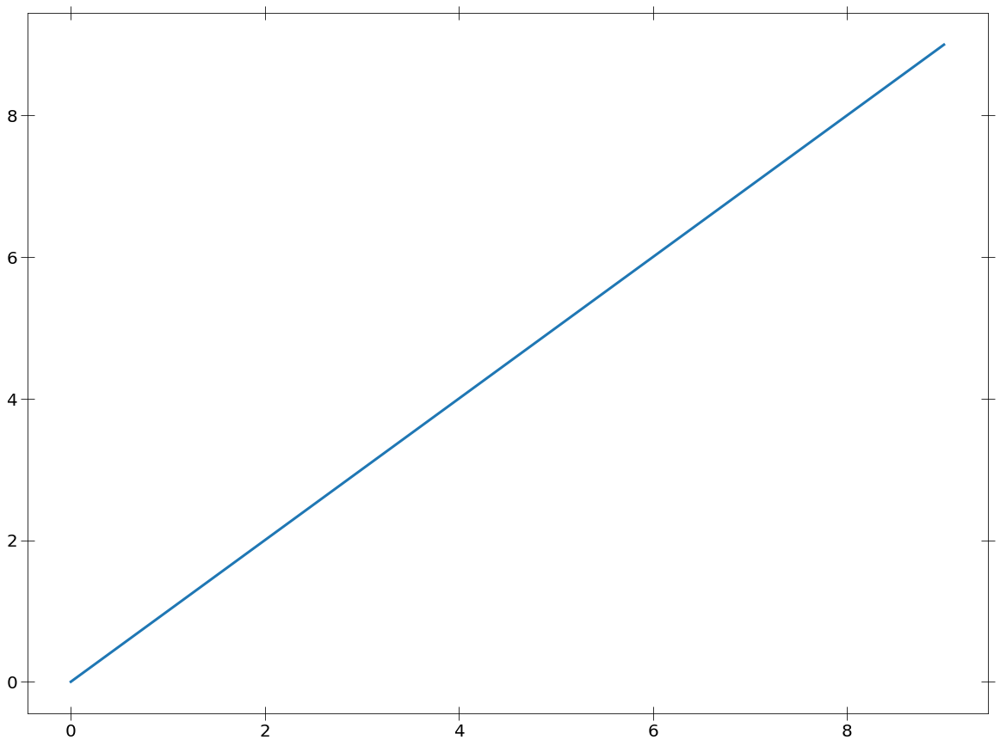

In [8]:
plt.plot(np.arange(10))

# PN files init: 853
# PN files init: 853


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:489: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:490: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:576: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:577: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:580: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:580: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:582: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ip

12.0


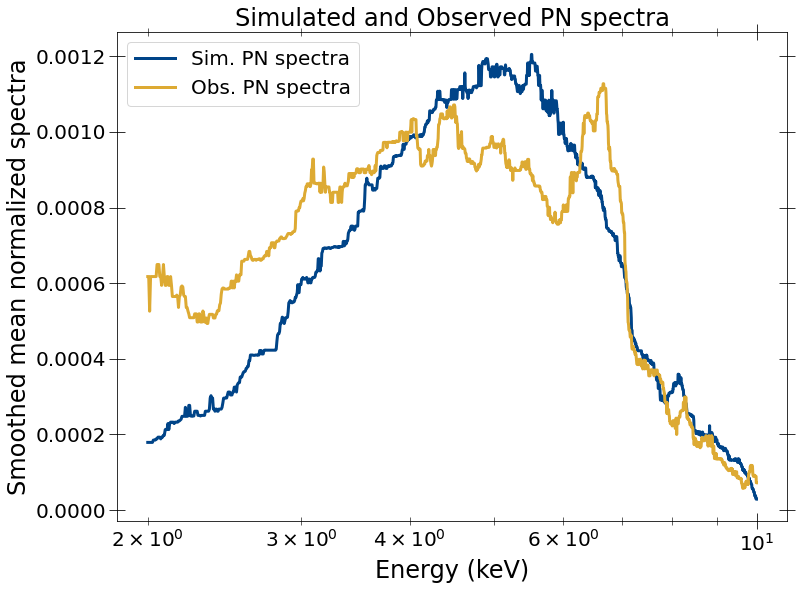

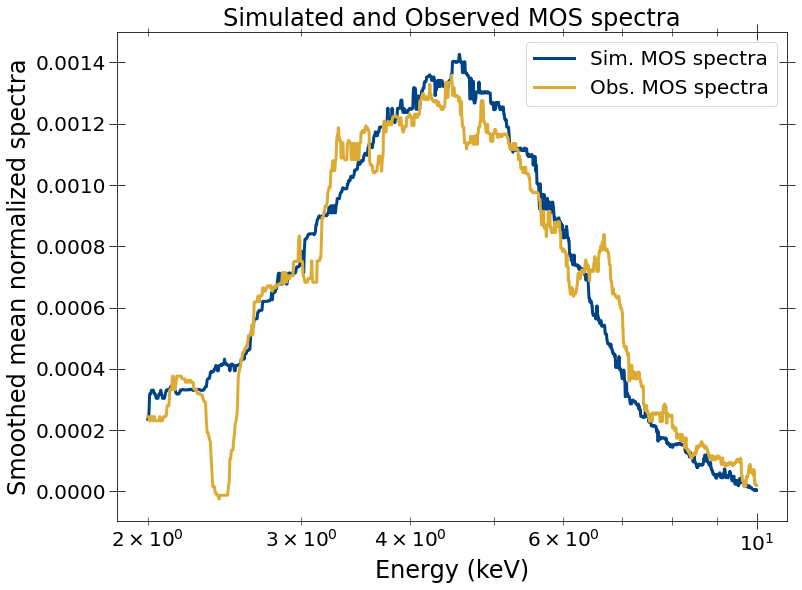

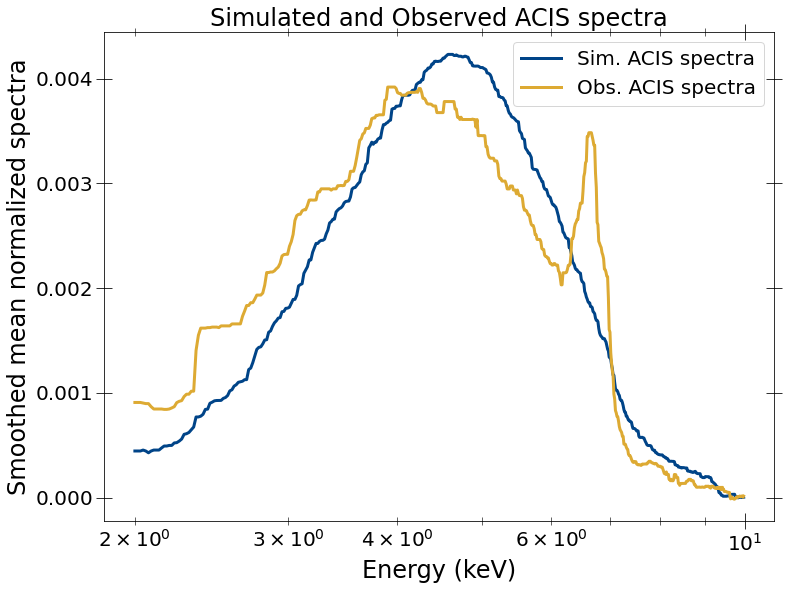

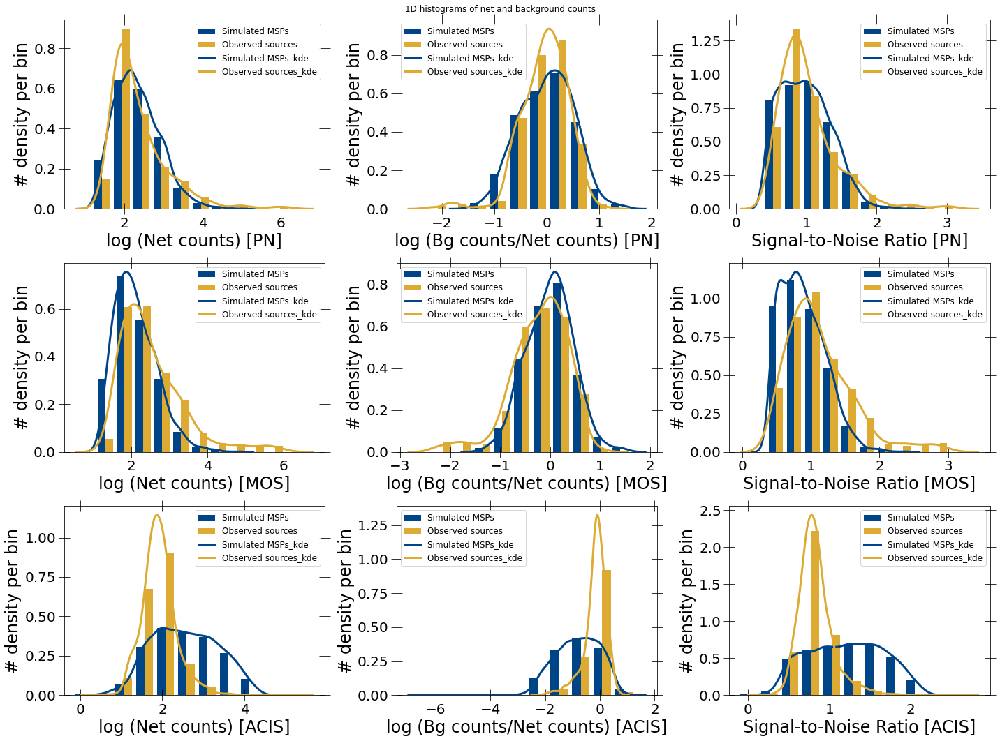

In [9]:
spec_summary = load_alldata(
     [pn_response_path, mos_response_path, chandra_response_path],
     [xmm_sim_path, xmm_sim_path, chandra_sim_path],
     [xmm_obs_path, xmm_obs_path, chandra_obs_path], en_range=[2, 10])

In [66]:
test_cond_obs = np.logical_and(counts_4_8keV_obs_acis > 0, netcounts_obs > 0)
test_cond_sim = np.logical_and(counts_4_8keV_sim_acis > 0, netcounts_sim > 0)

(array([[7.000e+00, 2.100e+01, 8.500e+01, 2.520e+02, 7.280e+02, 9.970e+02,
         4.930e+02, 7.700e+01, 6.000e+00, 2.000e+00],
        [2.000e+00, 1.400e+01, 6.500e+01, 4.800e+02, 2.178e+03, 2.085e+03,
         2.097e+03, 8.200e+02, 1.070e+02, 2.300e+01]]),
 array([0.02444643, 0.14777822, 0.27111002, 0.39444182, 0.51777361,
        0.64110541, 0.7644372 , 0.887769  , 1.01110079, 1.13443259,
        1.25776438]),
 <a list of 2 BarContainer objects>)

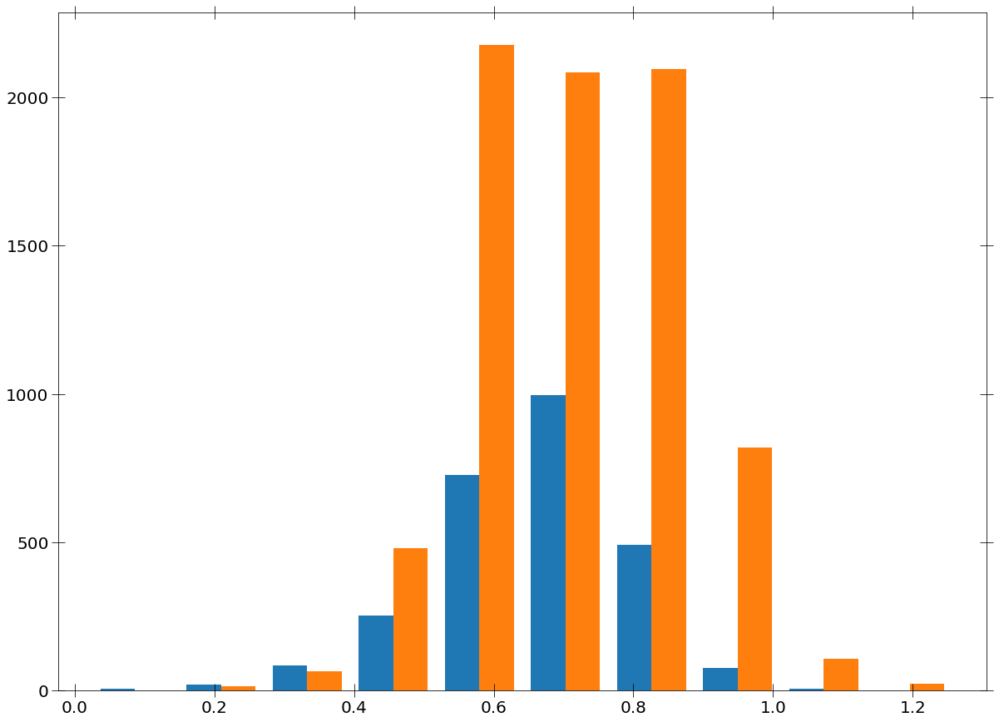

In [67]:
plt.hist([counts_4_8keV_obs_acis[test_cond_obs]/netcounts_obs[test_cond_obs],
          counts_4_8keV_sim_acis[test_cond_sim]/netcounts_sim[test_cond_sim]])

In [64]:
counts_2_4keV_sim_acis = get_line_cont_counts(spec_summary['specs'][0][2][spec_summary['spec_masks'][0][2]],
                                           spec_summary['specs'][1][2][spec_summary['spec_masks'][0][2]],
                                           spec_summary['ebins'][0][2],
                                           range_fe=[2.0, 4.0])[0][0]
counts_2_4keV_obs_acis = get_line_cont_counts(spec_summary['specs'][2][2][spec_summary['spec_masks'][1][2]],
                                           spec_summary['specs'][3][2][spec_summary['spec_masks'][1][2]],
                                           spec_summary['ebins'][0][2],
                                           range_fe=[2.0, 4.0])[0][0]

1:80: E501 line too long (108 > 79 characters)
2:44: E128 continuation line under-indented for visual indent
2:80: E501 line too long (105 > 79 characters)
3:44: E128 continuation line under-indented for visual indent
4:44: E128 continuation line under-indented for visual indent
5:80: E501 line too long (108 > 79 characters)
6:44: E128 continuation line under-indented for visual indent
6:80: E501 line too long (105 > 79 characters)
7:44: E128 continuation line under-indented for visual indent
8:44: E128 continuation line under-indented for visual indent


In [65]:
counts_4_8keV_sim_acis = get_line_cont_counts(spec_summary['specs'][0][2][spec_summary['spec_masks'][0][2]],
                                           spec_summary['specs'][1][2][spec_summary['spec_masks'][0][2]],
                                           spec_summary['ebins'][0][2],
                                           range_fe=[4.0, 8.0])[0][0]
counts_4_8keV_obs_acis = get_line_cont_counts(spec_summary['specs'][2][2][spec_summary['spec_masks'][1][2]],
                                           spec_summary['specs'][3][2][spec_summary['spec_masks'][1][2]],
                                           spec_summary['ebins'][0][2],
                                           range_fe=[4.0, 8.0])[0][0]

1:80: E501 line too long (108 > 79 characters)
2:44: E128 continuation line under-indented for visual indent
2:80: E501 line too long (105 > 79 characters)
3:44: E128 continuation line under-indented for visual indent
4:44: E128 continuation line under-indented for visual indent
5:80: E501 line too long (108 > 79 characters)
6:44: E128 continuation line under-indented for visual indent
6:80: E501 line too long (105 > 79 characters)
7:44: E128 continuation line under-indented for visual indent
8:44: E128 continuation line under-indented for visual indent


In [63]:
len(counts_4_8keV_obs_acis1)

2670

In [42]:
counts_4_8keV_sim_acis = spec_summary2['counts'][0][2][0][spec_summary['spec_masks'][0][2]]
counts_4_8keV_obs_acis = spec_summary2['counts'][0][2][1][spec_summary['spec_masks'][1][2]]

1:80: E501 line too long (91 > 79 characters)


In [41]:
netcounts_obs = spec_summary['counts'][0][2][1][spec_summary['spec_masks'][1][2]]
netcounts_sim = spec_summary['counts'][0][2][0][spec_summary['spec_masks'][0][2]]

1:80: E501 line too long (81 > 79 characters)


In [76]:
hr_obs = (counts_4_8keV_obs_acis - counts_2_4keV_obs_acis)/(
    counts_4_8keV_obs_acis + counts_2_4keV_obs_acis)
hr_sim = (counts_4_8keV_sim_acis - counts_2_4keV_sim_acis)/(
    counts_4_8keV_sim_acis + counts_2_4keV_sim_acis)

In [98]:
set_plotparams('presentation')

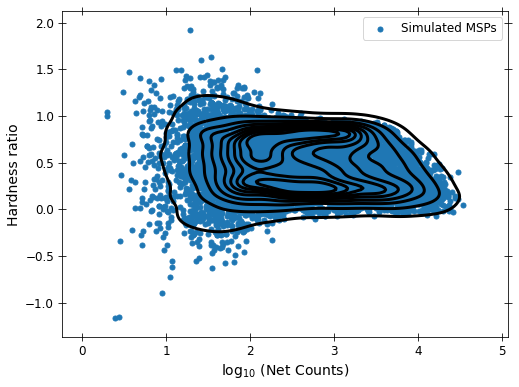

3:1: E265 block comment should start with '# '
3:80: E501 line too long (92 > 79 characters)


In [103]:
plt.scatter(np.log10(netcounts_sim), hr_sim, label='Simulated MSPs')
sns.kdeplot(x=np.log10(netcounts_sim), y=hr_sim, color='#000000')
#sns.kdeplot(x=np.log10(netcounts_obs), y=hr_obs, color='#ddaa33', label='Observed sources')
plt.xlabel(r'log$_{10}$ (Net Counts)')
plt.ylabel('Hardness ratio')
plt.legend()

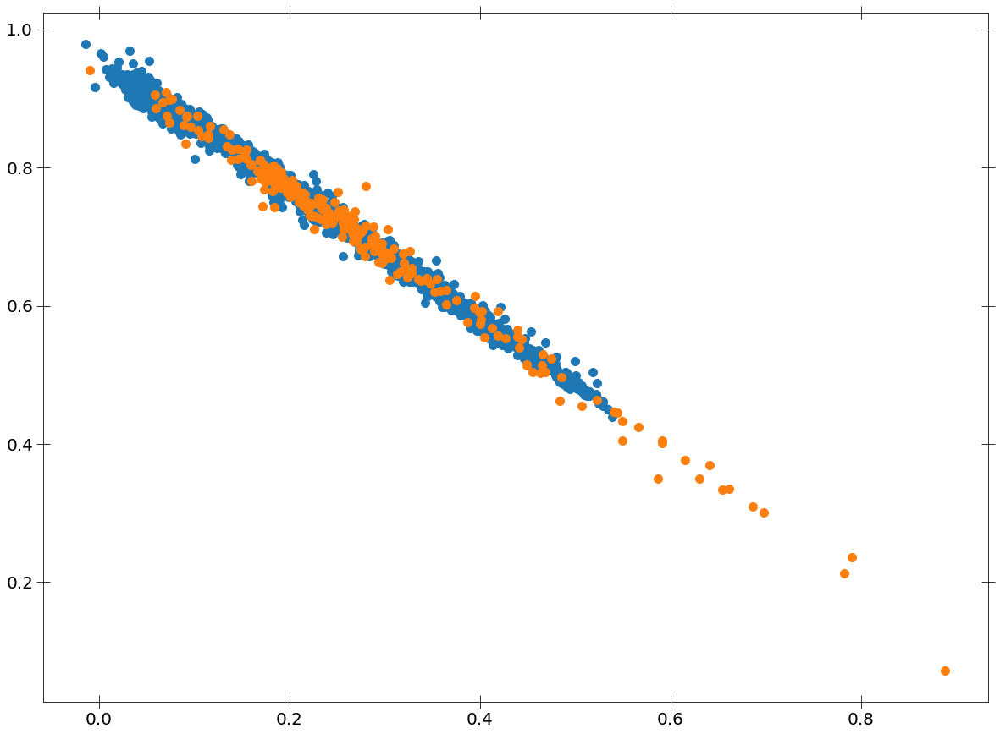

1:80: E501 line too long (89 > 79 characters)
1:84: E225 missing whitespace around operator
2:80: E501 line too long (89 > 79 characters)
2:84: E225 missing whitespace around operator
3:80: E501 line too long (89 > 79 characters)
3:84: E225 missing whitespace around operator
4:84: E225 missing whitespace around operator


In [84]:
plt.scatter(counts_2_4keV_sim_acis[netcounts_sim > 300]/netcounts_sim[netcounts_sim>300],
            counts_4_8keV_sim_acis[netcounts_sim > 300]/netcounts_sim[netcounts_sim>300])
plt.scatter(counts_2_4keV_obs_acis[netcounts_obs > 300]/netcounts_obs[netcounts_obs>300],
            counts_4_8keV_obs_acis[netcounts_obs > 300]/netcounts_obs[netcounts_obs>300])

In [161]:
spec_summary['src_nums'][0][spec_summary['spec_masks'][1][1]][105]

'201129721010057'

(array([[  0.,   0.,   0.,   0.,   0.,   0.,   0.,   3.,   1.,   1.,   1.,
           1.,   7.,   5.,   9.,  28.,  37.,  51.,  95., 233.],
        [  1.,   0.,   0.,   0.,   2.,   2.,   1.,   1.,   3.,   2.,   1.,
           1.,   5.,   7.,   4.,  11.,  10.,  11.,   9.,  22.]]),
 array([-4.25934684e-01, -4.04641850e-01, -3.83349017e-01, -3.62056183e-01,
        -3.40763350e-01, -3.19470516e-01, -2.98177682e-01, -2.76884849e-01,
        -2.55592015e-01, -2.34299182e-01, -2.13006348e-01, -1.91713515e-01,
        -1.70420681e-01, -1.49127848e-01, -1.27835014e-01, -1.06542181e-01,
        -8.52493473e-02, -6.39565138e-02, -4.26636802e-02, -2.13708467e-02,
        -7.80131905e-05]),
 <a list of 2 BarContainer objects>)

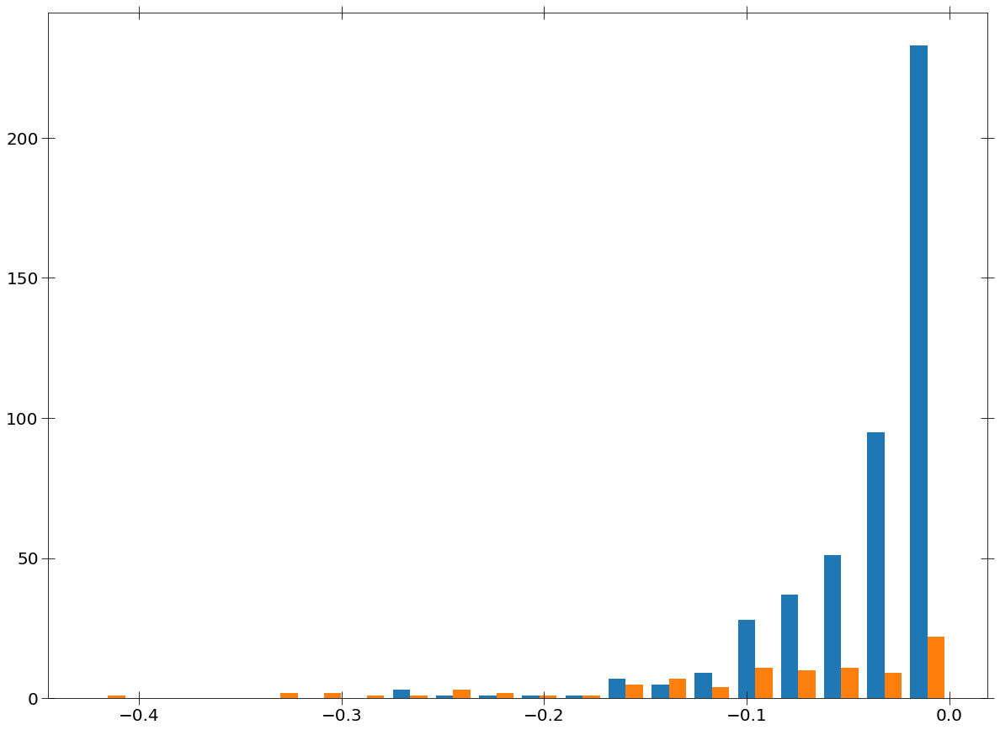

In [162]:
plt.hist([(counts_2keV_sim_mos/netcounts_sim)[counts_2keV_sim_mos < 0],
          (counts_2keV_obs_mos/netcounts_obs)[counts_2keV_obs_mos < 0]],
         bins=20)

(array([[  0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
           0.,   0.,   0.,   0.,   0.,   0.,   0.,   1., 209.],
        [  1.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
           0.,   0.,   0.,   0.,   0.,   1.,   0.,   1.,  26.]]),
 array([-7.30066848e+02, -6.93565776e+02, -6.57064705e+02, -6.20563633e+02,
        -5.84062561e+02, -5.47561490e+02, -5.11060418e+02, -4.74559347e+02,
        -4.38058275e+02, -4.01557204e+02, -3.65056132e+02, -3.28555061e+02,
        -2.92053989e+02, -2.55552917e+02, -2.19051846e+02, -1.82550774e+02,
        -1.46049703e+02, -1.09548631e+02, -7.30475597e+01, -3.65464882e+01,
        -4.54166506e-02]),
 <a list of 2 BarContainer objects>)

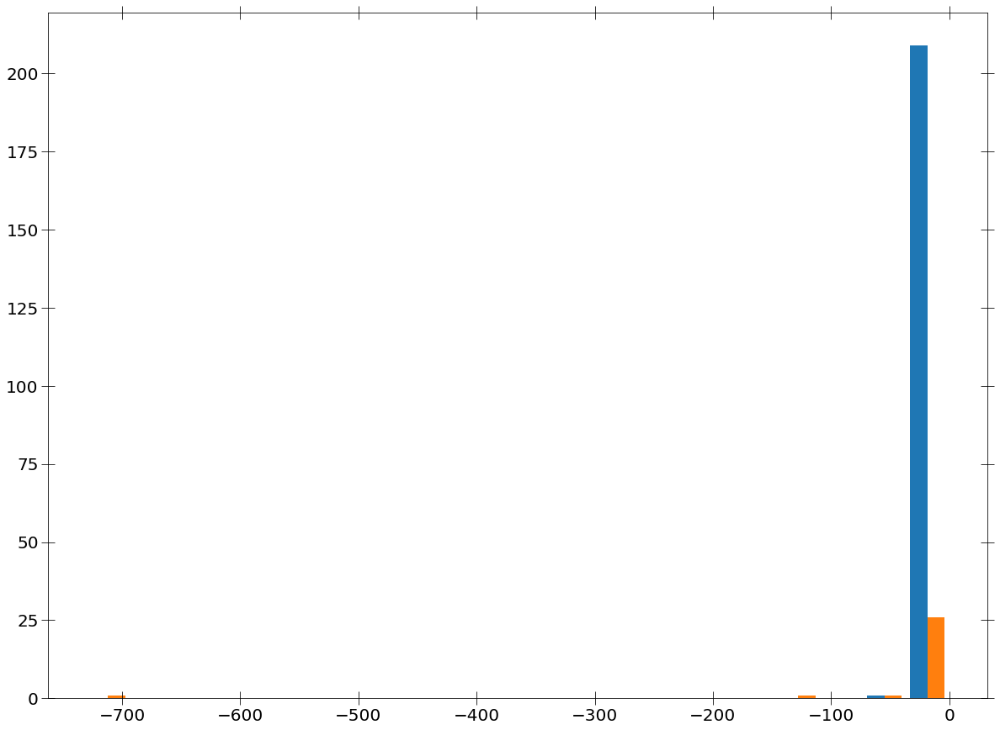

In [150]:
plt.hist([counts_3keV_sim_mos[counts_3keV_sim_mos < 0],
          counts_3keV_obs_mos[counts_3keV_obs_mos < 0]], bins=20)

In [165]:
np.sort(counts_2keV_obs_mos/netcounts_obs)[:10]

array([-0.42593468, -0.33020238, -0.32178032, -0.31756022, -0.317243  ,
       -0.2976317 , -0.26637052, -0.24287688, -0.24267083, -0.24171108])

In [163]:
spec_summary['src_nums'][0][spec_summary['spec_masks'][1][1]][np.argsort(counts_2keV_obs_mos/netcounts_obs)[:10]]

array(['206735502015094', '204024304010028', '206946410010097',
       '207848601010048', '206586001010103', '206735502010090',
       '206735502010070', '206746006015083', '206946410010058',
       '206586001010156'], dtype=object)

# PN files init: 853
# PN files init: 853


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:488: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:489: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:575: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:576: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:579: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:579: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:581: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ip

12.0


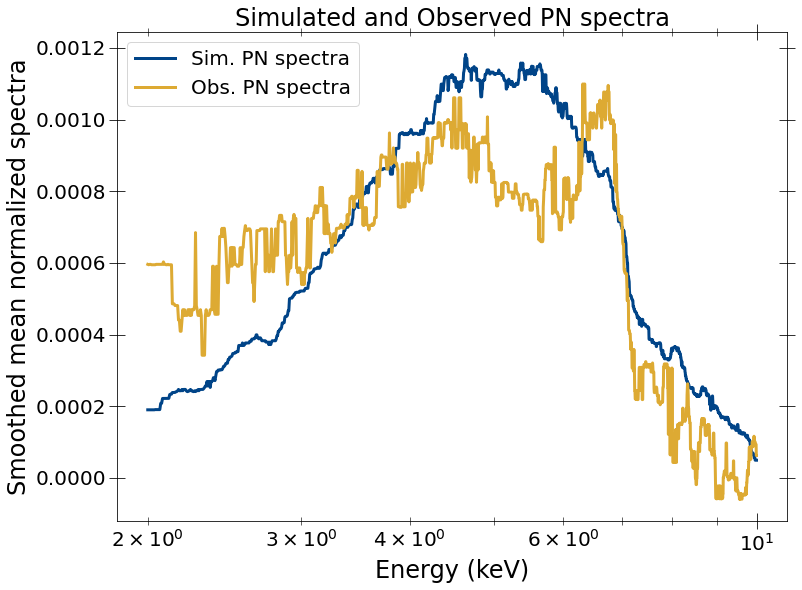

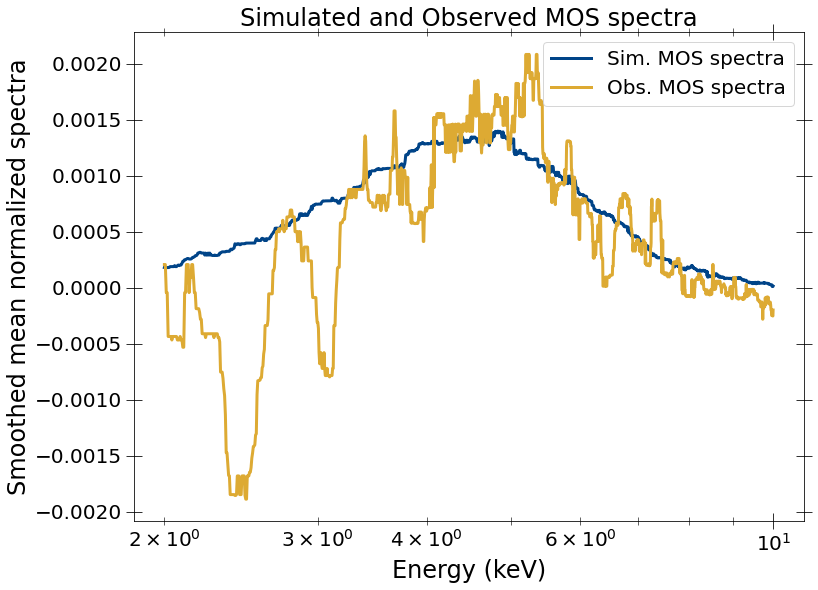

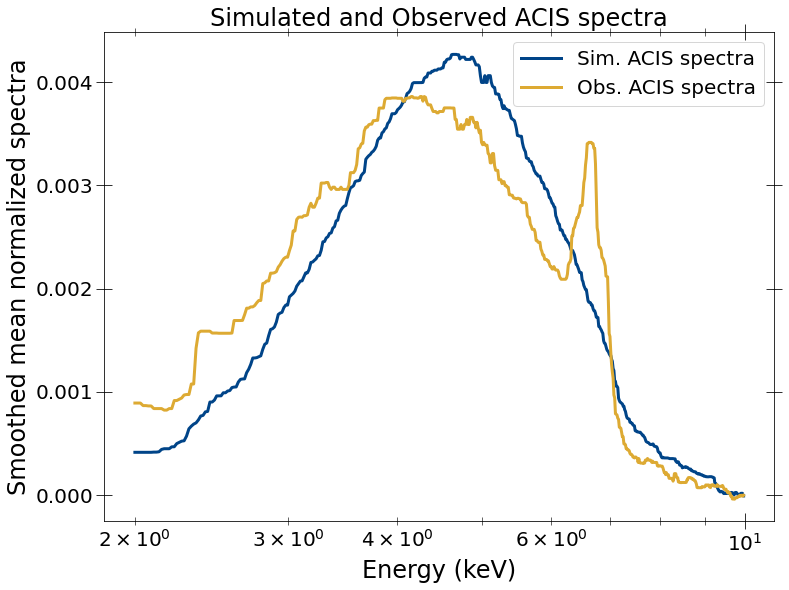

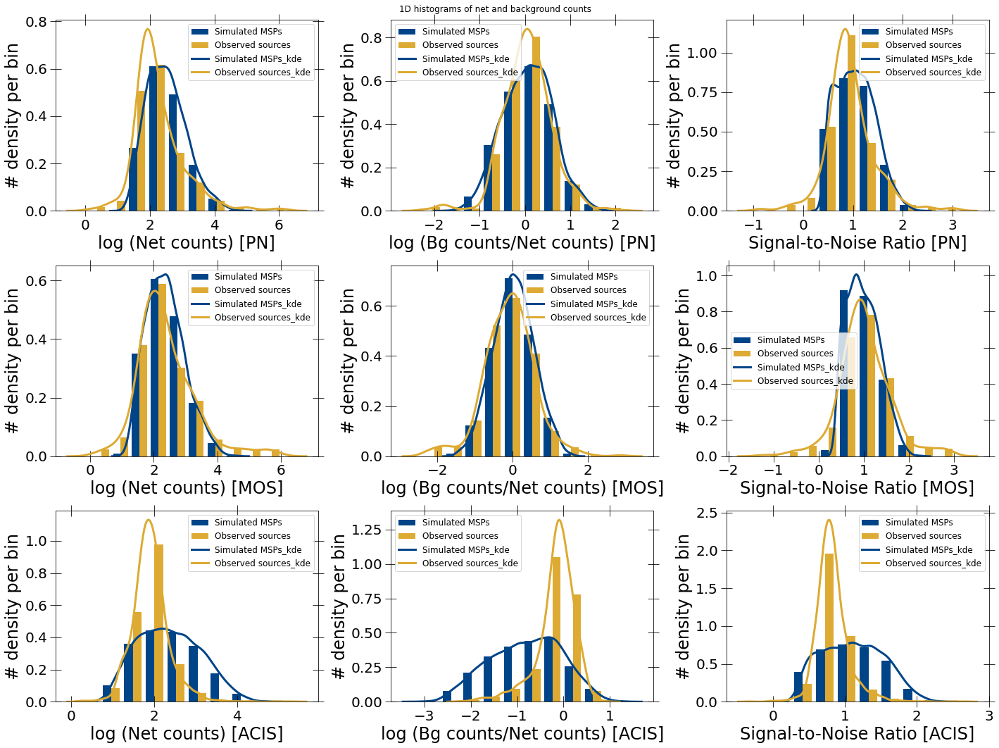

In [153]:
spec_summary_allobs = load_alldata(
     [pn_response_path, mos_response_path, chandra_response_path],
     [xmm_sim_path, xmm_sim_path, chandra_sim_path],
     [xmm_obs_path, xmm_obs_path, chandra_obs_path], en_range=[2, 10])

2772 2772 2772 2772
741 741 741 741
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:671: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:671: RuntimeWarning: invalid value encountered in true_divide


1937 1937 1937 1937
445 445 445 445
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
7873 7873 7873 7873
2670 2670 2670 2670


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:671: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:671: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:671: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:671: RuntimeWarning: invalid value encountered in true_divide


Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
16.0
16.0
16.0


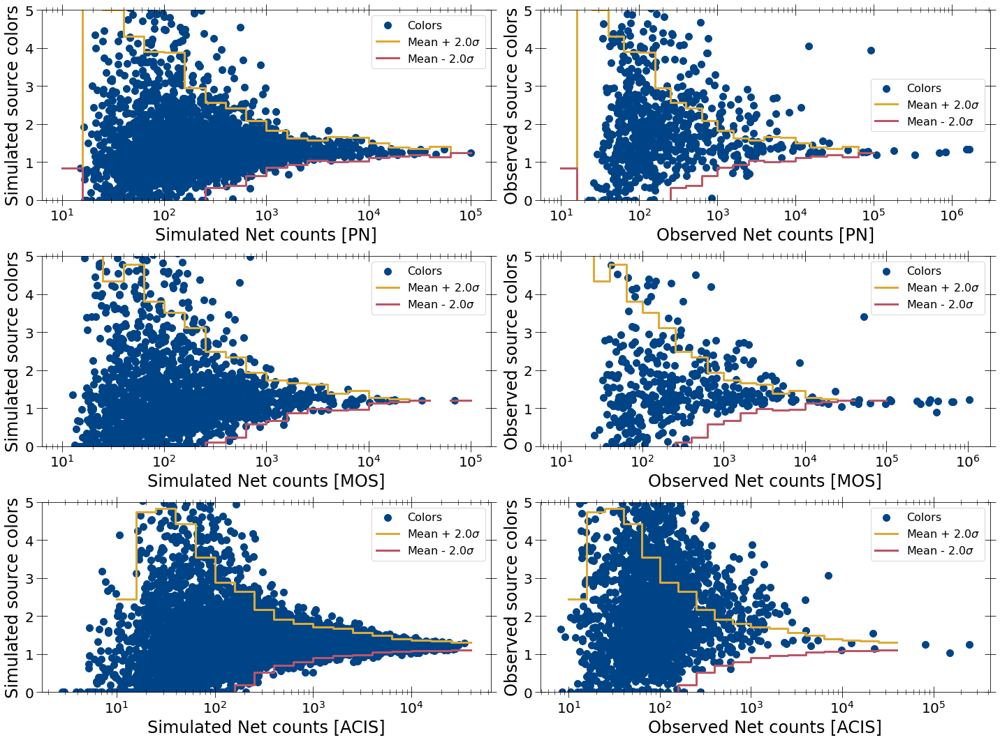

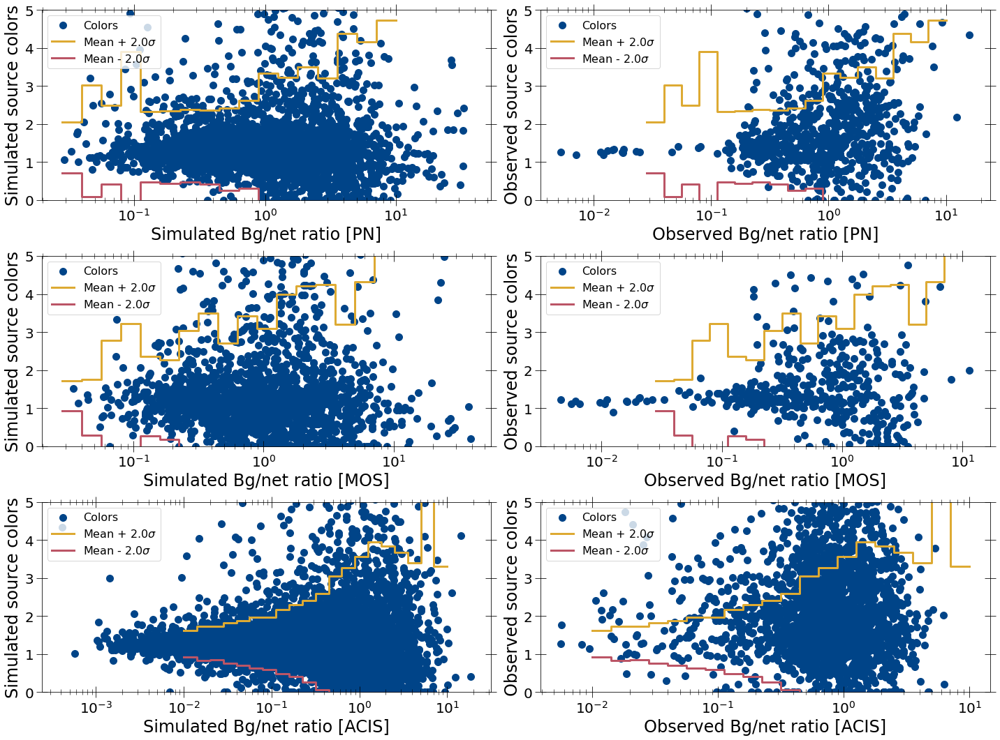

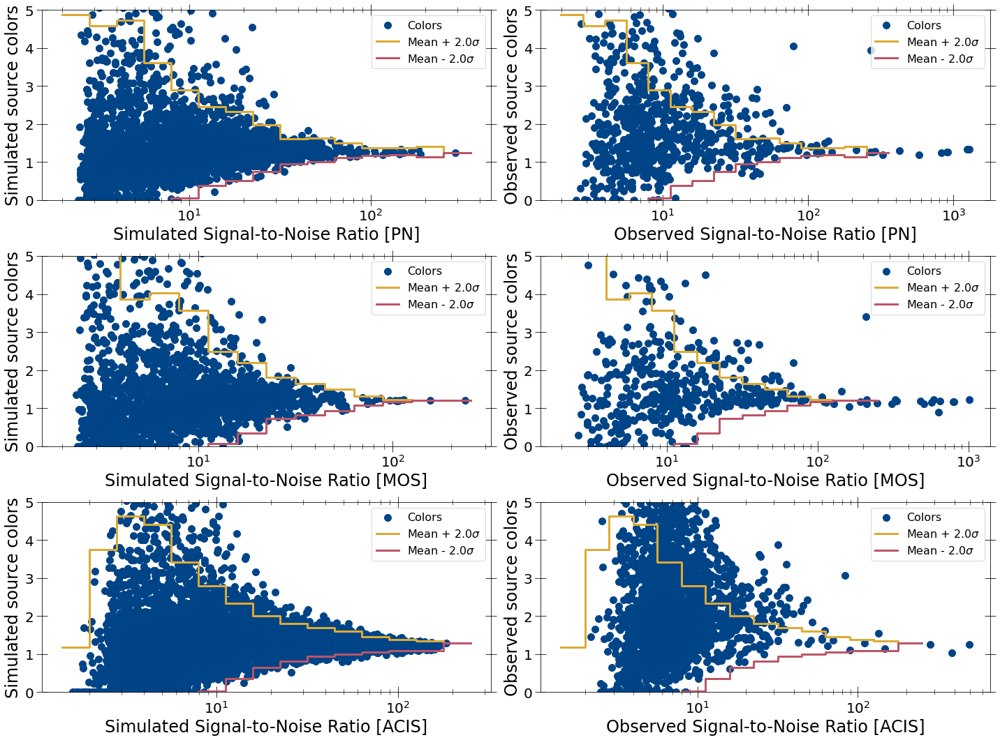

In [10]:
sim_color_dict_arr_clipped, obs_color_dict_arr_clipped = getcolor_prop_alldet(spec_summary, compare_det=True)

2772 2772 2772 2772
741 741 741 741
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:671: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:671: RuntimeWarning: invalid value encountered in true_divide


1937 1937 1937 1937
445 445 445 445
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
7873 7873 7873 7873
2670 2670 2670 2670


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:671: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:671: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:671: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:671: RuntimeWarning: invalid value encountered in true_divide


Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
16.0
16.0
16.0


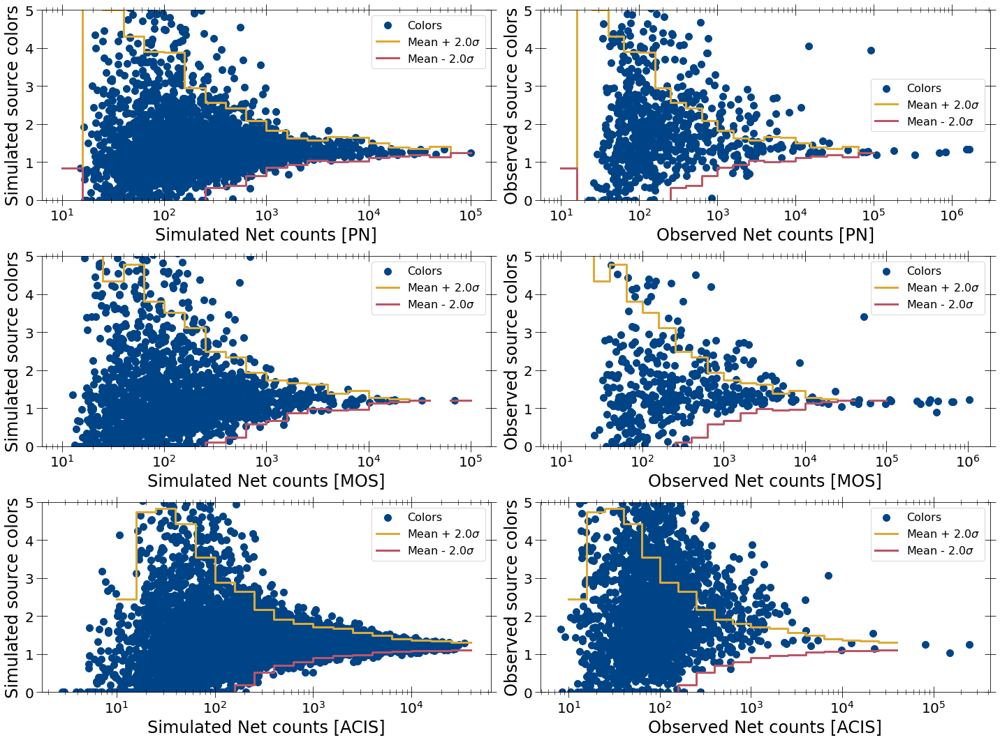

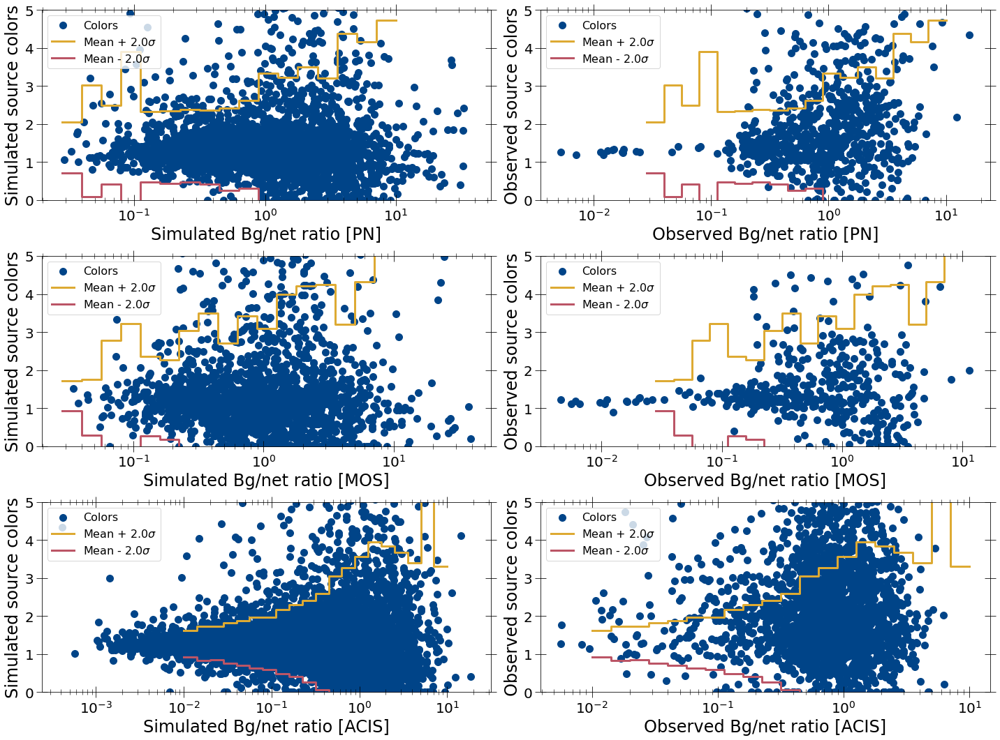

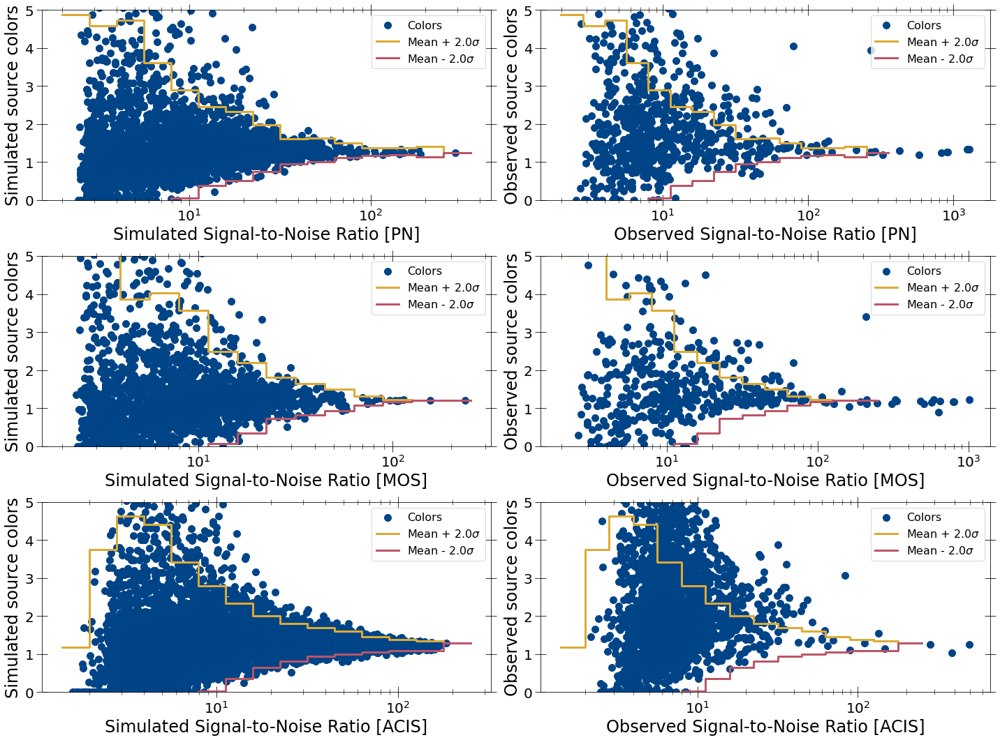

In [11]:
sim_color_dict_arr, obs_color_dict_arr = getcolor_prop_alldet(spec_summary, compare_det=True)

# PN files init: 853
# PN files init: 853


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:489: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:490: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:576: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:577: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:580: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:580: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:582: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ip

12.0


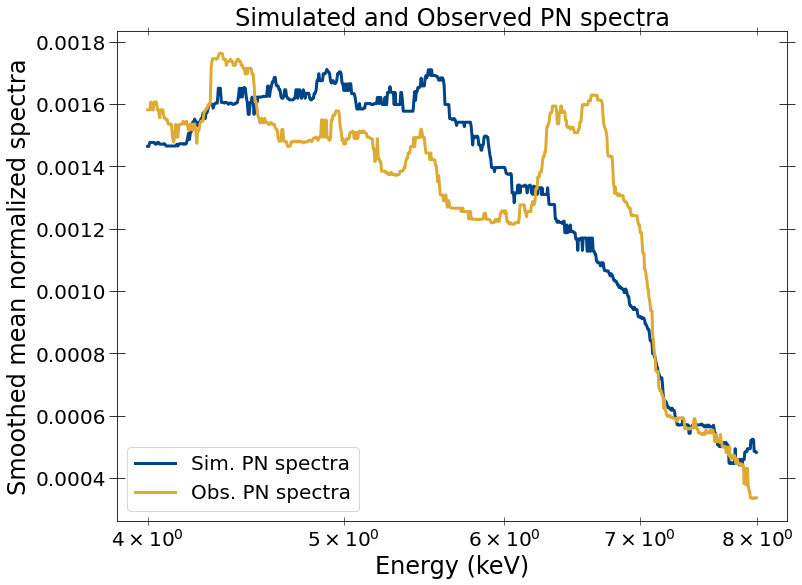

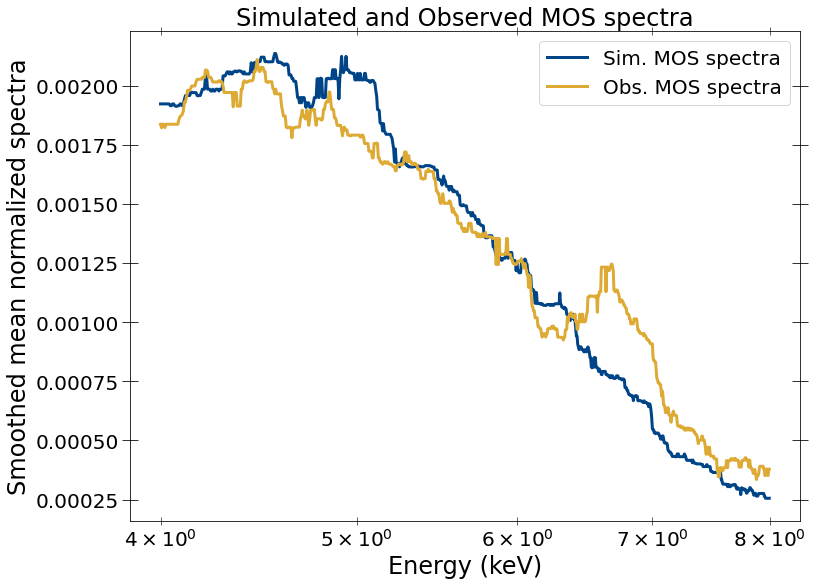

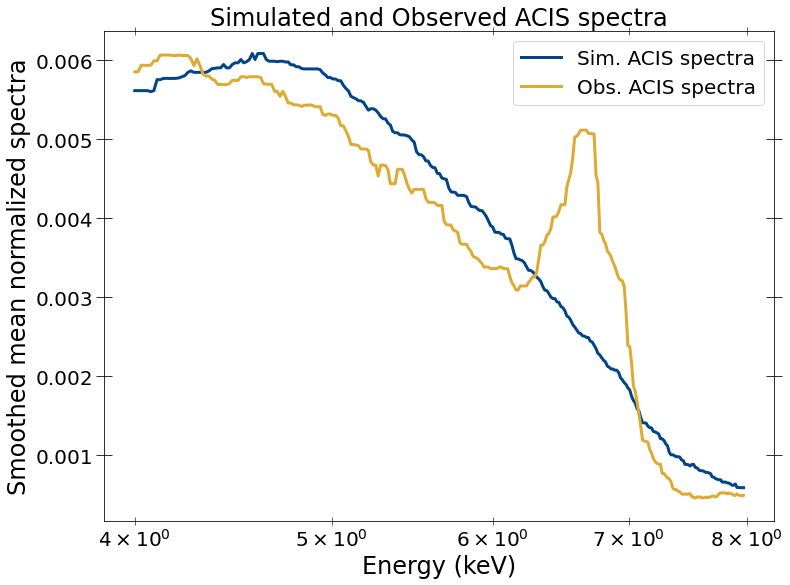

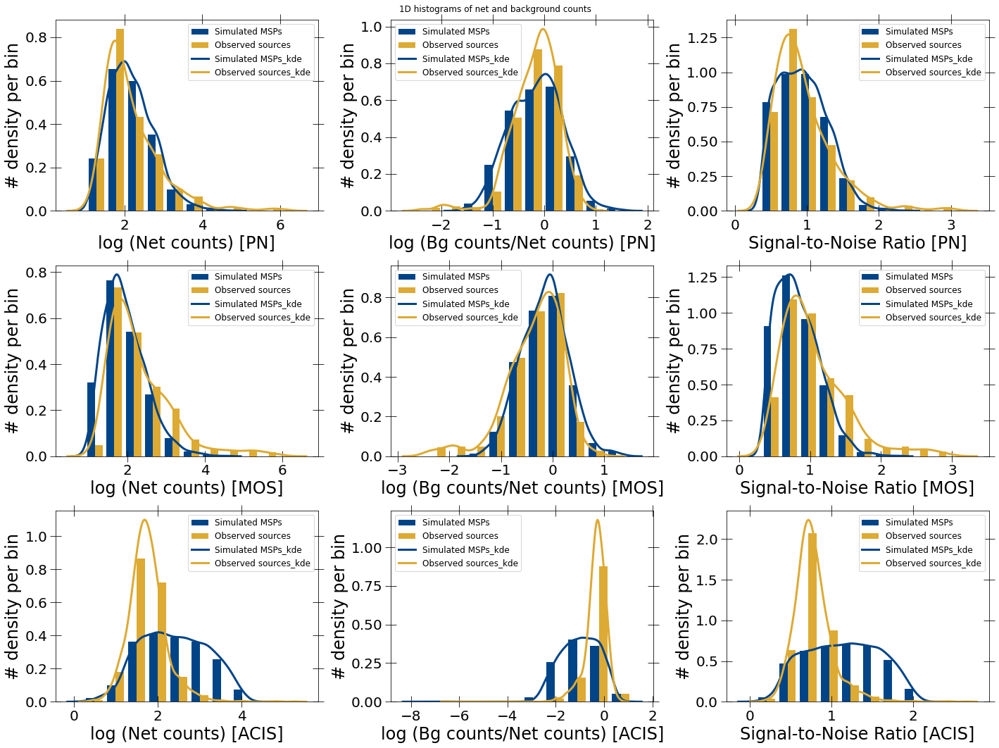

In [40]:
spec_summary2 = load_alldata(
     [pn_response_path, mos_response_path, chandra_response_path],
     [xmm_sim_path, xmm_sim_path, chandra_sim_path],
     [xmm_obs_path, xmm_obs_path, chandra_obs_path], en_range=[4.0, 8.0])

2355 2355 2355 2355
625 625 625 625
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:670: RuntimeWarning: divide by zero encountered in true_divide


1406 1406 1406 1406
385 385 385 385
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
7063 7063 7063 7063
2235 2235 2235 2235


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:670: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:670: RuntimeWarning: divide by zero encountered in true_divide


Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
16.0
16.0
16.0


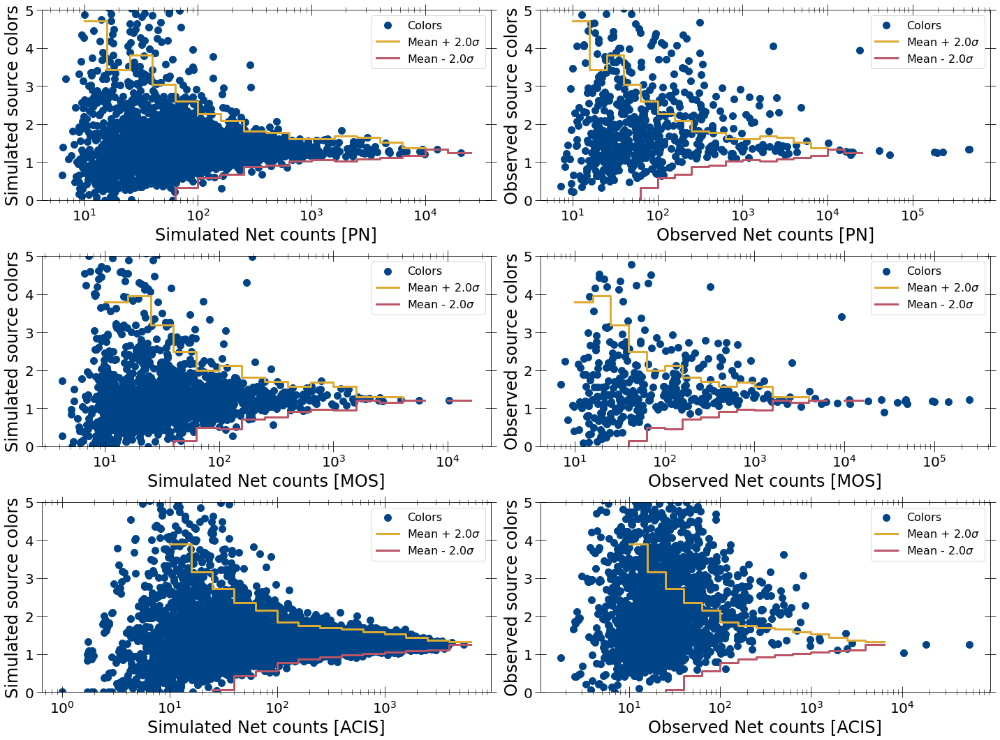

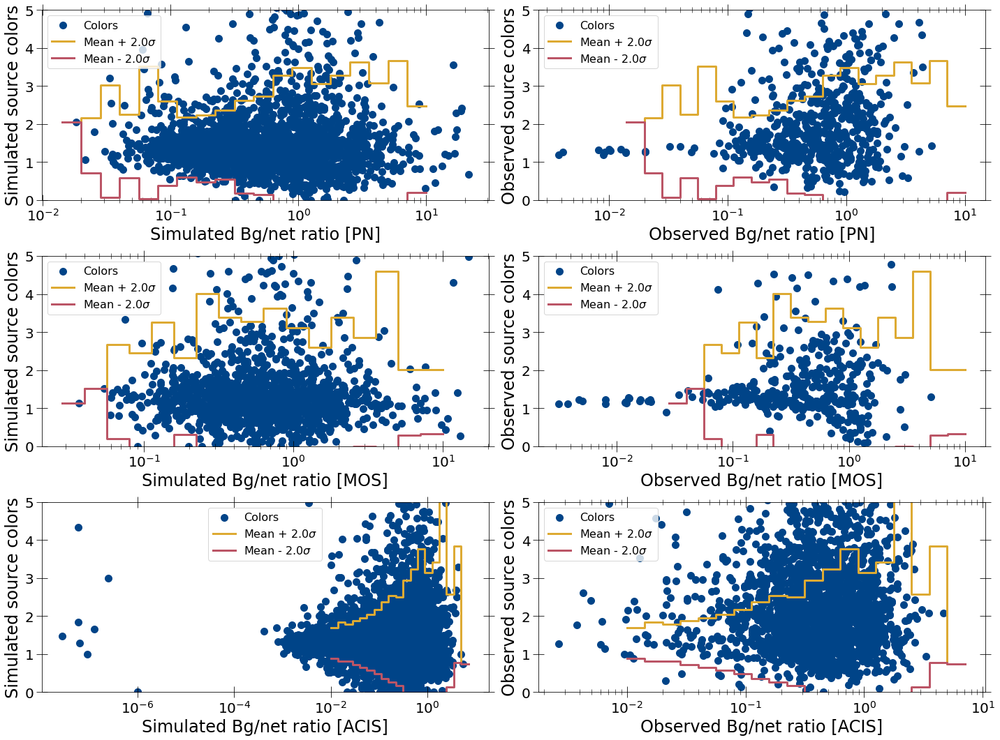

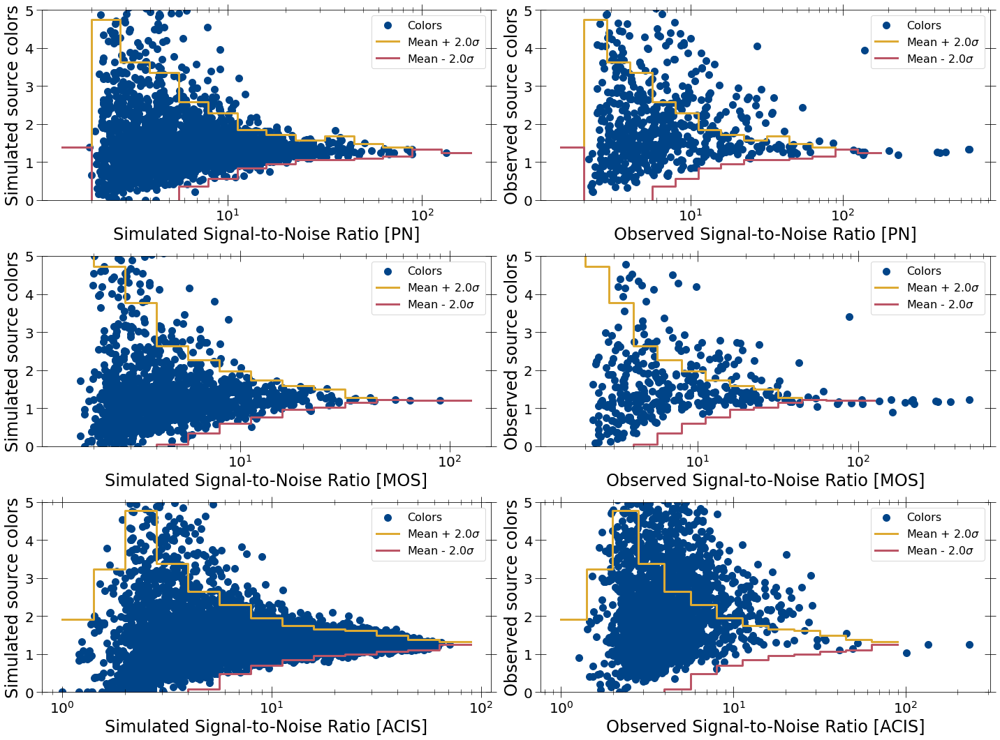

In [227]:
sim_color_dict_arr2, obs_color_dict_arr2 = getcolor_prop_alldet(spec_summary2, compare_det=True)

In [203]:
def get_candidate_src_nums_det(obs_src_nums, obs_det_mask, sim_color_dict,
                               obs_color_dict, min_counts, min_counts2=None):
    """Get src nums of quiescent sources for given detector"""
    print(min_counts2)
    obs_netcounts = obs_color_dict['prop_list'][0]
    netcount_bins = sim_color_dict['prop_bins'][0]
    obs_colors = obs_color_dict['colors']
    color_median = sim_color_dict['color_stat'][0][0]
    color_std = sim_color_dict['color_stat'][2][0]
    if min_counts2 is None:
        min_counts2 = min_counts
    print(netcount_bins)
    print(color_median)
    print(color_std)
    interested_args = None
    for i, lower_bin in enumerate(netcount_bins):
        if lower_bin < min_counts:
            continue
        if i == len(netcount_bins) - 1:
            upper_bin = np.max(obs_netcounts) + 10
            median_color = color_median[-1]
            std_color = color_std[-1]
        else:
            upper_bin = netcount_bins[i+1]
            median_color = color_median[i]
            std_color = color_std[i]
        lower_bin = max(lower_bin, min_counts2)
        print(min_counts2)
        print(lower_bin, median_color + 2*std_color)
        if np.isnan(median_color) or np.isnan(std_color):
                    int_args = np.where(np.logical_and(
                        obs_netcounts >= lower_bin,
                        obs_netcounts < upper_bin))
        else:
        
            int_args = np.where(np.logical_and(
                np.logical_and(obs_netcounts >= lower_bin,
                               obs_netcounts < upper_bin),
                obs_colors < median_color + 2*std_color))[0]
        '''
        int_args = np.where(np.logical_and(
                np.logical_and(obs_netcounts >= lower_bin,
                               obs_netcounts < upper_bin),
                obs_colors < median_color + 2*std_color))[0]
        '''
        print(len(int_args))
        if interested_args is None:
            interested_args = int_args.copy()
        else:
            interested_args = np.append(interested_args.copy(), int_args)
    return interested_args, obs_src_nums[obs_det_mask][interested_args]


def get_candidate_src_nums_alldet(spec_summary, sim_color_dict_arr,
                                  obs_color_dict_arr, min_count_arr=None,
                                  min_counts2=None):
    """Get source nums for all detectors."""
    interested_args_alldet = []
    interested_sources_alldet = []
    if min_count_arr is None:
        min_count_arr = [700, 700, 250]
    for i, obs_color_dict in enumerate(obs_color_dict_arr):
        if i > 0:
            interested_args, interested_srcs = get_candidate_src_nums_det(
                spec_summary['src_nums'][i-1], spec_summary['spec_masks'][1][i],
                sim_color_dict_arr[i], obs_color_dict, min_count_arr[i],
                min_counts2)
        else:
            interested_args, interested_srcs = get_candidate_src_nums_det(
                spec_summary['src_nums'][i], spec_summary['spec_masks'][1][i],
                sim_color_dict_arr[i], obs_color_dict, min_count_arr[i],
                min_counts2)
        interested_args_alldet.append(interested_args)
        interested_sources_alldet.append(interested_srcs)
    return interested_args_alldet, interested_sources_alldet


31:21: E117 over-indented
35:1: W293 blank line contains whitespace
65:80: E501 line too long (80 > 79 characters)


In [209]:
interested_args_alldet_1s, interested_srcs_alldet_1s = get_candidate_src_nums_alldet(spec_summary, sim_color_dict_arr,
                              obs_color_dict_arr, min_count_arr=[150, 150, 250], min_counts2=500)

500
[1.00000000e+01 1.58489319e+01 2.51188643e+01 3.98107171e+01
 6.30957344e+01 1.00000000e+02 1.58489319e+02 2.51188643e+02
 3.98107171e+02 6.30957344e+02 1.00000000e+03 1.58489319e+03
 2.51188643e+03 3.98107171e+03 6.30957344e+03 1.00000000e+04
 1.58489319e+04 2.51188643e+04 3.98107171e+04 6.30957344e+04
 1.00000000e+05]
[0.8405164  2.07153913 1.67298979 1.57385831 1.58436607 1.66406679
 1.43030382 1.44713313 1.39609846 1.36984926 1.35086023 1.27893642
 1.31590127 1.33564778 1.334838   1.30071855 1.27144028 1.27383281
 1.26917868 1.24506393]
[0.         2.55426532 1.66817468 1.37071133 1.16334185 1.11434474
 0.75549623 0.56022382 0.51077116 0.36126324 0.24291962 0.17375792
 0.13254254 0.16428213 0.15864827 0.09633923 0.05725364 0.0421451
 0.0654287  0.        ]
500
500 2.9412962840318846
0
500
500 2.567580775527234
0
500
500 2.4176407708782373
12
500
630.957344480193 2.0923757354927424
22
500
1000.0 1.8366994711223559
15
500
1584.893192461114 1.6264522674211288
18
500
2511.886431509

1:80: E501 line too long (118 > 79 characters)
2:31: E128 continuation line under-indented for visual indent


In [211]:
len(interested_srcs_alldet_1s[0])

106

In [229]:
interested_args_alldet2, interested_srcs_alldet2 = get_candidate_src_nums_alldet(spec_summary2, sim_color_dict_arr2,
                              obs_color_dict_arr2, min_count_arr=[39, 39, 39])

1:80: E501 line too long (116 > 79 characters)
2:31: E128 continuation line under-indented for visual indent


[1.00000000e+01 1.58489319e+01 2.51188643e+01 3.98107171e+01
 6.30957344e+01 1.00000000e+02 1.58489319e+02 2.51188643e+02
 3.98107171e+02 6.30957344e+02 1.00000000e+03 1.58489319e+03
 2.51188643e+03 3.98107171e+03 6.30957344e+03 1.00000000e+04
 1.58489319e+04 2.51188643e+04 3.98107171e+04 6.30957344e+04
 1.00000000e+05]
[1.83545986 1.50859322 1.66084    1.48175529 1.46547481 1.42173222
 1.37907158 1.34241947 1.34164331 1.31932186 1.34112453 1.3576441
 1.36300675 1.31582893 1.27252105 1.33460737 1.24506393        nan
        nan        nan]
[1.44048382 0.95488145 1.07957089 0.78189889 0.56793735 0.42176062
 0.35496784 0.23084005 0.21274793 0.14517379 0.13894162 0.16628634
 0.13988764 0.09864256 0.04666147 0.         0.                nan
        nan        nan]
39.810717055349734 3.0455530706070366
71
63.09573444801933 2.601349507465748
60
100.0 2.2652534668157647
28
158.48931924611142 2.08900725130583
23
251.18864315095823 1.8040995660264987
13
398.1071705534973 1.7671391723807393
11
6

In [12]:
interested_args_alldet, interested_srcs_alldet = get_candidate_src_nums_alldet(spec_summary, sim_color_dict_arr,
                              obs_color_dict_arr, min_count_arr=[150, 150, 150])

[1.00000000e+01 1.58489319e+01 2.51188643e+01 3.98107171e+01
 6.30957344e+01 1.00000000e+02 1.58489319e+02 2.51188643e+02
 3.98107171e+02 6.30957344e+02 1.00000000e+03 1.58489319e+03
 2.51188643e+03 3.98107171e+03 6.30957344e+03 1.00000000e+04
 1.58489319e+04 2.51188643e+04 3.98107171e+04 6.30957344e+04
 1.00000000e+05]
[0.8405164  2.07153913 1.67298979 1.57385831 1.58436607 1.66406679
 1.43030382 1.44713313 1.39609846 1.36984926 1.35086023 1.27893642
 1.31590127 1.33564778 1.334838   1.30071855 1.27144028 1.27383281
 1.26917868 1.24506393]
[0.         2.55426532 1.66817468 1.37071133 1.16334185 1.11434474
 0.75549623 0.56022382 0.51077116 0.36126324 0.24291962 0.17375792
 0.13254254 0.16428213 0.15864827 0.09633923 0.05725364 0.0421451
 0.0654287  0.        ]
158.48931924611142 2.9412962840318846
67
251.18864315095823 2.567580775527234
45
398.1071705534973 2.4176407708782373
30
630.957344480193 2.0923757354927424
22
1000.0 1.8366994711223559
15
1584.893192461114 1.6264522674211288
18


1:80: E501 line too long (112 > 79 characters)
2:31: E128 continuation line under-indented for visual indent


In [178]:
len(np.sort(interested_srcs_alldet[2]))

263

In [171]:
len(np.sort(interested_srcs_alldet[2]))

228

In [257]:

def getcolor_prop_alldet2(spec_summary, compare_det=False, candidate_srcs=None):
    """Get colors in all detectors and plot relevant figure."""
    ebins_arr = spec_summary['ebins'][0]
    specs = spec_summary['specs']
    spec_masks = spec_summary['spec_masks']
    counts = spec_summary['counts']
    det_names = ['PN', 'MOS', 'ACIS']
    if candidate_srcs is None:
        candidate_srcs = [[], [], []]
    candidate_src_args = [
        np.where(np.isin(
            spec_summary['src_nums'][0][spec_masks[1][0]],
            candidate_srcs[0]))[0],
        np.where(np.isin(
            spec_summary['src_nums'][0][spec_masks[1][1]],
            candidate_srcs[1]))[0],
        np.where(np.isin(
            spec_summary['src_nums'][1][spec_masks[1][2]],
            candidate_srcs[2]))[0]
    ]
    sim_colors_dict_arr = []
    obs_colors_dict_arr = []
    prop_names = ['Net counts', 'Bg/net ratio', 'Signal-to-Noise Ratio']
    plot_det = not compare_det
    for i, ebins in enumerate(ebins_arr):
        sim_colors_dict, obs_colors_dict = getcolor_prop_singledet(
            ebins, specs[0][i][spec_masks[0][i]],
            specs[1][i][spec_masks[0][i]], counts[0][i][0][spec_masks[0][i]],
            counts[1][i][0][spec_masks[0][i]], specs[2][i][spec_masks[1][i]],
            specs[3][i][spec_masks[1][i]], counts[0][i][1][spec_masks[1][i]],
            counts[1][i][1][spec_masks[1][i]], det_name=det_names[i],
            plot=plot_det)
        sim_colors_dict_arr.append(sim_colors_dict)
        obs_colors_dict_arr.append(obs_colors_dict)
    if compare_det:
        for i in range(3):
            plot_subplots(
                3, 2,
                [[[
                    sim_colors_dict_arr[0]['prop_list'][i],
                    get_bincenters(sim_colors_dict_arr[0]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[0]['prop_bins'][i])], [
                    obs_colors_dict_arr[0]['prop_list'][i],
                    obs_colors_dict_arr[0]['prop_list'][i][
                        candidate_src_args[0]],
                    get_bincenters(sim_colors_dict_arr[0]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[0]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[0]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[0]['prop_bins'][i])]],
                 [[
                    sim_colors_dict_arr[1]['prop_list'][i],
                    get_bincenters(sim_colors_dict_arr[1]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[1]['prop_bins'][i])], [
                    obs_colors_dict_arr[1]['prop_list'][i],
                    obs_colors_dict_arr[1]['prop_list'][i][
                        candidate_src_args[1]],
                    get_bincenters(sim_colors_dict_arr[1]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[1]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[1]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[1]['prop_bins'][i])]],
                 [[
                    sim_colors_dict_arr[2]['prop_list'][i],
                    get_bincenters(sim_colors_dict_arr[2]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[2]['prop_bins'][i])], [
                    obs_colors_dict_arr[2]['prop_list'][i],
                    obs_colors_dict_arr[2]['prop_list'][i][
                        candidate_src_args[2]],
                    get_bincenters(sim_colors_dict_arr[2]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[2]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[2]['prop_bins'][i]),
                    get_bincenters(sim_colors_dict_arr[2]['prop_bins'][i])]]],
                [[[
                    sim_colors_dict_arr[0]['colors'],
                    (sim_colors_dict_arr[0]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[0]['color_stat'][2][i]),
                    (sim_colors_dict_arr[0]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[0]['color_stat'][2][i])], [
                    obs_colors_dict_arr[0]['colors'],
                    obs_colors_dict_arr[0]['colors'][candidate_src_args[0]],
                    (sim_colors_dict_arr[0]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[0]['color_stat'][2][i]),
                    (sim_colors_dict_arr[0]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[0]['color_stat'][2][i]),
                    (sim_colors_dict_arr[0]['color_stat'][0][i] +
                     1*sim_colors_dict_arr[0]['color_stat'][2][i]),
                    (sim_colors_dict_arr[0]['color_stat'][0][i] -
                     1*sim_colors_dict_arr[0]['color_stat'][2][i])]],
                 [[
                    sim_colors_dict_arr[1]['colors'],
                    (sim_colors_dict_arr[1]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[1]['color_stat'][2][i]),
                    (sim_colors_dict_arr[1]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[1]['color_stat'][2][i])], [
                    obs_colors_dict_arr[1]['colors'],
                    obs_colors_dict_arr[1]['colors'][candidate_src_args[1]],
                    (sim_colors_dict_arr[1]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[1]['color_stat'][2][i]),
                    (sim_colors_dict_arr[1]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[1]['color_stat'][2][i]),
                    (sim_colors_dict_arr[1]['color_stat'][0][i] +
                     1*sim_colors_dict_arr[1]['color_stat'][2][i]),
                    (sim_colors_dict_arr[1]['color_stat'][0][i] -
                     1*sim_colors_dict_arr[1]['color_stat'][2][i])]],
                 [[
                    sim_colors_dict_arr[2]['colors'],
                    (sim_colors_dict_arr[2]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[2]['color_stat'][2][i]),
                    (sim_colors_dict_arr[2]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[2]['color_stat'][2][i])], [
                    obs_colors_dict_arr[2]['colors'],
                    obs_colors_dict_arr[2]['colors'][candidate_src_args[2]],
                    (sim_colors_dict_arr[2]['color_stat'][0][i] +
                     2*sim_colors_dict_arr[2]['color_stat'][2][i]),
                    (sim_colors_dict_arr[2]['color_stat'][0][i] -
                     2*sim_colors_dict_arr[2]['color_stat'][2][i]),
                    (sim_colors_dict_arr[2]['color_stat'][0][i] +
                     1*sim_colors_dict_arr[2]['color_stat'][2][i]),
                    (sim_colors_dict_arr[2]['color_stat'][0][i] -
                     1*sim_colors_dict_arr[2]['color_stat'][2][i])]]],
                subp_types_arr=[['linescatter']*2]*3,
                pl_types_arr=[[['scatter', 'step', 'step'],
                              ['scatter', 'scatter', 'step', 'step', 'step',
                               'step']]]*3,
                xlabel_arr=join_string_lists(
                    ['Simulated ' + prop_names[i],
                     'Observed ' + prop_names[i]], det_names),
                ylabel_arr=[['Simulated source colors',
                             'Observed source colors']]*3,
                pl_labels_arr=[[['Sources', r'Mean $\pm$ 2.0$\sigma$', None],
                               ['Sources', 'Candidate sources',
                                r'Mean $\pm$ 2.0$\sigma$', None,
                                r'Mean $\pm$ 1.0$\sigma$', None]]]*3,
                styles_arr=[[['.', '-', '-'], ['.', 'o', '-', '-', '--',
                                               '--']]]*3,
                colors_arr =[[['#004488', '#bb5566', '#bb5566'],
                             ['#004488', '#ddaa33', '#bb5566', '#bb5566',
                              '#999900', '#999900']]]*3,
                ylim_arr=[[(0, 5)]*2]*3)
    return sim_colors_dict_arr, obs_colors_dict_arr


2:80: E501 line too long (80 > 79 characters)
136:27: E251 unexpected spaces around keyword / parameter equals


In [ ]:
np.isin(spec_summary['src_nums'][0][spec_summary], candidate_srcs[0])

2772 2772 2772 2772
741 741 741 741


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:671: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:671: RuntimeWarning: invalid value encountered in true_divide


Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio
1937 1937 1937 1937
445 445 445 445
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:671: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:671: RuntimeWarning: invalid value encountered in true_divide


7873 7873 7873 7873
2670 2670 2670 2670
Calaculating mean and standard deviation in colors vs. Net counts
Calaculating mean and standard deviation in colors vs. Bg/net ratio
Calaculating mean and standard deviation in colors vs. Signal-to-Noise Ratio


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:671: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:671: RuntimeWarning: invalid value encountered in true_divide


16.0
16.0
16.0


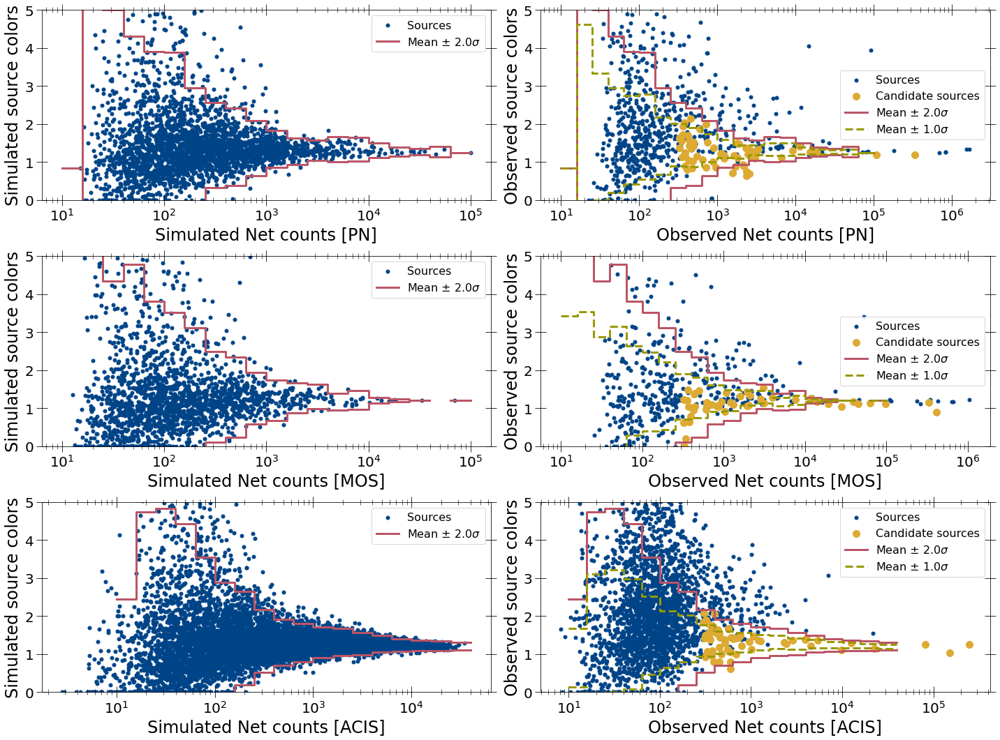

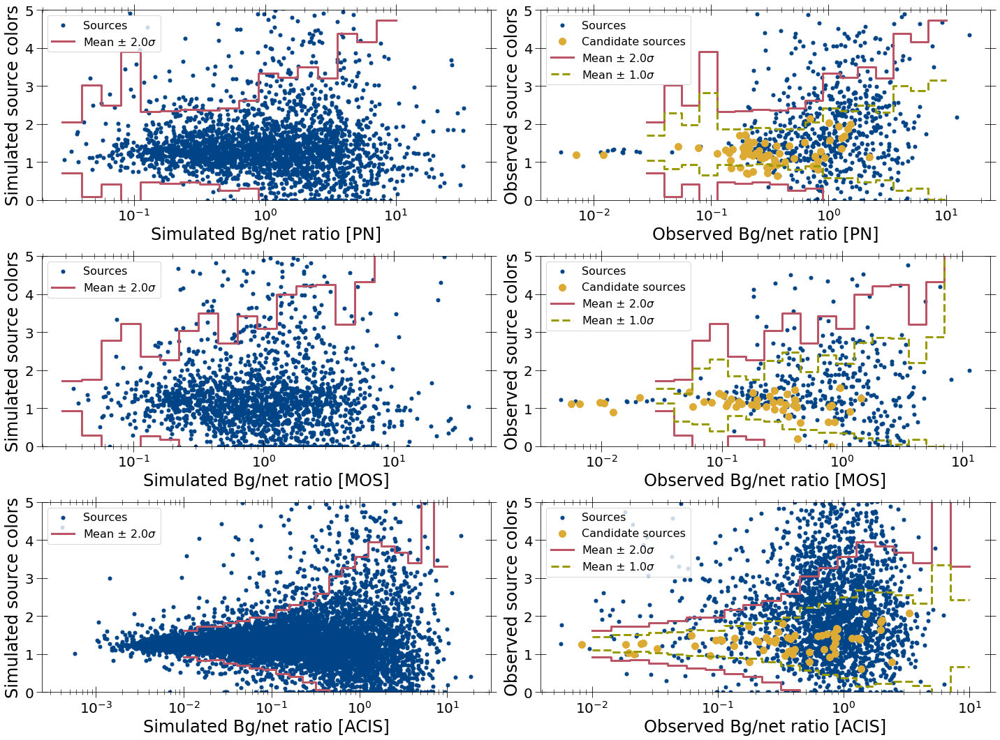

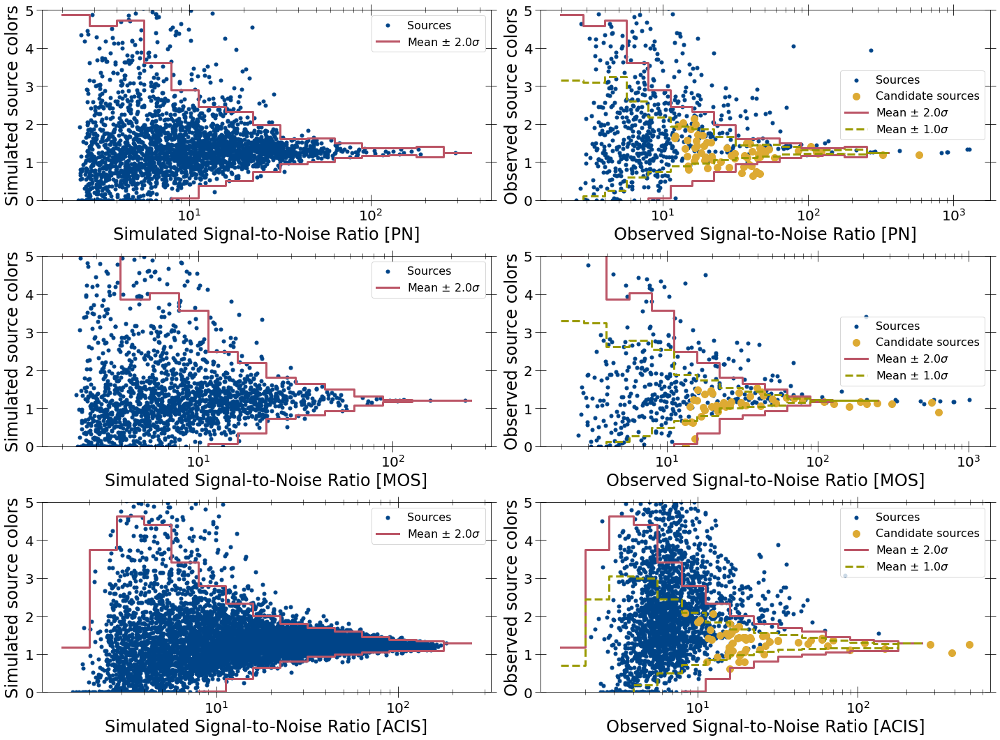

In [258]:
test = getcolor_prop_alldet2(spec_summary, compare_det=True,
                             candidate_srcs=[candidate_srcs_pn,
                                             candidate_srcs_mos,
                                             candidate_srcs_acis])

In [131]:
def mark_interested_srcs(sim_color_dict, obs_color_dict, src_nums, obs_mask,
                         interested_srcs, prop_num=0):
    props = obs_color_dict['prop_list'][prop_num]
    colors = obs_color_dict['colors']
    interested_args = np.where(np.isin(src_nums[obs_mask], interested_srcs))
    prop_bins = sim_color_dict['prop_bins'][prop_num]
    mean_color = sim_color_dict['color_stat'][0][prop_num]
    std_color = sim_color_dict['color_stat'][2][prop_num]
    plotline_scatter([props, props[interested_args], prop_bins, prop_bins,
                      prop_bins, prop_bins],
                     [colors, colors[interested_args], mean_color + 2*std_color,
                      mean_color - 2*std_color, mean_color + 1*std_color,
                      mean_color - 1*std_color],
                     pl_types=['scatter', 'scatter', 'step', 'step', 'step',
                               'step'],
                     xlabel='Net counts', ylabel='Colors',
                     colors=['#004488', '#ddaa33', '#bb5566', '#bb5566',
                             '#999900', '#999900'],
                     styles=['-', '-', '-', '-', '--', '--'],
                     pl_labels=['Colors', 'Colors (candidates)',
                                r'Mean $\pm$ 2$\sigma$', None,
                                None, r'Mean $\pm$ 1$\sigma$'],
                     ylim=(0, 5))

11:80: E501 line too long (80 > 79 characters)


In [23]:
np.where(spec_summary['src_nums'][0] == )

SyntaxError: invalid syntax (<ipython-input-23-8d0a30d54856>, line 1)

1:40: E202 whitespace before ')'
41: E999 SyntaxError: invalid syntax


Error before execution: invalid syntax (<ipython-input-23-8d0a30d54856>, line 1)


(array([  0,   3,   5,   7,   8,  13,  14,  18,  22,  25,  26,  31,  32,
        34,  37,  38,  40,  43,  46,  47,  49,  50,  53,  58,  60,  63,
        65,  69,  80,  81,  84,  85,  87,  88,  91,  92,  94,  95, 101,
       102, 104, 106, 111, 112, 121, 129, 130, 131, 133, 136, 138, 139,
       143, 144, 145, 146, 148, 149, 151, 154, 155, 157, 158, 164, 165,
       168, 174, 175, 178, 180, 181, 182, 183, 195, 200, 202, 203, 204,
       205, 212, 226, 229, 231, 236, 237, 241, 242, 243, 244, 245, 264,
       267, 273, 274, 275, 276, 278, 279, 280, 281, 282, 283, 284, 288,
       298, 302, 305, 315, 318, 319, 320, 322, 323, 324, 326, 338, 343,
       344, 345, 351, 356, 359, 360, 361, 366, 367, 381, 382, 387, 389,
       390, 392, 394, 402, 404, 405, 418, 421, 423, 424, 425, 446, 447,
       448, 449, 450, 451, 452, 453, 454, 455, 457, 458, 459, 460, 463,
       465, 466, 467, 468, 469, 470, 471, 472, 473, 474, 475, 476, 478,
       479, 481, 482, 487, 490, 492, 502, 503, 504, 513, 522, 5

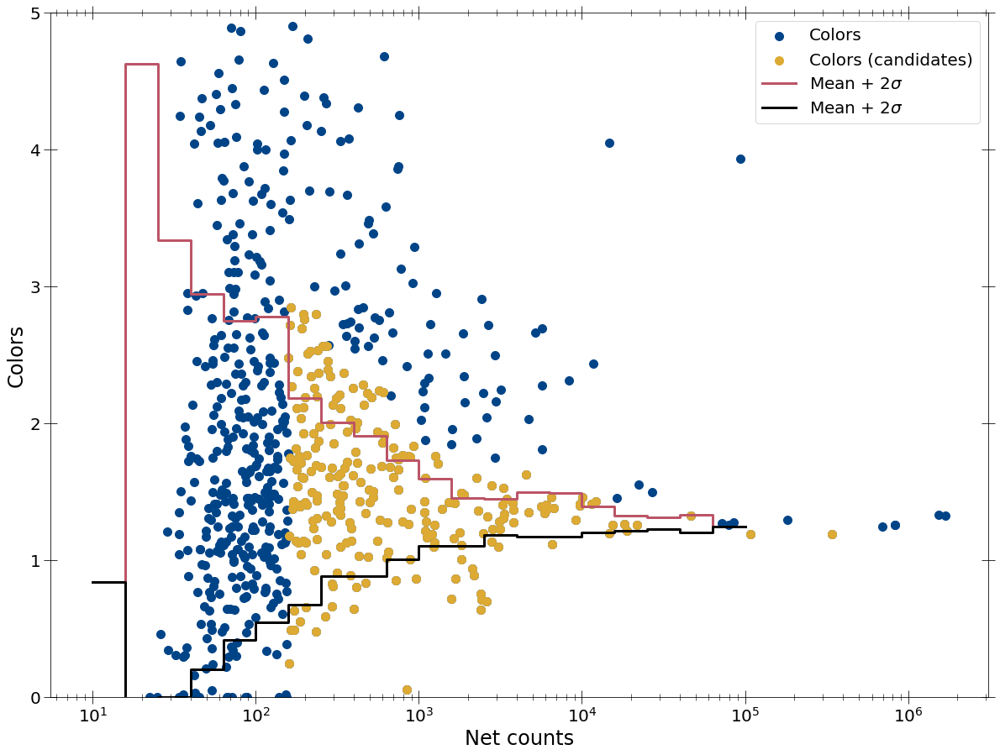

2:80: E501 line too long (83 > 79 characters)


In [111]:
mark_interested_srcs(sim_color_dict_arr[0], obs_color_dict_arr[0],
                     spec_summary['src_nums'][0], spec_summary['spec_masks'][1][0],
                     interested_srcs_alldet[0], 0)

(array([  3,   4,   6,  10,  11,  16,  17,  20,  23,  29,  32,  38,  39,
        40,  46,  47,  48,  50,  52,  59,  62,  69,  72,  74,  75,  78,
        82,  84,  87,  94,  95,  96,  97,  99, 100, 105, 107, 109, 110,
       111, 115, 118, 119, 120, 123, 129, 133, 138, 139, 141, 143, 144,
       146, 149, 156, 159, 160, 163, 166, 168, 169, 170, 178, 179, 180,
       186, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 212, 213,
       214, 215, 216, 218, 221, 222, 224, 226, 228, 230, 236, 239, 243,
       251, 252, 256, 259, 260, 270, 273, 274, 276, 279, 280, 283, 284,
       285, 286, 287, 288, 290, 292, 295, 296, 298, 309, 311, 313, 315,
       318, 319, 320, 322, 324, 333, 334, 338, 345, 347, 348, 349, 357,
       375, 379, 380, 381, 382, 383, 386, 395, 396, 397, 398, 399, 400,
       401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413,
       414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426,
       427, 442, 444]),)
['201032613010001' '201032613010002' '

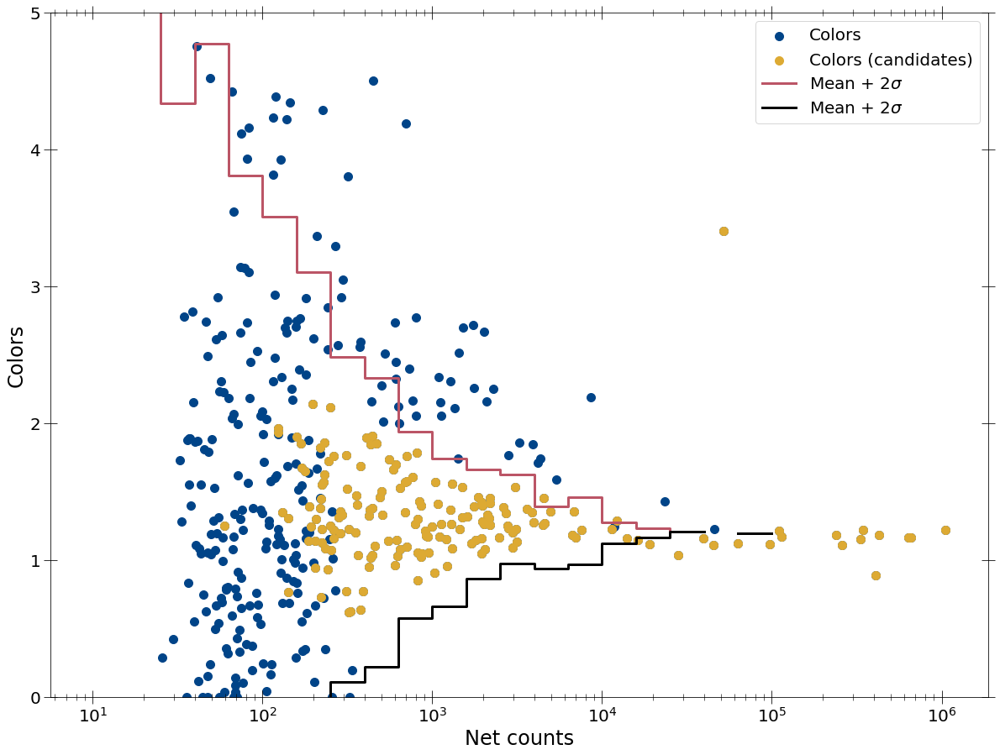

2:80: E501 line too long (83 > 79 characters)


In [233]:
mark_interested_srcs(sim_color_dict_arr[1], obs_color_dict_arr[1],
                     spec_summary['src_nums'][0], spec_summary['spec_masks'][1][1],
                     interested_srcs_alldet2[1], 0)

In [182]:
len(interested_srcs_alldet[1])

205

(array([  22,   90,  107,  130,  133,  141,  143,  163,  165,  169,  182,
        183,  184,  196,  209,  212,  223,  226,  230,  234,  246,  280,
        296,  298,  303,  308,  314,  321,  327,  328,  366,  387,  389,
        394,  402,  455,  456,  458,  474,  552,  590,  596,  597,  609,
        624,  643,  652,  669,  691,  744,  748,  763,  766,  791,  803,
        806,  820,  859,  866,  895,  907,  954,  966,  975,  983, 1001,
       1035, 1053, 1056, 1073, 1075, 1079, 1097, 1151, 1163, 1179, 1187,
       1193, 1200, 1218, 1221, 1222, 1230, 1248, 1250, 1251, 1259, 1279,
       1289, 1329, 1339, 1340, 1345, 1350, 1354, 1362, 1367, 1375, 1381,
       1390, 1408, 1418, 1419, 1420, 1444, 1459, 1469, 1474, 1486, 1489,
       1499, 1500, 1515, 1525, 1527, 1528, 1537, 1541, 1544, 1545, 1547,
       1553, 1555, 1562, 1563, 1573, 1582, 1586, 1597, 1602, 1609, 1612,
       1618, 1633, 1649, 1659, 1666, 1672, 1675, 1703, 1705, 1706, 1710,
       1761, 1769, 1771, 1774, 1820, 1829, 1832, 1

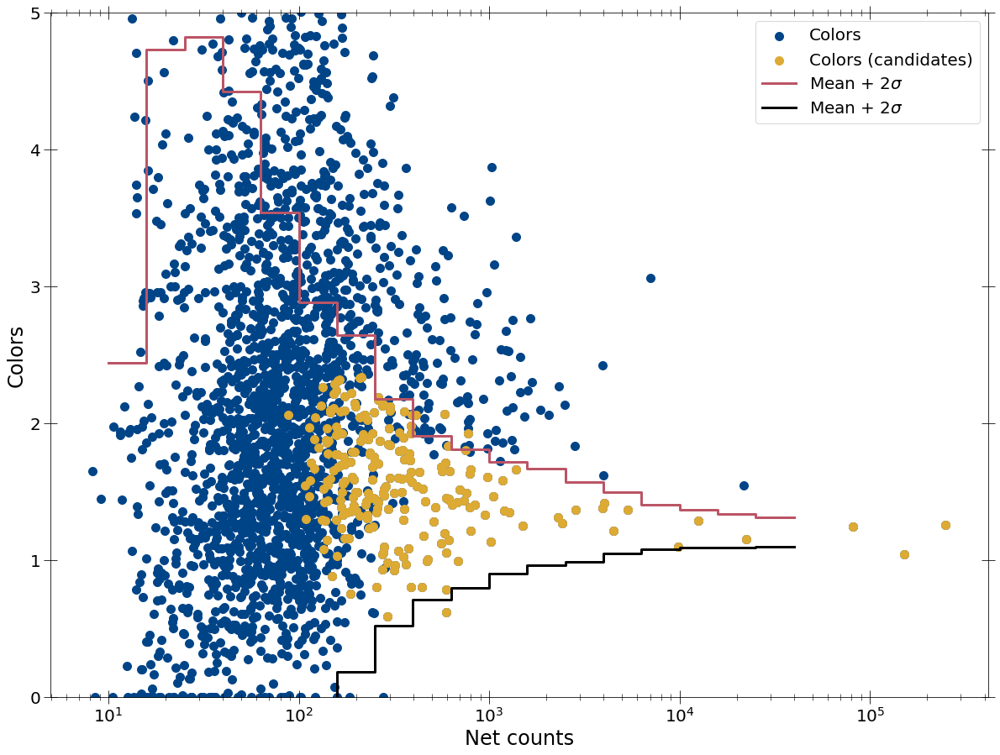

2:80: E501 line too long (83 > 79 characters)


In [234]:
mark_interested_srcs(sim_color_dict_arr[2], obs_color_dict_arr[2],
                     spec_summary['src_nums'][1], spec_summary['spec_masks'][1][2],
                     interested_srcs_alldet2[2], 0)

In [28]:
source_nums = np.loadtxt('Interested_sources.txt', dtype='object')

(array([ 24,  38,  43,  50,  75,  91,  98, 111, 121, 127, 140, 152, 187,
       191, 192, 195, 206, 211, 213, 223, 229, 240, 273, 308, 309, 311,
       441, 464, 465, 467, 481, 483]),)


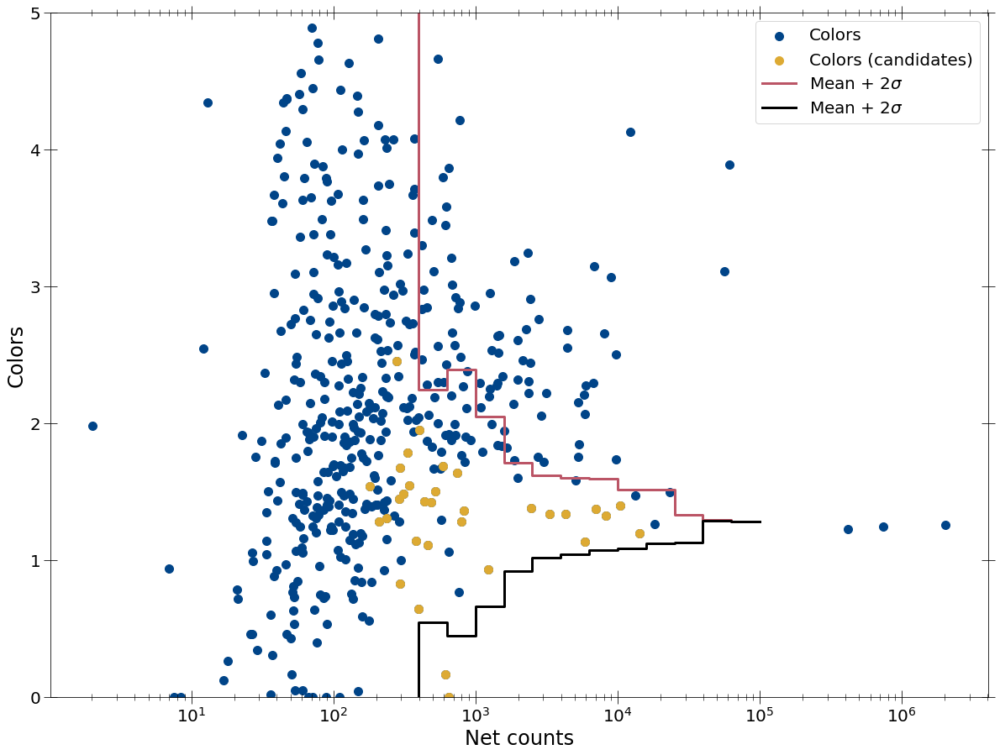

2:80: E501 line too long (83 > 79 characters)


In [29]:
mark_interested_srcs(sim_color_dict_arr[0], obs_color_dict_arr[0],
                     spec_summary['src_nums'][0], spec_summary['spec_masks'][1][0],
                     source_nums, 0)

(array([ 16,  24,  29,  33,  55,  66,  72,  84,  93,  97, 103, 119, 122,
       123, 125, 134, 137, 139, 157, 171, 183, 184, 185, 220, 224, 225,
       226, 229, 231]),)


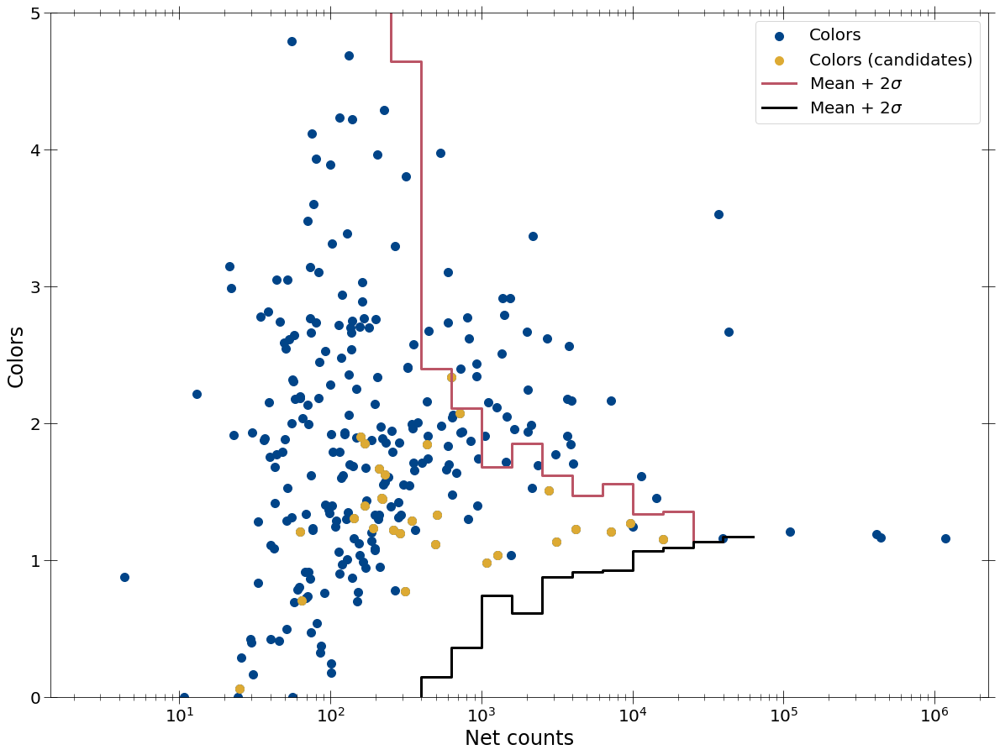

2:80: E501 line too long (83 > 79 characters)


In [30]:
mark_interested_srcs(sim_color_dict_arr[1], obs_color_dict_arr[1],
                     spec_summary['src_nums'][0], spec_summary['spec_masks'][1][1],
                     source_nums, 0)

# Checking for low norm sources

## def unmask_arr(masked_values, mask, filler=-100.0):
    unmasked_arr = np.ones(len(mask), dtype=float)*filler
    unmasked_arr[mask] = masked_values
    return unmasked_arr

In [23]:
print('MOS sources not detected in PN')
mos_not_pn = []
for src in interested_srcs_alldet[1]:
    if src not in interested_srcs_alldet[0]:
        mos_not_pn.append(src)
        print('Source: ', src)
        arg = np.where(spec_summary['src_nums'][0] == src)[0]
        print('Net counts (PN): ', spec_summary['counts'][0][0][1][arg])
        print('Net counts (MOS): ', spec_summary['counts'][0][1][1][arg])
        print('Bg counts (PN): ', spec_summary['counts'][1][0][1][arg])
        print('Bg counts (MOS): ', spec_summary['counts'][1][1][1][arg])
        print('Mask (PN): ', spec_summary['spec_masks'][1][3][arg])
        print('Mask (MOS): ', spec_summary['spec_masks'][1][4][arg])
        print('Color (PN): ', unmask_arr(obs_color_dict_arr[0]['colors'], spec_summary['spec_masks'][1][3])[arg])
        print('Color (MOS): ', unmask_arr(obs_color_dict_arr[1]['colors'], spec_summary['spec_masks'][1][4])[arg])

MOS sources not detected in PN
Source:  201129705010014
Net counts (PN):  [1984.88629568]
Net counts (MOS):  [608.05064636]
Bg counts (PN):  [2078.11370432]
Bg counts (MOS):  [524.94935364]


IndexError: list index out of range

14:80: E501 line too long (113 > 79 characters)


In [395]:
print('PN sources not detected in MOS')
pn_not_mos = []
for src in interested_srcs_alldet[0]:
    if src not in interested_srcs_alldet[1]:
        pn_not_mos.append(src)
        print('Source: ', src)
        arg = np.where(spec_summary['src_nums'][0] == src)[0]
        print('Net counts (PN): ', spec_summary['counts'][0][0][1][arg])
        print('Net counts (MOS): ', spec_summary['counts'][0][1][1][arg])
        print('Bg counts (PN): ', spec_summary['counts'][1][0][1][arg])
        print('Bg counts (MOS): ', spec_summary['counts'][1][1][1][arg])
        print('Mask (PN): ', spec_summary['spec_masks'][1][3][arg])
        print('Mask (MOS): ', spec_summary['spec_masks'][1][4][arg])
        print('Color (PN): ', unmask_arr(obs_color_dict_arr[0]['colors'], spec_summary['spec_masks'][1][3])[arg])
        print('Color (MOS): ', unmask_arr(obs_color_dict_arr[1]['colors'], spec_summary['spec_masks'][1][4])[arg])

PN sources not detected in MOS
Source:  201113501010066
Net counts (PN):  [569.59489915]
Net counts (MOS):  [77.06422098]
Bg counts (PN):  [1054.40510085]
Bg counts (MOS):  [132.93577902]
Mask (PN):  [ True]
Mask (MOS):  [ True]
Color (PN):  [1.67109356]
Color (MOS):  [3.60388168]
Source:  201113501010154
Net counts (PN):  [404.91355624]
Net counts (MOS):  [169.29402981]
Bg counts (PN):  [769.08644376]
Bg counts (MOS):  [251.70597019]
Mask (PN):  [ True]
Mask (MOS):  [ True]
Color (PN):  [1.95526699]
Color (MOS):  [1.4032798]
Source:  201129701010015
Net counts (PN):  [452.26180445]
Net counts (MOS):  [80.75597502]
Bg counts (PN):  [476.73819555]
Bg counts (MOS):  [149.24402498]
Mask (PN):  [ True]
Mask (MOS):  [ True]
Color (PN):  [1.87554681]
Color (MOS):  [2.73833179]
Source:  201129704010011
Net counts (PN):  [465.79990524]
Net counts (MOS):  [287.22584027]
Bg counts (PN):  [836.20009476]
Bg counts (MOS):  [147.77415973]
Mask (PN):  [ True]
Mask (MOS):  [ True]
Color (PN):  [2.0655

14:80: E501 line too long (113 > 79 characters)


In [396]:
len(mos_not_pn)

18

In [397]:
len(pn_not_mos)

37

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:486: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:487: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:573: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:574: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:577: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:577: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:579: RuntimeWarning: invalid value encountered in sqrt
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ip

8.0


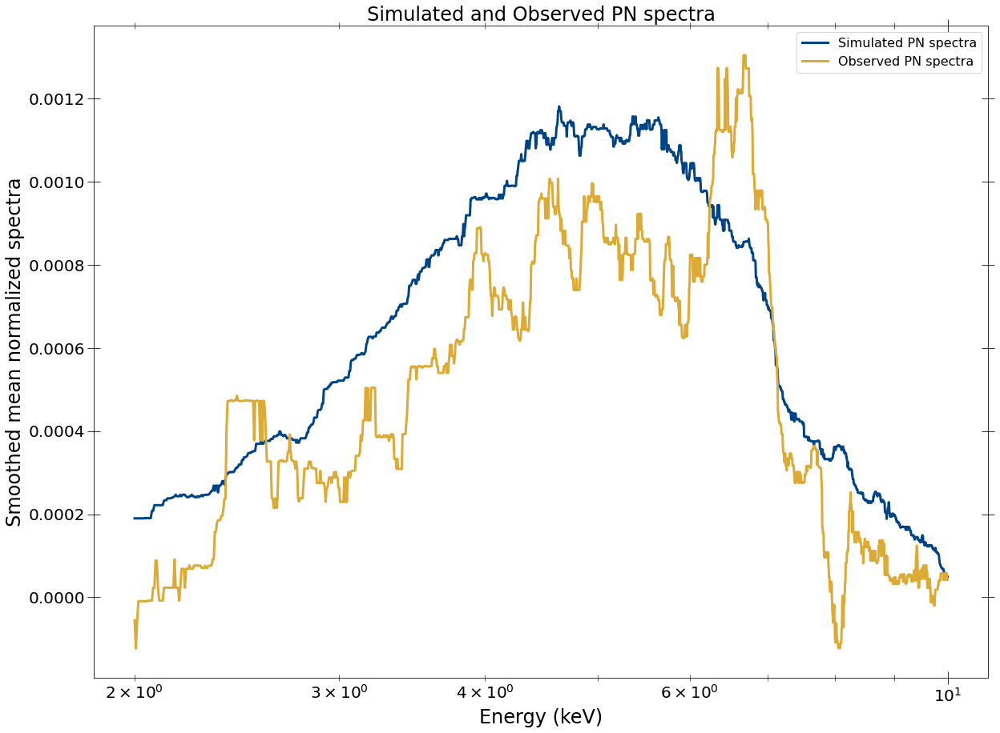

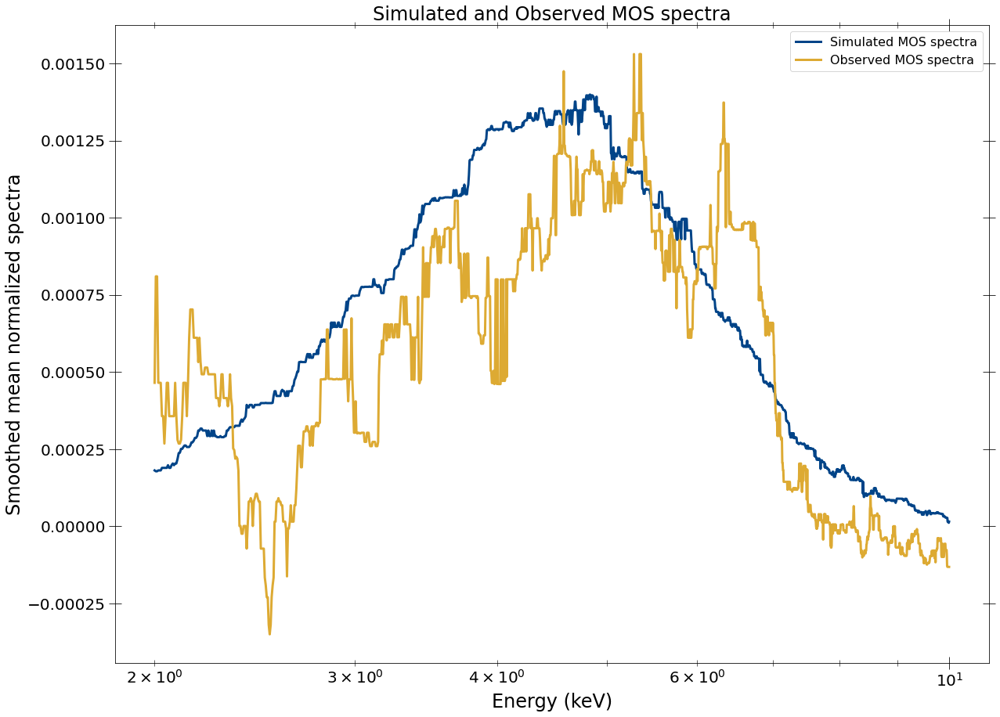

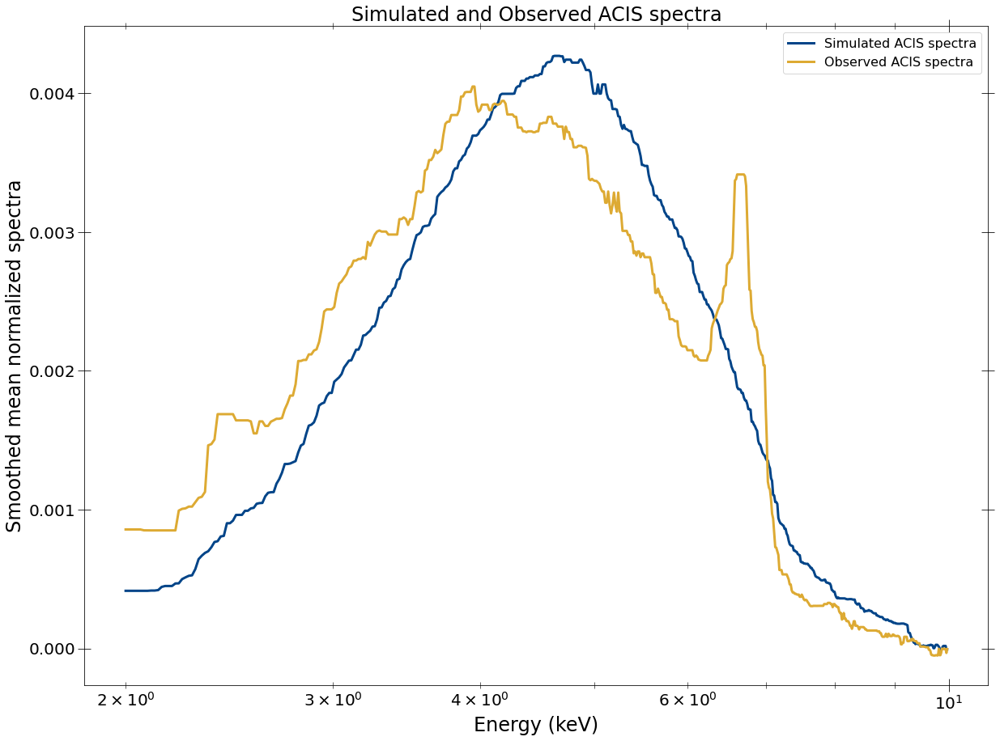

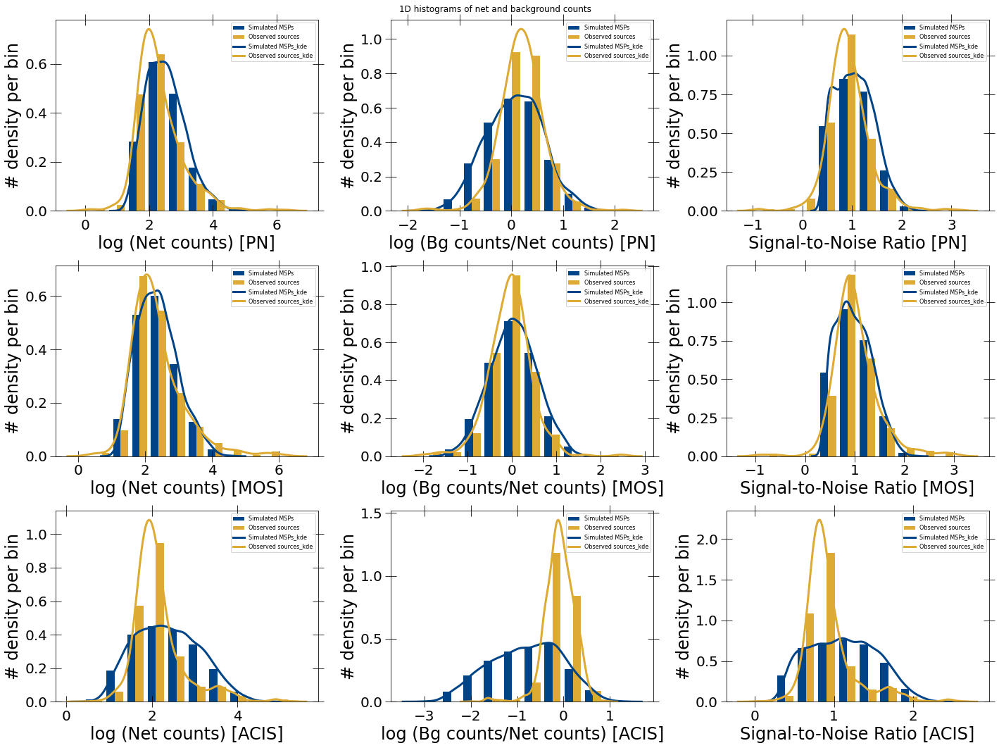

In [340]:
spec_summary = load_alldata(
     [pn_response_path, mos_response_path, chandra_response_path],
     [xmm_sim_path, xmm_sim_path, chandra_sim_path],
     [xmm_obs_path, xmm_obs_path, chandra_obs_path], en_range=[2, 10])

In [18]:
def fit_src_pl_gauss(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder +
                                 str(source_num) + '_PN_combined_src_grp1*')
        spec_mosfile = glob2.glob(src_folder +
                                  str(source_num) + '_MOS_combined_src_grp1*')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        os.chdir(src_folder + '/' + source_num)
        spec_file = str(source_num) + '_combined_src_grp1.pi'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')
    
    model = xspec.Model('tbabs*(pegpwrlw+gauss)')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 5, 5]
    model.pegpwrlw.eMin.values = '2.0'
    model.pegpwrlw.eMax.values = '10.0'
    model.gaussian.LineE.values = '6.7, 0.0001, 6.1, 6.1, 7.3, 7.3'
    model.gaussian.Sigma.values = '0.1 0'
    model.gaussian.norm.values = '1.0E-5, 0.001,,,,'
    
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.query = 'yes'
    xspec.Fit.perform()
    xspec.Fit.error('2.706 6')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 8')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 6')
    xspec.Fit.error('2.706 8')
    #goodness = xspec.Fit.goodness(1000)
    goodness = 50.0
    line_pos_low = xspec.AllModels(1).gaussian.LineE.error[0]
    line_pos_high = xspec.AllModels(1).gaussian.LineE.error[1]
    line_norm_low = xspec.AllModels(1).gaussian.norm.error[0]
    line_norm_high = xspec.AllModels(1).gaussian.norm.error[1]
    print('Model params for ' + source_num +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0],
          ' Fe_pos:', xspec.AllModels(1).gaussian.LineE.values[0],
          line_pos_low, line_pos_high,
          ' Fe_norm:', xspec.AllModels(1).gaussian.norm.values[0],
          line_norm_low, line_norm_high)
    print('Fit stats for ' + source_num + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0],
             xspec.AllModels(1).gaussian.LineE.values[0], line_pos_low,
             line_pos_high,
             xspec.AllModels(1).gaussian.norm.values[0], line_norm_low,
             line_norm_high])


27:1: W293 blank line contains whitespace
36:1: W293 blank line contains whitespace
48:5: E265 block comment should start with '# '
66:80: E501 line too long (80 > 79 characters)


In [19]:
def fit_src_pl(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder +
                                 str(source_num) + '_PN_combined_src_grp1*')
        spec_mosfile = glob2.glob(src_folder +
                                  str(source_num) + '_MOS_combined_src_grp1*')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        os.chdir(src_folder + '/' + source_num)
        spec_file = str(source_num) + '_combined_src_grp1.pi'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')

    model = xspec.Model('tbabs*pegpwrlw')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 5, 5]
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.perform()
    xspec.Fit.error('2.706 2')
    xspec.Fit.perform()
    print('Calculating goodness')
    #goodness = xspec.Fit.goodness(1000)
    print('Finished calculating goodness')
    goodness = 50.0
    print('Model params for ' + source_num +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0])
    print('Fit stats for ' + source_num + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    if telescope == 'Chandra':
        os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0]])

38:5: E265 block comment should start with '# '
50:80: E501 line too long (80 > 79 characters)


In [358]:
fit_src_pl_gauss(interested_srcs_alldet[2][1], src_folder='.', telescope='Chandra')

Model params for 2CXOJ174405.3-292031: NH =  13.531164670649881  Gamma:  2.5445926815308217e-05  norm:  0.1468500637295036  Fe_pos: 7.090349296508933 6.596165307166636 0.0  Fe_norm: 6.413684010639694e-07 0.0 1.5322175172803025e-06
Fit stats for 2CXOJ174405.3-292031:  144.50499411378615 -7.643067628929242 59.7 158




(['2CXOJ174405.3-292031', 144.50499411378615, -7.643067628929242, 59.7, 158],
 ['2CXOJ174405.3-292031',
  13.531164670649881,
  2.5445926815308217e-05,
  0.1468500637295036,
  7.090349296508933,
  6.596165307166636,
  0.0,
  6.413684010639694e-07,
  0.0,
  1.5322175172803025e-06])

In [20]:
xspec.AllData.clear()
os.chdir('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/xmm_combined_copy/')

In [240]:
import xspec

In [347]:
os.getcwd()

'/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/xmm_combined_copy'

In [22]:
pn_fit_stats_table_pl_g = []
pn_model_params_table_pl_g = []
pn_fit_stats_table_pl_g2 = []
pn_model_params_table_pl_g2 = []

for source_num in interested_srcs_alldet[0]:
    print(source_num)
    fit_stats, model_params = fit_src_pl_gauss(source_num)
    fit_stats2, model_params2 = fit_src_pl_gauss2(source_num)
    pn_fit_stats_table_pl_g.append(fit_stats)
    pn_model_params_table_pl_g.append(model_params)
    pn_fit_stats_table_pl_g2.append(fit_stats2)
    pn_model_params_table_pl_g2.append(model_params2)

201129701010028
Model params for 201129701010028: NH =  12.49224372699796  Gamma:  5.2057672439109515e-05  norm:  0.08726669835039214  Fe_pos: 6.476992838574023 0.0 0.0  Fe_norm: 2.27892815913404e-07 0.0 6.382487907458613e-07
Fit stats for 201129701010028:  382.01067074326465 -7.223521531186869 50.0 451


Model params for 201129701010028: NH =  11.997464780308515  Gamma:  1.4788852592113402e-06  norm:  0.08377669948917826  Fe_norms: 1.8968825087051988e-07 0.0 4.5786793411885067e-07 1.5833020084829397e-08 0.0 2.8053098469219676e-07 1.7497999813105274e-07 0.0 4.7671676973729557e-07
Fit stats for 201129701010028:  380.6568108800015 -7.0935501771757945 50.0 450


201129701010051
Model params for 201129701010051: NH =  0.10000000000173763  Gamma:  1.2594627700780238e-06  norm:  0.13756465360305595  Fe_pos: 6.58273370665754 6.43622524986314 6.71692219852442  Fe_norm: 6.114755862461551e-07 9.324075071245871e-08 1.2426457647930034e-06
Fit stats for 201129701010051:  306.85672590498393 -6.25783

Model params for 201529201010020: NH =  11.075912849372365  Gamma:  2.1647182507545883  norm:  0.36469351994937754  Fe_pos: 6.461866058879345 6.3021548890930985 6.677540239392005  Fe_norm: 1.459083041376635e-06 2.191319262841693e-07 2.9380289677518157e-06
Fit stats for 201529201010020:  707.7390922451173 -5.570505674294564 50.0 870


Model params for 201529201010020: NH =  10.998369057858447  Gamma:  2.143281494561453  norm:  0.3642379162936905  Fe_norms: 1.0023775762036838e-06 4.572380382352661e-08 2.1789688782804617e-06 3.6972532532926627e-07 0.0 1.4427837748519277e-06 1.5870766214351233e-15 0.0 9.187395702873156e-07
Fit stats for 201529201010020:  708.2181067522133 -5.56922264785507 50.0 869


202026708010341
Model params for 202026708010341: NH =  14.38100904252049  Gamma:  0.5858060070707437  norm:  0.04310052252201082  Fe_pos: 6.919988168443378 6.771199312638482 7.134713351783259  Fe_norm: 4.380864844406571e-07 2.0791971538374454e-07 1.3223833380483268e-06
Fit stats for 202026708

Model params for 206746007010035: NH =  16.763169506153968  Gamma:  2.4154801543235145  norm:  0.1234791043198554  Fe_pos: 6.83018319020404 6.662195474127227 7.027301334892729  Fe_norm: 6.085688557218021e-07 7.411770221436827e-08 1.2747650789710562e-06
Fit stats for 206746007010035:  567.0126941959313 -7.106393368269464 50.0 648


Model params for 206746007010035: NH =  16.382604447735485  Gamma:  2.3170715111868385  norm:  0.12148125400098307  Fe_norms: 8.621166380623191e-13 0.0 3.656085421129572e-07 3.038415888448315e-07 0.0 8.215457700457435e-07 2.3499828508100512e-07 0.0 7.097680235722068e-07
Fit stats for 206746007010035:  568.3421605962213 -7.004050500143397 50.0 647


206946401010024
Model params for 206946401010024: NH =  11.626257343440177  Gamma:  1.8927957912438202  norm:  0.7655569771762648  Fe_pos: 7.084207236407772 0.0 0.0  Fe_norm: 2.7769843441235468e-06 0.0 6.94433550413257e-06
Fit stats for 206946401010024:  278.79778856574694 -8.541754850339046 50.0 331


Model params

Model params for 206946410010046: NH =  18.497062663569384  Gamma:  2.3046704918654997  norm:  0.41677579482785765  Fe_pos: 7.033710781093285 6.895041801876328 7.18721311471324  Fe_norm: 1.5648615747135075e-06 2.635867846471192e-07 3.284883263028549e-06
Fit stats for 206946410010046:  197.72014482477564 -6.75450080957954 50.0 245


Model params for 206946410010046: NH =  16.17606533759551  Gamma:  1.8742486949169057  norm:  0.38105039125759776  Fe_norms: 4.220194165351392e-19 0.0 4.774060550642757e-07 1.783530026073259e-20 0.0 3.682416754551822e-07 6.980592452436167e-07 0.0 2.1433435668918145e-06
Fit stats for 206946410010046:  200.45324096951003 -6.900255378595554 50.0 244


206946410015051
Model params for 206946410015051: NH =  3.95480566905528  Gamma:  0.30433447263327734  norm:  0.28021529759972186  Fe_pos: 6.253008714622511 0.0 0.0  Fe_norm: 6.406162825944783e-07 0.0 1.7639423261037003e-06
Fit stats for 206946410015051:  235.02387141850733 -6.731306460584979 50.0 223


Model para

Model params for 208016812010006: NH =  5.43887522895069  Gamma:  1.4242233735355645  norm:  0.1410424517913122  Fe_norms: 1.03294050704014e-12 0.0 4.015422131020668e-07 8.622550462994848e-08 0.0 5.60733972209138e-07 1.5952041054525522e-07 0.0 6.737450623734636e-07
Fit stats for 208016812010006:  197.02442992306334 -8.632614510178135 50.0 229


208016813010013
Model params for 208016813010013: NH =  6.112110235461891  Gamma:  0.33826132025607936  norm:  0.2499784652203847  Fe_pos: 6.2998237739116885 0.0 6.516223994444261  Fe_norm: 8.971155076175477e-07 2.145134611847787e-07 1.7091670491240618e-06
Fit stats for 208016813010013:  342.40041058721874 -8.852621035678828 50.0 383


Model params for 208016813010013: NH =  7.072862889865704  Gamma:  0.5805829228102923  norm:  0.237527516207336  Fe_norms: 7.004824805596303e-07 1.749525894929774e-07 1.3645435480405714e-06 3.722585840176762e-07 0.0 1.0406942719793985e-06 8.552810148514468e-07 2.459885689407923e-07 1.6350447922110356e-06
Fit stats

Model params for 208624701010019: NH =  8.341654597262455  Gamma:  1.3265128941616977  norm:  0.5143698198789786  Fe_norms: 1.9722956237441183e-07 0.0 2.209871232408758e-06 2.5326392544388733e-07 0.0 2.273855460691294e-06 5.311561083180143e-07 0.0 2.6855969008714236e-06
Fit stats for 208624701010019:  230.15901219940548 -7.564494406350212 50.0 276


208860102010003
Model params for 208860102010003: NH =  5.559937722346416  Gamma:  0.39536194505602695  norm:  0.36640493733466967  Fe_pos: 6.248248598215449 0.0 6.465607190984739  Fe_norm: 1.6559689957153996e-06 2.3206153892152896e-07 3.444851157166964e-06
Fit stats for 208860102010003:  185.33424337243395 -7.993127827110254 50.0 192


Model params for 208860102010003: NH =  5.765421141469018  Gamma:  0.37822039641691474  norm:  0.3794338777385983  Fe_norms: 1.0281541033524695e-06 0.0 2.5203855411301936e-06 8.732159496717424e-19 0.0 5.791275123546543e-07 7.223043657683419e-08 0.0 1.426121940338027e-06
Fit stats for 208860102010003:  187.12

Model params for 201129704010023: NH =  15.479602160807922  Gamma:  0.6254523908420282  norm:  0.12431672315359532  Fe_pos: 6.473126160572491 6.368551449223438 6.590403144385391  Fe_norm: 7.067958941119017e-07 3.3377778838888583e-07 1.1356233418290325e-06
Fit stats for 201129704010023:  619.528169899436 -5.225436163305494 50.0 803


Model params for 201129704010023: NH =  15.78385300992024  Gamma:  0.7053912996561755  norm:  0.12267948455173738  Fe_norms: 4.7599611196829794e-07 1.893064873642923e-07 8.155201573821485e-07 2.342768526883718e-07 0.0 5.716073881379695e-07 1.502736801619205e-07 0.0 4.671357373202433e-07
Fit stats for 201129704010023:  620.2988073038684 -5.241928091608735 50.0 802


201129704010026
Model params for 201129704010026: NH =  8.80030170425491  Gamma:  0.42270417738797816  norm:  0.13584352983553524  Fe_pos: 6.799882414096336 6.713381625659447 6.882199148475735  Fe_norm: 1.5714420629568415e-06 8.792469058498723e-07 2.3849615912456965e-06
Fit stats for 201129704010

Model params for 202039301010054: NH =  15.562969859963987  Gamma:  1.1944088302418927  norm:  0.0962596125661674  Fe_norms: 2.2988569893884646e-16 0.0 1.262033284561506e-07 2.0666124906340116e-07 2.3944759456024876e-08 4.179070778295271e-07 1.6245495240424157e-07 0.0 3.7011742642476417e-07
Fit stats for 202039301010054:  841.5560448351715 -4.902119193256861 50.0 1053


202039301010071
Model params for 202039301010071: NH =  30.899981775532535  Gamma:  5.743921469173435e-07  norm:  0.11901272567322531  Fe_pos: 6.572441371618643 0.0 0.0  Fe_norm: 2.4332412283747546e-07 0.0 5.552688342629499e-07
Fit stats for 202039301010071:  595.6221375126892 -6.105072030328843 50.0 689


Model params for 202039301010071: NH =  26.192666723209438  Gamma:  4.561611155646538e-07  norm:  0.1044953116879771  Fe_norms: 1.6879732214801742e-07 0.0 4.0075618200453154e-07 1.835415052479004e-07 0.0 4.1646673669382257e-07 1.6547138167884155e-07 0.0 4.013293604774323e-07
Fit stats for 202039301010071:  592.9605426

Model params for 206946410010178: NH =  7.854207696832142  Gamma:  0.8945760503164432  norm:  0.081327353472413  Fe_pos: 7.03229838821621 0.0 0.0  Fe_norm: 1.4333903405034946e-08 0.0 3.266199508037429e-07
Fit stats for 206946410010178:  518.958695064184 -8.325896690446784 50.0 674


Model params for 206946410010178: NH =  8.007020677011596  Gamma:  0.9327153219139824  norm:  0.08096595452445841  Fe_norms: 5.868311539023468e-15 0.0 8.633060007751529e-08 1.0330747923746846e-09 0.0 2.3438434507705652e-07 6.142954561868344e-08 0.0 3.0890609724153823e-07
Fit stats for 206946410010178:  518.7696748420173 -8.314830467012552 50.0 673


206946416010014
Model params for 206946416010014: NH =  8.445089349385004  Gamma:  3.1442382138619434  norm:  0.3346723743396027  Fe_pos: 6.344517583150406 0.0 0.0  Fe_norm: 3.4077051703266045e-07 0.0 1.157683403823934e-06
Fit stats for 206946416010014:  536.2356242619048 -5.196650769920585 50.0 611


Model params for 206946416010014: NH =  8.148546126503946  Ga

Model params for 208860204010001: NH =  4.984937790138327  Gamma:  0.9391883876899144  norm:  0.8824836780177877  Fe_pos: 6.543245049550736 6.461833700846944 6.6261780234352745  Fe_norm: 8.121918004887138e-06 4.5239834710984575e-06 1.234700347299879e-05
Fit stats for 208860204010001:  471.7658238554051 -5.872505150377995 50.0 535


Model params for 208860204010001: NH =  5.286151571263588  Gamma:  1.0219388598606887  norm:  0.8705234482801493  Fe_norms: 4.252405918906965e-06 1.7639479463903494e-06 7.342642579661903e-06 4.209216860693194e-06 1.551773487783041e-06 7.564864570074047e-06 1.167086548349316e-06 0.0 4.188733560765084e-06
Fit stats for 208860204010001:  472.6638925520565 -5.869490742621348 50.0 534


208860207010007
Model params for 208860207010007: NH =  8.561912304867812  Gamma:  1.005705310450266  norm:  0.6605928608450075  Fe_pos: 6.511940295466213 6.425240225699455 6.604450665749181  Fe_norm: 4.490373399989638e-06 2.5984995951943103e-06 6.582883811482649e-06
Fit stats for

Model params for 201129707010057: NH =  19.795837466517334  Gamma:  0.1377897537626281  norm:  0.19738036543474313  Fe_norms: 4.498351934435967e-16 0.0 1.2462031840540834e-07 3.6147132910971015e-18 0.0 2.2291476906777176e-07 4.2696024390734343e-16 0.0 1.9764865064112848e-07
Fit stats for 201129707010057:  581.4996456642131 -6.95189775986645 50.0 737


201129708010018
Model params for 201129708010018: NH =  24.593156833570013  Gamma:  0.7447693049563583  norm:  0.45173709327489253  Fe_pos: 6.712459620874063 6.554953423258761 6.897006261331803  Fe_norm: 9.788485196121837e-07 2.2628683418426e-07 1.8228495954108933e-06
Fit stats for 201129708010018:  708.9327859417524 -6.0940395806232255 50.0 839


Model params for 201129708010018: NH =  24.856600254607233  Gamma:  0.761962742392973  norm:  0.4548309259062356  Fe_norms: 1.2628332391929956e-16 0.0 4.229126159223132e-07 6.988730664267315e-07 9.987066458820634e-08 1.390144841238328e-06 2.672644168655975e-07 0.0 9.2967795420567e-07
Fit stats f

Model params for 205110012010053: NH =  13.800091124271844  Gamma:  1.928679413610708  norm:  2.842495731390363  Fe_norms: 7.80672205348034e-12 0.0 2.7484853573521376e-06 3.4590164880747136e-14 0.0 4.099691471505533e-06 2.0579802835154228e-10 0.0 4.112706895639929e-06
Fit stats for 205110012010053:  337.44152869002517 -7.7585681774604245 50.0 409


205110012010055
Model params for 205110012010055: NH =  12.282562810326315  Gamma:  1.7173687820978576  norm:  2.930439068166423  Fe_pos: 7.3 7.210830052662242 0.0  Fe_norm: 6.581374468115996e-06 9.466171208341579e-07 1.3599473877208371e-05
Fit stats for 205110012010055:  365.849918216552 -8.856332591275425 50.0 434


Model params for 205110012010055: NH =  11.373187225820331  Gamma:  1.5496210430804078  norm:  2.8713509564680466  Fe_norms: 1.1071459399906894e-06 0.0 5.462282883090116e-06 6.78652362234439e-08 0.0 4.192564824462104e-06 4.650468788755161e-13 0.0 2.668838930167763e-06
Fit stats for 205110012010055:  369.4444060974183 -9.1022425

Model params for 201129704010010: NH =  35.17188442986274  Gamma:  1.089595748575149  norm:  0.22898518457259898  Fe_norms: 7.687596656281309e-07 4.82407563574623e-07 1.09311107449424e-06 4.2522037619560286e-07 1.478094259701833e-07 7.294335138941876e-07 2.790756891757206e-07 1.2783834109747277e-08 5.728504223486773e-07
Fit stats for 201129704010010:  1462.2100364693747 -8.246663067749225 50.0 1763


201129704010019
Model params for 201129704010019: NH =  25.131711655337412  Gamma:  0.5201600537266277  norm:  0.16589693520793367  Fe_pos: 6.583302738522667 6.406062552458643 6.748330390853386  Fe_norm: 5.804263876273684e-07 2.2783416886691353e-07 9.655323768730653e-07
Fit stats for 201129704010019:  1289.8414416982978 -6.855043117011347 50.0 1423


Model params for 201129704010019: NH =  24.076278130162496  Gamma:  0.5759859829791718  norm:  0.15615635496866237  Fe_norms: 2.9724366742871984e-07 3.8509564015066174e-08 5.826975978758645e-07 3.454186450357798e-07 7.24806734974358e-08 6.4951

Model params for 207234103010049: NH =  5.237668945124975  Gamma:  1.5113890258522523e-07  norm:  1.3097405177408048  Fe_pos: 6.7611235541254855 6.640705849418267 6.872559844774003  Fe_norm: 5.291285785603355e-06 2.4403151761664875e-06 8.524964537894733e-06
Fit stats for 207234103010049:  503.1534813330033 -7.339352082939445 50.0 659


Model params for 207234103010049: NH =  4.902780393622678  Gamma:  1.439292579516965e-05  norm:  1.2695043007308677  Fe_norms: 1.8505913431251734e-06 6.134515577448093e-08 3.9216393830039625e-06 3.6136815139484393e-06 1.567019241413086e-06 6.035080923619997e-06 2.080069917336856e-06 1.49993321632228e-07 4.401956608667775e-06
Fit stats for 207234103010049:  499.7399694616515 -7.555599174332052 50.0 658


207234103015041
Model params for 207234103015041: NH =  8.925283505841492  Gamma:  0.28697606060304676  norm:  2.3501686030022637  Fe_pos: 7.299999999999952 6.985028738949051 0.0  Fe_norm: 7.09722824258826e-06 2.9608446874172557e-06 1.1519619894431494e-05

Model params for 206946401010013: NH =  10.615453815897801  Gamma:  1.6443126442981533  norm:  2.227837254836741  Fe_pos: 6.331608745659266 0.0 0.0  Fe_norm: 2.7527737589956496e-06 0.0 6.305713006483749e-06
Fit stats for 206946401010013:  772.0375360958518 -9.173100320720229 50.0 859


Model params for 206946401010013: NH =  10.641612596105073  Gamma:  1.648464268033517  norm:  2.230671175643379  Fe_norms: 2.1042374848584697e-06 0.0 5.1072603239040835e-06 1.2399223971767089e-06 0.0 4.3953821772458245e-06 5.920194320318777e-12 0.0 2.8952333041527005e-06
Fit stats for 206946401010013:  771.7424104978655 -9.105395651612836 50.0 858


206946409010002
Model params for 206946409010002: NH =  9.510088432601457  Gamma:  2.2541357283007364  norm:  2.006467481724635  Fe_pos: 6.447056789484419 6.300687585525322 6.578342645921346  Fe_norm: 4.935879508096844e-06 1.637688952570642e-06 8.701996286597252e-06
Fit stats for 206946409010002:  717.7336678507191 -10.339158071641295 50.0 779


Model params 

Model params for 201529201010094: NH =  6.60307918905713  Gamma:  1.680164860251739  norm:  1.392041638575058  Fe_pos: 6.814100784233714 0.0 0.0  Fe_norm: 1.197526353637945e-06 0.0 2.719204317588524e-06
Fit stats for 201529201010094:  903.017004971931 -9.724050572215972 50.0 999


Model params for 201529201010094: NH =  6.727310234256308  Gamma:  1.7200799580629889  norm:  1.3871434982877866  Fe_norms: 7.033110829255566e-07 0.0 1.7599375768292383e-06 6.689327670657709e-07 0.0 1.8014030571722003e-06 7.03039793706085e-07 0.0 1.8623508118635265e-06
Fit stats for 201529201010094:  901.5004880580321 -9.725624896009082 50.0 998


202026707010271
Model params for 202026707010271: NH =  19.816162467242428  Gamma:  5.0  norm:  5.4610116308685885  Fe_pos: 6.518196676760956 0.0 0.0  Fe_norm: 3.6732844999604494e-23 0.8224962005991274 0.0
Fit stats for 202026707010271:  860.2236774004846 -7.70760775174577 50.0 928


Model params for 202026707010271: NH =  19.864374656482518  Gamma:  5.0  norm:  5.4

Model params for 207901804010066: NH =  18.807947308422783  Gamma:  5.0  norm:  4.973242765615155  Fe_norms: 1.976980377478863e-22 0.8224962005991274 0.0 1.1588629482791923e-22 0.8224962005991274 0.0 2.395868602836693e-22 0.8224962005991274 0.0
Fit stats for 207901804010066:  761.6228958413508 -7.595954868110655 50.0 811


207901804015015
Model params for 207901804015015: NH =  20.25913422443209  Gamma:  5.0  norm:  6.305964755478977  Fe_pos: 7.003874517860132 0.0 0.0  Fe_norm: 9.997328357789784e-23 0.8224962005991274 0.0
Fit stats for 207901804015015:  869.1797645151718 -7.267177275288186 50.0 947


Model params for 207901804015015: NH =  20.258462984663087  Gamma:  5.0  norm:  6.305595507321089  Fe_norms: 2.2006103850274693e-22 0.8224962005991274 0.0 1.454178107450923e-22 0.8224962005991274 0.0 1.8899679133346076e-22 0.8224962005991274 0.0
Fit stats for 207901804015015:  869.1797569115563 -7.267563462840438 50.0 946


207901804015034
Model params for 207901804015034: NH =  20.8827591

Model params for 207234103010040: NH =  6.600768961380268  Gamma:  0.3905981439246614  norm:  4.140953272504823  Fe_pos: 7.0033337915205705 6.947913140188986 7.063380426796042  Fe_norm: 2.3189432323720637e-05 1.7769362342771932e-05 2.9003454510993532e-05
Fit stats for 207234103010040:  1378.1322394100334 -8.043313808887548 50.0 1297


Model params for 207234103010040: NH =  6.5093826062088835  Gamma:  0.40368080203745627  norm:  4.06480218676428  Fe_norms: 3.0220283503688e-06 3.3958573212837e-07 5.9737448574948244e-06 7.865614849277401e-06 4.533498066522284e-06 1.151235993862419e-05 1.563172403255139e-05 1.1531467331939926e-05 2.0092587568035937e-05
Fit stats for 207234103010040:  1374.3301950831478 -8.299857474440707 50.0 1296


207234104010014
Model params for 207234104010014: NH =  4.911128880113902  Gamma:  4.896530650855125e-07  norm:  6.1182246801870654  Fe_pos: 6.856341207089568 6.7908560643664275 6.924257335664589  Fe_norm: 1.9901150089857573e-05 1.4146817269743473e-05 2.602954

Model params for 207234103010014: NH =  11.571918138986423  Gamma:  1.0946730901463475  norm:  7.454600852861154  Fe_norms: 5.5784042767286335e-06 1.7088639268679077e-06 9.791885382097558e-06 1.6064963640975403e-05 1.1294550287069153e-05 2.1218583804764777e-05 1.633419437168292e-05 1.1101245802555934e-05 2.201874869540047e-05
Fit stats for 207234103010014:  1562.981180570354 -8.125189763890672 50.0 1315


207234104010017
Model params for 207234104010017: NH =  4.886209905961666  Gamma:  0.04990380866275423  norm:  9.060204012310967  Fe_pos: 7.2493686476615755 7.176451374772983 0.0  Fe_norm: 1.9242228819099874e-05 1.2362414278639891e-05 2.652745430646197e-05
Fit stats for 207234104010017:  1589.7707673786733 -8.848114415672482 50.0 1441


Model params for 207234104010017: NH =  4.577625396652666  Gamma:  0.0135009093701614  norm:  9.003827262614427  Fe_norms: 2.4539623251041717e-06 0.0 6.294480707809253e-06 7.507225643588451e-06 3.3817302391716896e-06 1.19338489480858e-05 7.735721407227

Model params for 207234103010035: NH =  8.373638777396295  Gamma:  0.7918083267529836  norm:  7.4524100943779334  Fe_pos: 6.49090994850055 6.424486189722204 6.559817025820205  Fe_norm: 2.2782064327811673e-05 1.8454312133803657e-05 2.7268663965214448e-05
Fit stats for 207234103010035:  1807.2598160400896 -8.159051578814319 50.0 1465


Model params for 207234103010035: NH =  8.76984451904151  Gamma:  0.9106557543218091  norm:  7.259582090099137  Fe_norms: 1.3763679021392775e-05 1.0706037161597452e-05 1.6984771340219024e-05 1.2594506543996696e-05 9.32160426990438e-06 1.605479531982373e-05 1.7783718245742855e-05 1.4094237148551985e-05 2.1691618646719484e-05
Fit stats for 207234103010035:  1723.5748379441534 -8.369496677092647 50.0 1464


208441011010001
Model params for 208441011010001: NH =  22.097892617609894  Gamma:  1.0190726666976724  norm:  16.301237434994473  Fe_pos: 6.3040805174252705 0.0 0.0  Fe_norm: 2.913432218785704e-06 0.0 7.693246407985344e-06
Fit stats for 208441011010001:  

In [21]:
pn_fit_stats_table2_pl_g = []
pn_model_params_table2_pl_g = []
pn_fit_stats_table2_pl_g2 = []
pn_model_params_table2_pl_g2 = []

for source_num in interested_srcs_alldet2[0]:
    print(source_num)
    fit_stats, model_params = fit_src_pl_gauss(source_num)
    fit_stats2, model_params2 = fit_src_pl_gauss2(source_num)
    pn_fit_stats_table2_pl_g.append(fit_stats)
    pn_model_params_table2_pl_g.append(model_params)
    pn_fit_stats_table2_pl_g2.append(fit_stats2)
    pn_model_params_table2_pl_g2.append(model_params2)

NameError: name 'interested_srcs_alldet2' is not defined

In [247]:
len(pn_fit_stats_table2_pl)

249

In [23]:
pn_fit_stats_table_pl = []
pn_model_params_table_pl = []

for source_num in interested_srcs_alldet[0]:
    print(source_num)
    fit_stats, model_params = fit_src_pl(source_num)
    pn_fit_stats_table_pl.append(fit_stats)
    pn_model_params_table_pl.append(model_params)

201129701010028
Calculating goodness
Finished calculating goodness
Model params for 201129701010028: NH =  37.308421837494805  Gamma:  0.8525112770180747  norm:  0.1452326982080457
Fit stats for 201129701010028:  382.5689610875541 -5.901103306049314 50.0 453


201129701010051
Calculating goodness
Finished calculating goodness
Model params for 201129701010051: NH =  0.43201730131312205  Gamma:  7.463879676030254e-06  norm:  0.1466287081116996
Fit stats for 201129701010051:  310.75854886357934 -6.081222052127955 50.0 317


201129702010034
Calculating goodness
Finished calculating goodness
Model params for 201129702010034: NH =  3.2003960270727934  Gamma:  1.4520946591184419e-05  norm:  0.03011084279796209
Fit stats for 201129702010034:  511.481412657419 -5.319252414720899 50.0 661


201129704015082
Calculating goodness
Finished calculating goodness
Model params for 201129704015082: NH =  5.459411388434552  Gamma:  1.3616481828832507e-06  norm:  0.08333738503360714
Fit stats for 201129704

Calculating goodness
Finished calculating goodness
Model params for 206946407010048: NH =  3.28396450992032  Gamma:  0.3957284381746336  norm:  0.062473549565232225
Fit stats for 206946407010048:  536.0501621963531 -6.9248701533306045 50.0 620


206946408010009
Calculating goodness
Finished calculating goodness
Model params for 206946408010009: NH =  6.868363755667224  Gamma:  1.9208318190508868  norm:  0.1321613973398504
Fit stats for 206946408010009:  362.5769564885378 -6.813578679585295 50.0 386


206946408010129
Calculating goodness
Finished calculating goodness
Model params for 206946408010129: NH =  23.188468309070092  Gamma:  6.028483852191199e-05  norm:  0.11198259106227292
Fit stats for 206946408010129:  610.3556178390397 -4.399078353014915 50.0 726


206946410010025
Calculating goodness
Finished calculating goodness
Model params for 206946410010025: NH =  6.840441743610254  Gamma:  0.758532671078732  norm:  0.5003378540979199
Fit stats for 206946410010025:  223.2894362244432 

Calculating goodness
Finished calculating goodness
Model params for 208860207010005: NH =  9.088803205523643  Gamma:  1.6491692398993756  norm:  0.16419871910608017
Fit stats for 208860207010005:  476.3091956319586 -6.158246064025795 50.0 474


208860810010009
Calculating goodness
Finished calculating goodness
Model params for 208860810010009: NH =  10.864341043351846  Gamma:  0.14861264907866528  norm:  0.2818662286556598
Fit stats for 208860810010009:  614.6076602822993 -6.018585845076924 50.0 641


208861209010005
Calculating goodness
Finished calculating goodness
Model params for 208861209010005: NH =  6.116469166224786  Gamma:  0.9996569113637904  norm:  0.3366841001476827
Fit stats for 208861209010005:  244.0701135947865 -7.297756316796537 50.0 299


200305401010008
Calculating goodness
Finished calculating goodness
Model params for 200305401010008: NH =  9.34439638661711  Gamma:  0.1938138006596022  norm:  0.17775347039666198
Fit stats for 200305401010008:  502.2244657140632 -7.

Calculating goodness
Finished calculating goodness
Model params for 206946409010022: NH =  6.229705740790377  Gamma:  1.337606718368001  norm:  0.8797420859841123
Fit stats for 206946409010022:  295.77367670777767 -8.176075386330327 50.0 365


206946410010178
Calculating goodness
Finished calculating goodness
Model params for 206946410010178: NH =  7.756012424841629  Gamma:  0.877664561099516  norm:  0.08134202489723485
Fit stats for 206946410010178:  518.978268198664 -8.337323036063498 50.0 676


206946416010014
Calculating goodness
Finished calculating goodness
Model params for 206946416010014: NH =  7.982537158356041  Gamma:  3.0045500127865403  norm:  0.32472292336168684
Fit stats for 206946416010014:  536.9326584377627 -5.200752385448248 50.0 613


207242102010114
Calculating goodness
Finished calculating goodness
Model params for 207242102010114: NH =  18.98603382000929  Gamma:  2.262539620906165  norm:  0.8776335127640109
Fit stats for 207242102010114:  285.99179667367633 -8.751

Calculating goodness
Finished calculating goodness
Model params for 204003401010007: NH =  5.472578325357658  Gamma:  0.8424586889428248  norm:  0.0967887822840139
Fit stats for 204003401010007:  1141.6552412391381 -8.166210822379103 50.0 1387


204105804010005
Calculating goodness
Finished calculating goodness
Model params for 204105804010005: NH =  16.159276330839546  Gamma:  1.932627588478275  norm:  0.4974085271190189
Fit stats for 204105804010005:  1497.955651820031 -6.488017813588674 50.0 1834


205110012010017
Calculating goodness
Finished calculating goodness
Model params for 205110012010017: NH =  12.618659988660067  Gamma:  2.238008884395538  norm:  4.73617371230518
Fit stats for 205110012010017:  388.3485405828811 -8.67976287913388 50.0 462


205110012010028
Calculating goodness
Finished calculating goodness
Model params for 205110012010028: NH =  10.633826035886019  Gamma:  1.8245210369955225  norm:  3.0586819303015678
Fit stats for 205110012010028:  321.1609565547128 -8.53

Calculating goodness
Finished calculating goodness
Model params for 207641904010001: NH =  9.426495783508974  Gamma:  0.18945305780026014  norm:  1.0974238475571487
Fit stats for 207641904010001:  1004.1267512271208 -8.904125606259838 50.0 1187


208016804010054
Calculating goodness
Finished calculating goodness
Model params for 208016804010054: NH =  13.867751109001748  Gamma:  1.968424981145243  norm:  1.2775848856791439
Fit stats for 208016804010054:  579.0531924307152 -10.233535068453941 50.0 727


208042503010007
Calculating goodness
Finished calculating goodness
Model params for 208042503010007: NH =  7.592765252812676  Gamma:  2.4536884752718047  norm:  0.7501642943705047
Fit stats for 208042503010007:  597.450716895137 -9.66501713507533 50.0 682


208624703010003
Calculating goodness
Finished calculating goodness
Model params for 208624703010003: NH =  7.253871786274679  Gamma:  1.2696356732145515  norm:  2.000452044118058
Fit stats for 208624703010003:  508.65043767374436 -9.3

Calculating goodness
Finished calculating goodness
Model params for 207901804010066: NH =  18.805685650437272  Gamma:  5.0  norm:  4.972260325568647
Fit stats for 207901804010066:  761.6228475904832 -7.598230957853292 50.0 814


207901804015015
Calculating goodness
Finished calculating goodness
Model params for 207901804015015: NH =  20.25945390545713  Gamma:  5.0  norm:  6.306108115462277
Fit stats for 207901804015015:  869.179769515955 -7.266993279523491 50.0 949


207901804015034
Calculating goodness
Finished calculating goodness
Model params for 207901804015034: NH =  20.90052608801323  Gamma:  5.0  norm:  6.066436527907233
Fit stats for 207901804015034:  891.7970818615366 -7.923110488098022 50.0 938


208441011010002
Calculating goodness
Finished calculating goodness
Model params for 208441011010002: NH =  11.467503181242275  Gamma:  0.9417415676844645  norm:  4.421924063935476
Fit stats for 208441011010002:  1448.3060122266365 -6.727469350181318 50.0 1625


208860107010001
Calcul

Calculating goodness
Finished calculating goodness
Model params for 207234103010036: NH =  5.2242329790122515  Gamma:  0.08247115859974823  norm:  8.243073589896383
Fit stats for 207234103010036:  1915.4984918246787 -7.883116050428456 50.0 1518


201129706010014
Calculating goodness
Finished calculating goodness
Model params for 201129706010014: NH =  12.93567025687425  Gamma:  1.120137803753283  norm:  0.4230482121243671
Fit stats for 201129706010014:  3640.7329163548366 -5.7742945440288675 50.0 3170


201129721010003
Calculating goodness
Finished calculating goodness
Model params for 201129721010003: NH =  12.125075301356242  Gamma:  1.4198908366754894  norm:  1.5212841080584507
Fit stats for 201129721010003:  6060.841133867188 -4.498763402537974 50.0 3105


201442201010001
Calculating goodness
Finished calculating goodness
Model params for 201442201010001: NH =  12.220716162277512  Gamma:  1.846145991261998  norm:  5.260906855810096
Fit stats for 201442201010001:  2995.059325391424 

In [246]:
pn_fit_stats_table2_pl = []
pn_model_params_table2_pl = []

for source_num in interested_srcs_alldet2[0]:
    print(source_num)
    fit_stats, model_params = fit_src_pl(source_num)
    pn_fit_stats_table2_pl.append(fit_stats)
    pn_model_params_table2_pl.append(model_params)

200305401010049
Model params for 200305401010049: NH =  39.805908434776285  Gamma:  7.169042835422148e-07  norm:  0.2136166691845309
Fit stats for 200305401010049:  331.47548228732285 -5.578814283706613 50.0 439


201129701010051
Model params for 201129701010051: NH =  0.43201730131312205  Gamma:  7.463879676030254e-06  norm:  0.1466287081116996
Fit stats for 201129701010051:  310.75854886357934 -6.081222052127955 50.0 317


201129704010031
Model params for 201129704010031: NH =  30.565616107080245  Gamma:  2.3993514482036167  norm:  0.151691544568419
Fit stats for 201129704010031:  889.402788554389 -5.9470772626802795 50.0 1173


201129704010041
Model params for 201129704010041: NH =  10.611039158171966  Gamma:  0.3067599355345301  norm:  0.2244129493697962
Fit stats for 201129704010041:  233.22676400644966 -7.7287610123439165 50.0 243


201129707010018
Model params for 201129707010018: NH =  24.29983000192929  Gamma:  1.9939350000327225  norm:  0.15077201100639415
Fit stats for 20112

Model params for 206946405010094: NH =  5.407768315532954  Gamma:  0.5207580618543582  norm:  0.08212040471758167
Fit stats for 206946405010094:  290.3303674164932 -6.719550622948568 50.0 330


206946408010060
Model params for 206946408010060: NH =  28.3727835301244  Gamma:  1.1127643880517504  norm:  0.19864922381537084
Fit stats for 206946408010060:  337.47779804685797 -7.890584621046666 50.0 363


206946408015034
Model params for 206946408015034: NH =  52.3346557980782  Gamma:  3.180575889921384  norm:  1.1513422555114954
Fit stats for 206946408015034:  246.8565252798347 -5.137769931282889 50.0 285


206946409010022
Model params for 206946409010022: NH =  6.229705740790377  Gamma:  1.337606718368001  norm:  0.8797420859841123
Fit stats for 206946409010022:  295.77367670777767 -8.176075386330327 50.0 365


206946410010025
Model params for 206946410010025: NH =  6.840441743610254  Gamma:  0.758532671078732  norm:  0.5003378540979199
Fit stats for 206946410010025:  223.2894362244432 -7

Model params for 201129707010040: NH =  49.5776244985074  Gamma:  1.2638154782543423  norm:  0.17775650886596062
Fit stats for 201129707010040:  273.29273602735196 -6.511778573323717 50.0 328


201129708010066
Model params for 201129708010066: NH =  13.998103667743958  Gamma:  0.14613824808254078  norm:  0.18404946824502677
Fit stats for 201129708010066:  580.7733946326856 -4.568653162279634 50.0 682


201129708015085
Model params for 201129708015085: NH =  42.989387506155325  Gamma:  1.7543090971160176  norm:  0.20897089534232183
Fit stats for 201129708015085:  251.87547615352065 -6.177845330182773 50.0 262


201129709010025
Model params for 201129709010025: NH =  6.40347444101713  Gamma:  0.05817900184452419  norm:  0.16778054162593295
Fit stats for 201129709010025:  509.0541264754828 -4.923834552450399 50.0 562


201129715010023
Model params for 201129715010023: NH =  0.10000003102585676  Gamma:  2.089663094699327e-06  norm:  0.04249493158550592
Fit stats for 201129715010023:  394.0

Model params for 207901804010064: NH =  18.46779866389381  Gamma:  5.0  norm:  5.757402468988422
Fit stats for 207901804010064:  790.7161832827782 -7.498702064109055 50.0 826


208016803010003
Model params for 208016803010003: NH =  6.185355381703184  Gamma:  1.222260426169147  norm:  0.3198136926262305
Fit stats for 208016803010003:  628.9378982866099 -6.627109769538901 50.0 773


208016813010003
Model params for 208016813010003: NH =  6.628568658343826  Gamma:  1.762801904733762  norm:  0.2506705496106544
Fit stats for 208016813010003:  609.6442782716246 -5.657308286493724 50.0 763


208016813010013
Model params for 208016813010013: NH =  6.2129703823132525  Gamma:  0.24658217895254392  norm:  0.2683124097208932
Fit stats for 208016813010013:  347.3815332130674 -8.689638894584515 50.0 385


208024101010072
Model params for 208024101010072: NH =  11.526056556793954  Gamma:  0.0077092933896032384  norm:  0.09076235368713732
Fit stats for 208024101010072:  251.75775610120792 -6.92033812

Model params for 201032613010002: NH =  5.426897119465339  Gamma:  0.47090027769133375  norm:  0.773994391241295
Fit stats for 201032613010002:  1255.9294417727688 -7.646708669602269 50.0 1560


201129701010027
Model params for 201129701010027: NH =  9.649795795108659  Gamma:  1.0283016380837886  norm:  0.1715001259084814
Fit stats for 201129701010027:  845.1138053816295 -8.60805417961941 50.0 1045


201129707010002
Model params for 201129707010002: NH =  16.008572366704563  Gamma:  0.18894350827211082  norm:  0.19323181653137078
Fit stats for 201129707010002:  799.910755380052 -6.3528137034330925 50.0 875


201129707010014
Model params for 201129707010014: NH =  11.380393225831108  Gamma:  0.18691894637792855  norm:  0.1216807812303055
Fit stats for 201129707010014:  592.0827559583832 -6.750975432637999 50.0 750


201129707010015
Model params for 201129707010015: NH =  32.35747657951063  Gamma:  1.0894609976307805  norm:  0.3090676467890682
Fit stats for 201129707010015:  919.64671006

Model params for 201529201010091: NH =  6.144001308598835  Gamma:  1.6370323629059782  norm:  2.17517483905738
Fit stats for 201529201010091:  1062.975988439709 -10.095625255028244 50.0 1119


206904418010014
Model params for 206904418010014: NH =  7.895295102067729  Gamma:  0.583485936877836  norm:  5.95882815262876
Fit stats for 206904418010014:  4564.6949187009695 -3.1480746742101013 50.0 2213


206904418010045
Model params for 206904418010045: NH =  4.147060291533469  Gamma:  0.00016760760069234944  norm:  2.958306891669967
Fit stats for 206904418010045:  929.9509870426419 -7.5724778375108235 50.0 1007


207234103010019
Model params for 207234103010019: NH =  5.945790625513885  Gamma:  0.15108964511596037  norm:  2.2463250037594
Fit stats for 207234103010019:  1874.200267726933 -4.3457016652917915 50.0 1945


207234103010046
Model params for 207234103010046: NH =  6.923478625133678  Gamma:  0.006505933919449624  norm:  1.682038634905474
Fit stats for 207234103010046:  1151.92881471

Model params for 203032102010002: NH =  15.002549958616619  Gamma:  1.4942005371867502  norm:  13.742017162456085
Fit stats for 203032102010002:  9193.94867685653 -4.562337467053314 50.0 3164


207234103015046
Model params for 207234103015046: NH =  5.406904543871727  Gamma:  0.1288005213954796  norm:  8.412933049755239
Fit stats for 207234103015046:  2243.650389389737 -7.9349554900887025 50.0 1545


208624706010010
Model params for 208624706010010: NH =  31.037456818099162  Gamma:  1.3308270028133227  norm:  573.2801325560904
Fit stats for 208624706010010:  1960.6696181107352 -9.565236325299427 50.0 1591


205110012010001
Model params for 205110012010001: NH =  8.58678150667414  Gamma:  1.3078729413072792  norm:  891.90282543595
Fit stats for 205110012010001:  5155.5029559293125 -7.217156512365482 50.0 3162


201129721010005
Model params for 201129721010005: NH =  15.850574048781128  Gamma:  2.0500678412632745  norm:  2.711500338501457
Fit stats for 201129721010005:  105738.5169469819

In [40]:
test

SyntaxError: unexpected character after line continuation character (<ipython-input-40-7dc8c59fb709>, line 1)

6: E999 SyntaxError: unexpected character after line continuation character


Error before execution: unexpected character after line continuation character (<ipython-input-40-7dc8c59fb709>, line 1)


In [248]:
mos_fit_stats_table2_pl_g = []
mos_model_params_table2_pl_g = []
mos_fit_stats_table2_pl_g2 = []
mos_model_params_table2_pl_g2 = []

for source_num in interested_srcs_alldet2[1]:
    print(source_num)
    fit_stats, model_params = fit_src_pl_gauss(source_num)
    fit_stats2, model_params2 = fit_src_pl_gauss2(source_num)
    mos_fit_stats_table2_pl_g.append(fit_stats)
    mos_model_params_table2_pl_g.append(model_params)
    mos_fit_stats_table2_pl_g2.append(fit_stats2)
    mos_model_params_table2_pl_g2.append(model_params2)

201129701010027
Model params for 201129701010027: NH =  9.819770036600167  Gamma:  1.1039206092219227  norm:  0.1677499948292157  Fe_pos: 6.3840886259328435 6.257737231836482 6.517471358685884  Fe_norm: 2.686869599961564e-07 2.1695656705176165e-08 5.437366520709519e-07
Fit stats for 201129701010027:  841.882095458817 -8.665785645329287 50.0 1043


Model params for 201129701010027: NH =  10.0926877825381  Gamma:  1.1712645622711444  norm:  0.16673469499491544  Fe_norms: 2.880125435841834e-07 8.050868824537158e-08 5.25120430834049e-07 5.760894113250644e-12 0.0 1.534723790504566e-07 1.5577976887676093e-07 0.0 3.994094832955193e-07
Fit stats for 201129701010027:  838.6227508932285 -8.656965662701412 50.0 1042


201129704010031
Model params for 201129704010031: NH =  33.7677096813271  Gamma:  2.728895098231746  norm:  0.17796542796111728  Fe_pos: 7.299999718069995 0.0 0.0  Fe_norm: 2.0546650152968042e-07 0.0 9.33924576918656e-07
Fit stats for 201129704010031:  888.8044698104263 -5.939907079

Model params for 206556701010016: NH =  7.855355270701126  Gamma:  0.7055260532301157  norm:  0.0838775220009082  Fe_pos: 6.799769089915469 6.677702332421763 6.916114967669991  Fe_norm: 5.343335988558654e-07 1.6536779855362085e-07 9.981604640990476e-07
Fit stats for 206556701010016:  562.265516203551 -6.43700547138055 50.0 715


Model params for 206556701010016: NH =  7.167697532841169  Gamma:  0.4930442701744168  norm:  0.0885198000667998  Fe_norms: 3.914748361249937e-15 0.0 1.9637454489663345e-07 2.053266329374451e-07 0.0 5.421530716513982e-07 3.010723480495581e-08 0.0 3.5896856415939304e-07
Fit stats for 206556701010016:  566.8532104882255 -6.394293662686685 50.0 714


206556701010023
Model params for 206556701010023: NH =  2.1270834826659266  Gamma:  2.505390338589546e-06  norm:  0.07251707791549934  Fe_pos: 6.557813169094284 6.479322648973209 6.635290379954195  Fe_norm: 6.914120104447882e-07 3.2032208431706496e-07 1.105381503088828e-06
Fit stats for 206556701010023:  770.028659732

Model params for 202026707010221: NH =  6.3016210895329055  Gamma:  1.733388498666554  norm:  0.13745736010572235  Fe_pos: 6.148659688783511 0.0 0.0  Fe_norm: 3.2676824246574486e-07 0.0 1.4108737889620754e-06
Fit stats for 202026707010221:  322.11205226182364 -6.879937910744003 50.0 373


Model params for 202026707010221: NH =  5.751677128206241  Gamma:  1.5746216398890527  norm:  0.1389171080334418  Fe_norms: 1.945034508823684e-16 0.0 6.503911944930553e-07 8.006285478178546e-08 0.0 1.1805745635594766e-06 2.9645400345078745e-11 0.0 1.2237678702125133e-06
Fit stats for 202026707010221:  322.48140061392337 -6.906561630801784 50.0 372


202026707010240
Model params for 202026707010240: NH =  2.1371053816531225  Gamma:  0.3535571219492564  norm:  0.12696458300144622  Fe_pos: 6.897918585161181 6.74087654803363 7.006648862821705  Fe_norm: 1.3314963449581852e-06 2.966401121155157e-07 2.7783777275766182e-06
Fit stats for 202026707010240:  337.3682410278833 -7.566457859274431 50.0 399


Model p

Model params for 206735502010047: NH =  16.78331030218887  Gamma:  0.7047226011269394  norm:  0.3546298944640384  Fe_norms: 6.954914066915627e-07 0.0 3.1424749677627603e-06 6.408606226390284e-22 0.0 1.8203852016260875e-06 1.342753352671312e-18 0.0 1.5701852471047705e-06
Fit stats for 206735502010047:  265.05713339651527 -7.1508409166815206 50.0 300


206735502010049
Model params for 206735502010049: NH =  9.884677494480416  Gamma:  1.8014469589014983  norm:  0.17584112967622578  Fe_pos: 6.91581189714852 0.0 0.0  Fe_norm: 1.0975538810284656e-06 0.0 3.97675509690739e-06
Fit stats for 206735502010049:  309.93109783297115 -6.478883202667095 50.0 342


Model params for 206735502010049: NH =  11.1273308071883  Gamma:  2.1212946165428397  norm:  0.17915432620372754  Fe_norms: 6.170901402510062e-07 0.0 1.914180308823877e-06 2.5282526637134285e-07 0.0 1.6397834380133033e-06 6.59117456173523e-07 0.0 2.4234572263112654e-06
Fit stats for 206735502010049:  309.5133412964408 -6.584803907900362 50.0 

Model params for 206946401010003: NH =  9.91131613965665  Gamma:  1.5530828683846476  norm:  0.8081794176144841  Fe_pos: 7.3 6.6924390665396265 0.0  Fe_norm: 2.0633869393793765e-06 4.942041510935063e-08 4.457535362827374e-06
Fit stats for 206946401010003:  979.9495468786388 -3.905526865174976 50.0 1005


Model params for 206946401010003: NH =  9.508755649723287  Gamma:  1.468018634649897  norm:  0.8051212148965766  Fe_norms: 1.8087496716941346e-13 0.0 8.573818424478976e-07 2.3774626453567542e-18 0.0 1.306862295459087e-06 8.369579123608156e-07 0.0 2.4364495977030576e-06
Fit stats for 206946401010003:  981.804046412713 -3.9032274759289676 50.0 1004


208016803010001
Model params for 208016803010001: NH =  5.477438247722109  Gamma:  0.7910695804625593  norm:  0.6112963494070606  Fe_pos: 6.47529835813703 6.35485643721511 6.611925243433143  Fe_norm: 1.348419485181247e-06 3.689821193491286e-07 2.4614583841749452e-06
Fit stats for 208016803010001:  986.3285668155654 -7.282235643893765 50.0 11

Model params for 201129704010012: NH =  47.99547378902808  Gamma:  1.1455378402935856  norm:  0.193340980282925  Fe_norms: 4.976917818064273e-07 1.9454470224134595e-07 8.77319904920263e-07 9.565092193988462e-07 6.073720419931775e-07 1.4473729170547097e-06 4.6028945632850123e-07 1.6413169751286473e-07 8.204330158239285e-07
Fit stats for 201129704010012:  1307.8389133360947 -5.942811816045561 50.0 1622


201129704010030
Model params for 201129704010030: NH =  10.275657314499618  Gamma:  0.06913579956366873  norm:  0.11087469618622794  Fe_pos: 6.785720053889405 6.73219401972946 6.838356850043799  Fe_norm: 1.0468878738555692e-06 7.888495708382812e-07 1.3271605684070161e-06
Fit stats for 201129704010030:  1397.6022141448511 -4.95895388099019 50.0 1596


Model params for 201129704010030: NH =  8.85062892487003  Gamma:  0.09278108641214622  norm:  0.10068662053060018  Fe_norms: 2.941016499861173e-07 1.3845935537132127e-07 4.6539638413611707e-07 6.751424687966461e-07 4.836384050747141e-07 8.87

Model params for 202026708010061: NH =  4.284414241178537  Gamma:  0.6217750016690143  norm:  0.15456650888143342  Fe_pos: 6.47965814789462 6.403768020942791 6.558311948262894  Fe_norm: 6.075893752752013e-07 3.498994435722654e-07 8.828080582724337e-07
Fit stats for 202026708010061:  1494.4958368776684 -7.010208430063332 50.0 1784


Model params for 202026708010061: NH =  4.649384667622556  Gamma:  0.7263775066297368  norm:  0.15097671859213718  Fe_norms: 4.4620100045090273e-07 2.512563547331493e-07 6.605388268149822e-07 2.5454824732187586e-07 4.6791726317826057e-08 4.844191820904564e-07 2.442860353690041e-07 4.221644753733374e-08 4.712812726426638e-07
Fit stats for 202026708010061:  1489.0896818618544 -7.026614485857815 50.0 1783


205100104010002
Model params for 205100104010002: NH =  19.04107627068398  Gamma:  1.443483887264985  norm:  2.3635982897006516  Fe_pos: 6.6612276314994 0.0 0.0  Fe_norm: 1.7168092374945094e-06 0.0 4.722916468979159e-06
Fit stats for 205100104010002:  706.83

Model params for 207234103010048: NH =  5.983796713687287  Gamma:  0.21415195618769559  norm:  3.400524523775699  Fe_norms: 2.933445913517748e-06 0.0 8.94419800559215e-06 9.996052483656814e-07 0.0 7.318711518780237e-06 1.3265608624497831e-05 5.582602503375814e-06 2.260345451722159e-05
Fit stats for 207234103010048:  498.3276047697127 -9.440821195722663 50.0 610


207234104010049
Model params for 207234104010049: NH =  6.8492077803500715  Gamma:  0.11770209850992475  norm:  3.86232913511545  Fe_pos: 7.275464132059056 0.0 0.0  Fe_norm: 9.232131887967399e-06 0.0 2.0871916755029953e-05
Fit stats for 207234104010049:  501.56366509796555 -8.885169277235837 50.0 630


Model params for 207234104010049: NH =  6.361865227330297  Gamma:  0.002450435063314329  norm:  3.9775621346067975  Fe_norms: 9.057807639689313e-18 0.0 4.318790355520227e-06 1.562091015249209e-15 0.0 4.334276990275446e-06 9.200381357444726e-07 0.0 8.404585800828589e-06
Fit stats for 207234104010049:  503.9697464580271 -8.6830511

Model params for 202026707010170: NH =  7.013226942454524  Gamma:  0.8820863785806043  norm:  0.12875534724101076  Fe_pos: 6.56057504831706 0.0 0.0  Fe_norm: 4.810961043587065e-07 0.0 1.1432187070734963e-06
Fit stats for 202026707010170:  580.6182900624632 -8.273568707654396 50.0 766


Model params for 202026707010170: NH =  6.7672570456841825  Gamma:  0.8169553811135155  norm:  0.1302743367247342  Fe_norms: 1.2521961159022592e-07 0.0 5.703849925630193e-07 2.1310353044046914e-07 0.0 7.545382577573849e-07 3.686893758203222e-13 0.0 5.136299534234932e-07
Fit stats for 202026707010170:  581.745541320635 -8.288187689284877 50.0 765


202026707010187
Model params for 202026707010187: NH =  3.9335433505911768  Gamma:  8.317652064257133e-08  norm:  8.157141762609772  Fe_pos: 7.3 7.15179165289488 0.0  Fe_norm: 1.7909727455023544e-05 4.788642128791051e-06 3.321136022158643e-05
Fit stats for 202026707010187:  868.8741528794254 -9.679713169893967 50.0 999


Model params for 202026707010187: NH =  

Model params for 201129721010060: NH =  15.502729409114743  Gamma:  1.6838274693457587  norm:  0.1795795097114884  Fe_pos: 7.045162976101989 0.0 0.0  Fe_norm: 4.117561983453338e-09 0.0 1.4530004265870746e-07
Fit stats for 201129721010060:  2557.647102860751 -9.05659859399537 50.0 2655


Model params for 201129721010060: NH =  15.515854933961947  Gamma:  1.6844314586726221  norm:  0.17971310320210512  Fe_norms: 3.720928794148729e-15 0.0 3.2819488898655345e-08 2.1830729881930585e-15 0.0 8.574920912523508e-08 1.846859471331045e-08 0.0 1.2392580495213957e-07
Fit stats for 201129721010060:  2557.563677277806 -9.055103612336135 50.0 2654


206904418010026
Model params for 206904418010026: NH =  7.163308511312102  Gamma:  0.38616378742769486  norm:  2.0941759158713067  Fe_pos: 6.739749894008129 6.632307080121754 6.857105851121971  Fe_norm: 4.10138267471892e-06 1.7127363109120024e-06 6.663039361781383e-06
Fit stats for 206904418010026:  2035.747297997201 -3.298590689355155 50.0 1711


Model pa

Model params for 207234105010057: NH =  3.417495231709657  Gamma:  0.017176679106110666  norm:  2.9372329568770463  Fe_pos: 7.072117404141569 6.908213563703137 7.233755615042011  Fe_norm: 8.764712814491116e-06 3.381818775781192e-06 1.498931229698545e-05
Fit stats for 207234105010057:  914.5138760207142 -9.412528802666339 50.0 1101


Model params for 207234105010057: NH =  3.3897671365586484  Gamma:  2.561416255634501e-07  norm:  2.9759999712794083  Fe_norms: 5.383671953951988e-16 0.0 2.780580036194789e-06 2.3810893110424816e-15 0.0 2.6491076051031416e-06 5.430836064286777e-06 1.519376018371642e-06 9.936056476535567e-06
Fit stats for 207234105010057:  916.8144635630168 -9.314087415494324 50.0 1100


207234105010058
Model params for 207234105010058: NH =  6.106594623003617  Gamma:  0.1257542940986323  norm:  2.611726674388601  Fe_pos: 6.757353636448356 6.592288098975828 6.908299481787143  Fe_norm: 5.708857824727931e-06 1.7640621471581518e-06 1.0114291263464253e-05
Fit stats for 207234105

Model params for 204024303010202: NH =  4.856169642611636  Gamma:  5.883456958184284e-07  norm:  3.184493676651403  Fe_norms: 1.2096671227321196e-06 0.0 4.298267929859762e-06 2.0476371461787554e-22 0.0 2.7265970794292195e-06 1.1051981859811352e-05 6.629865348752212e-06 1.5984269908438222e-05
Fit stats for 204024303010202:  1062.3421156152524 -10.018723799457815 50.0 1136


207234103010028
Model params for 207234103010028: NH =  4.892865814900012  Gamma:  8.354984689500506e-07  norm:  7.360895328367821  Fe_pos: 7.29999997283874 7.187615236039556 0.0  Fe_norm: 1.746679272774411e-05 6.554366853051025e-06 3.0190370007127832e-05
Fit stats for 207234103010028:  1089.017613007953 -9.457712756303021 50.0 1117


Model params for 207234103010028: NH =  4.695725700744118  Gamma:  0.00027065464095545977  norm:  7.200520759116949  Fe_norms: 1.1786722619860583e-05 5.547242908509043e-06 1.8773994332122876e-05 2.0323993315637682e-06 0.0 9.007145052227842e-06 8.042824667475775e-06 7.488790895239013e-07

Model params for 206904418010040: NH =  7.764668085123108  Gamma:  0.22442361329321422  norm:  15.47841528283804  Fe_pos: 6.278129033352932 6.164953121755748 6.401892135106046  Fe_norm: 2.6986888072833393e-05 1.5099400977657745e-05 3.9565353381500784e-05
Fit stats for 206904418010040:  1286.5354846256246 -9.554879329239368 50.0 1283


Model params for 206904418010040: NH =  8.004237643016719  Gamma:  0.2830277409074118  norm:  15.269086925321544  Fe_norms: 1.4522780716003597e-05 5.419302517939818e-06 2.4416007588984147e-05 2.0192700518814176e-05 1.0535410178912516e-05 3.06886727145954e-05 8.91800922210179e-06 0.0 1.914667702858156e-05
Fit stats for 206904418010040:  1280.392789773588 -9.613857722845234 50.0 1282


207234104010008
Model params for 207234104010008: NH =  5.531328156783605  Gamma:  0.015682600196252106  norm:  16.068055324242767  Fe_pos: 6.467676061912062 6.3548371392296215 6.607336133294838  Fe_norm: 3.045607036268871e-05 1.5652026721328846e-05 4.6489974241275566e-05
Fit

Model params for 207234103015028: NH =  8.058077901349911  Gamma:  0.22864577090070692  norm:  12.170427654752192  Fe_pos: 6.15327352241149 0.0 6.2122226093357025  Fe_norm: 2.6628052017386167e-05 2.0316417108672898e-05 3.313812289053972e-05
Fit stats for 207234103015028:  1618.3668348934675 -9.352052740531711 50.0 1423


Model params for 207234103015028: NH =  8.290271680601188  Gamma:  0.2617176021028281  norm:  12.204179195747063  Fe_norms: 1.1502767751753544e-05 6.763011530833399e-06 1.6514501838588824e-05 8.203894934313316e-06 3.44992957957891e-06 1.3251501142110556e-05 8.061902933078205e-06 3.0360007304575013e-06 1.341499098167795e-05
Fit stats for 207234103015028:  1643.6678342220434 -9.0569741252998 50.0 1422


205049406010002
Model params for 205049406010002: NH =  7.897936717122689  Gamma:  1.118518656365431  norm:  521.8871904724538  Fe_pos: 6.10000001115165 0.0 6.211545593990412  Fe_norm: 0.00022588461946953465 7.287034506901112e-05 0.00038871523090928636
Fit stats for 20504

Model params for 201129709010001: NH =  20.160945493272433  Gamma:  1.4625351029592384  norm:  338.8111084553825  Fe_pos: 6.947811549899487 6.83950680391611 7.032809577460552  Fe_norm: 1.3799883807102694e-05 6.337823978394999e-06 2.2144254257584344e-05
Fit stats for 201129709010001:  21266.64233185489 -8.223360033936837 50.0 3193


Model params for 201129709010001: NH =  20.159875849849662  Gamma:  1.4628186970479362  norm:  338.7569128732888  Fe_norms: 4.561408497583002e-14 0.0 9.374822239695763e-07 5.1187162752041295e-06 0.0 1.1147686972086906e-05 1.1925933533753694e-05 5.815566573945834e-06 1.8030318705751364e-05
Fit stats for 201129709010001:  21263.556699926892 -8.223735135573232 50.0 3192


204105804010001
Model params for 204105804010001: NH =  6.625301101388049  Gamma:  1.3002391679935958  norm:  290.7330694968724  Fe_pos: 7.299999988545867 0.0 0.0  Fe_norm: 1.4671470601967718e-15 0.0 5.594823206449665e-06
Fit stats for 204105804010001:  1734.575317434754 -12.896126980118769 50

In [249]:
mos_fit_stats_table2_pl = []
mos_model_params_table2_pl = []

for source_num in interested_srcs_alldet2[1]:
    print(source_num)
    fit_stats, model_params = fit_src_pl(source_num)
    mos_fit_stats_table2_pl.append(fit_stats)
    mos_model_params_table2_pl.append(model_params)

201129701010027
Model params for 201129701010027: NH =  9.649795795108659  Gamma:  1.0283016380837886  norm:  0.1715001259084814
Fit stats for 201129701010027:  845.1138053816295 -8.60805417961941 50.0 1045


201129704010031
Model params for 201129704010031: NH =  30.565616107080245  Gamma:  2.3993514482036167  norm:  0.151691544568419
Fit stats for 201129704010031:  889.402788554389 -5.9470772626802795 50.0 1173


201129707010012
Model params for 201129707010012: NH =  43.16468607056653  Gamma:  1.1527069589111714  norm:  0.3483553753373332
Fit stats for 201129707010012:  850.2383467199231 -8.226230440283452 50.0 1050


201129708010014
Model params for 201129708010014: NH =  13.237751966113793  Gamma:  0.0003279106506914384  norm:  0.17915506454714364
Fit stats for 201129708010014:  655.1383392612524 -7.512178894590746 50.0 850


201129708010035
Model params for 201129708010035: NH =  19.461274171609997  Gamma:  0.860368293735199  norm:  0.22060636407594741
Fit stats for 2011297080100

Model params for 206735502010052: NH =  20.679981379969558  Gamma:  3.48408630616184  norm:  0.34524272954149976
Fit stats for 206735502010052:  351.1758956136768 -7.263579248439246 50.0 363


206735502010070
Model params for 206735502010070: NH =  43.53802045616701  Gamma:  9.35314557637446e-07  norm:  0.39365489712161
Fit stats for 206735502010070:  269.68638777619907 -5.256098187477949 50.0 297


206735502015022
Model params for 206735502015022: NH =  33.300428260444164  Gamma:  3.7835244935577492  norm:  1.0259608777675966
Fit stats for 206735502015022:  273.0139113210657 -6.362164102367495 50.0 315


201113501010072
Model params for 201113501010072: NH =  17.604294639522895  Gamma:  2.3747087253427816e-07  norm:  0.2230716310574511
Fit stats for 201113501010072:  998.1681129679789 -7.024260759302704 50.0 1179


201129701010030
Model params for 201129701010030: NH =  48.38811423321303  Gamma:  1.7407570767997047  norm:  0.2543826520371406
Fit stats for 201129701010030:  1073.223599

Model params for 207641904010001: NH =  9.426495783508974  Gamma:  0.18945305780026014  norm:  1.0974238475571487
Fit stats for 207641904010001:  1004.1267512271208 -8.904125606259838 50.0 1187


208251401010006
Model params for 208251401010006: NH =  9.480826134481367  Gamma:  0.0772645086015527  norm:  0.24121792597068448
Fit stats for 208251401010006:  885.2047801624528 -6.2640698188271555 50.0 1156


208861209010009
Model params for 208861209010009: NH =  9.703349686055493  Gamma:  3.5126820060657217e-06  norm:  2.9190488956620175
Fit stats for 208861209010009:  816.2765408911575 -8.103058016725107 50.0 921


201529201010007
Model params for 201529201010007: NH =  22.73701221379819  Gamma:  1.1614386616211938  norm:  1.061527922038549
Fit stats for 201529201010007:  708.3967738462761 -9.433758746172616 50.0 776


206746011010075
Model params for 206746011010075: NH =  8.859605730100702  Gamma:  6.854668197209947e-05  norm:  2.3451995394108924
Fit stats for 206746011010075:  360.685

Model params for 207234104010063: NH =  4.910280461909502  Gamma:  1.7501488526398302e-07  norm:  3.2282990296478626
Fit stats for 207234104010063:  771.608140316857 -8.214236767417306 50.0 930


207234105010051
Model params for 207234105010051: NH =  6.139018981703485  Gamma:  6.484284180840333e-07  norm:  2.1855886793605874
Fit stats for 207234105010051:  798.1153190578681 -7.261419692885548 50.0 942


207234105010057
Model params for 207234105010057: NH =  3.5320894215913503  Gamma:  1.8097461287594314e-06  norm:  3.023663776358714
Fit stats for 207234105010057:  922.3633976682191 -8.942457486211483 50.0 1103


207234105010058
Model params for 207234105010058: NH =  5.68980611853293  Gamma:  0.010062475990980953  norm:  2.7081086788340976
Fit stats for 207234105010058:  915.5061747435034 -8.857396824143663 50.0 1006


201129705010011
Model params for 201129705010011: NH =  7.856630938770337  Gamma:  1.3146182531047108  norm:  0.46287214689172224
Fit stats for 201129705010011:  3140.

Model params for 203032102010002: NH =  15.002549958616619  Gamma:  1.4942005371867502  norm:  13.742017162456085
Fit stats for 203032102010002:  9193.94867685653 -4.562337467053314 50.0 3164


205110012010001
Model params for 205110012010001: NH =  8.58678150667414  Gamma:  1.3078729413072792  norm:  891.90282543595
Fit stats for 205110012010001:  5155.5029559293125 -7.217156512365482 50.0 3162


201113503010008
Model params for 201113503010008: NH =  13.781077740727014  Gamma:  2.3645441613994276  norm:  2.3905405966635134
Fit stats for 201113503010008:  29723.28183497111 -7.197420369363037 50.0 3182


201129705010002
Model params for 201129705010002: NH =  12.830240316264069  Gamma:  1.7187156182232093  norm:  121.69847790880344
Fit stats for 201129705010002:  3173.81501373443 -10.618401797268662 50.0 3161


208016804010003
Model params for 208016804010003: NH =  8.854231777669314  Gamma:  1.107962006027047  norm:  853.0819460444287
Fit stats for 208016804010003:  27074.291449662738

In [24]:
mos_fit_stats_table_pl = []
mos_model_params_table_pl = []

for source_num in interested_srcs_alldet[1]:
    print(source_num)
    fit_stats, model_params = fit_src_pl(source_num)
    mos_fit_stats_table_pl.append(fit_stats)
    mos_model_params_table_pl.append(model_params)

201113501010072
Calculating goodness
Finished calculating goodness
Model params for 201113501010072: NH =  17.604294639522895  Gamma:  2.3747087253427816e-07  norm:  0.2230716310574511
Fit stats for 201113501010072:  998.1681129679789 -7.024260759302704 50.0 1179


201129701010027
Calculating goodness
Finished calculating goodness
Model params for 201129701010027: NH =  9.649795795108659  Gamma:  1.0283016380837886  norm:  0.1715001259084814
Fit stats for 201129701010027:  845.1138053816295 -8.60805417961941 50.0 1045


201129701010030
Calculating goodness
Finished calculating goodness
Model params for 201129701010030: NH =  48.38811423321303  Gamma:  1.7407570767997047  norm:  0.2543826520371406
Fit stats for 201129701010030:  1073.2235997855005 -4.594744819127008 50.0 1357


201129702010013
Calculating goodness
Finished calculating goodness
Model params for 201129702010013: NH =  10.400131108909893  Gamma:  1.5774498997643964  norm:  0.1389353124455859
Fit stats for 201129702010013: 

Calculating goodness
Finished calculating goodness
Model params for 208860207010005: NH =  9.088803205523643  Gamma:  1.6491692398993756  norm:  0.16419871910608017
Fit stats for 208860207010005:  476.3091956319586 -6.158246064025795 50.0 474


201129708010046
Calculating goodness
Finished calculating goodness
Model params for 201129708010046: NH =  6.149831210554059  Gamma:  1.0940924573557071e-06  norm:  0.19032402333084783
Fit stats for 201129708010046:  292.7130856553664 -6.612840427077347 50.0 387


202026707010160
Calculating goodness
Finished calculating goodness
Model params for 202026707010160: NH =  3.8538958730814428  Gamma:  0.5203256872373493  norm:  0.2877323907371312
Fit stats for 202026707010160:  244.39516722352178 -7.751089120996687 50.0 278


204024303010060
Calculating goodness
Finished calculating goodness
Model params for 204024303010060: NH =  11.829346606985567  Gamma:  2.355781180287025  norm:  0.24923701979332333
Fit stats for 204024303010060:  311.08121118287

Calculating goodness
Finished calculating goodness
Model params for 201129719010009: NH =  57.149512973394344  Gamma:  0.09485046389316018  norm:  2.0009210225813208
Fit stats for 201129719010009:  646.4999653709974 -7.983451423131823 50.0 792


201129721010108
Calculating goodness
Finished calculating goodness
Model params for 201129721010108: NH =  105.52143478574584  Gamma:  2.848838921407918  norm:  0.8767112732590505
Fit stats for 201129721010108:  2515.1407752900964 -6.984190455475151 50.0 2674


201529201010017
Calculating goodness
Finished calculating goodness
Model params for 201529201010017: NH =  2.1747904606513124  Gamma:  0.4701425901907204  norm:  0.2486863324777131
Fit stats for 201529201010017:  477.4945249506033 -7.068631697421772 50.0 581


201529201015014
Calculating goodness
Finished calculating goodness
Model params for 201529201015014: NH =  8.652021000475822  Gamma:  1.3684963448289467  norm:  0.2892301045437417
Fit stats for 201529201015014:  566.6986765329807 -

Calculating goodness
Finished calculating goodness
Model params for 206946401010003: NH =  9.256620154928122  Gamma:  1.4044824532880937  norm:  0.8073668171107404
Fit stats for 206946401010003:  982.8034546994674 -3.9024357437039825 50.0 1007


207641904010001
Calculating goodness
Finished calculating goodness
Model params for 207641904010001: NH =  9.426495783508974  Gamma:  0.18945305780026014  norm:  1.0974238475571487
Fit stats for 207641904010001:  1004.1267512271208 -8.904125606259838 50.0 1187


208016803010001
Calculating goodness
Finished calculating goodness
Model params for 208016803010001: NH =  5.333487059252837  Gamma:  0.7149575055634767  norm:  0.6308797426297409
Fit stats for 208016803010001:  991.648224955775 -7.28665936165012 50.0 1133


208251401010006
Calculating goodness
Finished calculating goodness
Model params for 208251401010006: NH =  9.480826134481367  Gamma:  0.0772645086015527  norm:  0.24121792597068448
Fit stats for 208251401010006:  885.2047801624528 -

Calculating goodness
Finished calculating goodness
Model params for 207234104010027: NH =  4.595870157059741  Gamma:  1.5576472585064205e-06  norm:  4.3399436288477755
Fit stats for 207234104010027:  648.2302438595979 -8.48524629213018 50.0 772


207234104010046
Calculating goodness
Finished calculating goodness
Model params for 207234104010046: NH =  5.363550640022579  Gamma:  3.607653943038495e-05  norm:  4.205601063898873
Fit stats for 207234104010046:  599.7103342206692 -8.600491174968386 50.0 736


207234104010049
Calculating goodness
Finished calculating goodness
Model params for 207234104010049: NH =  6.316420760187208  Gamma:  0.00122571402588457  norm:  3.9654674151914473
Fit stats for 207234104010049:  504.016315275125 -8.704461779751314 50.0 632


207234104010131
Calculating goodness
Finished calculating goodness
Model params for 207234104010131: NH =  5.488269528763445  Gamma:  2.2623285664876568e-06  norm:  2.26174597318579
Fit stats for 207234104010131:  566.6435790632635

Calculating goodness
Finished calculating goodness
Model params for 207234103010061: NH =  6.22178005118131  Gamma:  4.6206844822652127e-07  norm:  2.458714938303969
Fit stats for 207234103010061:  838.5020322082851 -8.285773659971605 50.0 1020


207234103015058
Calculating goodness
Finished calculating goodness
Model params for 207234103015058: NH =  5.605094925047434  Gamma:  1.4582535076003386e-05  norm:  2.6585420814995953
Fit stats for 207234103015058:  883.3988287806812 -8.937292224225153 50.0 1047


207234104010009
Calculating goodness
Finished calculating goodness
Model params for 207234104010009: NH =  5.904399384017748  Gamma:  3.4607711565230563e-06  norm:  11.13829243889137
Fit stats for 207234104010009:  854.2823380701859 -8.49640025271888 50.0 982


207234104010053
Calculating goodness
Finished calculating goodness
Model params for 207234104010053: NH =  6.049410610030332  Gamma:  5.622421636129148e-07  norm:  3.409869941131554
Fit stats for 207234104010053:  884.00991368

Calculating goodness
Finished calculating goodness
Model params for 201113503010008: NH =  13.781077740727014  Gamma:  2.3645441613994276  norm:  2.3905405966635134
Fit stats for 201113503010008:  29723.28183497111 -7.197420369363037 50.0 3182


201129705010002
Calculating goodness
Finished calculating goodness
Model params for 201129705010002: NH =  12.830240316264069  Gamma:  1.7187156182232093  norm:  121.69847790880344
Fit stats for 201129705010002:  3173.81501373443 -10.618401797268662 50.0 3161


205110012010001
Calculating goodness
Finished calculating goodness
Model params for 205110012010001: NH =  8.58678150667414  Gamma:  1.3078729413072792  norm:  891.90282543595
Fit stats for 205110012010001:  5155.5029559293125 -7.217156512365482 50.0 3162


208624707010006
Calculating goodness
Finished calculating goodness
Model params for 208624707010006: NH =  27.53092684793122  Gamma:  1.1253873776598105  norm:  237.0693700888266
Fit stats for 208624707010006:  1642.9638754267344 -11.

In [25]:
mos_fit_stats_table_pl_g = []
mos_model_params_table_pl_g = []
mos_fit_stats_table_pl_g2 = []
mos_model_params_table_pl_g2 = []

for source_num in interested_srcs_alldet[1]:
    print(source_num)
    fit_stats, model_params = fit_src_pl_gauss(source_num)
    fit_stats2, model_params2 = fit_src_pl_gauss2(source_num)
    mos_fit_stats_table_pl_g.append(fit_stats)
    mos_model_params_table_pl_g.append(model_params)
    mos_fit_stats_table_pl_g2.append(fit_stats2)
    mos_model_params_table_pl_g2.append(model_params2)

201113501010072
Model params for 201113501010072: NH =  10.97234963946731  Gamma:  1.3092833182109707e-06  norm:  0.17069402635074815  Fe_pos: 6.716895923857079 6.634460663141928 6.803592324336899  Fe_norm: 1.5098088345291847e-06 9.977721508920549e-07 2.063022139227088e-06
Fit stats for 201113501010072:  971.179382026374 -7.702725484877695 50.0 1177


Model params for 201113501010072: NH =  9.086127917334602  Gamma:  1.4164086749186788e-05  norm:  0.1559632883707364  Fe_norms: 5.70118288011894e-07 2.717009854732586e-07 9.021792217685788e-07 9.832518284179787e-07 6.052121264672989e-07 1.4080096794242783e-06 3.8494629275884434e-07 5.5519807737769825e-08 7.710057572102079e-07
Fit stats for 201113501010072:  967.1082602046213 -7.956645541132275 50.0 1176


201129701010027
Model params for 201129701010027: NH =  9.819770036600167  Gamma:  1.1039206092219227  norm:  0.1677499948292157  Fe_pos: 6.3840886259328435 6.257737231836482 6.517471358685884  Fe_norm: 2.686869599961564e-07 2.1695656705

Model params for 201529201010018: NH =  5.520160395457969  Gamma:  0.2614587051934422  norm:  0.22817741464938035  Fe_pos: 6.657739242565114 0.0 0.0  Fe_norm: 4.864652084290947e-07 0.0 1.1064240337440786e-06
Fit stats for 201529201010018:  486.12960632603676 -5.6399323530163175 50.0 521


Model params for 201529201010018: NH =  5.816297096859258  Gamma:  0.361988142467676  norm:  0.22057130639706873  Fe_norms: 1.5592798095273151e-07 0.0 5.992488284824328e-07 3.701485382454035e-07 0.0 8.646619240785664e-07 4.7219932918529487e-07 3.105020645262493e-08 1.0230731050570391e-06
Fit stats for 201529201010018:  482.9774937829895 -5.639333797994787 50.0 520


201529201010020
Model params for 201529201010020: NH =  11.075912849372365  Gamma:  2.1647182507545883  norm:  0.36469351994937754  Fe_pos: 6.461866058879345 6.3021548890930985 6.677540239392005  Fe_norm: 1.459083041376635e-06 2.191319262841693e-07 2.9380289677518157e-06
Fit stats for 201529201010020:  707.7390922451173 -5.570505674294564 

Model params for 206556701010023: NH =  2.1270834826659266  Gamma:  2.505390338589546e-06  norm:  0.07251707791549934  Fe_pos: 6.557813169094284 6.479322648973209 6.635290379954195  Fe_norm: 6.914120104447882e-07 3.2032208431706496e-07 1.105381503088828e-06
Fit stats for 206556701010023:  770.028659732099 -5.842006357962617 50.0 907


Model params for 206556701010023: NH =  2.4458583510544054  Gamma:  1.4730520619281761e-07  norm:  0.07511148603302732  Fe_norms: 2.0222800055122265e-07 0.0 4.968472247899483e-07 1.930327210505575e-07 0.0 5.319874228207905e-07 1.8181029414489774e-07 0.0 5.522292049676187e-07
Fit stats for 206556701010023:  776.9391645937985 -5.858277949897014 50.0 906


206556701010040
Model params for 206556701010040: NH =  39.267335257721335  Gamma:  2.221091058235401  norm:  0.12681594908263072  Fe_pos: 6.923200564881908 0.0 0.0  Fe_norm: 3.246964938808722e-07 0.0 6.284873155092487e-07
Fit stats for 206556701010040:  858.6651904626445 -6.30228880242744 50.0 1102


Mode

Model params for 204024303010060: NH =  14.309153699152953  Gamma:  2.970398068582803  norm:  0.2832081668080823  Fe_pos: 6.594161097724091 0.0 7.159496054690874  Fe_norm: 1.6762353572869173e-06 4.6784458529976734e-08 3.8133668925951765e-06
Fit stats for 204024303010060:  308.19262188303037 -7.464961507793541 50.0 396


Model params for 204024303010060: NH =  15.741195376452055  Gamma:  3.3088065646253275  norm:  0.3151157169184597  Fe_norms: 6.11530470340191e-07 0.0 2.1696230199131957e-06 1.0468971810093105e-06 0.0 2.819429811872994e-06 1.0904726700718629e-06 0.0 2.921480201634276e-06
Fit stats for 204024303010060:  307.07831780103953 -7.613215578728211 50.0 395


206043006010176
Model params for 206043006010176: NH =  9.850004225323582  Gamma:  1.876140166226432  norm:  0.3050183888983763  Fe_pos: 6.350734761745254 6.204042649204299 6.48828266987863  Fe_norm: 2.225222511328927e-06 2.9096541398767774e-07 4.879381238649567e-06
Fit stats for 206043006010176:  224.7100364595147 -7.133152

Model params for 206735502010049: NH =  11.1273308071883  Gamma:  2.1212946165428397  norm:  0.17915432620372754  Fe_norms: 6.170901402510062e-07 0.0 1.914180308823877e-06 2.5282526637134285e-07 0.0 1.6397834380133033e-06 6.59117456173523e-07 0.0 2.4234572263112654e-06
Fit stats for 206735502010049:  309.5133412964408 -6.584803907900362 50.0 341


206735502010051
Model params for 206735502010051: NH =  12.139141770177227  Gamma:  2.2415007316816613  norm:  0.1443150948729348  Fe_pos: 7.141763467271551 6.993312273002815 0.0  Fe_norm: 3.275717537064304e-06 9.32077953698398e-07 6.93191549663042e-06
Fit stats for 206735502010051:  325.62593707579543 -5.062762335693347 50.0 360


Model params for 206735502010051: NH =  13.01257995041642  Gamma:  2.511227734113557  norm:  0.146950960153671  Fe_norms: 8.417266197257095e-07 0.0 2.465979358562068e-06 1.0411414348970655e-18 0.0 5.304622661637421e-07 1.722153897468213e-06 3.705311456724024e-07 3.6765134434208805e-06
Fit stats for 206735502010051:

Model params for 201129708010018: NH =  24.593156833570013  Gamma:  0.7447693049563583  norm:  0.45173709327489253  Fe_pos: 6.712459620874063 6.554953423258761 6.897006261331803  Fe_norm: 9.788485196121837e-07 2.2628683418426e-07 1.8228495954108933e-06
Fit stats for 201129708010018:  708.9327859417524 -6.0940395806232255 50.0 839


Model params for 201129708010018: NH =  24.856600254607233  Gamma:  0.761962742392973  norm:  0.4548309259062356  Fe_norms: 1.2628332391929956e-16 0.0 4.229126159223132e-07 6.988730664267315e-07 9.987066458820634e-08 1.390144841238328e-06 2.672644168655975e-07 0.0 9.2967795420567e-07
Fit stats for 201129708010018:  709.384371958239 -6.096478536948572 50.0 838


201129709010018
Model params for 201129709010018: NH =  8.658049017837985  Gamma:  1.1823433473307134  norm:  0.3159077138618398  Fe_pos: 6.923397637929921 0.0 0.0  Fe_norm: 7.472786194680227e-07 0.0 1.9114410060070413e-06
Fit stats for 201129709010018:  492.8966671804722 -3.6712720838758544 50.0 455


Model params for 202026707010169: NH =  72.92023308885642  Gamma:  3.505456964740961  norm:  1.687694083472434  Fe_pos: 6.682976715022724 0.0 0.0  Fe_norm: 1.2032731790537006e-06 0.0 3.052454827740013e-06
Fit stats for 202026707010169:  449.9989556360564 -6.686370023948725 50.0 485


Model params for 202026707010169: NH =  71.40680081820928  Gamma:  3.5913451155903053  norm:  1.6522294714339685  Fe_norms: 9.718431048357524e-07 0.0 3.711613340544083e-06 1.1924821921429582e-06 0.0 2.3964950140541218e-06 1.0033607056756628e-07 0.0 2.3822392627949546e-06
Fit stats for 202026707010169:  448.83531586901813 -6.5888776705733605 50.0 484


202026707010179
Model params for 202026707010179: NH =  18.400142231790014  Gamma:  1.898283132087849  norm:  0.23125686031251205  Fe_pos: 6.1 0.0 0.0  Fe_norm: 6.620186685526923e-24 0.8224962005991274 0.0
Fit stats for 202026707010179:  415.7492130654122 -7.789326837770576 50.0 501


Model params for 202026707010179: NH =  18.401906621056344  Gamma:  1.89846

Model params for 206904418015036: NH =  7.670711904136999  Gamma:  0.21128788205681515  norm:  1.777669319238885  Fe_norms: 2.2282063435138483e-13 0.0 1.8174943133225453e-06 4.207410922672672e-06 0.0 9.947002760117204e-06 4.155964595219524e-06 0.0 1.0358130779200565e-05
Fit stats for 206904418015036:  294.3118155884927 -9.429217245631888 50.0 362


207234103010052
Model params for 207234103010052: NH =  5.925181572365337  Gamma:  0.16138336586734436  norm:  2.647967993804964  Fe_pos: 7.018650835972452 6.926782598025679 7.109996669652458  Fe_norm: 1.2688931932027689e-05 4.841579057248631e-06 2.2194738106168777e-05
Fit stats for 207234103010052:  460.6536680397199 -9.439727077593659 50.0 597


Model params for 207234103010052: NH =  5.718581419514528  Gamma:  0.10516207481622465  norm:  2.6919953436129194  Fe_norms: 8.136615485046724e-13 0.0 3.5329859409695784e-06 5.465229802231031e-13 0.0 4.467204054732324e-06 1.0314248078351124e-05 3.7961937479289678e-06 1.8383573745823817e-05
Fit stat

Model params for 206946401010003: NH =  9.91131613965665  Gamma:  1.5530828683846476  norm:  0.8081794176144841  Fe_pos: 7.3 6.6924390665396265 0.0  Fe_norm: 2.0633869393793765e-06 4.942041510935063e-08 4.457535362827374e-06
Fit stats for 206946401010003:  979.9495468786388 -3.905526865174976 50.0 1005


Model params for 206946401010003: NH =  9.508755649723287  Gamma:  1.468018634649897  norm:  0.8051212148965766  Fe_norms: 1.8087496716941346e-13 0.0 8.573818424478976e-07 2.3774626453567542e-18 0.0 1.306862295459087e-06 8.369579123608156e-07 0.0 2.4364495977030576e-06
Fit stats for 206946401010003:  981.804046412713 -3.9032274759289676 50.0 1004


207641904010001
Model params for 207641904010001: NH =  9.540034746817156  Gamma:  0.3044938259502609  norm:  1.0346869353004073  Fe_pos: 6.557142711404645 6.472810526752202 6.63882086278553  Fe_norm: 3.4679609785895817e-06 1.968427422592936e-06 5.1216810909170015e-06
Fit stats for 207641904010001:  987.5318187837731 -8.93913378721954 50.0 1

Model params for 206746011010075: NH =  8.315618646647811  Gamma:  0.03653927983879805  norm:  2.1769741943947865  Fe_pos: 6.424422321226785 6.30476928963024 6.548903672516954  Fe_norm: 9.68272521420459e-06 4.292730982096071e-06 1.6361831397669447e-05
Fit stats for 206746011010075:  351.5999829766022 -8.865247499065111 50.0 496


Model params for 206746011010075: NH =  8.735452457034144  Gamma:  0.14224985230537474  norm:  2.1130689153609885  Fe_norms: 7.458458072045958e-06 3.0765300698151826e-06 1.2816929409340454e-05 2.8934444647910988e-06 0.0 7.79040226290944e-06 3.9360792152555464e-06 0.0 9.513345560549781e-06
Fit stats for 206746011010075:  348.5687667413847 -8.852012922353202 50.0 495


207234103010048
Model params for 207234103010048: NH =  6.053802256141365  Gamma:  0.21079673510481414  norm:  3.4328512694961297  Fe_pos: 7.032797004606705 6.924025034369041 7.145794145326497  Fe_norm: 1.6778875626835844e-05 7.0859303956351e-06 2.820858664548896e-05
Fit stats for 207234103010048:

Model params for 208441011010002: NH =  11.806368398647834  Gamma:  1.085567549670512  norm:  4.246581151410045  Fe_norms: 7.314885304247489e-06 4.282940622181431e-06 1.0646434807056477e-05 3.4302960665321895e-06 6.236798356391798e-07 6.569051265562414e-06 2.9534978005005205e-06 0.0 6.281314925039318e-06
Fit stats for 208441011010002:  1425.3039494960267 -6.731496261155781 50.0 1622


202026707010170
Model params for 202026707010170: NH =  7.013226942454524  Gamma:  0.8820863785806043  norm:  0.12875534724101076  Fe_pos: 6.56057504831706 0.0 0.0  Fe_norm: 4.810961043587065e-07 0.0 1.1432187070734963e-06
Fit stats for 202026707010170:  580.6182900624632 -8.273568707654396 50.0 766


Model params for 202026707010170: NH =  6.7672570456841825  Gamma:  0.8169553811135155  norm:  0.1302743367247342  Fe_norms: 1.2521961159022592e-07 0.0 5.703849925630193e-07 2.1310353044046914e-07 0.0 7.545382577573849e-07 3.686893758203222e-13 0.0 5.136299534234932e-07
Fit stats for 202026707010170:  581.74

Model params for 207234104010131: NH =  5.184822219606533  Gamma:  1.9893474288786834e-08  norm:  2.190951322415703  Fe_norms: 3.940559262028814e-18 0.0 2.3076849105290763e-06 3.3599014890134784e-06 8.12024352870601e-08 7.270616182485449e-06 2.331255760395489e-06 0.0 6.5694234860765786e-06
Fit stats for 207234104010131:  562.475199297345 -8.356303478161777 50.0 700


207234105010047
Model params for 207234105010047: NH =  7.016781175880953  Gamma:  0.4793466233710714  norm:  3.65703431860014  Fe_pos: 6.841703328131107 6.718346833923011 6.993519383786706  Fe_norm: 1.4502534088983446e-05 5.351034220104503e-06 2.4922884163581403e-05
Fit stats for 207234105010047:  623.345856591044 -8.889145279451258 50.0 773


Model params for 207234105010047: NH =  7.312582350901799  Gamma:  0.5692072255896291  norm:  3.5639528084753667  Fe_norms: 4.61892644565447e-06 0.0 1.0717033323002478e-05 8.404006038982897e-06 2.0780445803824377e-06 1.5975323439816266e-05 7.698916369475613e-06 8.090041038923343e-07

Model params for 206904418010022: NH =  4.575743710055  Gamma:  0.01280229361743416  norm:  5.235691888306027  Fe_pos: 6.916521446359821 6.744521584448401 0.0  Fe_norm: 9.233123406465766e-06 7.510681716104161e-07 1.9233661453871307e-05
Fit stats for 206904418010022:  768.3518250039529 -9.0329416307072 50.0 894


Model params for 206904418010022: NH =  4.522574493542699  Gamma:  9.555778255856535e-07  norm:  5.260424576214752  Fe_norms: 1.404953902025397e-06 0.0 7.151634014199596e-06 1.4423402925978202e-06 0.0 7.946176758556942e-06 3.830104778440361e-06 0.0 1.1909758392769219e-05
Fit stats for 206904418010022:  770.4427290944583 -8.988188516206488 50.0 893


207234103010058
Model params for 207234103010058: NH =  7.100111886519662  Gamma:  2.140392927625893e-07  norm:  2.8995196042467093  Fe_pos: 6.925631025898493 6.7146523709425505 7.105154484569508  Fe_norm: 6.268311423381738e-06 1.5444353625762002e-06 1.1622360274766666e-05
Fit stats for 207234103010058:  691.799492714414 -8.57575687

Model params for 208860107010001: NH =  13.953729790578471  Gamma:  1.8601476735342082  norm:  3.731111658341462  Fe_pos: 6.501197716518862 6.338086796117543 6.640640022827582  Fe_norm: 2.996811736486401e-06 7.979780064124028e-07 5.324325701194428e-06
Fit stats for 208860107010001:  1708.2354172297985 -8.894820962747072 50.0 2042


Model params for 208860107010001: NH =  13.917702803826787  Gamma:  1.8482482352346543  norm:  3.7334974035956345  Fe_norms: 1.5450651057675325e-06 0.0 3.3117591118591068e-06 7.341409095474529e-07 0.0 2.4421129917656395e-06 8.4018844930718695e-22 0.0 5.965059375443963e-07
Fit stats for 208860107010001:  1710.6999889994395 -8.895373923804147 50.0 2041


204024303010202
Model params for 204024303010202: NH =  4.8488127739669835  Gamma:  4.5590682989044365e-07  norm:  3.181534851763951  Fe_pos: 7.014426851372587 6.943815707507329 7.082447449928665  Fe_norm: 1.3227771119277477e-05 7.8232498269089e-06 1.9123766148386222e-05
Fit stats for 204024303010202:  1064.15

Model params for 201129705010011: NH =  7.841829758462728  Gamma:  1.3100822506124525  norm:  0.4631712372742016  Fe_norms: 5.136412112466445e-19 0.0 2.1381378536718177e-07 2.0804876157514476e-19 0.0 2.004299056259637e-07 1.4555005521545286e-15 0.0 1.1310103084171872e-07
Fit stats for 201129705010011:  3140.380966469166 -5.758212946172336 50.0 2907


201129719010003
Model params for 201129719010003: NH =  9.174319105210369  Gamma:  0.9258577970350139  norm:  2.3218884874583527  Fe_pos: 6.303290095853767 0.0 6.5178142261025656  Fe_norm: 1.714981981305688e-06 2.9569247476622304e-07 3.2125446594921643e-06
Fit stats for 201129719010003:  2222.9143468999464 -9.338304665966847 50.0 2426


Model params for 201129719010003: NH =  9.214974172553772  Gamma:  0.9285578373921524  norm:  2.328612645007752  Fe_norms: 1.1004175558935864e-06 0.0 2.2945659421354807e-06 1.187250515276511e-12 0.0 1.0666128508265486e-06 5.489247468887967e-07 0.0 1.8439933331987104e-06
Fit stats for 201129719010003:  2223.

Model params for 205100104010001: NH =  28.52404378239933  Gamma:  1.0568729654299982  norm:  17.04872192440694  Fe_pos: 6.38068858137861 6.276673369868044 6.4779627245666385  Fe_norm: 9.538978322340597e-06 3.84933726011304e-06 1.5391843970013906e-05
Fit stats for 205100104010001:  2521.511705093397 -9.688409888271806 50.0 2695


Model params for 205100104010001: NH =  28.603451724108  Gamma:  1.0641974165383121  norm:  17.086098841655044  Fe_norms: 7.737263718582361e-06 3.379614222266683e-06 1.2300478984483272e-05 2.8882188910173622e-11 0.0 4.145043519758067e-06 2.206124500103675e-06 0.0 6.67536705198579e-06
Fit stats for 205100104010001:  2520.0753539610987 -9.691452597202758 50.0 2694


207234105010012
Model params for 207234105010012: NH =  7.72446909027879  Gamma:  0.4858493310546105  norm:  4.752703325833595  Fe_pos: 6.566190963035878 6.4916824446532955 6.643021017583186  Fe_norm: 1.0849762284323114e-05 7.733483125872528e-06 1.4100638689034395e-05
Fit stats for 207234105010012:  

Model params for 203032102010002: NH =  14.993654301284632  Gamma:  1.4925741547690166  norm:  13.739716832146257  Fe_pos: 7.149268003724124 0.0 0.0  Fe_norm: 3.3922946250558435e-11 0.0 2.9486334603501756e-06
Fit stats for 203032102010002:  9193.952011967125 -4.562555212851463 50.0 3162


Model params for 203032102010002: NH =  15.000385047616549  Gamma:  1.4934652254540126  norm:  13.743306173510067  Fe_norms: 7.450053740322712e-22 0.0 1.4442229100681567e-06 3.493832589111749e-21 0.8224962005991274 0.0 2.5651321292035044e-20 0.0 1.4006897555444677e-06
Fit stats for 203032102010002:  9193.950839978002 -4.562562721941759 50.0 3161


205049406010002
Model params for 205049406010002: NH =  7.897936717122689  Gamma:  1.118518656365431  norm:  521.8871904724538  Fe_pos: 6.10000001115165 0.0 6.211545593990412  Fe_norm: 0.00022588461946953465 7.287034506901112e-05 0.00038871523090928636
Fit stats for 205049406010002:  1529.0949668533653 -11.468151573658176 50.0 1540


Model params for 2050494

Model params for 207483912010001: NH =  14.438292154387613  Gamma:  3.452525019539205  norm:  401.73199369471536  Fe_pos: 7.299999772883334 0.0 0.0  Fe_norm: 1.2990059571316898e-20 0.8224962005991274 0.0
Fit stats for 207483912010001:  4077.0920638175453 -9.910182024992862 50.0 1594


Model params for 207483912010001: NH =  14.438248618726307  Gamma:  3.4525176193774008  norm:  401.73029147235377  Fe_norms: 3.7535655399805283e-20 0.8224962005991274 0.0 4.564392895514002e-20 0.8224962005991274 0.0 1.27479007547458e-20 0.8224962005991274 0.0
Fit stats for 207483912010001:  4077.0918012964935 -9.91017186388291 50.0 1593


207622503010010
Model params for 207622503010010: NH =  35.596017801663834  Gamma:  2.2327117889416495  norm:  546.643633335422  Fe_pos: 6.1000000000087 0.0 6.108267188355522  Fe_norm: 0.00018105560307548038 0.00014832513658590837 0.00021414976928106603
Fit stats for 207622503010010:  2645.699483535498 -10.606946821354702 50.0 1594


Model params for 207622503010010: NH 

In [26]:
os.chdir('/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/chandra_obs_hard07/')
os.getcwd()

'/Volumes/Pavan_Work_SSD/GalacticBulge_4XMM_Chandra/data/chandra_obs_hard07'

1:80: E501 line too long (87 > 79 characters)


In [253]:
acis_fit_stats_table2_pl_g = []
acis_model_params_table2_pl_g = []
acis_fit_stats_table2_pl_g2 = []
acis_model_params_table2_pl_g2 = []
acis_fit_stats_table2_pl = []
acis_model_params_table2_pl = []

for source_num in interested_srcs_alldet2[2]:
    print(source_num)
    fit_stats, model_params = fit_src_pl_gauss(source_num, src_folder='.', telescope='Chandra')
    fit_stats2, model_params2 = fit_src_pl_gauss2(source_num, src_folder='.', telescope='Chandra')
    fit_stats3, model_params3 = fit_src_pl(source_num, src_folder='.', telescope='Chandra')
    acis_fit_stats_table2_pl_g.append(fit_stats)
    acis_model_params_table2_pl_g.append(model_params)
    acis_fit_stats_table2_pl_g2.append(fit_stats2)
    acis_model_params_table2_pl_g2.append(model_params2)
    acis_fit_stats_table2_pl.append(fit_stats3)
    acis_model_params_table2_pl.append(model_params3)

2CXOJ174400.5-290515
Model params for 2CXOJ174400.5-290515: NH =  11.731544035051453  Gamma:  0.7070715927667445  norm:  0.15135338494931902  Fe_pos: 6.45419350136188 6.34554075519853 6.56502412654792  Fe_norm: 1.2277030206978402e-06 5.124235824666974e-07 2.1397310637945793e-06
Fit stats for 2CXOJ174400.5-290515:  133.3404880024517 -8.90428462663337 50.0 178


Model params for 2CXOJ174400.5-290515: NH =  12.11231239559635  Gamma:  0.7630999221011584  norm:  0.15163114006185655  Fe_norms: 9.210983550271088e-07 3.237765198159578e-07 1.7153695275903674e-06 1.1506581216465832e-07 0.0 8.158601283789973e-07 2.8004585632430136e-07 0.0 1.0395909869276128e-06
Fit stats for 2CXOJ174400.5-290515:  134.97879619529 -8.754473146238112 50.0 177


Model params for 2CXOJ174400.5-290515: NH =  9.386032827205412  Gamma:  0.13046214653351232  norm:  0.17357829215603493
Fit stats for 2CXOJ174400.5-290515:  143.06391833762345 -8.11461533247973 50.0 180


2CXOJ174433.0-284426
Model params for 2CXOJ174433.0-2

Model params for 2CXOJ174511.6-285121: NH =  22.517698062072043  Gamma:  0.19000301437737616  norm:  0.22884801721834952
Fit stats for 2CXOJ174511.6-285121:  116.4087779113315 -6.383971096480413 50.0 122


2CXOJ174511.8-290032
Model params for 2CXOJ174511.8-290032: NH =  8.171506029271638  Gamma:  0.40651597989566407  norm:  0.01521109110608317  Fe_pos: 6.542064551857077 6.33558861684759 6.871433266988357  Fe_norm: 8.605390133237688e-08 2.215005357887145e-09 1.9141943846281404e-07
Fit stats for 2CXOJ174511.8-290032:  304.81826834589674 -6.1824453802634896 50.0 331


Model params for 2CXOJ174511.8-290032: NH =  7.9735729260375665  Gamma:  0.36666468941099145  norm:  0.01530747618092334  Fe_norms: 4.294443516769202e-08 0.0 1.2136627203462328e-07 4.402606770747296e-08 0.0 1.3898864921594e-07 2.526894168468038e-13 0.0 8.950957747070433e-08
Fit stats for 2CXOJ174511.8-290032:  305.4923494846542 -6.126533318642989 50.0 330


Model params for 2CXOJ174511.8-290032: NH =  6.304772846317363  Gam

Model params for 2CXOJ174518.6-290010: NH =  15.97826025792241  Gamma:  0.7782617651696652  norm:  0.01516576185154729
Fit stats for 2CXOJ174518.6-290010:  208.60902544441032 -7.595358234957394 50.0 230


2CXOJ174518.6-290024
Model params for 2CXOJ174518.6-290024: NH =  32.01955627923557  Gamma:  1.9970643682829694  norm:  0.04878082004033695  Fe_pos: 6.877344118417782 6.732356655155953 7.03046343491761  Fe_norm: 3.745420509250916e-07 1.2466318693202733e-07 7.429017715877787e-07
Fit stats for 2CXOJ174518.6-290024:  133.6559680322931 -8.175687215885825 50.0 159


Model params for 2CXOJ174518.6-290024: NH =  32.78668593214773  Gamma:  2.1031637021745277  norm:  0.05021314498975577  Fe_norms: 3.309014169087373e-15 0.0 9.876662876469294e-08 1.682618742478788e-07 0.0 4.0949681682140146e-07 2.3530113606994008e-07 3.2958516639971126e-08 5.349817633753641e-07
Fit stats for 2CXOJ174518.6-290024:  133.88333221954554 -8.161494654337249 50.0 158


Model params for 2CXOJ174518.6-290024: NH =  24.52

Model params for 2CXOJ174525.5-290222: NH =  7.289424225060549  Gamma:  2.5052905111362854e-06  norm:  0.011814379857577736
Fit stats for 2CXOJ174525.5-290222:  133.85032156103588 -6.5501526917542074 50.0 161


2CXOJ174526.3-290514
Model params for 2CXOJ174526.3-290514: NH =  9.704886670939437  Gamma:  0.33804657604378796  norm:  0.01101361086194444  Fe_pos: 7.004124833870087 0.0 0.0  Fe_norm: 4.3508308333482933e-08 0.0 1.5375708901303038e-07
Fit stats for 2CXOJ174526.3-290514:  242.94759699881982 -7.205896549949575 50.0 305


Model params for 2CXOJ174526.3-290514: NH =  14.276436874182325  Gamma:  1.1800451131754401  norm:  0.010253699223858886  Fe_norms: 2.365801125905139e-08 0.0 1.0505176354436388e-07 6.853342447433016e-08 0.0 1.8858767589981242e-07 5.9023347542062023e-08 0.0 1.6871357153854444e-07
Fit stats for 2CXOJ174526.3-290514:  239.19893612419997 -7.606014868060797 50.0 304


Model params for 2CXOJ174526.3-290514: NH =  7.994663089432181  Gamma:  0.02195026236127961  norm:  0

Model params for 2CXOJ174529.1-285506: NH =  15.361721365110615  Gamma:  0.0009298622024894724  norm:  0.015545701963440448
Fit stats for 2CXOJ174529.1-285506:  165.09284062451465 -6.5682120944570865 50.0 204


2CXOJ174529.7-290318
Model params for 2CXOJ174529.7-290318: NH =  33.602811010963116  Gamma:  1.3165210321754715  norm:  0.01758263331977882  Fe_pos: 6.19195473040636 0.0 0.0  Fe_norm: 4.5043979699306735e-08 0.0 1.3259048046605647e-07
Fit stats for 2CXOJ174529.7-290318:  131.70326959423926 -7.155803059753809 50.0 167


Model params for 2CXOJ174529.7-290318: NH =  35.854513207164096  Gamma:  1.4621658029793383  norm:  0.018972001897317684  Fe_norms: 8.11921363770066e-09 0.0 7.929304901183286e-08 3.71861802979283e-08 0.0 1.2191875830897982e-07 9.314331216009907e-18 0.0 5.4830560536539066e-08
Fit stats for 2CXOJ174529.7-290318:  131.90651827576082 -7.313853843218086 50.0 166


Model params for 2CXOJ174529.7-290318: NH =  35.60317240592109  Gamma:  1.2664377118263814  norm:  0.01939

Model params for 2CXOJ174533.1-290046: NH =  18.056998065373236  Gamma:  0.513439817990286  norm:  0.014270925981079919
Fit stats for 2CXOJ174533.1-290046:  154.1747430136114 -7.334972539840551 50.0 178


2CXOJ174533.7-285728
Model params for 2CXOJ174533.7-285728: NH =  22.991969622368796  Gamma:  0.7846352444068456  norm:  0.023707751105443566  Fe_pos: 6.182507044939683 0.0 6.36252703122801  Fe_norm: 1.3893702864189966e-07 3.259569170996678e-08 2.8042791939591294e-07
Fit stats for 2CXOJ174533.7-285728:  96.80721505510067 -7.249927651875769 50.0 137


Model params for 2CXOJ174533.7-285728: NH =  24.916730221871912  Gamma:  0.8313265517446534  norm:  0.026070067110998588  Fe_norms: 4.38477300901069e-08 0.0 1.6248072201774013e-07 2.287713662948176e-08 0.0 1.391895382885677e-07 2.1333782282691523e-08 0.0 1.5775132105529491e-07
Fit stats for 2CXOJ174533.7-285728:  100.87015328062768 -6.797002222149853 50.0 136


Model params for 2CXOJ174533.7-285728: NH =  24.455584279203585  Gamma:  0.607

Model params for 2CXOJ174536.4-290210: NH =  59.62171648427931  Gamma:  2.476026710546778  norm:  0.059698575354286715
Fit stats for 2CXOJ174536.4-290210:  115.37676240256123 -7.037789794705993 50.0 140


2CXOJ174536.4-290545
Model params for 2CXOJ174536.4-290545: NH =  3.5358662494846214  Gamma:  1.0362641810870141  norm:  0.012799737371850778  Fe_pos: 6.704412692791699 6.583978114667795 6.842759882991235  Fe_norm: 1.5785173210856518e-07 6.390724172820609e-08 2.745528512802611e-07
Fit stats for 2CXOJ174536.4-290545:  196.33025773320904 -7.95104910761262 50.0 248


Model params for 2CXOJ174536.4-290545: NH =  4.7451667147331476  Gamma:  1.352606574699861  norm:  0.012404560327500338  Fe_norms: 2.6225073982816082e-08 0.0 9.000321731106054e-08 1.227267567702143e-07 4.857705639155152e-08 2.1840924134023276e-07 7.114005937659806e-08 5.451415842707756e-09 1.6295436427937282e-07
Fit stats for 2CXOJ174536.4-290545:  193.2215095030977 -8.051185695722404 50.0 247


Model params for 2CXOJ174536.

Model params for 2CXOJ174539.0-290053: NH =  23.982637044570918  Gamma:  0.9000217782420386  norm:  0.01278665822764332
Fit stats for 2CXOJ174539.0-290053:  199.40369079529225 -7.2980680585150655 50.0 232


2CXOJ174539.1-290042
Model params for 2CXOJ174539.1-290042: NH =  20.162640786276803  Gamma:  5.0  norm:  0.02967785968967043  Fe_pos: 6.711407245193571 6.6185806810601395 6.805946768614122  Fe_norm: 1.084605364571663e-07 5.482560155112819e-08 1.729362874261167e-07
Fit stats for 2CXOJ174539.1-290042:  274.7104664683267 -6.960823400757109 50.0 306


Model params for 2CXOJ174539.1-290042: NH =  20.14515540580978  Gamma:  5.0  norm:  0.02961678738863308  Fe_norms: 1.2530889835946152e-08 0.0 5.300314636197844e-08 9.459770586241284e-08 4.594422601752771e-08 1.5292070481353238e-07 5.61446776751637e-26 0.8224962005991274 0.0
Fit stats for 2CXOJ174539.1-290042:  274.2746874659998 -6.958979513738168 50.0 305


Model params for 2CXOJ174539.1-290042: NH =  19.284673316418772  Gamma:  4.6820744

Model params for 2CXOJ174540.0-290046: NH =  7.391738985631541  Gamma:  0.7153532528969324  norm:  0.012950567673959244
Fit stats for 2CXOJ174540.0-290046:  249.4389372917767 -8.238456791941097 50.0 295


2CXOJ174540.0-290125
Model params for 2CXOJ174540.0-290125: NH =  43.07173473817914  Gamma:  2.2163407014286562  norm:  0.024988186751629574  Fe_pos: 6.832596988946317 6.666156361392839 7.008753828968856  Fe_norm: 1.0828324299732156e-07 2.0720584905057262e-08 1.8677996210825836e-07
Fit stats for 2CXOJ174540.0-290125:  116.85840107249366 -7.514833314764324 50.0 170


Model params for 2CXOJ174540.0-290125: NH =  43.36526194870682  Gamma:  2.33068719769958  norm:  0.02530564530879846  Fe_norms: 1.7945924509790104e-08 0.0 9.185284525548373e-08 6.277306043613774e-08 0.0 1.6556811172611497e-07 4.971379116476287e-08 0.0 1.595115589189778e-07
Fit stats for 2CXOJ174540.0-290125:  117.26422463455768 -7.459988503435462 50.0 169


Model params for 2CXOJ174540.0-290125: NH =  39.99963531894446  Ga

Model params for 2CXOJ174545.3-290216: NH =  14.470004135140679  Gamma:  1.3352847181237402  norm:  0.011941038973370028
Fit stats for 2CXOJ174545.3-290216:  146.07551362087966 -7.611554532195371 50.0 195


2CXOJ174545.6-290202
Model params for 2CXOJ174545.6-290202: NH =  8.432719405759293  Gamma:  1.149278101664649  norm:  0.0080443091462936  Fe_pos: 6.259583861405376 0.0 6.452199590081179  Fe_norm: 4.409580724523756e-08 6.4700057838735676e-09 9.234824915466383e-08
Fit stats for 2CXOJ174545.6-290202:  160.42088879729036 -8.345772019785903 50.0 212


Model params for 2CXOJ174545.6-290202: NH =  9.343432860297154  Gamma:  1.3223978360301745  norm:  0.008124192559939713  Fe_norms: 2.82150074650746e-08 0.0 7.237677758645173e-08 1.4013894506456772e-08 0.0 6.29447704929497e-08 2.6159880944389877e-08 0.0 8.255517463228602e-08
Fit stats for 2CXOJ174545.6-290202:  161.17048482230783 -8.007757588801745 50.0 211


Model params for 2CXOJ174545.6-290202: NH =  7.245462813039692  Gamma:  0.77523937

Model params for 2CXOJ174553.9-290347: NH =  12.445146764738515  Gamma:  1.3517841401140651  norm:  0.018805542143099027
Fit stats for 2CXOJ174553.9-290347:  219.12211927370942 -7.60805694749652 50.0 254


2CXOJ174554.3-290304
Model params for 2CXOJ174554.3-290304: NH =  11.592266597338488  Gamma:  2.2475460265251805e-05  norm:  0.013733542853835533  Fe_pos: 6.888783933141102 6.691393396691806 7.161710291437853  Fe_norm: 8.009915942715102e-08 4.2505362019543127e-08 1.7308423599991937e-07
Fit stats for 2CXOJ174554.3-290304:  152.32179311060216 -6.689542057454167 50.0 197


Model params for 2CXOJ174554.3-290304: NH =  11.166864300867173  Gamma:  0.0005769371411142835  norm:  0.01328327943942554  Fe_norms: 9.162566417231426e-09 0.0 6.282796680657542e-08 3.51721018764887e-08 0.0 1.0836817863888431e-07 5.899622731851532e-08 0.0 1.4836747915440816e-07
Fit stats for 2CXOJ174554.3-290304:  151.62764298021938 -6.757510984747705 50.0 196


Model params for 2CXOJ174554.3-290304: NH =  15.17876960

Model params for 2CXOJ174600.0-285615: NH =  15.313203637376622  Gamma:  1.4226755325533245  norm:  0.018056382000533753
Fit stats for 2CXOJ174600.0-285615:  362.20523050913016 -7.527805379063266 50.0 352


2CXOJ174600.5-285450
Model params for 2CXOJ174600.5-285450: NH =  4.428760371333737  Gamma:  1.1179288259840293e-06  norm:  0.014687961549248289  Fe_pos: 6.611007519549825 0.0 0.0  Fe_norm: 9.664808239964221e-08 0.0 2.1045328360693006e-07
Fit stats for 2CXOJ174600.5-285450:  393.5702206017883 -6.69474045455467 50.0 383


Model params for 2CXOJ174600.5-285450: NH =  4.91896067974045  Gamma:  1.6483623812853154e-06  norm:  0.015168024598220801  Fe_norms: 1.0444288278963925e-15 0.0 5.5682777537683176e-08 4.626806653724031e-08 0.0 1.425769575737614e-07 3.218243856795487e-08 0.0 1.2252730842015243e-07
Fit stats for 2CXOJ174600.5-285450:  394.7077568526133 -6.666670710746792 50.0 382


Model params for 2CXOJ174600.5-285450: NH =  5.772283824571726  Gamma:  6.670572525801577e-05  norm:  0.

Model params for 2CXOJ174606.8-285705: NH =  1.3680238962360276  Gamma:  0.563165368991431  norm:  0.015860288957904863
Fit stats for 2CXOJ174606.8-285705:  371.7459991586464 -7.537730881613196 50.0 405


2CXOJ174607.2-285655
Model params for 2CXOJ174607.2-285655: NH =  7.375187354873889  Gamma:  1.0280415373372085  norm:  0.01824640938763999  Fe_pos: 6.925302220435152 6.664356672844463 7.126684835815792  Fe_norm: 1.2766732756408156e-07 1.4323942115680618e-08 2.6329235579399983e-07
Fit stats for 2CXOJ174607.2-285655:  401.8605302395142 -7.510078912585544 50.0 399


Model params for 2CXOJ174607.2-285655: NH =  7.839688840253937  Gamma:  1.145016966053449  norm:  0.01804004477943584  Fe_norms: 6.248719883326319e-16 0.0 8.824143359336057e-08 6.284414228535454e-08 0.0 1.6476828904203814e-07 1.0548697097095881e-07 1.524353305862957e-08 2.1857728412309012e-07
Fit stats for 2CXOJ174607.2-285655:  399.9492239834809 -7.479559979113913 50.0 398


Model params for 2CXOJ174607.2-285655: NH =  5.62

Model params for 2CXOJ174621.5-285256: NH =  6.744596942503934  Gamma:  0.7821571243177469  norm:  0.1430761696605979
Fit stats for 2CXOJ174621.5-285256:  214.4441669780402 -8.799318531178548 50.0 251


2CXOJ174622.8-284749
Model params for 2CXOJ174622.8-284749: NH =  39.65966293018519  Gamma:  2.123206199958638  norm:  0.09810915855880131  Fe_pos: 6.746053027214521 6.64319418811079 6.859799153591094  Fe_norm: 7.050007572114447e-07 2.744356833114686e-07 1.6636881758527126e-06
Fit stats for 2CXOJ174622.8-284749:  170.69231401507807 -6.9943997213517495 50.0 203


Model params for 2CXOJ174622.8-284749: NH =  37.366484087739856  Gamma:  1.7938923950164516  norm:  0.09051166051079139  Fe_norms: 3.0731169356388285e-15 0.0 1.9858602064724018e-07 5.440746920925953e-07 1.8152186410162128e-07 1.2712833275615168e-06 3.6978741447786314e-19 0.0 3.7638645083855985e-07
Fit stats for 2CXOJ174622.8-284749:  172.04995925326452 -7.142441597105775 50.0 202


Model params for 2CXOJ174622.8-284749: NH =  37

Model params for 2CXOJ174508.7-290325: NH =  9.617793722448368  Gamma:  1.0487763846203433  norm:  0.018868280855582474
Fit stats for 2CXOJ174508.7-290325:  354.7827297128878 -8.209834183230246 50.0 386


2CXOJ174509.1-290245
Model params for 2CXOJ174509.1-290245: NH =  16.799126608219478  Gamma:  1.0910266525413423e-06  norm:  0.025389552221637433  Fe_pos: 6.347803501734192 6.158132107830145 6.515632939711153  Fe_norm: 1.2241701863231106e-07 2.6157349680265973e-08 2.3178119587203733e-07
Fit stats for 2CXOJ174509.1-290245:  235.10974650870384 -5.489011808026145 50.0 351


Model params for 2CXOJ174509.1-290245: NH =  32.34614282767723  Gamma:  1.4477474643409638  norm:  0.03291471200609775  Fe_norms: 1.2921661273329115e-07 2.5613216884688057e-08 2.8866007650857267e-07 3.662386654871511e-23 0.0 1.1372699252670366e-07 2.731404445198219e-24 0.0 6.046185228057785e-08
Fit stats for 2CXOJ174509.1-290245:  234.09813550982818 -6.439544725707214 50.0 350


Model params for 2CXOJ174509.1-290245: 

Model params for 2CXOJ174529.4-290024: NH =  17.68446892347236  Gamma:  0.5161094589464073  norm:  0.0149402006972964
Fit stats for 2CXOJ174529.4-290024:  203.21783021093137 -7.483585460910148 50.0 214


2CXOJ174529.9-290329
Model params for 2CXOJ174529.9-290329: NH =  19.80173923876655  Gamma:  1.4871209986360228  norm:  0.013566523384260792  Fe_pos: 6.7304000567425195 6.634097265139357 6.821966887304474  Fe_norm: 1.5856026711442386e-07 8.173343240969058e-08 2.552560773596609e-07
Fit stats for 2CXOJ174529.9-290329:  158.49559886565407 -7.950487788429718 50.0 194


Model params for 2CXOJ174529.9-290329: NH =  21.40686750079136  Gamma:  1.7581049037508565  norm:  0.014008607686451584  Fe_norms: 1.2702114215731986e-08 0.0 6.302928881704649e-08 1.2105883118145126e-07 5.748999849599879e-08 2.0423994745630565e-07 5.969153649578656e-08 3.221359403456184e-09 1.3799591750462862e-07
Fit stats for 2CXOJ174529.9-290329:  157.19063263459034 -8.029869666510752 50.0 193


Model params for 2CXOJ17452

Model params for 2CXOJ174537.9-290024: NH =  12.069366980845558  Gamma:  0.21781616476619373  norm:  0.02123401231759553
Fit stats for 2CXOJ174537.9-290024:  231.48064424386803 -6.726157340986087 50.0 274


2CXOJ174538.0-285514
Model params for 2CXOJ174538.0-285514: NH =  11.064394031326774  Gamma:  1.6765140556786778e-06  norm:  0.017312701691299844  Fe_pos: 6.7289536198603965 6.6146546952082 6.856246754351494  Fe_norm: 1.9350282700668697e-07 9.177789236817467e-08 3.091975685744322e-07
Fit stats for 2CXOJ174538.0-285514:  295.3224653757774 -7.165681699482018 50.0 325


Model params for 2CXOJ174538.0-285514: NH =  10.289457933911015  Gamma:  1.9664338279420927e-05  norm:  0.016626956090641815  Fe_norms: 1.765564993856471e-08 0.0 8.263683209419505e-08 1.4090375184325764e-07 5.9329725037676566e-08 2.38559645304753e-07 8.113096411861811e-08 5.1557278338129325e-09 1.758773510186742e-07
Fit stats for 2CXOJ174538.0-285514:  293.68190303029365 -7.427289157195523 50.0 324


Model params for 2C

Model params for 2CXOJ174541.6-285933: NH =  27.00504123355182  Gamma:  1.7791511284857706  norm:  0.047680204467996694
Fit stats for 2CXOJ174541.6-285933:  277.1846740898181 -9.1913595518585 50.0 310


2CXOJ174542.2-285959
Model params for 2CXOJ174542.2-285959: NH =  25.19172402041209  Gamma:  1.7032248150515987  norm:  0.0687074940390855  Fe_pos: 6.318680121218307 0.0 0.0  Fe_norm: 1.2895587976033935e-07 0.0 3.2382305922852375e-07
Fit stats for 2CXOJ174542.2-285959:  278.33768863563876 -8.449242776604557 50.0 326


Model params for 2CXOJ174542.2-285959: NH =  25.35030045374481  Gamma:  1.676698020488801  norm:  0.0696684221155341  Fe_norms: 9.521049714493421e-08 0.0 2.6117378156691577e-07 6.368436772967876e-24 0.8224962005991274 0.0 2.4122745247145096e-23 0.8224962005991274 0.0
Fit stats for 2CXOJ174542.2-285959:  278.88542314661896 -8.455729035440456 50.0 325


Model params for 2CXOJ174542.2-285959: NH =  25.319004395763823  Gamma:  1.590513340280591  norm:  0.07070243943304982
Fit 

Model params for 2CXOJ174557.6-285648: NH =  14.027730652658729  Gamma:  0.18231670819720308  norm:  0.02582288798050471
Fit stats for 2CXOJ174557.6-285648:  366.00280774361795 -6.449025200520184 50.0 372


2CXOJ174558.8-285646
Model params for 2CXOJ174558.8-285646: NH =  11.081257928519626  Gamma:  1.2262275946336448e-07  norm:  0.02537322506363186  Fe_pos: 6.70443798886249 6.531488785331615 7.197054666215203  Fe_norm: 1.3901417180459222e-07 1.7073013004669644e-08 2.825238791092194e-07
Fit stats for 2CXOJ174558.8-285646:  284.25755043605227 -6.507448756795651 50.0 352


Model params for 2CXOJ174558.8-285646: NH =  10.387652565255417  Gamma:  3.711179895142181e-07  norm:  0.024376298026832548  Fe_norms: 2.988992103709574e-17 0.0 8.308160477288136e-08 1.2357402148724066e-07 2.2029802735256298e-08 2.450331525575906e-07 7.360398537354725e-08 0.0 2.085486708440003e-07
Fit stats for 2CXOJ174558.8-285646:  282.34731448065975 -6.764671204912339 50.0 351


Model params for 2CXOJ174558.8-285646

Model params for 2CXOJ174619.5-290214: NH =  21.25256885217135  Gamma:  3.897241765849149e-06  norm:  0.19710658616976046
Fit stats for 2CXOJ174619.5-290214:  201.51004667126415 -7.222653314725492 50.0 211


2CXOJ174519.9-290429
Model params for 2CXOJ174519.9-290429: NH =  8.121481090998143  Gamma:  0.615198767392243  norm:  0.03514079906262164  Fe_pos: 7.022880456459497 6.759907886071811 7.186404210174201  Fe_norm: 1.4870754765879645e-07 2.9362723994804274e-08 2.874113307796986e-07
Fit stats for 2CXOJ174519.9-290429:  425.0429770482366 -8.55367029583248 50.0 433


Model params for 2CXOJ174519.9-290429: NH =  8.156736389899917  Gamma:  0.6343942871486966  norm:  0.034901382962622504  Fe_norms: 7.402278723203892e-14 0.0 5.0778027286248516e-08 5.85589543630438e-08 0.0 1.515012129673906e-07 1.0015111849500997e-07 4.517919633533712e-09 2.1416845519037693e-07
Fit stats for 2CXOJ174519.9-290429:  425.04813424047836 -8.582826982581686 50.0 432


Model params for 2CXOJ174519.9-290429: NH =  6.

Model params for 2CXOJ174540.2-290042: NH =  30.912382909538184  Gamma:  1.6550660258610104  norm:  0.07131423246934696
Fit stats for 2CXOJ174540.2-290042:  292.9335153528728 -9.151170787315923 50.0 337


2CXOJ174540.3-290005
Model params for 2CXOJ174540.3-290005: NH =  22.07078393461113  Gamma:  2.0009580353548397  norm:  0.04115735902109468  Fe_pos: 6.322821911738472 6.1351934502053584 6.890605589031766  Fe_norm: 8.028993378812085e-08 7.882965760875771e-10 1.7504695369294612e-07
Fit stats for 2CXOJ174540.3-290005:  322.4061697191212 -8.21658580535575 50.0 351


Model params for 2CXOJ174540.3-290005: NH =  21.855517456379474  Gamma:  1.9239692474160572  norm:  0.041310542564220114  Fe_norms: 2.8633382216159852e-08 0.0 1.0836914389064773e-07 2.356169436002398e-08 0.0 1.105704315882903e-07 9.886002139481163e-17 0.0 6.112267020665865e-08
Fit stats for 2CXOJ174540.3-290005:  324.45733696498417 -8.19131886205163 50.0 350


Model params for 2CXOJ174540.3-290005: NH =  21.234432681840698  Ga

Model params for 2CXOJ174547.5-285408: NH =  13.249673698377462  Gamma:  1.0228317882127191  norm:  0.0475726146071241
Fit stats for 2CXOJ174547.5-285408:  397.14623600679676 -9.174258225368616 50.0 416


2CXOJ174555.5-285633
Model params for 2CXOJ174555.5-285633: NH =  16.673571305206266  Gamma:  1.83545409163528  norm:  0.05356246253923227  Fe_pos: 6.795601969484079 6.5828688695867275 6.9755387704574146  Fe_norm: 1.0415805164334875e-07 6.6695585617683484e-09 2.1717170153210507e-07
Fit stats for 2CXOJ174555.5-285633:  386.4108925687436 -9.417408362132713 50.0 410


Model params for 2CXOJ174555.5-285633: NH =  16.53350855353399  Gamma:  1.8089544895849963  norm:  0.05338523804669874  Fe_norms: 6.75816104351078e-16 0.0 5.7284557448821604e-08 6.773122829199317e-08 0.0 1.56559843537161e-07 2.4997059354562202e-08 0.0 1.1620941587057111e-07
Fit stats for 2CXOJ174555.5-285633:  387.0541744065025 -9.452309415632358 50.0 409


Model params for 2CXOJ174555.5-285633: NH =  15.517358533033729  Ga

Model params for 2CXOJ174536.9-290039: NH =  29.55453669053521  Gamma:  1.753328504475916  norm:  0.11951169577608917
Fit stats for 2CXOJ174536.9-290039:  305.7623247234752 -10.15987047392851 50.0 352


2CXOJ174538.8-290041
Model params for 2CXOJ174538.8-290041: NH =  36.922226897870324  Gamma:  2.340909424695685  norm:  0.0686716767927411  Fe_pos: 6.253634820236468 0.0 6.4112805196670015  Fe_norm: 1.0826092648790396e-07 1.543293169811859e-08 2.144407866343369e-07
Fit stats for 2CXOJ174538.8-290041:  385.767821321533 -8.999496596894812 50.0 378


Model params for 2CXOJ174538.8-290041: NH =  38.22225847848994  Gamma:  2.485161502896251  norm:  0.07324975251995904  Fe_norms: 7.060027356026073e-08 0.0 1.5712799903177954e-07 7.588825989449731e-08 0.0 1.7283336428626886e-07 7.893171821511546e-21 0.0 5.626925196501266e-08
Fit stats for 2CXOJ174538.8-290041:  384.89223085063486 -9.143593571063573 50.0 377


Model params for 2CXOJ174538.8-290041: NH =  37.24604274941511  Gamma:  2.206548401450

Model params for 2CXOJ174539.8-285901: NH =  14.573006033858077  Gamma:  0.8085880956923577  norm:  0.04502935399794091
Fit stats for 2CXOJ174539.8-285901:  398.46525802994245 -8.930719890660294 50.0 393


2CXOJ174540.1-290055
Model params for 2CXOJ174540.1-290055: NH =  28.741462535118362  Gamma:  2.6401884320773568  norm:  0.17117765951147088  Fe_pos: 7.177730526759107 7.047112304472215 7.292355101604189  Fe_norm: 1.7607521915202113e-07 3.5276292494065244e-08 3.4175167419631183e-07
Fit stats for 2CXOJ174540.1-290055:  408.63819312192174 -9.079908149189002 50.0 416


Model params for 2CXOJ174540.1-290055: NH =  27.663803912335194  Gamma:  2.502388622281373  norm:  0.16151428101840626  Fe_norms: 2.7440216915757954e-08 0.0 1.208850209221014e-07 5.528766709541859e-20 0.0 4.1676952344741306e-08 3.7648336836859025e-08 0.0 1.406425227105406e-07
Fit stats for 2CXOJ174540.1-290055:  412.4551650182647 -9.158373559612272 50.0 415


Model params for 2CXOJ174540.1-290055: NH =  27.248835863618748

Model params for 2CXOJ174540.4-290430: NH =  44.02006544462529  Gamma:  1.1567945223949399  norm:  0.6012269473594947
Fit stats for 2CXOJ174540.4-290430:  479.56714739068985 -11.123705019303253 50.0 503


2CXOJ174539.8-290020
Model params for 2CXOJ174539.8-290020: NH =  21.68986138110206  Gamma:  1.467577279079447  norm:  0.38023833386871403  Fe_pos: 7.29999999999844 0.0 0.0  Fe_norm: 1.731743893486101e-07 0.0 4.2396456849849e-07
Fit stats for 2CXOJ174539.8-290020:  588.0337654055023 -11.845562114017225 50.0 516


Model params for 2CXOJ174539.8-290020: NH =  21.151766198848996  Gamma:  1.391225295917162  norm:  0.37602685326720775  Fe_norms: 4.63951212062349e-21 0.0 4.8998554765087735e-08 5.132430171042576e-23 0.0 1.1413322344567893e-07 5.379459045726952e-23 0.0 8.757698176696775e-08
Fit stats for 2CXOJ174539.8-290020:  589.5869886012297 -11.6310201799785 50.0 515


Model params for 2CXOJ174539.8-290020: NH =  21.346165671597774  Gamma:  1.4177188272061716  norm:  0.3775790292734393
Fi

10:80: E501 line too long (95 > 79 characters)
11:80: E501 line too long (98 > 79 characters)
12:80: E501 line too long (91 > 79 characters)


In [27]:
acis_fit_stats_table_pl = []
acis_model_params_table_pl = []

for source_num in interested_srcs_alldet[2]:
    print(source_num)
    fit_stats, model_params = fit_src_pl(source_num, src_folder='.', telescope='Chandra')
    acis_fit_stats_table_pl.append(fit_stats)
    acis_model_params_table_pl.append(model_params)

2CXOJ174400.5-290515
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174400.5-290515: NH =  9.386032827205412  Gamma:  0.13046214653351232  norm:  0.17357829215603493
Fit stats for 2CXOJ174400.5-290515:  143.06391833762345 -8.11461533247973 50.0 180


2CXOJ174405.3-292031
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174405.3-292031: NH =  14.95884641252244  Gamma:  8.925703189812045e-07  norm:  0.15718406664040474
Fit stats for 2CXOJ174405.3-292031:  147.14670072085246 -7.281771452847211 50.0 160


2CXOJ174418.5-292131
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174418.5-292131: NH =  10.53762784250345  Gamma:  0.001373192656072793  norm:  0.1774399481131157
Fit stats for 2CXOJ174418.5-292131:  145.28766875222203 -7.741050946220814 50.0 163


2CXOJ174429.4-285531
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174429.4-285531: NH =  17.795328179390637  Gamma:  0.210709286365832  n

Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174520.2-291044: NH =  19.00700996998499  Gamma:  2.006419122850075  norm:  0.19018677533742412
Fit stats for 2CXOJ174520.2-291044:  119.38616172056902 -8.012986007389026 50.0 168


2CXOJ174520.3-290634
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174520.3-290634: NH =  6.679471247245425  Gamma:  2.6765779355498363  norm:  0.009148039024732794
Fit stats for 2CXOJ174520.3-290634:  283.81341644404944 -6.584051508040698 50.0 339


2CXOJ174520.8-285448
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174520.8-285448: NH =  0.15764740481351133  Gamma:  7.683039737426139e-08  norm:  0.012238447199879333
Fit stats for 2CXOJ174520.8-285448:  316.049849356374 -5.264741058523882 50.0 363


2CXOJ174521.3-285953
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174521.3-285953: NH =  4.479534034847705  Gamma:  0.3749046016630115  norm:  0.0089133462654

Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174530.6-285902: NH =  30.556705660680247  Gamma:  1.3682071670842055  norm:  0.021112467534191392
Fit stats for 2CXOJ174530.6-285902:  152.32920442667012 -6.879179467684126 50.0 183


2CXOJ174530.7-290555
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174530.7-290555: NH =  5.383286332774328  Gamma:  0.49494748394942006  norm:  0.00954568046765087
Fit stats for 2CXOJ174530.7-290555:  217.92087428154093 -6.9532048353980915 50.0 245


2CXOJ174530.8-290335
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174530.8-290335: NH =  10.939577396052394  Gamma:  0.49020155890489286  norm:  0.011849075580575238
Fit stats for 2CXOJ174530.8-290335:  143.15813465201072 -7.045653047830656 50.0 200


2CXOJ174531.8-285708
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174531.8-285708: NH =  17.563620333178466  Gamma:  1.6785564813948997  norm:  0.016053682

Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174540.7-290035: NH =  156.84979114461964  Gamma:  4.9999739197323345  norm:  1.1487572365683159
Fit stats for 2CXOJ174540.7-290035:  282.9067531756726 -3.6735161677502806 50.0 311


2CXOJ174541.0-290706
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174541.0-290706: NH =  15.450627409914665  Gamma:  0.007384819921025555  norm:  0.019891710262382595
Fit stats for 2CXOJ174541.0-290706:  222.19231102918945 -6.294376117536641 50.0 279


2CXOJ174541.7-290028
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174541.7-290028: NH =  11.236714090670652  Gamma:  0.8814449164449751  norm:  0.022564482187473683
Fit stats for 2CXOJ174541.7-290028:  213.52248737998337 -7.714338006227317 50.0 265


2CXOJ174541.9-285827
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174541.9-285827: NH =  12.087197797215346  Gamma:  1.101898514725001  norm:  0.01008122811

Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174557.3-285352: NH =  9.302567188265202  Gamma:  2.10622315867159  norm:  0.010856231375249863
Fit stats for 2CXOJ174557.3-285352:  329.05246233004357 -7.2016685858687035 50.0 382


2CXOJ174557.5-285341
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174557.5-285341: NH =  5.579424837766801  Gamma:  1.3493549936529052  norm:  0.014371340968265747
Fit stats for 2CXOJ174557.5-285341:  326.75940106483137 -6.303923042776505 50.0 360


2CXOJ174558.0-285327
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174558.0-285327: NH =  27.749919529396518  Gamma:  2.714501555151853  norm:  0.03369627093845146
Fit stats for 2CXOJ174558.0-285327:  346.3959173089161 -6.022394946082247 50.0 354


2CXOJ174600.0-285626
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174600.0-285626: NH =  32.99352168431088  Gamma:  1.6229953079728971  norm:  0.04638490954247117

Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174513.0-290229: NH =  51.22498201634591  Gamma:  0.8913578671919993  norm:  0.07493366597524916
Fit stats for 2CXOJ174513.0-290229:  258.5067930967507 -7.176326566960982 50.0 335


2CXOJ174514.1-285425
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174514.1-285425: NH =  18.248451417530326  Gamma:  7.115270595765673e-05  norm:  0.07727163712262168
Fit stats for 2CXOJ174514.1-285425:  278.7472006926076 -6.121791842208253 50.0 320


2CXOJ174517.0-285419
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174517.0-285419: NH =  20.34192174068371  Gamma:  3.7796291501930374e-07  norm:  0.04272842522527325
Fit stats for 2CXOJ174517.0-285419:  302.11337089270074 -6.394942151548721 50.0 338


2CXOJ174517.2-285634
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174517.2-285634: NH =  4.483851180678643  Gamma:  0.7862437969058635  norm:  0.01425266089

Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174540.6-290001: NH =  35.663434274992504  Gamma:  2.199409880616021  norm:  0.06566907576183525
Fit stats for 2CXOJ174540.6-290001:  247.51082012952247 -8.647017845023386 50.0 250


2CXOJ174541.5-290020
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174541.5-290020: NH =  21.778331746243598  Gamma:  2.0795023126984913  norm:  0.07738192300923943
Fit stats for 2CXOJ174541.5-290020:  173.13501389776533 -8.659882697416952 50.0 223


2CXOJ174542.2-285816
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174542.2-285816: NH =  13.763185426119879  Gamma:  1.27926013012089  norm:  0.01640655655098357
Fit stats for 2CXOJ174542.2-285816:  203.84281804779962 -9.08319099243432 50.0 237


2CXOJ174542.3-285606
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174542.3-285606: NH =  116.85004162194619  Gamma:  0.45892332009051906  norm:  0.2088273644021543

Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174621.5-285256: NH =  6.744596942503934  Gamma:  0.7821571243177469  norm:  0.1430761696605979
Fit stats for 2CXOJ174621.5-285256:  214.4441669780402 -8.799318531178548 50.0 251


2CXOJ174636.1-284649
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174636.1-284649: NH =  24.628340004807434  Gamma:  2.0772362458436326  norm:  0.18846609659992616
Fit stats for 2CXOJ174636.1-284649:  188.48217124575928 -8.131237877685438 50.0 231


2CXOJ174638.4-285608
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174638.4-285608: NH =  16.94099356219086  Gamma:  0.5231688244084093  norm:  0.24071456978889325
Fit stats for 2CXOJ174638.4-285608:  230.06745711503237 -7.500030475629659 50.0 271


2CXOJ174503.8-290051
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174503.8-290051: NH =  17.561790178483815  Gamma:  1.5009091948763473  norm:  0.11982121665852527

Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174433.0-284426: NH =  11.649153661926858  Gamma:  2.7132664896351195  norm:  0.8353181054266215
Fit stats for 2CXOJ174433.0-284426:  259.0818490928054 -9.65132305950087 50.0 292


2CXOJ174516.8-290541
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174516.8-290541: NH =  5.16565617812912  Gamma:  0.01952219291756845  norm:  0.040583764603247335
Fit stats for 2CXOJ174516.8-290541:  482.0294289237705 -8.168578897886785 50.0 476


2CXOJ174519.9-290429
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174519.9-290429: NH =  6.495203167482614  Gamma:  0.2901342057502318  norm:  0.03676303959116245
Fit stats for 2CXOJ174519.9-290429:  429.41299211159907 -8.359305879172728 50.0 435


2CXOJ174529.5-285433
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174529.5-285433: NH =  15.036230853456814  Gamma:  0.8768281119045607  norm:  0.052781004970445876

Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174538.0-290022: NH =  16.499301985418118  Gamma:  0.42851764263948816  norm:  0.8188149278701642
Fit stats for 2CXOJ174538.0-290022:  1236.737932866296 -9.982969072793944 50.0 543


2CXOJ174554.4-285454
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174554.4-285454: NH =  14.557652383420768  Gamma:  2.239873310153627  norm:  1.9266990065785465
Fit stats for 2CXOJ174554.4-285454:  677.6245460853586 -11.077331957087125 50.0 527


2CXOJ174535.6-290133
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174535.6-290133: NH =  20.676674810038236  Gamma:  0.4455970204685757  norm:  12.575947600778694
Fit stats for 2CXOJ174535.6-290133:  8294.72862950178 -8.73010270866241 50.0 546


2CXOJ174540.1-290029
Calculating goodness
Finished calculating goodness
Model params for 2CXOJ174540.1-290029: NH =  25.667756462050637  Gamma:  4.2084305269860875  norm:  11.163948077019803
Fit

6:80: E501 line too long (89 > 79 characters)


In [28]:
acis_fit_stats_table_pl_g = []
acis_model_params_table_pl_g = []
acis_fit_stats_table_pl_g2 = []
acis_model_params_table_pl_g2 = []

for source_num in interested_srcs_alldet[2]:
    print(source_num)
    fit_stats, model_params = fit_src_pl_gauss(source_num, src_folder='.', telescope='Chandra')
    fit_stats2, model_params2 = fit_src_pl_gauss2(source_num, src_folder='.', telescope='Chandra')
    acis_fit_stats_table_pl_g.append(fit_stats)
    acis_model_params_table_pl_g.append(model_params)
    acis_fit_stats_table_pl_g2.append(fit_stats2)
    acis_model_params_table_pl_g2.append(model_params2)

2CXOJ174400.5-290515
Model params for 2CXOJ174400.5-290515: NH =  11.731544035051453  Gamma:  0.7070715927667445  norm:  0.15135338494931902  Fe_pos: 6.45419350136188 6.34554075519853 6.56502412654792  Fe_norm: 1.2277030206978402e-06 5.124235824666974e-07 2.1397310637945793e-06
Fit stats for 2CXOJ174400.5-290515:  133.3404880024517 -8.90428462663337 50.0 178


Model params for 2CXOJ174400.5-290515: NH =  12.11231239559635  Gamma:  0.7630999221011584  norm:  0.15163114006185655  Fe_norms: 9.210983550271088e-07 3.237765198159578e-07 1.7153695275903674e-06 1.1506581216465832e-07 0.0 8.158601283789973e-07 2.8004585632430136e-07 0.0 1.0395909869276128e-06
Fit stats for 2CXOJ174400.5-290515:  134.97879619529 -8.754473146238112 50.0 177


2CXOJ174405.3-292031
Model params for 2CXOJ174405.3-292031: NH =  13.531162639587086  Gamma:  2.5086044689898504e-05  norm:  0.14685007342273912  Fe_pos: 7.090349456895671 6.596165307166636 0.0  Fe_norm: 6.413683417885899e-07 0.0 1.5322175172803025e-06
Fit s

Model params for 2CXOJ174508.6-285939: NH =  10.708385362576287  Gamma:  1.121492487551378  norm:  0.0179561115722381  Fe_norms: 1.8650447018724204e-08 0.0 1.0395102975815161e-07 3.823162131996274e-08 0.0 1.4053528239843863e-07 1.9855720678680777e-24 0.0 6.458406378148424e-08
Fit stats for 2CXOJ174508.6-285939:  268.9805153430533 -8.192861831686333 50.0 312


2CXOJ174509.1-290245
Model params for 2CXOJ174509.1-290245: NH =  16.799126608219478  Gamma:  1.0910266525413423e-06  norm:  0.025389552221637433  Fe_pos: 6.347803501734192 6.158132107830145 6.515632939711153  Fe_norm: 1.2241701863231106e-07 2.6157349680265973e-08 2.3178119587203733e-07
Fit stats for 2CXOJ174509.1-290245:  235.10974650870384 -5.489011808026145 50.0 351


Model params for 2CXOJ174509.1-290245: NH =  32.34614282767723  Gamma:  1.4477474643409638  norm:  0.03291471200609775  Fe_norms: 1.2921661273329115e-07 2.5613216884688057e-08 2.8866007650857267e-07 3.662386654871511e-23 0.0 1.1372699252670366e-07 2.73140444519821

Model params for 2CXOJ174516.7-290407: NH =  7.637686203308384  Gamma:  2.0866353626040373  norm:  0.008886451655318003  Fe_pos: 6.10000000810002 0.0 6.2570892864278225  Fe_norm: 7.437281821762959e-08 1.236939500343366e-08 1.5887747847726605e-07
Fit stats for 2CXOJ174516.7-290407:  201.89320937665815 -6.550175547317449 50.0 249


Model params for 2CXOJ174516.7-290407: NH =  3.3332262391637295  Gamma:  0.8731725364512779  norm:  0.009627085537794452  Fe_norms: 3.426461079952236e-17 0.0 5.078947485278235e-08 8.7097958733756e-19 0.0 6.84141495673392e-08 3.7048419714467395e-15 0.0 6.509024228684306e-08
Fit stats for 2CXOJ174516.7-290407:  206.02312111444934 -6.803629585967712 50.0 248


2CXOJ174517.1-290312
Model params for 2CXOJ174517.1-290312: NH =  12.115655329506078  Gamma:  0.4680348233678107  norm:  0.015063626263384325  Fe_pos: 6.617461515670962 6.500276990355822 6.7338902647894825  Fe_norm: 1.6033412619873642e-07 6.687603537009399e-08 2.808857811446903e-07
Fit stats for 2CXOJ174517

Model params for 2CXOJ174523.2-290034: NH =  20.429513446837934  Gamma:  1.0002284394783596  norm:  0.017595760850184605  Fe_norms: 5.010645147900579e-08 0.0 1.2059979618953255e-07 6.658698978083663e-08 3.5982298922434636e-09 1.4940398613404604e-07 3.95344641568996e-08 0.0 1.246689119958986e-07
Fit stats for 2CXOJ174523.2-290034:  183.91060229602203 -7.919724604451332 50.0 219


2CXOJ174523.2-290638
Model params for 2CXOJ174523.2-290638: NH =  3.161185987623837  Gamma:  1.1948713578956303e-05  norm:  0.011797338860884635  Fe_pos: 6.703502944803405 6.582112264463001 6.818179632292126  Fe_norm: 1.2704569403121919e-07 3.702663519208108e-08 2.386710365594454e-07
Fit stats for 2CXOJ174523.2-290638:  307.7718795120167 -6.0653797222725325 50.0 327


Model params for 2CXOJ174523.2-290638: NH =  2.602941147636212  Gamma:  1.3530830242044401e-05  norm:  0.0112296390631855  Fe_norms: 4.3809951754867015e-08 0.0 1.1344428713715003e-07 1.2965318663608925e-07 5.099290745270337e-08 2.2579097290852433e

Model params for 2CXOJ174527.2-285803: NH =  12.545676371632581  Gamma:  1.197905243855661  norm:  0.013279834784934368  Fe_pos: 6.92332574236558 6.754609976015082 7.0816913661614755  Fe_norm: 9.280148626202784e-08 2.1983641246765964e-08 1.867553582500626e-07
Fit stats for 2CXOJ174527.2-285803:  177.067926444929 -7.464993302551301 50.0 207


Model params for 2CXOJ174527.2-285803: NH =  12.684899351375346  Gamma:  1.2276843155122068  norm:  0.013265608872187622  Fe_norms: 6.52248451548416e-16 0.0 4.1778814060291415e-08 2.010854616295111e-08 0.0 8.779636816517351e-08 7.855384070722782e-08 1.5263604925011108e-08 1.650504138018317e-07
Fit stats for 2CXOJ174527.2-285803:  176.69294747669338 -7.4316198967479945 50.0 206


2CXOJ174527.2-285817
Model params for 2CXOJ174527.2-285817: NH =  30.17421096514909  Gamma:  4.55299266078677  norm:  0.03655516035487629  Fe_pos: 6.616229423211712 6.522450084811096 6.7135991448577546  Fe_norm: 1.278651311411186e-07 5.589323803889759e-08 2.149965302308875e

Model params for 2CXOJ174530.0-290334: NH =  20.32350727851738  Gamma:  1.8766741221324532  norm:  0.011745747157327405  Fe_norms: 3.025592975734795e-08 0.0 8.107136060175172e-08 1.5329659209494863e-13 0.0 3.525048985691932e-08 1.901688320658624e-09 0.0 5.2673421373536656e-08
Fit stats for 2CXOJ174530.0-290334:  130.80652815534458 -7.760033568409101 50.0 183


2CXOJ174530.2-290127
Model params for 2CXOJ174530.2-290127: NH =  33.0796877281336  Gamma:  2.6738539268845885  norm:  0.027054749684010105  Fe_pos: 6.72948513715812 6.553129481745982 6.9176504793040845  Fe_norm: 1.0690096310682717e-07 2.6508517842617428e-08 2.1476444474039677e-07
Fit stats for 2CXOJ174530.2-290127:  145.02749042212133 -7.45820340347971 50.0 167


Model params for 2CXOJ174530.2-290127: NH =  33.65807170908702  Gamma:  2.746903298399391  norm:  0.027952928343501517  Fe_norms: 1.5685368617867468e-09 0.0 6.869675103117169e-08 8.146047058407152e-08 1.5558794709514522e-08 1.7375033783089745e-07 3.379313883995814e-08 0

Model params for 2CXOJ174533.4-290006: NH =  16.380813356892464  Gamma:  0.4302958744961082  norm:  0.016101578880604706  Fe_pos: 6.7071009862256314 6.629910773413682 6.784383839795183  Fe_norm: 2.427926658416719e-07 1.4519135521695786e-07 3.8830187464823635e-07
Fit stats for 2CXOJ174533.4-290006:  198.79998491564484 -7.699851664748188 50.0 231


Model params for 2CXOJ174533.4-290006: NH =  15.934711285955856  Gamma:  0.40759761192396005  norm:  0.015890148632154846  Fe_norms: 2.4531419273119276e-08 0.0 9.260349907226276e-08 2.1199512546960826e-07 1.209510874535438e-07 3.4214738075009183e-07 6.547510824735443e-09 0.0 9.013730408592165e-08
Fit stats for 2CXOJ174533.4-290006:  197.52289827600816 -7.787378673961167 50.0 230


2CXOJ174534.0-290201
Model params for 2CXOJ174534.0-290201: NH =  8.454366105480725  Gamma:  0.5259039652024612  norm:  0.007904467853765406  Fe_pos: 6.721477063928887 6.614856915039033 6.829571898315857  Fe_norm: 9.793053238943072e-08 4.055265304089434e-08 1.6909136

Model params for 2CXOJ174538.0-290153: NH =  40.200638786769474  Gamma:  4.844373031493844  norm:  0.07759333923408225  Fe_norms: 3.341177645597987e-21 0.0 3.7008589177038206e-08 4.106788017839932e-08 0.0 1.2377797284438734e-07 3.363787172595155e-08 0.0 1.1863653891233273e-07
Fit stats for 2CXOJ174538.0-290153:  256.49651123384365 -6.3696878242736545 50.0 241


2CXOJ174538.0-290223
Model params for 2CXOJ174538.0-290223: NH =  34.48463746458562  Gamma:  1.9555255631331263  norm:  0.031414739251757966  Fe_pos: 6.776819021127169 6.595839792046804 7.032964746896521  Fe_norm: 2.1685979548542852e-07 7.695878260276619e-08 4.122330580528861e-07
Fit stats for 2CXOJ174538.0-290223:  127.73795854849617 -7.367079794820283 50.0 152


Model params for 2CXOJ174538.0-290223: NH =  39.1947850418118  Gamma:  2.623553263908056  norm:  0.03871457961290285  Fe_norms: 3.766197566493448e-08 0.0 1.530140841387541e-07 1.4635885058545766e-07 3.902937937223457e-08 3.0637021850111836e-07 1.4439132981240612e-07 2.

Model params for 2CXOJ174541.7-290028: NH =  12.137379527037355  Gamma:  1.2111935159150808  norm:  0.020941861108942313  Fe_pos: 6.323827605455824 6.145900267189635 6.515851370555644  Fe_norm: 1.1725556865784676e-07 1.2002040846130755e-08 2.512618323469962e-07
Fit stats for 2CXOJ174541.7-290028:  210.09290984517733 -8.042608983783605 50.0 263


Model params for 2CXOJ174541.7-290028: NH =  12.146302965049584  Gamma:  1.2023542601260313  norm:  0.021112020753947372  Fe_norms: 9.505477116609279e-08 0.0 2.2033988013009035e-07 4.764241562589814e-08 0.0 1.948357683670998e-07 2.4363457161485115e-15 0.0 1.2277332632458684e-07
Fit stats for 2CXOJ174541.7-290028:  210.4494607797144 -8.304403389440662 50.0 262


2CXOJ174541.9-285827
Model params for 2CXOJ174541.9-285827: NH =  15.235852529482353  Gamma:  1.8598162862303773  norm:  0.009912256303477971  Fe_pos: 6.591075801136173 6.489744491664525 6.689509129237201  Fe_norm: 8.084047091167923e-08 3.4098977978979e-08 1.415224271786806e-07
Fit stats

Model params for 2CXOJ174545.9-285933: NH =  12.355857078449747  Gamma:  1.7722064851667394  norm:  0.010902874524406497  Fe_norms: 4.115383820617173e-24 0.8224962005991274 0.0 1.3358977462475269e-18 0.0 4.4804291020163076e-08 2.7935786930258253e-08 0.0 9.309125425277919e-08
Fit stats for 2CXOJ174545.9-285933:  161.37293333176143 -7.449007117794195 50.0 211


2CXOJ174546.1-285831
Model params for 2CXOJ174546.1-285831: NH =  40.93961359296313  Gamma:  2.1982307053800443  norm:  0.03944622842674221  Fe_pos: 6.26564397696534 0.0 6.568086485265068  Fe_norm: 1.1953287000631743e-07 4.191253190762572e-09 2.768101775174727e-07
Fit stats for 2CXOJ174546.1-285831:  157.18085348629495 -7.31905656816329 50.0 183


Model params for 2CXOJ174546.1-285831: NH =  40.99284639985511  Gamma:  2.0452518696837365  norm:  0.03988607490827114  Fe_norms: 6.807583631985831e-08 0.0 2.041983629528214e-07 3.7106234957757434e-15 0.0 1.0415039825592294e-07 7.294102344289644e-19 0.0 1.0282272015790794e-07
Fit stats f

Model params for 2CXOJ174553.6-285945: NH =  35.89821655288644  Gamma:  2.9125512672645755  norm:  0.040646299348802255  Fe_pos: 7.299999999806253 0.0 0.0  Fe_norm: 7.47927647771752e-08 0.0 3.18683240822623e-07
Fit stats for 2CXOJ174553.6-285945:  133.21585076610117 -7.868723203645452 50.0 191


Model params for 2CXOJ174553.6-285945: NH =  31.47941189947885  Gamma:  2.4784719172746508  norm:  0.03225455315164477  Fe_norms: 1.5856860708007338e-20 0.0 3.640554841635056e-08 2.133779197053243e-19 0.0 5.653092104703429e-08 3.1315219726475926e-08 0.0 1.3585657750683672e-07
Fit stats for 2CXOJ174553.6-285945:  133.64527437426483 -7.830368767078059 50.0 190


2CXOJ174554.8-285530
Model params for 2CXOJ174554.8-285530: NH =  5.337935692882127  Gamma:  8.38776625145978e-06  norm:  0.015516862520419273  Fe_pos: 6.331539173181543 6.171067467632385 6.452489086835849  Fe_norm: 1.5425291356278547e-07 3.6345186788210134e-08 2.929354183645664e-07
Fit stats for 2CXOJ174554.8-285530:  282.6239291377677 -

Model params for 2CXOJ174600.8-285608: NH =  16.745920967308802  Gamma:  2.794801213298569  norm:  0.0195254898180878  Fe_norms: 7.542709712994209e-08 0.0 2.1784259972879657e-07 9.873708455213197e-08 8.778427404511411e-09 2.3635476523257306e-07 4.75073418607363e-08 0.0 1.7785172861257755e-07
Fit stats for 2CXOJ174600.8-285608:  199.60371919868345 -7.64758302224035 50.0 276


2CXOJ174600.8-285615
Model params for 2CXOJ174600.8-285615: NH =  10.005129508694164  Gamma:  1.261179266665138  norm:  0.013985021652994398  Fe_pos: 6.578243225253846 6.389605006626965 6.757159968918667  Fe_norm: 1.0287424349920378e-07 7.136723131943269e-09 2.29686221861988e-07
Fit stats for 2CXOJ174600.8-285615:  223.0292978368601 -7.088843231637367 50.0 237


Model params for 2CXOJ174600.8-285615: NH =  8.88349377669639  Gamma:  0.9987544093177466  norm:  0.014283632336722325  Fe_norms: 1.523202172673506e-08 0.0 1.1068462824206911e-07 5.008210894586141e-08 0.0 1.5401190170722984e-07 1.524677513583821e-15 0.0 9.4

Model params for 2CXOJ174607.7-285802: NH =  11.679927243577236  Gamma:  3.3986454005112715e-07  norm:  0.02106670716483287  Fe_pos: 6.1 0.0 0.0  Fe_norm: 2.6645566651613112e-08 0.0 1.2304995294064715e-07
Fit stats for 2CXOJ174607.7-285802:  351.5853256842065 -7.509982666869609 50.0 400


Model params for 2CXOJ174607.7-285802: NH =  24.642146809361613  Gamma:  1.1076510095520522  norm:  0.026061076985088177  Fe_norms: 3.323535970879959e-14 0.0 8.330722899567651e-08 4.619391101184556e-17 0.0 1.404048312677199e-07 2.273072564598843e-08 0.0 1.9696917613390058e-07
Fit stats for 2CXOJ174607.7-285802:  351.24048615189974 -7.461975013199356 50.0 399


2CXOJ174608.0-285852
Model params for 2CXOJ174608.0-285852: NH =  4.047466932263868  Gamma:  0.686628192438879  norm:  0.016303280373590676  Fe_pos: 7.3 0.0 0.0  Fe_norm: 1.1084426433304302e-07 0.0 3.2899962437116873e-07
Fit stats for 2CXOJ174608.0-285852:  331.24450663612424 -7.552881023732474 50.0 368


Model params for 2CXOJ174608.0-285852: N

Model params for 2CXOJ174513.0-290229: NH =  48.151685956002304  Gamma:  1.077065787122702  norm:  0.0660914772491089  Fe_pos: 6.665249238732819 6.2881398579696075 6.870406980572841  Fe_norm: 2.499312882999545e-07 5.427394821455609e-08 5.118605735333679e-07
Fit stats for 2CXOJ174513.0-290229:  253.96792519472393 -7.639279010409795 50.0 333


Model params for 2CXOJ174513.0-290229: NH =  48.688075689616056  Gamma:  1.5529423469256305  norm:  0.06334437467877417  Fe_norms: 1.863423659350644e-07 4.6846325818817865e-08 4.0426600079820923e-07 2.2939497193405785e-07 6.699635026801962e-08 4.741306071202132e-07 1.2106181568458507e-07 0.0 2.3219195956283955e-07
Fit stats for 2CXOJ174513.0-290229:  247.2257339818346 -7.895226349670661 50.0 332


2CXOJ174514.1-285425
Model params for 2CXOJ174514.1-285425: NH =  14.497488465361796  Gamma:  6.170563752530014e-07  norm:  0.06307046869914065  Fe_pos: 6.266214502296736 6.163629640630899 6.368346885575188  Fe_norm: 4.1165812882972553e-07 1.7026116991682

Model params for 2CXOJ174533.6-285930: NH =  22.235367227552484  Gamma:  1.7596185396193043  norm:  0.056032540697575656  Fe_norms: 1.5014689573885285e-15 0.0 6.591912255701502e-08 1.0893597920134993e-15 0.0 1.1333377125395945e-07 7.140536490837956e-09 0.0 1.3532149152305e-07
Fit stats for 2CXOJ174533.6-285930:  247.34584311577777 -8.49416508230622 50.0 280


2CXOJ174533.6-290140
Model params for 2CXOJ174533.6-290140: NH =  21.99643467996204  Gamma:  1.3860030771493608  norm:  0.028728829258997193  Fe_pos: 6.1 0.0 0.0  Fe_norm: 4.680183379188302e-08 0.0 1.172661693845231e-07
Fit stats for 2CXOJ174533.6-290140:  238.54716198074595 -8.215399974893092 50.0 245


Model params for 2CXOJ174533.6-290140: NH =  22.10123554995183  Gamma:  1.3046668004080586  norm:  0.029736197217122833  Fe_norms: 6.473847764639968e-19 0.0 2.5132875342236986e-08 6.812805928079677e-20 0.0 3.6178762244754484e-08 1.2364600185747369e-08 0.0 8.514832405316287e-08
Fit stats for 2CXOJ174533.6-290140:  240.0973408100488

Model params for 2CXOJ174539.5-290039: NH =  4.70401637143083  Gamma:  1.1801745023712766  norm:  0.010054264704696782  Fe_pos: 6.295271426556587 0.0 0.0  Fe_norm: 3.225509727293801e-08 0.0 8.348196992000883e-08
Fit stats for 2CXOJ174539.5-290039:  298.2436423184215 -8.063556061070951 50.0 329


Model params for 2CXOJ174539.5-290039: NH =  4.613365191496647  Gamma:  1.137600280537256  norm:  0.010197515275645632  Fe_norms: 2.2404706616604278e-08 0.0 6.579432870198336e-08 4.063743422361797e-09 0.0 5.236091174877355e-08 1.391268670328548e-09 0.0 4.953318512586953e-08
Fit stats for 2CXOJ174539.5-290039:  298.7984214351556 -8.05745540425828 50.0 328


2CXOJ174539.5-290059
Model params for 2CXOJ174539.5-290059: NH =  16.22277402023929  Gamma:  1.0853967162006026  norm:  0.015258883791561442  Fe_pos: 7.038865753482912 6.851718889428057 7.239320984043151  Fe_norm: 8.262446925202246e-08 1.5818113245422982e-08 1.704720390018803e-07
Fit stats for 2CXOJ174539.5-290059:  234.8105567274185 -7.85741

Model params for 2CXOJ174543.2-290146: NH =  20.043902821752184  Gamma:  0.47492916912722766  norm:  0.023871645330774054  Fe_norms: 1.2457644728668633e-08 0.0 7.243974015807158e-08 4.111542942722497e-08 0.0 1.1590157353834059e-07 5.344453712915681e-08 0.0 1.3306418808180943e-07
Fit stats for 2CXOJ174543.2-290146:  184.01954610500275 -9.060943593362198 50.0 284


2CXOJ174544.2-285918
Model params for 2CXOJ174544.2-285918: NH =  29.170490314255098  Gamma:  2.2115414759467438  norm:  0.0743273032122793  Fe_pos: 6.32756325803351 0.0 0.0  Fe_norm: 9.104605986324059e-08 0.0 2.570386266397181e-07
Fit stats for 2CXOJ174544.2-285918:  198.32533334328883 -9.791357002897783 50.0 253


Model params for 2CXOJ174544.2-285918: NH =  28.758810642136844  Gamma:  2.140455237559951  norm:  0.07321180583724252  Fe_norms: 7.514431173725101e-08 0.0 2.2238328910490194e-07 7.14650374893282e-20 0.0 1.159123551553302e-07 7.59649239176058e-16 0.0 1.3991613651083425e-07
Fit stats for 2CXOJ174544.2-285918:  198.3

Model params for 2CXOJ174600.1-285633: NH =  40.71365974206142  Gamma:  1.908341118632335  norm:  0.05422754460142875  Fe_pos: 6.411260241137246 6.3284648230481215 6.493060302345044  Fe_norm: 2.816393466230877e-07 1.230706734818807e-07 5.080447875656255e-07
Fit stats for 2CXOJ174600.1-285633:  290.61816263920167 -8.347875814167578 50.0 327


Model params for 2CXOJ174600.1-285633: NH =  42.05659919203792  Gamma:  2.0381447658716287  norm:  0.056944138038181095  Fe_norms: 2.6919830757563565e-07 1.2575263963562272e-07 4.817286019150605e-07 6.131773376317764e-19 0.0 5.909851304065239e-08 4.6655128892828476e-08 0.0 1.906574749624902e-07
Fit stats for 2CXOJ174600.1-285633:  288.4266772922098 -8.379336619684116 50.0 326


2CXOJ174601.1-285952
Model params for 2CXOJ174601.1-285952: NH =  18.6975941649028  Gamma:  1.308144547615333  norm:  0.03296803251763426  Fe_pos: 6.646923972009098 6.5365504295264785 6.763777051087131  Fe_norm: 3.8367795070572623e-07 2.2446321385201977e-07 5.738635435338643

Model params for 2CXOJ174609.7-285808: NH =  12.89409908861897  Gamma:  5.0  norm:  0.025154021474373556  Fe_norms: 1.23279220953561e-24 0.0 3.849106746814851e-08 3.9193655920030373e-25 0.8224962005991274 0.0 2.380561104238378e-25 0.8224962005991274 0.0
Fit stats for 2CXOJ174609.7-285808:  312.85316232206617 -4.992094776646901 50.0 338


2CXOJ174611.2-290347
Model params for 2CXOJ174611.2-290347: NH =  5.318345257931085  Gamma:  0.8680905146988007  norm:  0.01633211270124631  Fe_pos: 6.33590258037665 0.0 0.0  Fe_norm: 5.838920140713809e-08 0.0 1.529207052846169e-07
Fit stats for 2CXOJ174611.2-290347:  339.1608426155414 -6.982922686568158 50.0 399


Model params for 2CXOJ174611.2-290347: NH =  5.847288121962534  Gamma:  0.9868786568665442  norm:  0.016174779596764808  Fe_norms: 5.66645235997422e-08 0.0 1.4004091788795276e-07 2.0586234839179342e-18 0.0 4.218391684070995e-08 3.778541062889891e-08 0.0 1.4077872518664305e-07
Fit stats for 2CXOJ174611.2-290347:  338.4705323364644 -6.92886329

Model params for 2CXOJ174537.8-285908: NH =  10.211655516184255  Gamma:  0.566753539126461  norm:  0.02487116665638478  Fe_pos: 7.299998646882325 0.0 0.0  Fe_norm: 1.4227514651370645e-08 0.0 1.0293398819077107e-07
Fit stats for 2CXOJ174537.8-285908:  267.2814825484294 -9.074237978007831 50.0 349


Model params for 2CXOJ174537.8-285908: NH =  10.059077556222137  Gamma:  0.5624385181116728  norm:  0.02463131922096679  Fe_norms: 1.6741923902804492e-08 0.0 6.715315795844756e-08 7.449426940781046e-24 0.8224962005991274 0.0 3.461042806551529e-24 0.8224962005991274 0.0
Fit stats for 2CXOJ174537.8-285908:  266.99553982895674 -8.957659755109127 50.0 348


2CXOJ174538.1-290047
Model params for 2CXOJ174538.1-290047: NH =  42.127908060581554  Gamma:  1.8198710000439526  norm:  0.07313696477632137  Fe_pos: 7.299999990071815 0.0 0.0  Fe_norm: 9.75063202509364e-08 0.0 3.482151026699612e-07
Fit stats for 2CXOJ174538.1-290047:  264.2276601688587 -9.331393102173491 50.0 305


Model params for 2CXOJ17453

Model params for 2CXOJ174543.3-290213: NH =  13.889440962075792  Gamma:  1.7506626855653493  norm:  0.03400331959065345  Fe_pos: 6.76708108129243 6.592170150253944 7.030767607575675  Fe_norm: 8.445972486978631e-08 7.320131535607984e-09 1.7970244951965587e-07
Fit stats for 2CXOJ174543.3-290213:  257.1040991547976 -9.418204979398508 50.0 306


Model params for 2CXOJ174543.3-290213: NH =  14.016781017890633  Gamma:  1.7793406806285426  norm:  0.0340589352674593  Fe_norms: 2.7241959582369327e-20 0.0 3.645326476626937e-08 7.569175646443338e-08 1.0761326350710423e-08 1.5504542168279904e-07 2.0645947204299074e-08 0.0 9.906554280899232e-08
Fit stats for 2CXOJ174543.3-290213:  256.181893518979 -9.395442874958295 50.0 305


2CXOJ174545.3-285521
Model params for 2CXOJ174545.3-285521: NH =  15.712409600746055  Gamma:  0.9978427106607693  norm:  0.030234658514467348  Fe_pos: 6.289864260134323 0.0 0.0  Fe_norm: 8.679455858912247e-08 0.0 1.9178893773927435e-07
Fit stats for 2CXOJ174545.3-285521:  290

Model params for 2CXOJ174529.5-285433: NH =  16.445018905940554  Gamma:  1.1736055726384804  norm:  0.051577945628418  Fe_pos: 6.503777113674105 6.38435288056332 6.63445352225027  Fe_norm: 1.7501039001274566e-07 6.406301466237016e-08 3.002694876646037e-07
Fit stats for 2CXOJ174529.5-285433:  420.62096344896116 -9.462529653609785 50.0 445


Model params for 2CXOJ174529.5-285433: NH =  16.62484254742658  Gamma:  1.210108462051504  norm:  0.05150948370602501  Fe_norms: 1.2125215225537922e-07 3.759526070746801e-08 2.1714776513072784e-07 7.389659529262286e-08 0.0 1.7416143358403563e-07 8.615127983254381e-17 0.0 4.735312396081208e-08
Fit stats for 2CXOJ174529.5-285433:  419.587742449767 -9.411619133611886 50.0 444


2CXOJ174532.6-290118
Model params for 2CXOJ174532.6-290118: NH =  18.55935752341977  Gamma:  1.1630929110658474  norm:  0.08583575896562048  Fe_pos: 6.555223898186077 6.372567865846923 6.9284605668397194  Fe_norm: 1.8122581091619714e-07 2.606494036424596e-08 3.597892124885363e-07

Model params for 2CXOJ174638.0-285325: NH =  2.6610603851598364  Gamma:  1.897372853346764  norm:  0.16275462500967897  Fe_norms: 3.3345360440821736e-13 0.0 2.207839776006578e-07 4.4852368894942783e-07 3.013512014804999e-08 9.756736103173026e-07 4.809688210073898e-07 5.453047374831641e-09 1.1035315663455524e-06
Fit stats for 2CXOJ174638.0-285325:  246.49091881592076 -9.734676258150627 50.0 293


2CXOJ174533.4-285617
Model params for 2CXOJ174533.4-285617: NH =  21.4756291273797  Gamma:  1.681002758315563  norm:  0.076053692639669  Fe_pos: 6.901717705157753 0.0 0.0  Fe_norm: 7.869586571323298e-08 0.0 1.9945807337284475e-07
Fit stats for 2CXOJ174533.4-285617:  371.29957274456797 -9.435710791345999 50.0 408


Model params for 2CXOJ174533.4-285617: NH =  21.20165637166386  Gamma:  1.629866288362975  norm:  0.07568209979589689  Fe_norms: 1.937569385567979e-09 0.0 8.415340000919414e-08 6.826968352448863e-15 0.0 7.17137630641565e-08 4.499529357714022e-08 0.0 1.5031315392279886e-07
Fit stats fo

Model params for 2CXOJ174535.5-290124: NH =  30.36466533095663  Gamma:  1.4506898972627467  norm:  0.47571187823223154  Fe_pos: 6.4863446194401035 0.0 0.0  Fe_norm: 7.141761251212505e-08 0.0 3.3749796918788736e-07
Fit stats for 2CXOJ174535.5-290124:  508.38786916248137 -11.323985271849805 50.0 500


Model params for 2CXOJ174535.5-290124: NH =  30.35200191082754  Gamma:  1.4425701490713667  norm:  0.47630799807558655  Fe_norms: 1.89602805783651e-08 0.0 2.3455091875304955e-07 2.8201094011909062e-24 0.8224962005991274 0.0 7.408528059108422e-24 0.8224962005991274 0.0
Fit stats for 2CXOJ174535.5-290124:  508.6022706419969 -11.373308507552775 50.0 499


2CXOJ174540.4-290430
Model params for 2CXOJ174540.4-290430: NH =  45.646917917887386  Gamma:  1.3053879304204081  norm:  0.6224972415868261  Fe_pos: 7.298236294665166 6.897634536044974 0.0  Fe_norm: 5.993243178520007e-07 6.037323234589001e-08 1.193152334163831e-06
Fit stats for 2CXOJ174540.4-290430:  476.1752188908128 -11.255422760331227 50.0

8:80: E501 line too long (95 > 79 characters)
9:80: E501 line too long (98 > 79 characters)


In [261]:
np.savetxt('PN_fitstats_pl.txt', pn_fit_stats_table_pl, fmt='%s')
np.savetxt('PN_fitstats_pl_g1.txt', pn_fit_stats_table_pl_g, fmt='%s')
np.savetxt('PN_fitstats_pl_g2.txt', pn_fit_stats_table_pl_g2, fmt='%s')
np.savetxt('MOS_fitstats_pl.txt', mos_fit_stats_table_pl, fmt='%s')
np.savetxt('MOS_fitstats_pl_g1.txt', mos_fit_stats_table_pl_g, fmt='%s')
np.savetxt('MOS_fitstats_pl_g2.txt', mos_fit_stats_table_pl_g2, fmt='%s')
np.savetxt('ACIS_fitstats_pl.txt', acis_fit_stats_table_pl, fmt='%s')
np.savetxt('ACIS_fitstats_pl_g1.txt', acis_fit_stats_table_pl_g, fmt='%s')
np.savetxt('ACIS_fitstats_pl_g2.txt', acis_fit_stats_table_pl_g2, fmt='%s')

In [262]:
np.savetxt('PN_model_params_pl.txt', pn_model_params_table_pl, fmt='%s')
np.savetxt('PN_model_params_pl_g1.txt', pn_model_params_table_pl_g, fmt='%s')
np.savetxt('PN_model_params_pl_g2.txt', pn_model_params_table_pl_g2, fmt='%s')
np.savetxt('MOS_model_params_pl.txt', mos_model_params_table_pl, fmt='%s')
np.savetxt('MOS_model_params_pl_g1.txt', mos_model_params_table_pl_g, fmt='%s')
np.savetxt('MOS_model_params_pl_g2.txt', mos_model_params_table_pl_g2, fmt='%s')
np.savetxt('ACIS_model_params_pl.txt', acis_model_params_table_pl, fmt='%s')
np.savetxt('ACIS_model_params_pl_g1.txt', acis_model_params_table_pl_g, fmt='%s')
np.savetxt('ACIS_model_params_pl_g2.txt', acis_model_params_table_pl_g2, fmt='%s')

6:80: E501 line too long (80 > 79 characters)
8:80: E501 line too long (81 > 79 characters)


In [30]:
aic_pl_arr = []
aic_pl_g_arr = []
aic_pl_g3_arr = []
fit_stats_pl_list = [pn_fit_stats_table_pl, mos_fit_stats_table_pl, acis_fit_stats_table_pl]
fit_stats_pl_g_list = [pn_fit_stats_table_pl_g, mos_fit_stats_table_pl_g, acis_fit_stats_table_pl_g]
fit_stats_pl_g3_list = [pn_fit_stats_table_pl_g2, mos_fit_stats_table_pl_g2, acis_fit_stats_table_pl_g2]

for i, fit_stats_pl in enumerate(fit_stats_pl_list):
    fit_stats_pl_arr = np.array(fit_stats_pl)
    fit_stats_pl_gauss_arr = np.array(fit_stats_pl_g_list[i])
    fit_stats_pl_gauss3_arr = np.array(fit_stats_pl_g3_list[i])

    aic_pl = fit_stats_pl_arr[:, 1].astype(float) + 6
    aic_pl_gauss = fit_stats_pl_gauss_arr[:, 1].astype(float) + 10
    aic_pl_gauss3 = fit_stats_pl_gauss3_arr[:, 1].astype(float) + 12
    
    aic_pl_arr.append(aic_pl)
    aic_pl_g_arr.append(aic_pl_gauss)
    aic_pl_g3_arr.append(aic_pl_gauss3)

4:80: E501 line too long (92 > 79 characters)
5:80: E501 line too long (100 > 79 characters)
6:80: E501 line too long (104 > 79 characters)
16:1: W293 blank line contains whitespace


In [149]:
def get_candidates(interested_srcs, fit_stats_pl, fit_stats_pl_g3,
                   model_params_pl_g3, min_dof=150, interested_netcounts=None):
    """Get candidate source names and args."""
    cstat_vals_pl = np.array(fit_stats_pl)[:, 1].astype(float)
    cstat_vals_pl_g3 = np.array(fit_stats_pl_g3)[:, 1].astype(float)
    print(dof_pl)
    dof_pl = np.array(fit_stats_pl_g3)[:, -1].astype(float)
    if interested_netcounts is not None:
        dof_pl = interested_netcounts.copy()
    cond_1 = (cstat_vals_pl < cstat_vals_pl_g3 + 6)
    model_g2_arr = np.array(model_params_pl_g3)
    cond_2 = np.logical_and(np.logical_and(
        np.logical_or(
            model_g2_arr[:, 7].astype(float) == 0,
            model_g2_arr[:, 7].astype(float) >= model_g2_arr[:, 4].astype(float
                                                                         )),
        np.logical_or(
            model_g2_arr[:, 9].astype(float) == 0,
            model_g2_arr[:, 9].astype(float) >= model_g2_arr[:, 5].astype(float
                                                                         ))),
        np.logical_or(
            model_g2_arr[:, 11].astype(float) == 0,
            model_g2_arr[:, 11].astype(float) >= model_g2_arr[:, 6].astype(
                float)))
    cond_3 = (cstat_vals_pl/dof_pl < 2.0)
    cond_4 = (dof_pl >= min_dof)
    print(dof_pl)
    candidate_args = np.where(np.logical_and(
        np.logical_and(np.logical_and(cond_1, cond_2), cond_3), cond_4))[0]
    return candidate_args, interested_srcs[candidate_args]

15:74: E124 closing bracket does not match visual indentation
19:74: E124 closing bracket does not match visual indentation


In [213]:
len(spec_summary['counts'][0][2][1])

2697

In [214]:
candidadate_srcs_pn_args, candidate_srcs_pn = get_candidates(
    interested_srcs_alldet[0], pn_fit_stats_table_pl, pn_fit_stats_table_pl_g2,
    pn_model_params_table_pl_g2, 300,
    interested_netcounts=spec_summary['counts'][0][0][1][
        spec_summary['spec_masks'][1][0]][interested_args_alldet[0]])
candidadate_srcs_mos_args, candidate_srcs_mos = get_candidates(
    interested_srcs_alldet[1], mos_fit_stats_table_pl,
    mos_fit_stats_table_pl_g2, mos_model_params_table_pl_g2, 300,
    interested_netcounts=spec_summary['counts'][0][1][1][
        spec_summary['spec_masks'][1][1]][interested_args_alldet[1]])
candidadate_srcs_acis_args, candidate_srcs_acis = get_candidates(
    interested_srcs_alldet[2], acis_fit_stats_table_pl,
    acis_fit_stats_table_pl_g2, acis_model_params_table_pl_g2, 300,
    interested_netcounts=spec_summary['counts'][0][2][1][
        spec_summary['spec_masks'][1][2]][interested_args_alldet[2]])

[2.37302945e+02 2.36600477e+02 2.24840849e+02 2.38333070e+02
 2.31456566e+02 2.03669747e+02 1.84007198e+02 2.18583243e+02
 1.79068996e+02 2.18793679e+02 1.61184413e+02 2.45083122e+02
 1.99156689e+02 2.01548948e+02 2.28645601e+02 1.58637547e+02
 1.67217549e+02 1.70718956e+02 1.70774330e+02 2.05008631e+02
 2.34572787e+02 2.27699562e+02 2.00930583e+02 1.64607745e+02
 2.36802072e+02 2.34926042e+02 1.75008996e+02 2.19903880e+02
 2.08486588e+02 2.35838858e+02 1.77937898e+02 2.15529814e+02
 2.41310644e+02 1.89691873e+02 1.76052972e+02 2.26070155e+02
 1.89484586e+02 1.89510398e+02 2.43378232e+02 2.03577620e+02
 1.72003057e+02 1.71791851e+02 1.59715075e+02 1.86105131e+02
 1.81137828e+02 2.05466013e+02 1.60214743e+02 1.83051993e+02
 1.96277456e+02 1.96581963e+02 2.22280713e+02 1.65825188e+02
 1.79207314e+02 2.33018503e+02 2.37274434e+02 1.95166049e+02
 1.95393296e+02 1.87053097e+02 1.95088675e+02 1.63392424e+02
 1.90375857e+02 1.69420612e+02 1.96697358e+02 1.79034912e+02
 1.61722016e+02 1.919888

In [196]:
len(candidate_srcs_acis)

59

In [299]:
candidate_srcs_pn = (interested_srcs_alldet[0][np.where(aic_pl_arr[0] < aic_pl_g3_arr[0] - 2)])

In [300]:
candidate_srcs_mos = (interested_srcs_alldet[1][np.where(aic_pl_arr[1] < aic_pl_g3_arr[1] - 2)])

In [301]:
candidate_srcs_acis = (interested_srcs_alldet[2][np.where(aic_pl_arr[2] < aic_pl_g3_arr[2] - 2)])

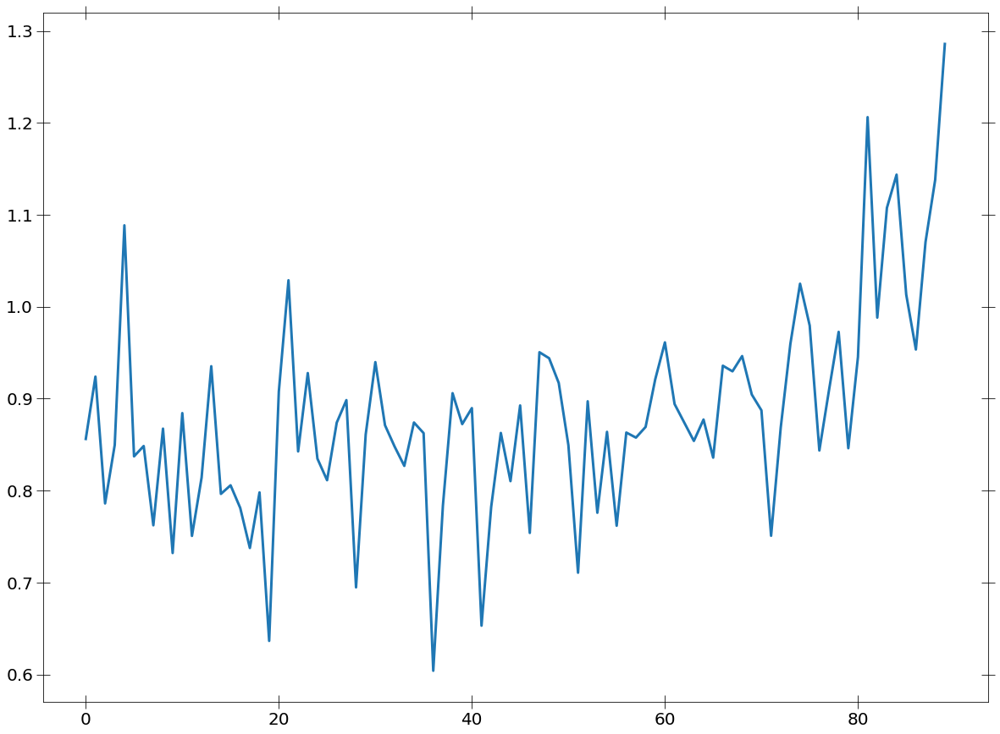

1:64: E225 missing whitespace around operator


In [50]:
plt.plot((np.array(acis_fit_stats_table_pl)[:, 1].astype(float)/
          np.array(acis_fit_stats_table_pl)[:, -1].astype(float))[candidadate_srcs_acis_args])

In [297]:
len(np.where(aic_pl_arr[0] < aic_pl_g3_arr[0] - 2)[0])


117

In [271]:
print(len(candidate_srcs_mos))
candidate_srcs_mos

66


array(['202026707015155', '204003401010008', '206556701010016',
       '206556701010040', '206946416010014', '208016803010003',
       '208860207010005', '202026707010160', '206043007010211',
       '206735502010030', '206735502010035', '206735502010047',
       '206735502010048', '206735502010049', '206735502010062',
       '206735502010080', '206735502010100', '206946409010023',
       '206946410010029', '208016804010004', '201129715010017',
       '204003401010007', '208016813010003', '201529201010011',
       '202026707010169', '202026707010179', '202026707010221',
       '202026707010240', '202026707010278', '204105804010009',
       '205049406010006', '206586001010095', '206586001010113',
       '206586001010146', '206735502010018', '206735502010024',
       '205100104010002', '206946401010003', '208860108010001',
       '202026707010062', '202026707010124', '202026707015191',
       '201129707010063', '202026707010170', '202026707010181',
       '207234104010049', '2010326130100

In [302]:
print(len(candidate_srcs_acis))
np.sort(candidate_srcs_acis)

157


array(['2CXOJ174405.3-292031', '2CXOJ174429.4-285531',
       '2CXOJ174431.9-290508', '2CXOJ174433.0-284426',
       '2CXOJ174442.9-292048', '2CXOJ174454.1-285841',
       '2CXOJ174457.4-285020', '2CXOJ174502.3-285449',
       '2CXOJ174503.8-290051', '2CXOJ174505.4-285934',
       '2CXOJ174507.0-290357', '2CXOJ174508.6-285652',
       '2CXOJ174508.6-285939', '2CXOJ174511.8-290032',
       '2CXOJ174512.3-285901', '2CXOJ174512.8-290340',
       '2CXOJ174513.9-285916', '2CXOJ174514.1-285425',
       '2CXOJ174515.0-285914', '2CXOJ174515.1-290016',
       '2CXOJ174515.7-290222', '2CXOJ174516.1-290425',
       '2CXOJ174516.7-290407', '2CXOJ174518.6-290010',
       '2CXOJ174520.2-291044', '2CXOJ174520.3-290634',
       '2CXOJ174520.5-290501', '2CXOJ174521.2-290652',
       '2CXOJ174521.3-285953', '2CXOJ174523.8-290653',
       '2CXOJ174524.3-285705', '2CXOJ174525.2-285404',
       '2CXOJ174526.8-285926', '2CXOJ174526.8-290702',
       '2CXOJ174527.5-290513', '2CXOJ174527.6-290423',
       '2C

In [51]:
def arr_to_str(arr, type='name'):
    string = ''
    for element in arr:
        if type == 'name':
            element = element.split('J')[0] + ' J' + element.split('J')[1]
        string += str(element) + '; '
    return string[:-2]

In [220]:
interested_srcs_xmm = np.array(list(set(interested_srcs_alldet_1s[0]) | set(interested_srcs_alldet_1s[1])))

In [221]:
len(interested_srcs_xmm)

171

In [219]:
len(candidate_srcs_acis)

59

In [215]:
candidate_srcs_xmm = np.array(list(set(candidate_srcs_pn) | set(candidate_srcs_mos)))

In [74]:
arr_to_str(candidate_srcs_acis, type='name')

'2CXO J174508.6-285939; 2CXO J174511.8-290032; 2CXO J174513.9-285916; 2CXO J174515.0-285914; 2CXO J174516.1-290425; 2CXO J174520.3-290634; 2CXO J174524.3-285705; 2CXO J174525.2-285404; 2CXO J174526.8-290702; 2CXO J174527.5-290513; 2CXO J174529.4-290647; 2CXO J174530.4-290605; 2CXO J174535.0-285326; 2CXO J174540.1-285508; 2CXO J174541.0-290706; 2CXO J174541.7-290028; 2CXO J174545.0-285557; 2CXO J174545.4-290613; 2CXO J174547.9-285440; 2CXO J174551.2-285827; 2CXO J174557.5-285341; 2CXO J174600.5-285450; 2CXO J174601.7-290241; 2CXO J174601.8-285828; 2CXO J174604.1-285642; 2CXO J174605.2-285656; 2CXO J174607.7-285802; 2CXO J174608.0-285852; 2CXO J174611.0-290159; 2CXO J174508.6-285652; 2CXO J174512.3-285901; 2CXO J174514.1-285425; 2CXO J174520.5-290501; 2CXO J174521.2-290652; 2CXO J174533.6-285930; 2CXO J174535.7-290004; 2CXO J174538.7-290133; 2CXO J174539.3-285538; 2CXO J174539.5-290039; 2CXO J174540.2-285922; 2CXO J174540.3-290049; 2CXO J174543.2-290146; 2CXO J174544.2-285918; 2CXO J1745

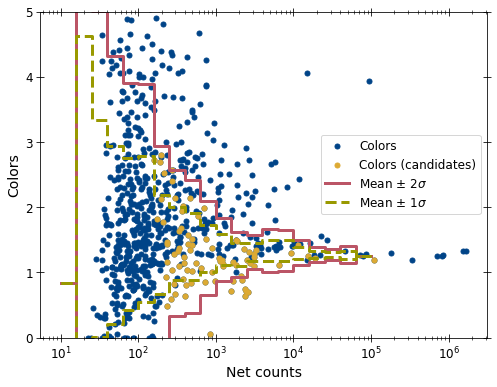

2:22: E128 continuation line under-indented for visual indent
2:80: E501 line too long (83 > 79 characters)
3:22: E128 continuation line under-indented for visual indent


In [202]:
test = mark_interested_srcs(sim_color_dict_arr[0], obs_color_dict_arr[0],
                     spec_summary['src_nums'][0], spec_summary['spec_masks'][1][0],
                     candidate_srcs_pn, 0)

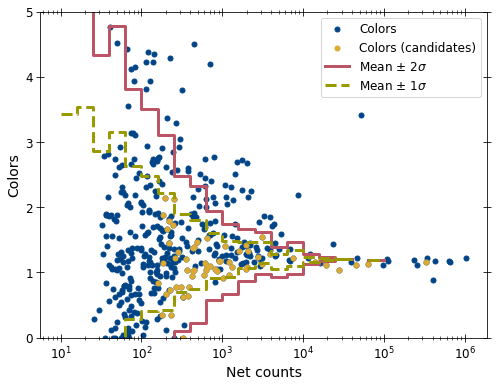

2:80: E501 line too long (83 > 79 characters)


In [201]:
mark_interested_srcs(sim_color_dict_arr[1], obs_color_dict_arr[1],
                     spec_summary['src_nums'][0], spec_summary['spec_masks'][1][1],
                     candidate_srcs_mos, 0)

In [137]:
set_plotparams('presentation')

In [198]:
len(candidate_srcs_acis)

59

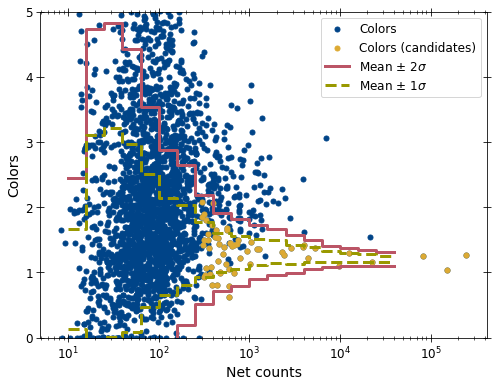

2:80: E501 line too long (83 > 79 characters)


In [197]:
mark_interested_srcs(sim_color_dict_arr[2], obs_color_dict_arr[2],
                     spec_summary['src_nums'][1], spec_summary['spec_masks'][1][2],
                     candidate_srcs_acis, 0)

(array([  5,   8,  13,  26,  32,  53,  60,  65,  91,  94, 101, 104, 106,
       155, 157, 164, 168, 178, 183, 195, 212, 236, 242, 243, 274, 275,
       278, 279, 280, 281, 282, 283, 288, 322, 344, 356, 366, 367, 387,
       392, 394, 402, 404, 405, 418, 421, 423, 424, 425, 479, 481, 487,
       490, 503, 504, 522, 535, 536, 537, 538, 539, 541, 542, 543, 544,
       545, 548, 550, 551, 557, 568, 586, 604, 628, 630, 632, 635, 636,
       648, 660, 661, 692, 698, 722, 735, 740]),)
['200305401015015' '201032613010002' '201113501010117' '201129701010028'
 '201129702010002' '201129704010031' '201129704010056' '201129705010011'
 '201129707010018' '201129707010031' '201129707010046' '201129707010057'
 '201129707010063' '201129721010057' '201129721010060' '201129721010133'
 '201442201010001' '201529201010060' '202026705010003' '202026707010271'
 '203017301010002' '203032102010002' '204003401010007' '204003401010008'
 '205100104010002' '205100104010019' '205110012010001' '205110012010017'
 '2051

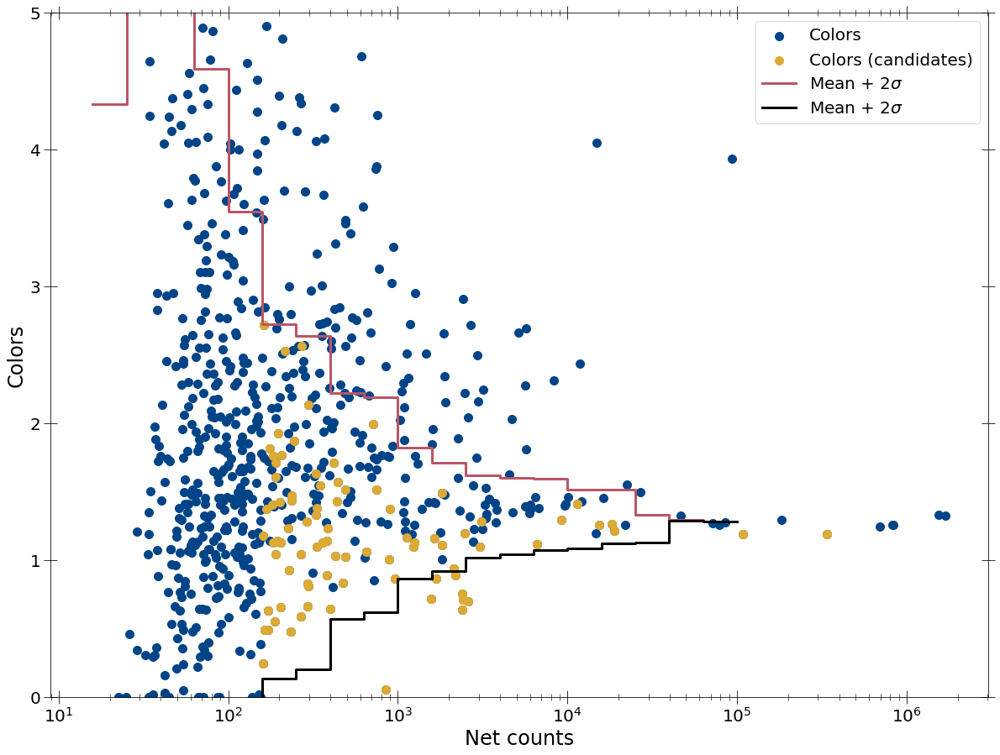

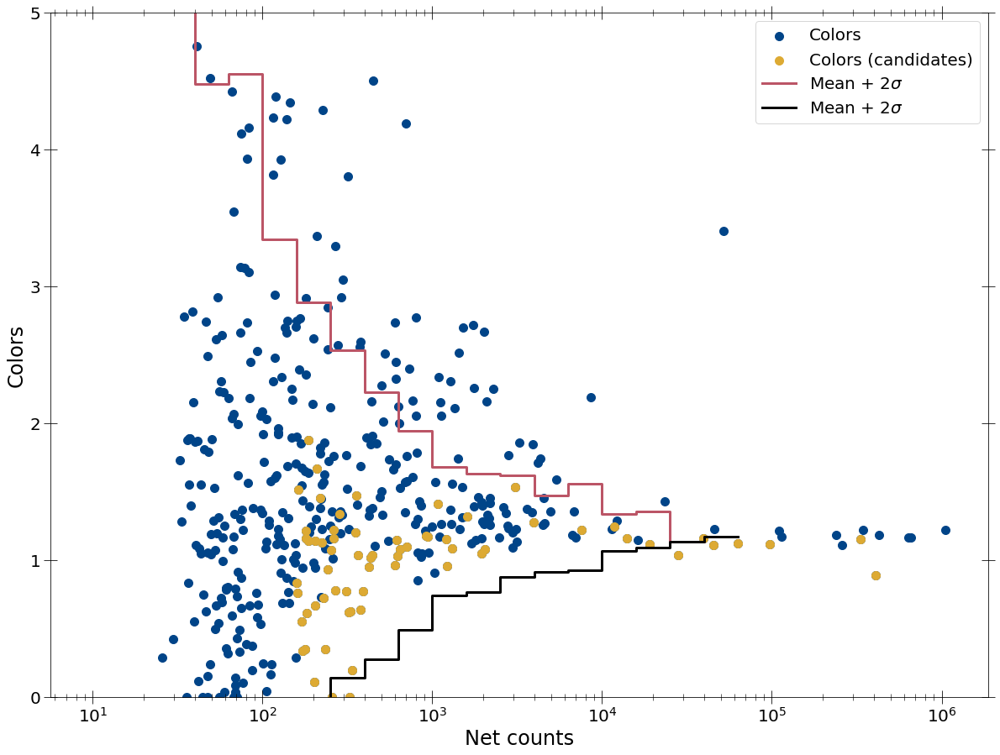

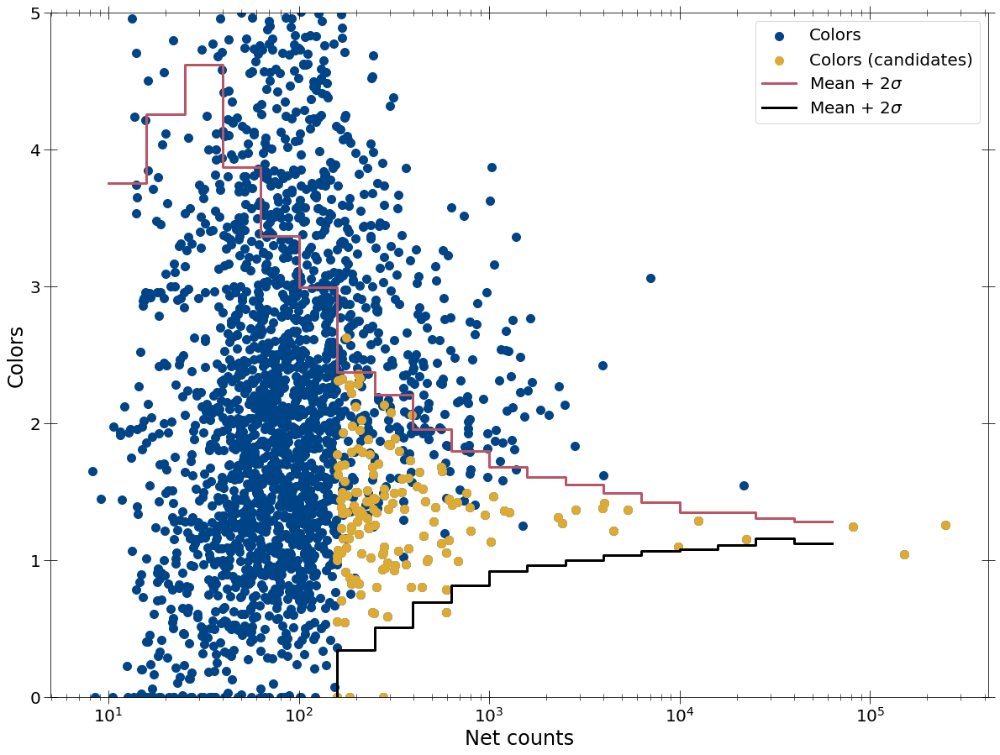

1:80: E501 line too long (82 > 79 characters)
2:80: E501 line too long (83 > 79 characters)
4:80: E501 line too long (82 > 79 characters)
5:80: E501 line too long (83 > 79 characters)
7:80: E501 line too long (82 > 79 characters)
8:80: E501 line too long (83 > 79 characters)


In [276]:
mark_interested_srcs(sim_color_dict_arr_clipped[0], obs_color_dict_arr_clipped[0],
                     spec_summary['src_nums'][0], spec_summary['spec_masks'][1][0],
                     candidate_srcs_pn, 0)
mark_interested_srcs(sim_color_dict_arr_clipped[1], obs_color_dict_arr_clipped[1],
                     spec_summary['src_nums'][0], spec_summary['spec_masks'][1][1],
                     candidate_srcs_mos, 0)
mark_interested_srcs(sim_color_dict_arr_clipped[2], obs_color_dict_arr_clipped[2],
                     spec_summary['src_nums'][1], spec_summary['spec_masks'][1][2],
                     candidate_srcs_acis, 0)

In [169]:
np.where(interested_srcs_alldet[2] == '2CXOJ174534.3-290231')

(array([], dtype=int64),)

In [285]:
print(acis_fit_stats_table_pl[125])
print(acis_fit_stats_table_pl_g[125])
print(acis_fit_stats_table_pl_g2[125])
print()
print(acis_fit_stats_table_pl[208])
print(acis_fit_stats_table_pl_g[208])
print(acis_fit_stats_table_pl_g2[208])
print()
print(acis_fit_stats_table_pl[133])
print(acis_fit_stats_table_pl_g[133])
print(acis_fit_stats_table_pl_g2[133])
print()
print(acis_fit_stats_table_pl[46])
print(acis_fit_stats_table_pl_g[46])
print(acis_fit_stats_table_pl_g2[46])
print()
print(acis_fit_stats_table_pl[88])
print(acis_fit_stats_table_pl_g[88])
print(acis_fit_stats_table_pl_g2[88])
print()
print(acis_fit_stats_table_pl[188])
print(acis_fit_stats_table_pl_g[188])
print(acis_fit_stats_table_pl_g2[188])

['2CXOJ174540.3-290049', 266.01879656001785, -7.589646752720701, 50.0, 299]
['2CXOJ174540.3-290049', 264.6833556689429, -7.805990677928118, 50.0, 297]
['2CXOJ174540.3-290049', 263.92879916841827, -7.8578460350119865, 50.0, 296]

['2CXOJ174536.9-290039', 344.5620739732016, -9.526574126034008, 50.0, 389]
['2CXOJ174536.9-290039', 341.77998992125424, -9.871299609625027, 50.0, 387]
['2CXOJ174536.9-290039', 340.80402348470886, -9.916018231068454, 50.0, 386]

['2CXOJ174535.7-290004', 219.3432290242929, -8.32886982476195, 50.0, 254]
['2CXOJ174535.7-290004', 216.10212421697082, -8.175803506918273, 50.0, 252]
['2CXOJ174535.7-290004', 216.40324068904283, -8.163633107538715, 50.0, 251]

['2CXOJ174543.2-290003', 168.34505326473322, -7.38207827477904, 50.0, 262]
['2CXOJ174543.2-290003', 166.74607251218066, -7.295869408022453, 50.0, 260]
['2CXOJ174543.2-290003', 167.088320724579, -7.364177348527165, 50.0, 259]

['2CXOJ174535.0-285757', 140.70723931932093, -7.684272731913274, 50.0, 193]
['2CXOJ174535.

In [157]:
print(acis_model_params_table_pl_g2[125])
print(acis_model_params_table_pl_g2[208])
print(acis_model_params_table_pl_g2[133])
print(acis_model_params_table_pl_g2[46])
print(acis_model_params_table_pl_g2[88])
print(acis_model_params_table_pl_g2[188])

['2CXOJ174540.3-290049', 14.747172266857492, 2.284559245444103, 0.014014393023623173, 3.157876082859608e-08, 1.936457506907927e-08, 4.298694332175304e-19, 0.0, 8.242343569531286e-08, 0.0, 7.391659902986237e-08, 0.0, 3.2311902308687976e-08]
['2CXOJ174536.9-290039', 32.91698126831548, 2.169538475539656, 0.13824128530453256, 5.4557158152566107e-14, 1.4314730567579634e-07, 7.4035496908206e-08, 0.0, 1.1265319696324751e-07, 0.0, 3.059586290967107e-07, 0.0, 2.3806088884467742e-07]
['2CXOJ174535.7-290004', 25.294693190701558, 1.6423470508550815, 0.040934446317875135, 8.531655806100725e-08, 3.5908650704885276e-08, 1.1327547386683504e-08, 0.0, 1.9846436077281447e-07, 0.0, 1.5934190141787257e-07, 0.0, 1.3669784512889456e-07]
['2CXOJ174543.2-290003', 57.451790453056155, 4.999999999999999, 0.3025621014701397, 6.405396701097331e-22, 1.716821005151346e-19, 1.2932393486615652e-07, 0.0, 1.4473062790960989e-07, 0.0, 2.977575924227808e-07, 0.0, 3.5802429139269943e-07]
['2CXOJ174535.0-285757', 16.72445583

(array([ 200,  692,  806,  990, 1051, 1199, 1665, 1685, 1702]),)
['2CXOJ174534.3-290231' '2CXOJ174546.2-290003' '2CXOJ174538.1-290319'
 '2CXOJ174535.7-290004' '2CXOJ174543.2-290003' '2CXOJ174532.9-290110'
 '2CXOJ174535.0-285757' '2CXOJ174527.8-290210' '2CXOJ174544.1-285940']
[176.43000154  68.51315789 148.93362531 333.82959801 176.07171884
  69.72756558 160.74684514 452.65052956  15.82249253]
[2.8743079         inf 0.88800633 1.79911604 0.7109796  2.33402784
 1.63259623 1.30960658        inf]


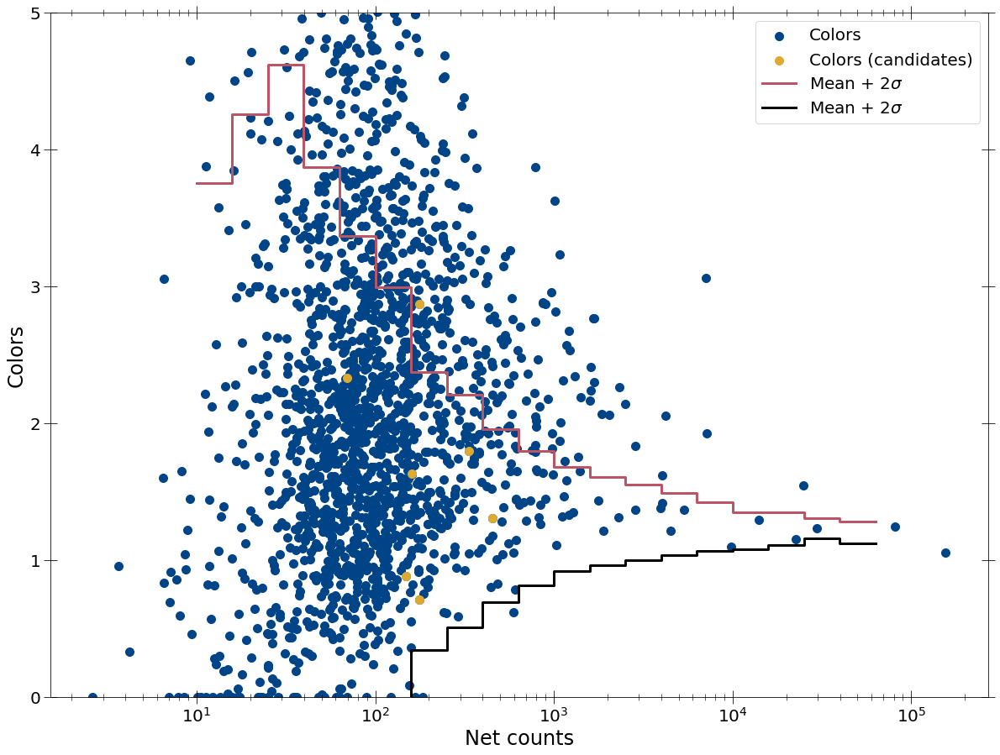

2:80: E501 line too long (83 > 79 characters)


In [168]:
mark_interested_srcs(sim_color_dict_arr[2], obs_color_dict_arr[2],
                     spec_summary['src_nums'][1], spec_summary['spec_masks'][1][2],
                     ['2CXOJ174543.2-290003', '2CXOJ174535.7-290004',
                      '2CXOJ174544.1-285940', '2CXOJ174546.2-290003',
                      '2CXOJ174532.9-290110', '2CXOJ174534.3-290231',
                      '2CXOJ174535.0-285757', '2CXOJ174538.1-290319', '2CXOJ174527.8-290210'], 0)

(array([ 678,  840,  990, 1335]),)
['2CXOJ174540.3-290049' '2CXOJ174536.9-290039' '2CXOJ174535.7-290004'
 '2CXOJ174536.1-285638']
[ 309.98665049 1113.49755019  333.82959801 7063.35067975]
[1.41798004 1.31906731 1.79911604 3.06266218]


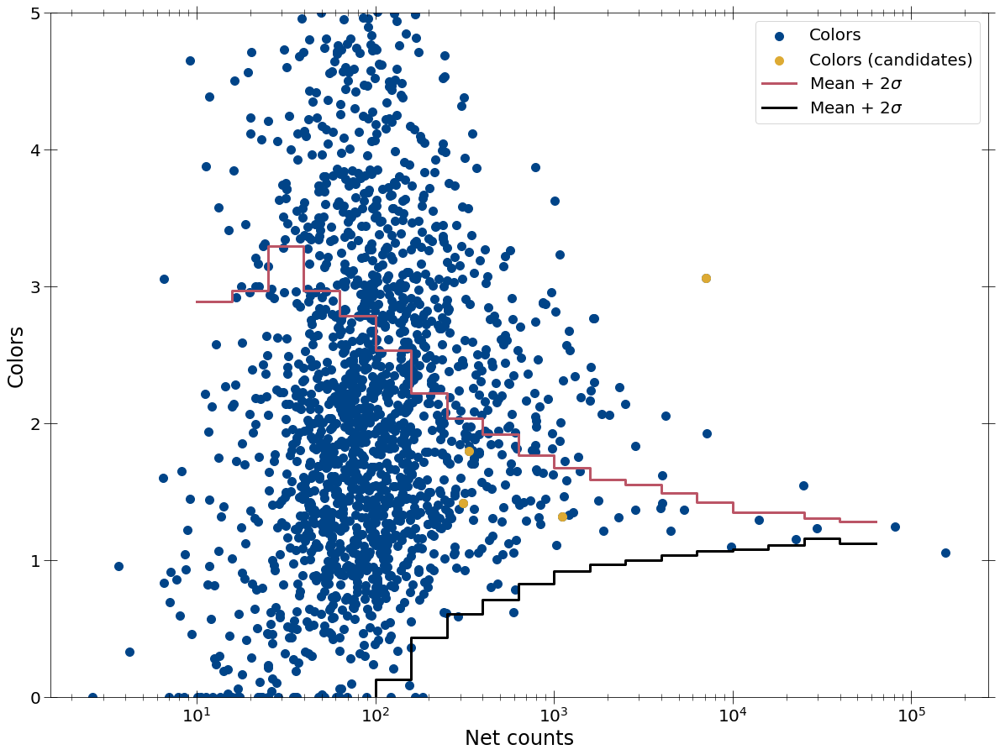

1:80: E501 line too long (82 > 79 characters)
2:80: E501 line too long (83 > 79 characters)


In [167]:
mark_interested_srcs(sim_color_dict_arr_clipped[2], obs_color_dict_arr_clipped[2],
                     spec_summary['src_nums'][1], spec_summary['spec_masks'][1][2],
                     ['2CXOJ174540.3-290049', '2CXOJ174536.9-290039',
                      '2CXOJ174535.7-290004', '2CXOJ174536.1-285638',
                      '2CXOJ174532.7-285616', '2CXOJ174610.5-285550'], 0)

In [289]:
np.savetxt('ACIS_interested_plmodels.txt', acis_model_params_table_pl, fmt='%s')
np.savetxt('ACIS_interested_g2models.txt', acis_model_params_table_pl_g2, fmt='%s')

1:80: E501 line too long (80 > 79 characters)


In [80]:
len(spec_summary['counts'][0][2][1])

2697

In [102]:
def get_candidate_int_ratio(candidate_args, interested_args, spec_num,
                            plot=True):
    candidate_netcounts = spec_summary['counts'][0][spec_num][1][
        spec_summary['spec_masks'][1][spec_num]][interested_args][
            candidate_args]
    interested_netcounts = spec_summary['counts'][0][spec_num][1][
        spec_summary['spec_masks'][1][spec_num]][interested_args]
    candidate_hist, bins = np.histogram(candidate_netcounts,
                                        bins=sim_color_dict_arr[1][
                                            'prop_bins'][0])
    interested_hist, bins = np.histogram(interested_netcounts,
                                         bins=sim_color_dict_arr[1][
                                             'prop_bins'][0])
    if plot:
        plt.xlabel('Net counts')
        plt.xscale('log')
        plt.ylabel('Fraction')
        #plt.xlim(150)
        plt.errorbar(0.5*(bins[:-1]+bins[1:]), candidate_hist/interested_hist,
                     yerr=(((candidate_hist+1)**0.5/interested_hist) +
                            candidate_hist/interested_hist**2*(
                                interested_hist+1)**0.5))
        plt.ylim(0.0, 2.0)
    return candidate_hist, interested_hist, bins

18:9: E265 block comment should start with '# '
21:29: E127 continuation line over-indented for visual indent


/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in true_divide
/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide


(array([ 0,  0,  0,  0,  0,  0, 29, 23, 18,  7,  4,  2,  2,  3,  1,  0,  1,
         0,  0,  0]),
 array([  0,   0,   0,   0,   0,   0, 146,  67,  27,  15,   7,   2,   2,
          3,   1,   1,   1,   0,   0,   1]),
 array([1.00000000e+01, 1.58489319e+01, 2.51188643e+01, 3.98107171e+01,
        6.30957344e+01, 1.00000000e+02, 1.58489319e+02, 2.51188643e+02,
        3.98107171e+02, 6.30957344e+02, 1.00000000e+03, 1.58489319e+03,
        2.51188643e+03, 3.98107171e+03, 6.30957344e+03, 1.00000000e+04,
        1.58489319e+04, 2.51188643e+04, 3.98107171e+04, 6.30957344e+04,
        1.00000000e+05]))

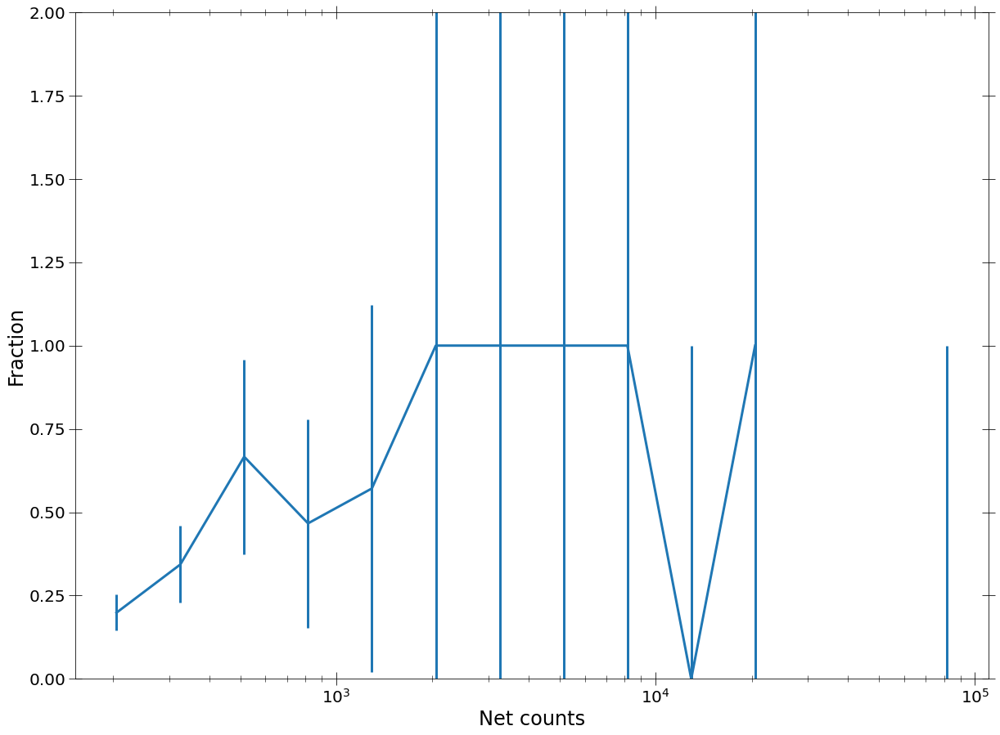

In [103]:
get_candidate_int_ratio(candidadate_srcs_acis_args, interested_args_alldet[2],
                        2, plot=True)

# Checking for low norm sources

In [277]:
acis_model_g2_arr = np.array(acis_model_params_table_pl_g2)
zero_norms_args = np.where(np.logical_and(np.logical_and(
    np.logical_or(
        acis_model_g2_arr[:, 7].astype(float) == 0,
        acis_model_g2_arr[:, 7].astype(float) >= acis_model_g2_arr[:, 4].astype(float)),
    np.logical_or(
        acis_model_g2_arr[:, 9].astype(float) == 0,
        acis_model_g2_arr[:, 9].astype(float) >= acis_model_g2_arr[:, 5].astype(float))),
    np.logical_or(
        acis_model_g2_arr[:, 11].astype(float) == 0,
        acis_model_g2_arr[:, 11].astype(float) >= acis_model_g2_arr[:, 6].astype(float))))[0]

5:80: E501 line too long (88 > 79 characters)
8:80: E501 line too long (89 > 79 characters)


In [278]:
high_norms_args = np.where(np.logical_or(np.logical_or(
    acis_model_g2_arr[:, 7].astype(float) >= acis_model_g2_arr[:, 4].astype(float),
    acis_model_g2_arr[:, 9].astype(float) >= acis_model_g2_arr[:, 5].astype(float)),
    acis_model_g2_arr[:, 11].astype(float) >= acis_model_g2_arr[:, 6].astype(float)))[0]

2:80: E501 line too long (83 > 79 characters)
3:80: E501 line too long (84 > 79 characters)


In [279]:
len(high_norms_args)

29

In [247]:
zero_norm_args = np.append(zero_norms_args.copy(), high_norms_args)

In [280]:
len(zero_norms_args)

144

In [281]:
np.min((aic_pl_g3_arr[2] - aic_pl_arr[2])[zero_norms_args])

0.8924075464469752

In [258]:
print(acis_fit_stats_table_pl[117])
print(acis_fit_stats_table_pl_g2[117])

['2CXOJ174601.1-285952', 273.95609098450296, -7.238976643444733, 50.0, 270]
['2CXOJ174601.1-285952', 250.28253432384366, -8.420395729866275, 50.0, 267]


In [259]:
print(acis_model_params_table_pl[117])
print(acis_model_params_table_pl_g2[117])

['2CXOJ174601.1-285952', 15.645019663669181, 0.551782037874522, 0.03696465499752591]
['2CXOJ174601.1-285952', 19.737789482731742, 1.5997676215429104, 0.0331508926935257, 1.6215554900609572e-07, 2.6901888734595366e-07, 2.995211254045239e-08, 5.937151313098362e-08, 2.905464964537258e-07, 1.33223904033065e-07, 4.348939115214157e-07, 0.0, 1.7693666605934802e-07]


In [282]:
print(len(np.where(aic_pl_arr[2] < aic_pl_g3_arr[2])[0]))
print(len(np.where(aic_pl_arr[2] < aic_pl_g3_arr[2] - 1.39)[0]))
print(len(np.where(aic_pl_arr[2] < aic_pl_g3_arr[2] - 3.0)[0]))
print(len(np.where(aic_pl_arr[2] < aic_pl_g3_arr[2] - 4.0)[0]))
print(len(np.where(aic_pl_arr[2] < aic_pl_g3_arr[2] - 4.605)[0]))

199
164
132
102
85


In [286]:
print(len(np.where(aic_pl_arr[2][zero_norms_args] < aic_pl_g3_arr[2][zero_norms_args])[0]))
print(len(np.where(aic_pl_arr[2][zero_norms_args] < aic_pl_g3_arr[2][zero_norms_args] - 1.0)[0]))
print(len(np.where(aic_pl_arr[2][zero_norms_args] < aic_pl_g3_arr[2][zero_norms_args] - 3.0)[0]))
print(len(np.where(aic_pl_arr[2][zero_norms_args] < aic_pl_g3_arr[2][zero_norms_args] - 4.0)[0]))
print(len(np.where(aic_pl_arr[2][zero_norms_args] < aic_pl_g3_arr[2][zero_norms_args] - 4.605)[0]))

1:80: E501 line too long (91 > 79 characters)
2:80: E501 line too long (97 > 79 characters)
3:80: E501 line too long (97 > 79 characters)
4:80: E501 line too long (97 > 79 characters)


144
143
127
102
85


In [281]:
zero_norms_args

array([  0,   1,   3,   4,  10,  12,  13,  16,  17,  18,  19,  20,  24,
        27,  31,  32,  33,  34,  37,  38,  39,  43,  45,  46,  47,  48,
        51,  53,  54,  56,  59,  61,  62,  65,  67,  68,  70,  73,  74,
        76,  77,  80,  82,  83,  84,  85,  87,  88,  89,  90,  91,  93,
        94,  95,  97,  99, 100, 103, 104, 106, 107, 109, 115, 119, 121,
       123, 124, 125, 128, 129, 130, 132, 133, 134, 136, 139, 141, 143,
       144, 146, 148, 149, 150, 156, 158, 160, 162, 164, 166, 167, 168,
       171, 173, 175, 177, 178, 180, 181, 182, 183, 184, 185, 188, 189,
       190, 191, 193, 195, 197, 198, 199, 200, 203, 208, 209, 210, 212,
       213, 214, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226,
       227])

In [284]:
acis_model_g2_arr[219]

array(['2CXOJ174535.5-290124', '30.35200191082754', '1.4425701490713667',
       '0.47630799807558655', '1.89602805783651e-08',
       '2.8201094011909062e-24', '7.408528059108422e-24', '0.0',
       '2.3455091875304955e-07', '0.8224962005991274', '0.0',
       '0.8224962005991274', '0.0'], dtype='<U32')

In [282]:
np.where(np.logical_and(aic_pl_arr[2] < aic_pl_g3_arr[2] - 3.0,
                        acis_model_g2_arr[:, 11].astype(float) != 0))[0]

array([  3,   4,  17,  19,  27,  97, 109, 113, 132, 162, 178, 190, 191,
       219, 223, 224, 225, 226, 227])

/Users/pavanrh/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in true_divide
  """Entry point for launching an IPython kernel.


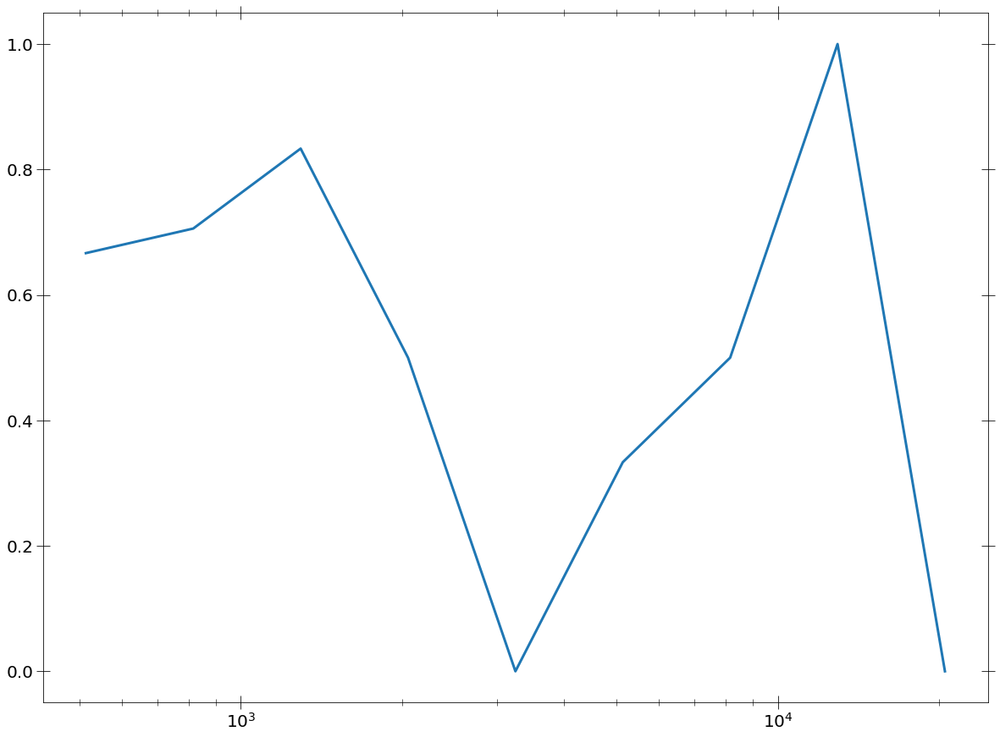

In [451]:
plt.plot(0.5*(bins[1:] + bins[:-1]), candidate_hist/interested_hist)
plt.xscale('log')

In [441]:
len(sim_color_dict_arr[0]['prop_bins'][0])

21

In [452]:
candidate_hist

array([ 0,  0,  0,  0,  0,  0,  0,  0, 12, 12,  5,  1,  0,  1,  1,  3,  0,
        0,  0,  0])

In [453]:
interested_hist

array([ 0,  0,  0,  0,  0,  0,  0,  0, 18, 17,  6,  2,  1,  3,  2,  3,  2,
        0,  0,  0])

In [449]:
bins

array([1.00000000e+01, 1.58489319e+01, 2.51188643e+01, 3.98107171e+01,
       6.30957344e+01, 1.00000000e+02, 1.58489319e+02, 2.51188643e+02,
       3.98107171e+02, 6.30957344e+02, 1.00000000e+03, 1.58489319e+03,
       2.51188643e+03, 3.98107171e+03, 6.30957344e+03, 1.00000000e+04,
       1.58489319e+04, 2.51188643e+04, 3.98107171e+04, 6.30957344e+04,
       1.00000000e+05])

In [454]:
fit_stats_pl_arr = np.array(mos_fit_stats_table_pl)
fit_stats_pl_gauss_arr = np.array(mos_fit_stats_table_pl_g)

aic_pl = fit_stats_pl_arr[:, 1].astype(float) + 6
aic_pl_gauss = fit_stats_pl_gauss_arr[:, 1].astype(float) + 10

candidate_args = interested_args_alldet[1][np.where(aic_pl > aic_pl_gauss)]
candidate_netcounts = spec_summary['counts'][0][1][1][spec_summary['spec_masks'][1][4]][candidate_args]
interested_netcounts = spec_summary['counts'][0][1][1][spec_summary['spec_masks'][1][4]][interested_args_alldet[1]]

candidate_hist, bins = np.histogram(candidate_netcounts, bins=sim_color_dict_arr[1]['prop_bins'][0])
interested_hist, bins = np.histogram(interested_netcounts, bins=sim_color_dict_arr[1]['prop_bins'][0])

IndexError: index 38 is out of bounds for axis 0 with size 38

8:80: E501 line too long (103 > 79 characters)
9:80: E501 line too long (115 > 79 characters)
11:80: E501 line too long (100 > 79 characters)


In [455]:
len(fit_stats_pl_arr)

57

In [456]:
len(mos_fit_stats_table_pl)

57

In [459]:
np.sort(interested_srcs_alldet[0])

array(['201113501010010', '201113501010035', '201113501010066',
       '201113501010154', '201113501010169', '201113503010004',
       '201129701010011', '201129701010015', '201129701010027',
       '201129701010041', '201129702010002', '201129704010011',
       '201129704010019', '201129704010027', '201129705010011',
       '201129705010015', '201129705010038', '201129705010067',
       '201129705010076', '201129705010079', '201129705015062',
       '201129706010014', '201129707010012', '201129707010063',
       '201129707010079', '201129709010024', '201129715010041',
       '201129719010010', '201129721010003', '201129721010009',
       '201129721010014', '201129721010022', '201129721010034',
       '201129721010035', '201129721010044', '201129721010057',
       '201129721010060', '201129721010063', '201129721010070',
       '201129721010078', '201129721010126', '201129721010133',
       '201129721015131', '202026705010034', '202026705010109',
       '202026708010021', '2030321020100

In [460]:
np.sort(interested_srcs_alldet[1])

array(['200305402010002', '201113501010010', '201113501010069',
       '201113501010114', '201113503010004', '201129701010035',
       '201129702010002', '201129704010048', '201129705010011',
       '201129705010014', '201129705010024', '201129705010067',
       '201129705010079', '201129705010095', '201129705015062',
       '201129706010014', '201129707010063', '201129708010036',
       '201129719010010', '201129721010003', '201129721010005',
       '201129721010014', '201129721010022', '201129721010034',
       '201129721010045', '201129721010053', '201129721010057',
       '201129721010060', '201129721010075', '201129721010138',
       '202026705010053', '204105804015018', '206556701010012',
       '206556701010019', '206946404010008', '207641904010001',
       '208016803010001', '208251401010006'], dtype=object)

In [69]:
def get_candidate_src_nums_det2(obs_src_nums, obs_det_mask, sim_color_dict,
                               obs_color_dict, min_counts):
    """Get src nums of quiescent sources for given detector"""
    obs_netcounts = obs_color_dict['prop_list'][0]
    netcount_bins = sim_color_dict['prop_bins'][0]
    obs_colors = obs_color_dict['colors']
    color_median = sim_color_dict['color_stat'][0][0]
    color_std = sim_color_dict['color_stat'][2][0]
    interested_args = []
    interested_srcs = []
    for i, lower_bin in enumerate(netcount_bins):
        if lower_bin < min_counts:
            continue
        if i == len(netcount_bins) - 1:
            upper_bin = np.max(obs_netcounts) + 10
            median_color = color_median[-1]
            std_color = color_std[-1]
        else:
            upper_bin = netcount_bins[i+1]
            median_color = color_median[i]
            std_color = color_std[i]
        if np.isnan(median_color) or np.isnan(std_color):
                    int_args = np.where(np.logical_and(
                        obs_netcounts >= lower_bin,
                        obs_netcounts < upper_bin))
        else:
        
            int_args = np.where(np.logical_and(
                np.logical_and(obs_netcounts >= lower_bin,
                               obs_netcounts < upper_bin),
                obs_colors < median_color + 2*std_color))[0]
        '''
        int_args = np.where(np.logical_and(
                np.logical_and(obs_netcounts >= lower_bin,
                               obs_netcounts < upper_bin),
                obs_colors < median_color + 2*std_color))[0]
        '''
        print(obs_netcounts[int_args])
        interested_args.append(int_args)
        interested_srcs.append(obs_src_nums[obs_det_mask][int_args])
    return interested_args, interested_srcs


def get_candidate_src_nums_alldet2(spec_summary, sim_color_dict_arr,
                                  obs_color_dict_arr, min_count_arr=None):
    """Get source nums for all detectors."""
    interested_args_alldet = []
    interested_sources_alldet = []
    if min_count_arr is None:
        min_count_arr = [700, 700, 250]
    for i, obs_color_dict in enumerate(obs_color_dict_arr):
        if i > 0:
            interested_args, interested_srcs = get_candidate_src_nums_det2(
                spec_summary['src_nums'][i-1], spec_summary['spec_masks'][1][i],
                sim_color_dict_arr[i], obs_color_dict, min_count_arr[i])
        else:
            interested_args, interested_srcs = get_candidate_src_nums_det2(
            spec_summary['src_nums'][i], spec_summary['spec_masks'][1][i],
            sim_color_dict_arr[i], obs_color_dict, min_count_arr[i])
        interested_args_alldet.append(interested_args)
        interested_sources_alldet.append(interested_srcs)
    return interested_args_alldet, interested_sources_alldet


2:32: E128 continuation line under-indented for visual indent
23:21: E117 over-indented
27:1: W293 blank line contains whitespace
45:35: E128 continuation line under-indented for visual indent
54:80: E501 line too long (80 > 79 characters)
58:13: E122 continuation line missing indentation or outdented
59:13: E122 continuation line missing indentation or outdented


In [70]:
test_args, test_srcs = get_candidate_src_nums_alldet2(spec_summary, sim_color_dict_arr, obs_color_dict_arr,
                                                      min_count_arr=[380, 380, 220])

[569.59489915 404.91355624 452.26180445 465.79990524 576.32276827
 493.39928098 487.52737681 463.48454887 513.71340716 539.95700063
 612.30372428 609.93432573 398.9688382  574.42562696 508.04667046
 592.28189506 435.03011623 522.26141993]
[652.69197128 823.33408827 792.69706455 674.18975953 876.79367389
 679.04689138 739.16724045 845.56868658 723.70611642 845.86782834
 764.06300906 648.50489117 711.53733848 864.90478044 817.363117
 923.15858478 648.64365916 797.95791783]
[1536.6024365  1114.66782348 1422.7130562  1291.96679205 1584.24987616
 1222.55308145]
[1989.78879578 2448.29069852]
[3333.91840967]
[5906.66947885 4300.15059039 5076.11064059]
[8272.89976422 7040.72877535]
[10372.3500844  14301.84303534 13285.45941   ]
[23304.51640767 18219.60240603]
[]
[]
[]
[ 736611.79761745  418037.54709113 2024254.48411136]
[608.05064636 440.51106749 493.03633815 438.03845112 598.07676261
 443.31577824 586.65762292 507.54544255 433.71040735 542.88105163
 402.12852783]
[743.55291637 648.44849731 71

1:80: E501 line too long (107 > 79 characters)


In [44]:
test_srcs

[[array(['201113501010066', '201113501010154', '201129701010015',
         '201129704010011', '201129704010019', '201129704010027',
         '201129707010012', '201129707010063', '201129709010024',
         '201129715010041', '201129721010070', '201129721010126',
         '204003401010007', '204105804010005', '206556701010012',
         '208016803010001', '208016813010003', '208251401010006'],
        dtype=object),
  array(['201113501010169', '201129701010011', '201129701010027',
         '201129701010041', '201129704010048', '201129705010015',
         '201129705010038', '201129705010067', '201129705015062',
         '201129721010022', '201129721010035', '201129721010057',
         '201129721010133', '202026705010109', '202026708010021',
         '205547504010092', '206946402010009', '207641904010001'],
        dtype=object),
  array(['201113501010035', '201129707010079', '201129721010063',
         '201129721010078', '201129721015131', '202026705010034'],
        dtype=object),
  ar

In [93]:
def combine_spec_analysis(int_srcs_list, source_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    spec_list = []
    for source_num in int_srcs_list:
        if telescope == 'XMM':
            spec_pnfile = glob2.glob('./Galactic_highNH_combinedXMM/' +
                                     str(source_num) + '_PN_combined_src_grp1*')
            spec_mosfile = glob2.glob('./Galactic_highNH_combinedXMM/' +
                                      str(source_num) + '_MOS_combined_src_grp1*')
            if len(spec_pnfile) > 0:
                spec_pn = xspec.Spectrum(spec_pnfile[0])
                spec_pn.ignore('0.0-2.0, 10.0-**')
                spec_pn.notice('2.0-10.0')
                spec_list.append(spec_pn)
                print(spec_pn.rate[0]*spec_pn.exposure)
            if len(spec_mosfile) > 0:
                spec_mos = xspec.Spectrum(spec_mosfile[0])
                spec_mos.ignore('0.0-2.0, 10.0-**')
                spec_pn.notice('2.0-10.0')
                spec_list.append(spec_mos)
                print(spec_mos.rate[0]*spec_mos.exposure)
        elif telescope == 'Chandra':
            os.chdir(src_folder + '/' + source_num)
            spec_file = str(source_num) + '_combined_src_grp1.pi'
            spec = xspec.Spectrum(spec_file)
            spec.ignore('0.0-2.0, 10.0-**')
            spec.notice('2.0-10.0')
            os.chdir(curr_dir)
        else:
            print('Telescope not recognized.')
    
    model = xspec.Model('tbabs*pegpwrlw')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 5, 5]
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.perform()
    xspec.Fit.error('2.706 2')
    xspec.Fit.perform()
    #goodness = xspec.Fit.goodness(1000)
    goodness = 50.0
    
    xspec.Plot.device = '/xw'
    xspec.Plot.xAxis = 'keV'
    xspec.Plot.yLog = True
    xspec.Plot.setRebin(2, 1000, -1)
    xspec.Plot()
    print('Model params: '
          'NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0])
    print('Fit stats : ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    if telescope == 'Chandra':
        os.chdir(curr_dir)
    return ([int_srcs_list, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [int_srcs_list, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0]])

10:80: E501 line too long (80 > 79 characters)
12:80: E501 line too long (82 > 79 characters)
34:1: W293 blank line contains whitespace
44:5: E265 block comment should start with '# '
46:1: W293 blank line contains whitespace
61:80: E501 line too long (83 > 79 characters)


In [95]:
combine_spec_analysis(test_srcs[0][1])

654.4603630490105
824.1378576545412
716.8100536050601
795.4471140394922
220.3010253394772
673.1919534877306
806.0406733582817
877.330611434544
949.5044931691929
681.247948793877
162.2880763393362
736.751589007554
349.2025802477865
841.2293566233209
680.7494567901176
725.3070590144457
844.6655306385417
845.6103149179244
2153.566380181197
764.2810261818187
642.8417595934877
1078.7955794357108
711.3929357221539
864.5409737688612
113.31528293446061
815.8800274223036
923.4042521844088
74.37753238277094
649.1042695369483
797.4801613279265
586.9997543090454
Model params: NH =  13.231711938962313  Gamma:  0.9200176939172249  norm:  0.1632279364041732
Fit stats :  32184.51283053665 -6.530554835870103 50.0 29932




([array(['201113501010169', '201129701010011', '201129701010027',
         '201129701010041', '201129704010048', '201129705010015',
         '201129705010038', '201129705010067', '201129705015062',
         '201129721010022', '201129721010035', '201129721010057',
         '201129721010133', '202026705010109', '202026708010021',
         '205547504010092', '206946402010009', '207641904010001'],
        dtype=object),
  32184.51283053665,
  -6.530554835870103,
  50.0,
  29932],
 [array(['201113501010169', '201129701010011', '201129701010027',
         '201129701010041', '201129704010048', '201129705010015',
         '201129705010038', '201129705010067', '201129705015062',
         '201129721010022', '201129721010035', '201129721010057',
         '201129721010133', '202026705010109', '202026708010021',
         '205547504010092', '206946402010009', '207641904010001'],
        dtype=object),
  13.231711938962313,
  0.9200176939172249,
  0.1632279364041732])

In [88]:
spec_summary['counts'][0][0][1][spec_summary['spec_masks'][1][0]][test_args[0][0]]

array([569.59489915, 404.91355624, 452.26180445, 465.79990524,
       576.32276827, 493.39928098, 487.52737681, 463.48454887,
       513.71340716, 539.95700063, 612.30372428, 609.93432573,
       398.9688382 , 574.42562696, 508.04667046, 592.28189506,
       435.03011623, 522.26141993])

In [80]:
spec_summary['counts'][0][1][1][spec_summary['spec_masks'][1][0]][test_args[0][0]]

array([  77.06422098,  169.29402981,   80.75597502,  287.22584027,
        117.51882974,  131.66078883,   62.82256871,  493.03633815,
        226.05028649,  204.3105431 ,  115.47278273, -167.7485317 ,
        311.87986676, 1110.11849309,  443.31577824,  507.54544255,
        262.10215037,  433.71040735])

In [99]:
len(interested_srcs_alldet[2])

140

In [17]:
def fit_src_pl_gauss2(source_num, src_folder='./', telescope='XMM'):
    curr_dir = os.getcwd()
    xspec.AllData.clear()
    xspec.plot.xaxis = 'keV'
    xspec.Xset.abund = 'wilm'
    xspec.Xset.parallel.error = 4
    xspec.Xset.parallel.goodness = 4
    if telescope == 'XMM':
        spec_pnfile = glob2.glob(src_folder +
                                 str(source_num) + '_PN_combined_src_grp1*')
        spec_mosfile = glob2.glob(src_folder +
                                  str(source_num) + '_MOS_combined_src_grp1*')
        if len(spec_pnfile) > 0:
            spec_pn = xspec.Spectrum(spec_pnfile[0])
            spec_pn.ignore('0.0-2.0, 10.0-**')
        if len(spec_mosfile) > 0:
            spec_mos = xspec.Spectrum(spec_mosfile[0])
            spec_mos.ignore('0.0-2.0, 10.0-**')
    elif telescope == 'Chandra':
        os.chdir(src_folder + '/' + source_num)
        spec_file = str(source_num) + '_combined_src_grp1.pi'
        spec = xspec.Spectrum(spec_file)
        spec.ignore('0.0-2.0, 10.0-**')
        spec.notice('2.0-10.0')
    else:
        print('Telescope not recognized.')
    
    model = xspec.Model('tbabs*(pegpwrlw+gauss+gauss+gauss)')
    model.TBabs.nH.values = [10, 0.001, 0.1, 0.1, 500, 500]
    model.pegpwrlw.PhoIndex.values = [1.0, 0.001, 0, 0, 5, 5]
    model.pegpwrlw.eMin.values = '2.0'
    model.pegpwrlw.eMax.values = '10.0'
    model.gaussian.LineE.values = '6.4 0'
    model.gaussian.Sigma.values = '0.0 0'
    model.gaussian.norm.values = '1.0E-5, 0.001,,,,'
    model.gaussian_4.LineE.values = '6.7 0'
    model.gaussian_4.Sigma.values = '0.0 0'
    model.gaussian_4.norm.values = '1.0E-5, 0.001,,,,'
    model.gaussian_5.LineE.values = '7.0 0'
    model.gaussian_5.Sigma.values = '0.0 0'
    model.gaussian_5.norm.values = '1.0E-5, 0.001,,,,'
    
    xspec.Fit.statMethod = 'cstat'
    xspec.Fit.statTest = 'cvm'
    xspec.Fit.renorm()
    xspec.Fit.query = 'yes'
    xspec.Fit.perform()
    xspec.Fit.error('2.706 8')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 11')
    xspec.Fit.perform()
    xspec.Fit.error('2.706 14')
    # xspec.Fit.error('2.706 8')
    #goodness = xspec.Fit.goodness(1000)
    goodness = 50.0
    line_norm1_low = xspec.AllModels(1).gaussian.norm.error[0]
    line_norm1_high = xspec.AllModels(1).gaussian.norm.error[1]
    line_norm2_low = xspec.AllModels(1).gaussian_4.norm.error[0]
    line_norm2_high = xspec.AllModels(1).gaussian_4.norm.error[1]
    line_norm3_low = xspec.AllModels(1).gaussian_5.norm.error[0]
    line_norm3_high = xspec.AllModels(1).gaussian_5.norm.error[1]
    print('Model params for ' + source_num +
          ': NH = ', xspec.AllModels(1).TBabs.nH.values[0],
          ' Gamma: ', xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
          ' norm: ', xspec.AllModels(1).pegpwrlw.norm.values[0],
          ' Fe_norms:', xspec.AllModels(1).gaussian.norm.values[0],
          line_norm1_low, line_norm1_high,
          xspec.AllModels(1).gaussian_4.norm.values[0], line_norm2_low,
          line_norm2_high, xspec.AllModels(1).gaussian_5.norm.values[0],
          line_norm3_low, line_norm3_high)
    print('Fit stats for ' + source_num + ': ', xspec.Fit.statistic,
          xspec.Fit.testStatistic, goodness, xspec.Fit.dof)
    print('\n')
    os.chdir(curr_dir)
    return ([source_num, xspec.Fit.statistic, xspec.Fit.testStatistic, goodness,
             xspec.Fit.dof],
            [source_num, xspec.AllModels(1).TBabs.nH.values[0],
             xspec.AllModels(1).pegpwrlw.PhoIndex.values[0],
             xspec.AllModels(1).pegpwrlw.norm.values[0],
             xspec.AllModels(1).gaussian.norm.values[0],
             xspec.AllModels(1).gaussian_4.norm.values[0],
             xspec.AllModels(1).gaussian_5.norm.values[0], line_norm1_low,
             line_norm1_high, line_norm2_low, line_norm2_high, line_norm3_low,
             line_norm3_high])


27:1: W293 blank line contains whitespace
42:1: W293 blank line contains whitespace
54:5: E265 block comment should start with '# '
75:80: E501 line too long (80 > 79 characters)


In [345]:
fit_src_pl_gauss2(interested_srcs_alldet[0][125])

Model params for 201129719010009: NH =  49.09545966807596  Gamma:  5.901436569190227e-07  norm:  1.6180422940868509  Fe_norms: 4.937682968507158e-06 2.9610772812057045e-06 7.153882470031282e-06 9.845990294269878e-18 0.0 1.05806955863098e-06 1.4620451121862783e-06 0.0 3.5136516612540593e-06
Fit stats for 201129719010009:  626.6786998273194 -7.9943285845749665 71.6 789




(['201129719010009', 626.6786998273194, -7.9943285845749665, 71.6, 789],
 ['201129719010009',
  49.09545966807596,
  5.901436569190227e-07,
  1.6180422940868509,
  4.937682968507158e-06,
  9.845990294269878e-18,
  1.4620451121862783e-06,
  2.9610772812057045e-06,
  7.153882470031282e-06,
  0.0,
  1.05806955863098e-06,
  0.0,
  3.5136516612540593e-06])

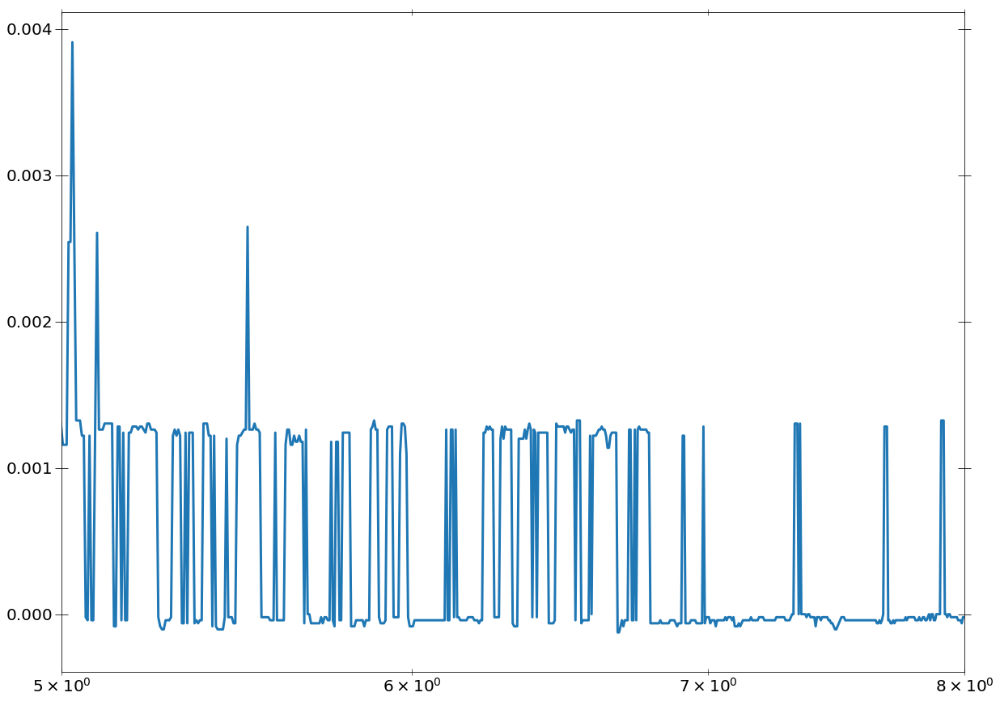

2:80: E501 line too long (130 > 79 characters)


In [62]:
plt.plot(spec_summary['ebins'][1][1][400:2000],
         median_filter(spec_summary['norm_specs'][1][1][spec_summary['spec_masks'][1][1]][interested_args_alldet[1][11]], size=5))
plt.xlim(5.0, 8.0)
plt.xscale('log')

In [67]:
spec_summary['src_nums'][0][spec_summary['spec_masks'][1][1]][interested_args_alldet[1][11]]

'200305402010002'

In [82]:
from astropy.table import Table
from astropy.table.pprint import conf
conf.max_lines = -1
conf.max_width = -1

In [83]:
Table(np.column_stack([np.array(pn_fit_stats_table_pl)[:, 0],
                       np.array(pn_fit_stats_table_pl_g2)[:, 4],
                       np.array(pn_fit_stats_table_pl)[:, 1],
                       np.array(pn_fit_stats_table_pl_g)[:, 1],
                       np.array(pn_fit_stats_table_pl_g2)[:, 1],
                       np.array(pn_model_params_table_pl_g)[:, 4],
                       np.array(pn_model_params_table_pl_g)[:, 7],
                       np.array(pn_model_params_table_pl_g2)[:, 4],
                       np.array(pn_model_params_table_pl_g2)[:, 5],
                       np.array(pn_model_params_table_pl_g2)[:, 6]]))

col0,col1,col2,col3,col4,col5,col6,col7,col8,col9
str32,str32,str32,str32,str32,str32,str32,str32,str32,str32
201113501010066,1097,888.3133866673959,881.7070650294453,881.1913228858143,6.495842098254313,5.728099295853509e-07,4.331544399555877e-07,1.9773822826801004e-07,1.5584199303060894e-07
201113501010154,1149,903.3608054015875,898.9897342154572,894.8121029186211,6.416690600469637,3.657184129034429e-07,3.5010040157522126e-07,4.580896096106657e-20,3.0838833914018393e-07
201129701010015,880,729.9447013450703,726.1680242153152,728.208293235638,6.878504435779244,2.8030459351071563e-07,6.557294646155204e-09,3.952180009005394e-08,1.84901608991034e-07
201129704010011,1194,1012.6079029890961,1002.1164436811466,1000.9736609156014,6.376259261068899,1.038662399360663e-06,7.930982457150612e-07,1.384644000570789e-07,4.940973238026691e-07
201129704010019,1215,1029.8154873905944,1025.8642811120633,1025.0969960585987,6.445404018100875,4.927351161304949e-07,3.2552759609400053e-07,1.0890863712728476e-07,3.7679459927014663e-07
201129704010027,1010,785.9195607248512,779.6130717470733,772.8673731092612,6.914603394912961,9.147377125465467e-07,7.142996249303996e-07,2.7521655807736366e-07,8.885324041183697e-07
201129707010012,682,567.787069467711,553.9318661357931,560.4612703153173,6.280521164961761,1.108564397466515e-06,6.793189563458339e-07,2.4888436958518062e-11,7.328702613575944e-08
201129707010063,2029,1603.580620175288,1603.4019947460515,1603.5633270184708,6.818844746386391,1.7222155963966992e-07,1.3274084432954834e-13,4.1359511318018613e-08,2.1443448180484209e-13
201129709010024,900,811.3262222227015,794.8089768017549,781.4206009405018,6.5481877496665355,9.642184610454263e-07,6.496074113129098e-07,6.07007290264001e-07,4.4822010250036727e-07


In [75]:
np.array(pn_fit_stats_table_pl)

array([['201113501010066', '888.3133866673959', '-8.204968056946765',
        '50.0', '1100'],
       ['201113501010154', '903.3608054015875', '-7.9889327474572935',
        '50.0', '1152'],
       ['201129701010015', '729.9447013450703', '-6.853237332107479',
        '50.0', '883'],
       ['201129704010011', '1012.6079029890961', '-4.516491937423837',
        '50.0', '1197'],
       ['201129704010019', '1029.8154873905944', '-8.696263026204749',
        '50.0', '1218'],
       ['201129704010027', '785.9195607248512', '-7.299622810407817',
        '50.0', '1013'],
       ['201129707010012', '567.787069467711', '-7.714088239148532',
        '50.0', '685'],
       ['201129707010063', '1603.580620175288', '-5.885724150152902',
        '50.0', '2032'],
       ['201129709010024', '811.3262222227015', '-6.198280503456527',
        '50.0', '903'],
       ['201129715010041', '874.5940461384438', '-8.348768445708139',
        '50.0', '1037'],
       ['201129721010070', '1368.7909668927011', '-